<a href="https://colab.research.google.com/github/barbara-pinheiro/analysis_mscdegree/blob/main/analise_potencial_geral.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Pacotes

In [1]:
!pip install scikit-posthocs
!pip install pingouin
!pip install pingouin --upgrade
!pip install pandas --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.4/204.4 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 77.1 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.3 which is incompatible.
dask-cudf-cu12 25.6.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.3 which is incompatible.
cudf-cu12 25.6.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.3 which is incompatible.


In [96]:
from sklearn.preprocessing import MinMaxScaler
import statistics
import pingouin as pg
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.formula.api as smf
from scipy.stats import rankdata
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import wilcoxon , kurtosis, friedmanchisquare
from scipy.stats import f_oneway, kruskal
import scikit_posthocs as sph
import statistics
import pingouin as pg
from statsmodels.stats.anova import AnovaRM
import itertools
from statsmodels.stats.multitest import multipletests
import pandas as pd
import numpy as np
from scipy.io import wavfile
from scipy.fft import fft
from scipy import signal
from scipy.signal import welch, stft
from scipy.signal import spectrogram
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.signal as sp
sns.set(font_scale=1.2)
from scipy.integrate import simpson
from sklearn.decomposition import PCA, FastICA
from sklearn.preprocessing import StandardScaler
from google.colab import files
from scipy import stats
from scipy.stats import shapiro, ttest_ind, bootstrap
from scipy.stats import wilcoxon , kurtosis, friedmanchisquare
from scipy.stats import f_oneway, kruskal
import scikit_posthocs as sph
from scipy.stats import friedmanchisquare
from scikit_posthocs import posthoc_nemenyi_friedman, posthoc_conover_friedman
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Lista com nome e versão dos pacotes
#!pip list


# Chamar planilha do drive - .xlsx

# PSD - 0 a 40
1- Potência total (3-40)

2- Potência teta (4-8) # NÃO USAR

3- Potência alfa (8-13)

4- Potência beta (13-30)




In [4]:
## para chamar o link da planilha PSD
file_psd_total='https://docs.google.com/spreadsheets/d/e/2PACX-1vTUOlZ6FRjHER22_Y8tnlyvHJ4bO_idgU2sdy1kfJa7vWamlqBqp3c_048iTutZGg/pub?output=xlsx'
file_psd_total=pd.read_excel(file_psd_total)


In [5]:
file_psd_total['Idade'] = pd.to_numeric(file_psd_total['Idade'], errors='coerce')
cols_to_convert = ['Frequencias','o1rep','o2rep','f3rep','f4rep','o1baseoc','o2baseoc','f3baseoc','f4baseoc','o1high','o2high','f3high','f4high', 'o1desc','o2desc','f3desc','f4desc', 'o1low','o2low','f3low','f4low', 'o1final','o2final','f3final','f4final','Idade']

for col in cols_to_convert:
    if col in file_psd_total.columns:  ## verifica se as colunas da lista acima estão no arquivo
        # Apply replace on the str representation of each value before converting to float
        file_psd_total[col] = file_psd_total[col].apply(lambda x: float(str(x).replace(',', '.')))


file_psd_total_espec = file_psd_total[cols_to_convert]
file_psd_total

,Participante,Idade,Sexo,Frequencias,o1rep,o2rep,f3rep,f4rep,o1baseoc,o2baseoc,...,f3desc,f4desc,o1low,o2low,f3low,f4low,o1final,o2final,f3final,f4final
0,PT_01,23.0,Masculino,0.000000,8.439817,9.823108,27.637065,22.445783,3.848716,9.397661,...,23.982824,10.286504,5.842065,11.642882,45.407441,18.371661,3.007480,3.953634,28.689248,10.416277
1,PT_02,24.0,Masculino,0.000000,3.111763,2.332067,11.713894,14.334468,3.804741,4.269245,...,8.581122,9.299386,5.544946,10.343276,8.969584,12.166990,3.722369,2.613514,20.459947,19.134699
2,PT_03,21.0,Feminino,0.000000,17.369180,14.868858,63.608259,54.010844,3.681751,2.890286,...,20.117785,34.727789,5.718209,2.578847,8.176365,5.651962,2.614184,1.847997,9.600510,11.351939
3,PT_04,49.0,Feminino,0.000000,12.574833,6.587291,89.888371,147.025070,6.026976,4.792698,...,42.019439,55.738892,6.048372,7.688601,13.273835,38.257495,9.704666,9.860592,57.344819,93.200600
4,PT_05,19.0,Masculino,0.000000,3.421405,3.395575,9.521537,10.925173,2.929699,2.435465,...,3.703478,4.723132,4.733408,1.584685,4.795005,3.504395,4.022666,3.572199,11.604083,10.496883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4013,PT_46,21.0,Feminino,39.550781,3.595000,0.900389,10.558080,8.383654,3.016844,0.914851,...,9.148776,9.626398,3.656019,0.881327,9.617370,9.888715,1.883390,0.759984,8.061195,6.645633
4014,PT_47,20.0,Masculino,39.550781,2.880611,0.975749,0.125779,7.157485,2.195609,0.999725,...,6.152613,7.910192,2.690963,0.703273,0.571927,7.515477,1.885399,0.708767,4.451678,6.254397
4015,PT_48,22.0,Masculino,39.550781,3.689921,0.962431,10.553512,11.940146,4.115293,1.044852,...,10.165494,11.013610,3.582814,1.784222,9.177598,9.840121,4.165123,1.244299,10.862326,11.597569
4016,PT_49,20.0,Feminino,39.550781,2.555849,1.050532,13.580941,9.138551,2.189454,0.748350,...,15.762673,7.887198,2.119006,0.688969,14.369769,8.938012,2.651713,0.620678,12.844458,8.202840


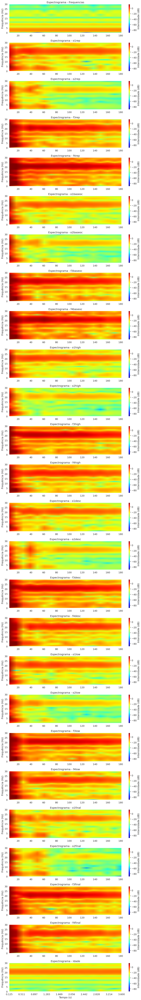

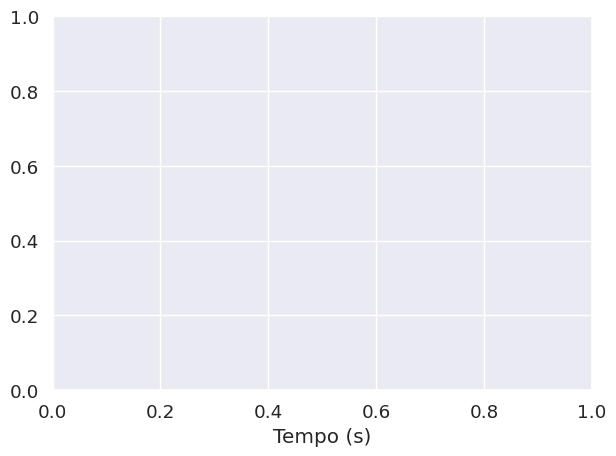

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram

# Supondo que tp_eeg_filt é seu DataFrame com várias colunas de EEG
fs = 1024  # Frequência de amostragem
nfft = 1024  # Tamanho da FFT

colunas_interesse = [col for col in file_psd_total_espec.columns if file_psd_total_espec[col].dtype != object]

# Criar figura com subplots
fig, axes = plt.subplots(len(colunas_interesse), 1, figsize=(12, 3*len(colunas_interesse)))

# Verificar se temos apenas um eixo (caso de uma única coluna)
if len(colunas_interesse) == 1:
    axes = [axes]

for ax, coluna in zip(axes, colunas_interesse):
    # Calcular espectrograma para a coluna atual
    f_spec, t_spec, Sxx_spec = spectrogram(file_psd_total_espec[coluna], fs=fs, nfft=nfft)
    t_spec = t_spec * (180 / 3.6)

    # Plotar espectrograma
    mesh = ax.pcolormesh(t_spec, f_spec, 10*np.log10(Sxx_spec), cmap='jet', shading='gouraud', vmin=-90, vmax=15)
    ax.set_ylabel('Frequência (Hz)')
    ax.set_title(f'Espectrograma - {coluna}')
    ax.set_ylim(0, 30)

    # Adicionar a barra de cores aqui, dentro do loop
    fig.colorbar(mesh, ax=ax, label='Intensidade (dB)')

# Configurar os ticks do eixo x (tempo) - fora do loop, apenas para o último plot
num_ticks = 10
new_xticks = np.linspace(t_spec.min(), t_spec.max(), num=num_ticks)
new_xticklabels = np.linspace(0.125, 3.6, num=num_ticks)
axes[-1].set_xticks(new_xticks) # Aplicar ticks apenas ao último eixo
axes[-1].set_xticklabels([f'{label:.3f}' for label in new_xticklabels])
axes[-1].set_xlabel('Tempo (s)')


plt.xlabel('Tempo (s)')
plt.tight_layout()
plt.show()
plt.xlabel('Tempo (s)')
plt.tight_layout()
#plt.savefig('espectrograma_eeg_total.png', dpi=300)
plt.show()
#files.download('espectrograma_eeg_total.png')


# Remoção de outlier da planilha de potência

In [7]:
tp_eeg_bruto = file_psd_total[343:4018] # Filtrar entre 3Hz a 40Hz
tp_eeg_bruto = tp_eeg_bruto.reset_index(drop=True)


In [8]:
eeg_clean = tp_eeg_bruto.copy()

In [9]:
valores_tirar = ['PT_08','PT_09', 'PT_13','PT_28', 'PT_36','PT_39','PT_47','PT_42'] # Participantes com dados eletrofisiológicos ruins devem ser removidos
eeg_clean_drop = eeg_clean[~eeg_clean['Participante'].isin(valores_tirar)]


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'Idade'),
  Text(1, 0, 'Frequencias'),
  Text(2, 0, 'o1rep'),
  Text(3, 0, 'o2rep'),
  Text(4, 0, 'f3rep'),
  Text(5, 0, 'f4rep'),
  Text(6, 0, 'o1baseoc'),
  Text(7, 0, 'o2baseoc'),
  Text(8, 0, 'f3baseoc'),
  Text(9, 0, 'f4baseoc'),
  Text(10, 0, 'o1high'),
  Text(11, 0, 'o2high'),
  Text(12, 0, 'f3high'),
  Text(13, 0, 'f4high'),
  Text(14, 0, 'o1desc'),
  Text(15, 0, 'o2desc'),
  Text(16, 0, 'f3desc'),
  Text(17, 0, 'f4desc'),
  Text(18, 0, 'o1low'),
  Text(19, 0, 'o2low'),
  Text(20, 0, 'f3low'),
  Text(21, 0, 'f4low'),
  Text(22, 0, 'o1final'),
  Text(23, 0, 'o2final'),
  Text(24, 0, 'f3final'),
  Text(25, 0, 'f4final')])

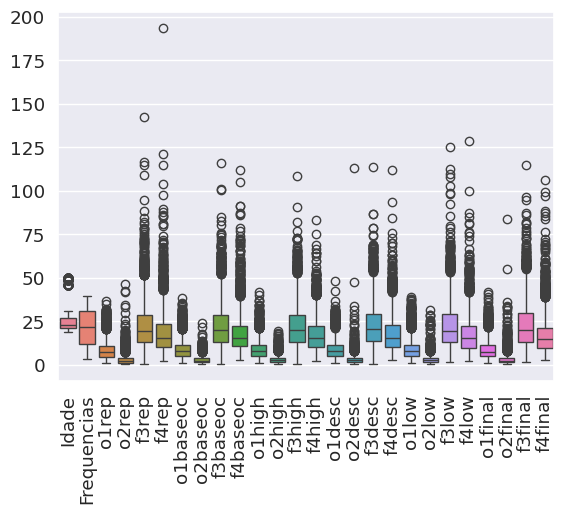

In [10]:
## A partir daqui a remoção dos dados ocorreu de maneira visual, removendo sempre o maior valor de cada coluna (canal/condição)
indices_to_remove_1st = set()
for column in eeg_clean_drop.select_dtypes(include=np.number).columns:  # Iterate through numeric columns only
    max_index = eeg_clean_drop[column].idxmax()
    indices_to_remove_1st.add(max_index)

eeg_cleaned = eeg_clean_drop.drop(index=indices_to_remove_1st)
eeg_cleaned = eeg_cleaned.reset_index(drop=True)
sns.boxplot(eeg_cleaned)
plt.xticks(rotation=90)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'Idade'),
  Text(1, 0, 'Frequencias'),
  Text(2, 0, 'o1rep'),
  Text(3, 0, 'o2rep'),
  Text(4, 0, 'f3rep'),
  Text(5, 0, 'f4rep'),
  Text(6, 0, 'o1baseoc'),
  Text(7, 0, 'o2baseoc'),
  Text(8, 0, 'f3baseoc'),
  Text(9, 0, 'f4baseoc'),
  Text(10, 0, 'o1high'),
  Text(11, 0, 'o2high'),
  Text(12, 0, 'f3high'),
  Text(13, 0, 'f4high'),
  Text(14, 0, 'o1desc'),
  Text(15, 0, 'o2desc'),
  Text(16, 0, 'f3desc'),
  Text(17, 0, 'f4desc'),
  Text(18, 0, 'o1low'),
  Text(19, 0, 'o2low'),
  Text(20, 0, 'f3low'),
  Text(21, 0, 'f4low'),
  Text(22, 0, 'o1final'),
  Text(23, 0, 'o2final'),
  Text(24, 0, 'f3final'),
  Text(25, 0, 'f4final')])

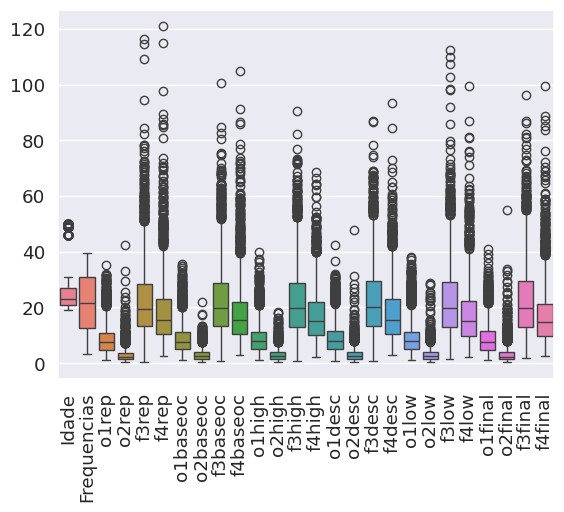

In [11]:
indices_to_remove_2nd = set()  # Use a set to store unique indices
for column in eeg_cleaned.select_dtypes(include=np.number).columns:  # Iterate through numeric columns only
    max_index = eeg_cleaned[column].idxmax()
    indices_to_remove_2nd.add(max_index)

# 2. Remove rows based on the collected indices
eeg_cleaned_1 = eeg_cleaned.drop(index=indices_to_remove_2nd)
eeg_cleaned_1 = eeg_cleaned_1.reset_index(drop=True)
sns.boxplot(eeg_cleaned_1)
plt.xticks(rotation=90)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'Idade'),
  Text(1, 0, 'Frequencias'),
  Text(2, 0, 'o1rep'),
  Text(3, 0, 'o2rep'),
  Text(4, 0, 'f3rep'),
  Text(5, 0, 'f4rep'),
  Text(6, 0, 'o1baseoc'),
  Text(7, 0, 'o2baseoc'),
  Text(8, 0, 'f3baseoc'),
  Text(9, 0, 'f4baseoc'),
  Text(10, 0, 'o1high'),
  Text(11, 0, 'o2high'),
  Text(12, 0, 'f3high'),
  Text(13, 0, 'f4high'),
  Text(14, 0, 'o1desc'),
  Text(15, 0, 'o2desc'),
  Text(16, 0, 'f3desc'),
  Text(17, 0, 'f4desc'),
  Text(18, 0, 'o1low'),
  Text(19, 0, 'o2low'),
  Text(20, 0, 'f3low'),
  Text(21, 0, 'f4low'),
  Text(22, 0, 'o1final'),
  Text(23, 0, 'o2final'),
  Text(24, 0, 'f3final'),
  Text(25, 0, 'f4final')])

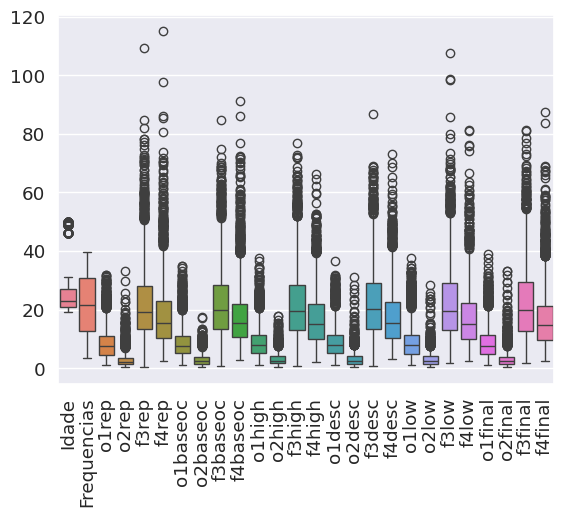

In [12]:
indices_to_remove_3rd = set()  # Use a set to store unique indices
for column in eeg_cleaned_1.select_dtypes(include=np.number).columns:  # Iterate through numeric columns only
    max_index = eeg_cleaned_1[column].idxmax()
    indices_to_remove_3rd.add(max_index)

# 2. Remove rows based on the collected indices
eeg_cleaned_2= eeg_cleaned_1.drop(index=indices_to_remove_3rd)
eeg_cleaned_2= eeg_cleaned_2.reset_index(drop=True)
sns.boxplot(eeg_cleaned_2)
plt.xticks(rotation=90)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'Idade'),
  Text(1, 0, 'Frequencias'),
  Text(2, 0, 'o1rep'),
  Text(3, 0, 'o2rep'),
  Text(4, 0, 'f3rep'),
  Text(5, 0, 'f4rep'),
  Text(6, 0, 'o1baseoc'),
  Text(7, 0, 'o2baseoc'),
  Text(8, 0, 'f3baseoc'),
  Text(9, 0, 'f4baseoc'),
  Text(10, 0, 'o1high'),
  Text(11, 0, 'o2high'),
  Text(12, 0, 'f3high'),
  Text(13, 0, 'f4high'),
  Text(14, 0, 'o1desc'),
  Text(15, 0, 'o2desc'),
  Text(16, 0, 'f3desc'),
  Text(17, 0, 'f4desc'),
  Text(18, 0, 'o1low'),
  Text(19, 0, 'o2low'),
  Text(20, 0, 'f3low'),
  Text(21, 0, 'f4low'),
  Text(22, 0, 'o1final'),
  Text(23, 0, 'o2final'),
  Text(24, 0, 'f3final'),
  Text(25, 0, 'f4final')])

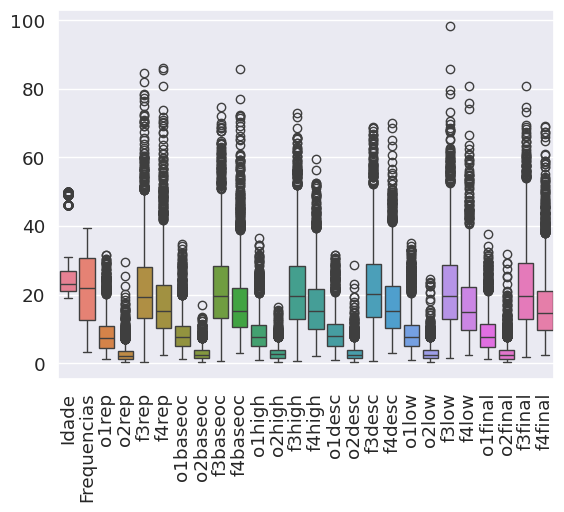

In [13]:
indices_to_remove_4th = set()  # Use a set to store unique indices
for column in eeg_cleaned_2.select_dtypes(include=np.number).columns:  # Iterate through numeric columns only
    max_index = eeg_cleaned_2[column].idxmax()
    indices_to_remove_4th.add(max_index)

# 2. Remove rows based on the collected indices
eeg_cleaned_3 = eeg_cleaned_2.drop(index=indices_to_remove_4th)
eeg_cleaned_3 = eeg_cleaned_3.reset_index(drop=True)
sns.boxplot(eeg_cleaned_3)
plt.xticks(rotation=90)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'Idade'),
  Text(1, 0, 'Frequencias'),
  Text(2, 0, 'o1rep'),
  Text(3, 0, 'o2rep'),
  Text(4, 0, 'f3rep'),
  Text(5, 0, 'f4rep'),
  Text(6, 0, 'o1baseoc'),
  Text(7, 0, 'o2baseoc'),
  Text(8, 0, 'f3baseoc'),
  Text(9, 0, 'f4baseoc'),
  Text(10, 0, 'o1high'),
  Text(11, 0, 'o2high'),
  Text(12, 0, 'f3high'),
  Text(13, 0, 'f4high'),
  Text(14, 0, 'o1desc'),
  Text(15, 0, 'o2desc'),
  Text(16, 0, 'f3desc'),
  Text(17, 0, 'f4desc'),
  Text(18, 0, 'o1low'),
  Text(19, 0, 'o2low'),
  Text(20, 0, 'f3low'),
  Text(21, 0, 'f4low'),
  Text(22, 0, 'o1final'),
  Text(23, 0, 'o2final'),
  Text(24, 0, 'f3final'),
  Text(25, 0, 'f4final')])

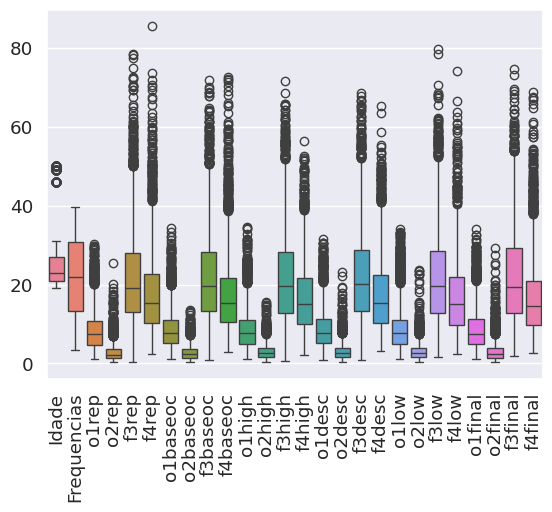

In [14]:
indices_to_remove_5th = set()  # Use a set to store unique indices
for column in eeg_cleaned_3.select_dtypes(include=np.number).columns:  # Iterate through numeric columns only
    max_index = eeg_cleaned_3[column].idxmax()
    indices_to_remove_5th.add(max_index)

# 2. Remove rows based on the collected indices
eeg_cleaned_4 = eeg_cleaned_3.drop(index=indices_to_remove_5th)
eeg_cleaned_4 = eeg_cleaned_4.reset_index(drop=True)
sns.boxplot(eeg_cleaned_4)
plt.xticks(rotation=90)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'Idade'),
  Text(1, 0, 'Frequencias'),
  Text(2, 0, 'o1rep'),
  Text(3, 0, 'o2rep'),
  Text(4, 0, 'f3rep'),
  Text(5, 0, 'f4rep'),
  Text(6, 0, 'o1baseoc'),
  Text(7, 0, 'o2baseoc'),
  Text(8, 0, 'f3baseoc'),
  Text(9, 0, 'f4baseoc'),
  Text(10, 0, 'o1high'),
  Text(11, 0, 'o2high'),
  Text(12, 0, 'f3high'),
  Text(13, 0, 'f4high'),
  Text(14, 0, 'o1desc'),
  Text(15, 0, 'o2desc'),
  Text(16, 0, 'f3desc'),
  Text(17, 0, 'f4desc'),
  Text(18, 0, 'o1low'),
  Text(19, 0, 'o2low'),
  Text(20, 0, 'f3low'),
  Text(21, 0, 'f4low'),
  Text(22, 0, 'o1final'),
  Text(23, 0, 'o2final'),
  Text(24, 0, 'f3final'),
  Text(25, 0, 'f4final')])

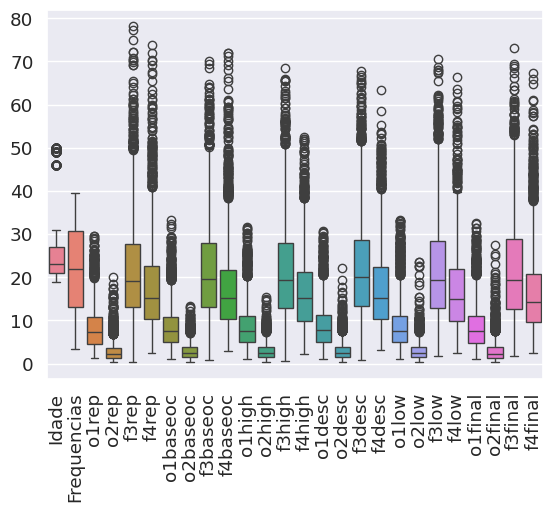

In [15]:
indices_to_remove_6th = set()  # Use a set to store unique indices
for column in eeg_cleaned_4.select_dtypes(include=np.number).columns:  # Iterate through numeric columns only
    max_index = eeg_cleaned_4[column].idxmax()
    indices_to_remove_6th.add(max_index)

# 2. Remove rows based on the collected indices
eeg_cleaned_5 = eeg_cleaned_4.drop(index=indices_to_remove_6th)
eeg_cleaned_5 = eeg_cleaned_5.reset_index(drop=True)
sns.boxplot(eeg_cleaned_5)
plt.xticks(rotation=90)

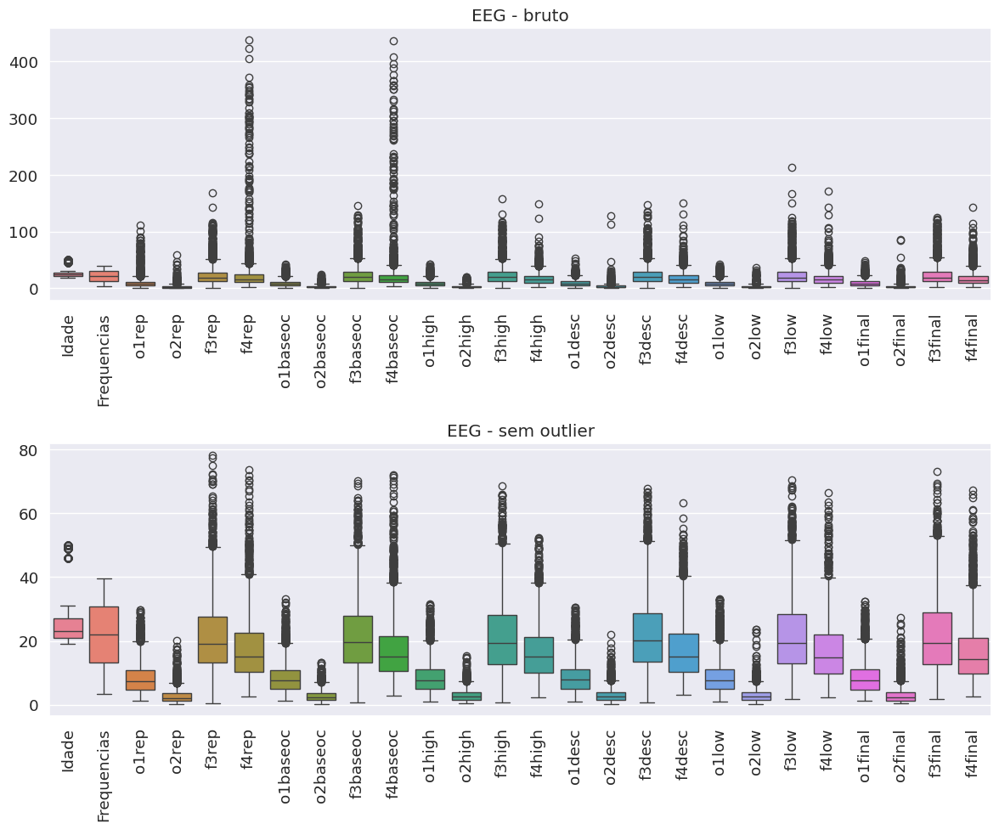

In [16]:
plt.figure(figsize = ((12, 10)))
plt.subplot(2,1,1)
plt.title('EEG - bruto')
sns.boxplot(tp_eeg_bruto)
plt.xticks(rotation=90)
plt.subplot(2,1,2)
plt.title('EEG - sem outlier')
sns.boxplot(eeg_cleaned_5)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [17]:
tp_eeg_psd = eeg_cleaned_5.sort_values(by=['Frequencias','Participante'],ascending=[True,True])


In [18]:
tp_eeg_psd

,Participante,Idade,Sexo,Frequencias,o1rep,o2rep,f3rep,f4rep,o1baseoc,o2baseoc,...,f3desc,f4desc,o1low,o2low,f3low,f4low,o1final,o2final,f3final,f4final
0,PT_02,24.0,Masculino,3.417969,13.727723,9.276591,48.055252,30.878352,16.549357,8.495403,...,35.760336,29.266869,19.262275,12.694673,35.886549,29.500463,18.247207,8.645837,44.648469,40.112246
1,PT_03,21.0,Feminino,3.417969,13.847483,5.260331,42.451449,30.146888,16.372179,6.411300,...,34.266503,29.137129,15.736806,7.417936,35.735262,26.045909,13.417000,4.572756,44.173443,27.818975
2,PT_05,19.0,Masculino,3.417969,18.250339,5.299765,27.132420,14.917096,20.151267,7.115403,...,36.923766,20.002892,25.955043,6.106398,29.786493,17.658499,27.340701,5.891032,33.939514,19.053910
3,PT_06,31.0,Feminino,3.417969,13.094868,7.889960,59.942049,57.044615,13.257761,10.740654,...,64.005657,48.561578,18.501837,10.644245,56.257136,35.974045,16.683062,12.389337,67.350748,67.274841
4,PT_17,23.0,Masculino,3.417969,11.933802,10.983023,51.318316,49.943640,11.083907,7.710550,...,46.036810,42.332875,11.514510,8.680875,41.656810,35.458751,13.356034,10.042637,53.668880,43.824389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2962,PT_45,28.0,Feminino,39.550781,1.766453,0.481450,7.512705,6.613937,2.567249,0.707779,...,8.039159,6.577346,2.184863,0.635445,6.835517,6.167409,2.065098,0.454507,6.484390,5.649088
2963,PT_46,21.0,Feminino,39.550781,3.595000,0.900389,10.558080,8.383654,3.016844,0.914851,...,9.148776,9.626398,3.656019,0.881327,9.617370,9.888715,1.883390,0.759984,8.061195,6.645633
2964,PT_48,22.0,Masculino,39.550781,3.689921,0.962431,10.553512,11.940146,4.115293,1.044852,...,10.165494,11.013610,3.582814,1.784222,9.177598,9.840121,4.165123,1.244299,10.862326,11.597569
2965,PT_49,20.0,Feminino,39.550781,2.555849,1.050532,13.580941,9.138551,2.189454,0.748350,...,15.762673,7.887198,2.119006,0.688969,14.369769,8.938012,2.651713,0.620678,12.844458,8.202840


In [19]:
tp_eeg_filt_for_ajust = tp_eeg_psd.drop(columns=['Participante','Idade','Sexo','Frequencias'])
tp_eeg_filt_ajust = tp_eeg_filt_for_ajust * 0.5  ##Multiplica pela resolução de freq
tp_eeg_filt_potabs = pd.concat([tp_eeg_psd[['Participante','Idade','Sexo','Frequencias']], tp_eeg_filt_ajust], axis=1)
tp_eeg_filt_potabs

,Participante,Idade,Sexo,Frequencias,o1rep,o2rep,f3rep,f4rep,o1baseoc,o2baseoc,...,f3desc,f4desc,o1low,o2low,f3low,f4low,o1final,o2final,f3final,f4final
0,PT_02,24.0,Masculino,3.417969,6.863861,4.638296,24.027626,15.439176,8.274679,4.247701,...,17.880168,14.633435,9.631138,6.347336,17.943275,14.750232,9.123604,4.322919,22.324234,20.056123
1,PT_03,21.0,Feminino,3.417969,6.923741,2.630165,21.225724,15.073444,8.186090,3.205650,...,17.133251,14.568565,7.868403,3.708968,17.867631,13.022954,6.708500,2.286378,22.086721,13.909488
2,PT_05,19.0,Masculino,3.417969,9.125169,2.649882,13.566210,7.458548,10.075634,3.557701,...,18.461883,10.001446,12.977522,3.053199,14.893247,8.829249,13.670351,2.945516,16.969757,9.526955
3,PT_06,31.0,Feminino,3.417969,6.547434,3.944980,29.971025,28.522307,6.628881,5.370327,...,32.002828,24.280789,9.250919,5.322123,28.128568,17.987022,8.341531,6.194669,33.675374,33.637420
4,PT_17,23.0,Masculino,3.417969,5.966901,5.491512,25.659158,24.971820,5.541954,3.855275,...,23.018405,21.166438,5.757255,4.340438,20.828405,17.729375,6.678017,5.021318,26.834440,21.912195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2962,PT_45,28.0,Feminino,39.550781,0.883227,0.240725,3.756352,3.306969,1.283625,0.353889,...,4.019579,3.288673,1.092432,0.317722,3.417758,3.083704,1.032549,0.227254,3.242195,2.824544
2963,PT_46,21.0,Feminino,39.550781,1.797500,0.450195,5.279040,4.191827,1.508422,0.457425,...,4.574388,4.813199,1.828010,0.440663,4.808685,4.944358,0.941695,0.379992,4.030598,3.322816
2964,PT_48,22.0,Masculino,39.550781,1.844961,0.481215,5.276756,5.970073,2.057646,0.522426,...,5.082747,5.506805,1.791407,0.892111,4.588799,4.920061,2.082562,0.622150,5.431163,5.798784
2965,PT_49,20.0,Feminino,39.550781,1.277925,0.525266,6.790471,4.569276,1.094727,0.374175,...,7.881336,3.943599,1.059503,0.344485,7.184885,4.469006,1.325856,0.310339,6.422229,4.101420


# **Cálculo por frequência**
- Potência absoluta
- Potência relativa
- Frequência dominante
- AFA

# Frequência total

## Potência total

In [20]:
## Para calcular poder total
# Definir as colunas de interesse
colunas_total = tp_eeg_filt_potabs.columns  # Todas as colunas
canal_cond = colunas_total[4:]

poder_total = []

for grupo, dados in tp_eeg_filt_potabs.groupby('Participante'):
    grupo_resultados_tp = {'Grupo': grupo}  # Dicionário para armazenar os resultados do grupo

    for coluna in canal_cond:  # Itera sobre cada coluna
        somas_tp = dados[coluna].sum()

        # Armazenar os resultados
        grupo_resultados_tp[f'{coluna}'] = somas_tp

    # Adicionar ao resultado final
    poder_total.append(grupo_resultados_tp)

# Criar um DataFrame com os resultados
poder_total_df = pd.DataFrame(poder_total)
poder_total_df = poder_total_df.rename(columns={'Grupo': 'Participante'})
poder_total_df

,Participante,o1rep,o2rep,f3rep,f4rep,o1baseoc,o2baseoc,f3baseoc,f4baseoc,o1high,...,f3desc,f4desc,o1low,o2low,f3low,f4low,o1final,o2final,f3final,f4final
0,PT_01,236.280916,91.655532,603.814379,365.589767,219.147098,65.435121,607.931029,375.393887,221.964472,...,650.832962,482.713218,214.761007,66.044648,613.520711,352.442016,214.057160,65.278305,632.035735,359.007566
1,PT_02,276.699435,138.761373,737.784055,453.510505,350.944399,138.650055,828.509861,435.809276,324.540148,...,848.082998,461.003540,343.700404,136.660310,807.605501,442.323822,377.036393,158.732864,919.789499,538.999286
2,PT_03,349.232576,88.699715,883.770366,446.705339,319.336258,79.103918,725.834493,463.296036,322.883509,...,912.349262,499.704205,340.071909,80.178048,947.408987,494.013279,407.319033,109.915895,1198.250848,500.848345
3,PT_04,346.764325,63.329037,914.929167,697.752189,356.860343,62.688006,981.991438,646.503610,374.089125,...,1002.121882,632.291078,334.594929,57.575825,871.755063,628.962415,368.180245,60.987891,1014.312666,631.412800
4,PT_05,392.663554,93.684803,638.574981,396.578344,478.187102,93.270439,819.792924,462.543159,479.676629,...,810.573001,470.497980,501.639169,88.862443,818.458230,438.605058,627.374119,103.891026,889.433460,420.131131
5,PT_06,338.342729,146.063123,846.423843,558.166339,339.420313,119.314857,958.066247,522.949795,373.710094,...,954.370467,519.865060,356.390042,126.273845,959.262110,498.095449,377.383098,182.033502,863.911051,509.605958
6,PT_07,219.907781,63.704195,535.508090,516.845349,226.963135,77.036255,538.292008,504.150920,344.017050,...,524.401882,476.468951,241.749930,95.616047,513.315547,443.338148,205.702396,79.463645,456.501231,428.528984
7,PT_10,358.135609,88.684059,569.949084,635.418200,270.055602,95.056317,608.907788,495.097611,210.156499,...,421.503186,335.425575,228.713205,159.059800,545.590789,355.785194,186.858866,67.542223,412.868108,299.150308
8,PT_11,651.720695,124.533623,1088.933438,668.828813,442.694684,102.279286,825.666465,550.513537,352.355205,...,687.066005,487.230884,399.463700,104.467836,718.308115,520.162543,358.931099,85.853480,714.842829,509.434779
9,PT_12,214.932025,89.995503,700.884492,509.497804,194.635646,85.061643,636.907062,520.050165,199.548016,...,600.184709,480.406603,196.157311,76.991773,576.732705,468.478495,219.556074,93.688399,621.681928,498.322426


(0.0, 200.0)

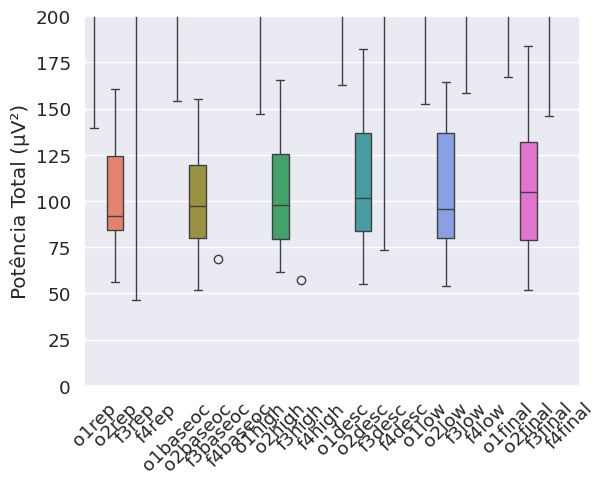

In [21]:
sns.boxplot(poder_total_df)
plt.ylabel('Potência Total (µV²)')
plt.xticks(rotation=45)
plt.ylim(0,200)

## Frequência Dominante

In [ ]:
## Para calcular frequência dominante dentro do poder total
freq_dom_tp = []

for grupo, dados in tp_eeg_psd.groupby('Participante'):
    grupo_resultados_freqdom = {'Grupo': grupo}  # Dicionário para armazenar os resultados do grupo

    for coluna in canal_cond:  # Itera sobre cada coluna
        # Encontrar o maior valor na coluna atual
        maior_potencia = dados[coluna].max()

        # Encontrar o valor correspondente na coluna de frequencias
        idx_maior_valor = dados[coluna].idxmax()  # Índice da linha com o maior valor
        valor_freq_dom = dados.loc[idx_maior_valor, 'Frequencias']

        # Armazenar os resultados
        grupo_resultados_freqdom[f'Maior {coluna}'] = maior_potencia
        grupo_resultados_freqdom[f'Frequencias para {coluna}'] = valor_freq_dom

    # Adicionar ao resultado final
    freq_dom_tp.append(grupo_resultados_freqdom)

# Criar um DataFrame com os resultados
freq_dom_total_tp_df = pd.DataFrame(freq_dom_tp)
freq_dom_tp_df = freq_dom_total_tp_df.drop(columns=[col for col in freq_dom_total_tp_df if col.startswith('Maior')])
freq_dom_tp_df = freq_dom_tp_df.rename(columns={'Participante':'Participante','Frequencias para o1rep':'o1rep', 'Frequencias para o1baseoc':'o1baseoc', 'Frequencias para o1high':'o1high', 'Frequencias para o1desc':'o1desc', 'Frequencias para o1low':'o1low', 'Frequencias para o1final':'o1final', 'Frequencias para o2rep':'o2rep', 'Frequencias para o2baseoc':'o2baseoc',
                                                    'Frequencias para o2high':'o2high', 'Frequencias para o2desc':'o2desc', 'Frequencias para o2low':'o2low', 'Frequencias para o2final':'o2final', 'Frequencias para f3rep':'f3rep', 'Frequencias para f3baseoc':'f3baseoc', 'Frequencias para f3high':'f3high',
                                                    'Frequencias para f3desc':'f3desc', 'Frequencias para f3low':'f3low', 'Frequencias para f3final':'f3final', 'Frequencias para f4rep':'f4rep', 'Frequencias para f4baseoc':'f4baseoc', 'Frequencias para f4high':'f4high',
                                                    'Frequencias para f4desc':'f4desc', 'Frequencias para f4low':'f4low', 'Frequencias para f4final':'f4final'})


In [ ]:
cols_to_process = freq_dom_tp_df.columns[1:]
freq_dom_for_corr = freq_dom_tp_df.melt(
    id_vars=['Grupo'],
    value_vars=cols_to_process,
    var_name='Can_cond',
    value_name='Valor'  # Nome da coluna com os valores numéricos
)
freq_dom_for_corr['Canal'] = freq_dom_for_corr['Can_cond'].str[:2]
freq_dom_for_corr['Condição'] = freq_dom_for_corr['Can_cond'].str[2:]


In [ ]:
def band_names(value):
  if 3.9 < value < 8.0:
    return 'teta'
  elif 8.0 < value < 13.0:
    return 'alfa'
  elif 13.0 < value < 32.0:
    return 'beta'
  else:
    return 'outro'

freq_dom_band_tp = pd.DataFrame()

for column in freq_dom_tp_df.columns[1:]:
  freq_dom_band_tp[column] =freq_dom_tp_df[column].apply(band_names)



In [ ]:
freq_dom_band_tp = pd.concat([freq_dom_tp_df['Grupo'],freq_dom_band_tp],axis=1)
freq_dom_band_tp

,Grupo,o1rep,o2rep,f3rep,f4rep,o1baseoc,o2baseoc,f3baseoc,f4baseoc,o1high,...,f3desc,f4desc,o1low,o2low,f3low,f4low,o1final,o2final,f3final,f4final
0,PT_01,alfa,alfa,teta,teta,teta,teta,teta,teta,beta,...,teta,teta,alfa,teta,teta,teta,alfa,teta,teta,teta
1,PT_02,alfa,teta,outro,teta,teta,alfa,outro,outro,teta,...,teta,outro,teta,outro,teta,outro,alfa,alfa,outro,outro
2,PT_03,alfa,alfa,outro,outro,outro,outro,outro,outro,outro,...,beta,outro,outro,outro,beta,outro,alfa,alfa,beta,outro
3,PT_04,teta,teta,teta,teta,alfa,teta,teta,teta,alfa,...,teta,teta,alfa,teta,teta,teta,alfa,teta,teta,teta
4,PT_05,outro,alfa,teta,teta,teta,outro,teta,teta,teta,...,outro,outro,teta,outro,teta,alfa,alfa,alfa,teta,teta
5,PT_06,alfa,alfa,outro,outro,alfa,outro,outro,outro,outro,...,outro,outro,outro,outro,outro,teta,alfa,alfa,outro,outro
6,PT_07,alfa,alfa,teta,teta,alfa,alfa,teta,teta,beta,...,teta,teta,teta,alfa,teta,teta,alfa,alfa,teta,teta
7,PT_10,alfa,alfa,teta,teta,alfa,teta,teta,teta,teta,...,teta,teta,teta,teta,teta,teta,alfa,teta,teta,teta
8,PT_11,teta,teta,teta,teta,teta,teta,teta,teta,teta,...,teta,teta,teta,teta,teta,teta,teta,teta,teta,teta
9,PT_12,alfa,alfa,teta,teta,teta,teta,teta,teta,teta,...,teta,teta,teta,teta,teta,teta,alfa,alfa,teta,teta


In [ ]:
freq_dom_tp_long = freq_dom_band_tp.melt(id_vars=['Grupo'], var_name='Coluna', value_name='Banda')
freq_dom_tp_long['Canal'] = freq_dom_tp_long['Coluna'].str[:2]
freq_dom_tp_long['Condição'] = freq_dom_tp_long['Coluna'].str[2:]
freq_dom_tp = freq_dom_tp_long[['Grupo','Canal','Condição','Banda']].dropna()
freq_dom_tp = freq_dom_tp.reset_index(drop=True)
freq_dom_tp

,Grupo,Canal,Condição,Banda
0,PT_01,o1,rep,alfa
1,PT_02,o1,rep,alfa
2,PT_03,o1,rep,alfa
3,PT_04,o1,rep,teta
4,PT_05,o1,rep,outro
...,...,...,...,...
979,PT_45,f4,final,outro
980,PT_46,f4,final,teta
981,PT_48,f4,final,teta
982,PT_49,f4,final,teta


In [ ]:
ordem_canal = ['o1', 'o2', 'f3', 'f4']
ordem_condicao = ['rep', 'baseoc', 'high', 'desc', 'low', 'final']
# 3. Agrupar e contar
cont_freq_dom = freq_dom_tp.groupby(['Condição', 'Canal', 'Banda']).size().reset_index(name='Contagem')

# 4. Pivotar e calcular porcentagens
pivot_df = cont_freq_dom.pivot_table(
    index=['Condição', 'Canal'],
    columns='Banda',
    values='Contagem',
    fill_value=0
)

# Calcular porcentagens por linha (por combinação Condição+Canal)
pivot_percent = pivot_df.apply(lambda x: (x / x.sum()) * 100, axis=1)

# Remover coluna 'outro' se existir
pivot_percent = pivot_percent.drop(columns=['outro'], errors='ignore')

# 5. Criar todas as combinações possíveis (para manter a ordem correta)
full_index = pd.MultiIndex.from_product([ordem_condicao, ordem_canal], names=['Condição', 'Canal'])

# 6. Reindexar e preencher combinações inexistentes com 0
pivot_percent = pivot_percent.reindex(full_index, fill_value=0)

# 7. Resetar o índice para plotagem
pivot_percent_final = pivot_percent.reset_index()
# Definir ordens desejadas
ordem_canal = ['o1', 'o2', 'f3', 'f4']
ordem_condicao = ['rep', 'baseoc', 'high', 'desc', 'low', 'final']

# Converter para categorias ordenadas
pivot_percent_final['Canal'] = pd.Categorical(pivot_percent_final['Canal'], categories=ordem_canal, ordered=True)
pivot_percent_final['Condição'] = pd.Categorical(pivot_percent_final['Condição'], categories=ordem_condicao, ordered=True)

# Ordenar os dados
pivot_percent_final = pivot_percent_final.sort_values(['Condição', 'Canal'])

# Preparar dados para plotagem
pivot_pivot_percent_final = pivot_percent_final.set_index(['Condição', 'Canal'])
pivot_pivot_percent_final = pivot_pivot_percent_final.stack().reset_index()
pivot_pivot_percent_final.columns = ['Condição', 'Canal', 'Banda', 'Porcentagem']
pivot_pivot_percent_final

,Condição,Canal,Banda,Porcentagem
0,rep,o1,alfa,51.219512
1,rep,o1,beta,4.878049
2,rep,o1,teta,34.146341
3,rep,o2,alfa,58.536585
4,rep,o2,beta,2.439024
...,...,...,...,...
67,final,f3,beta,2.439024
68,final,f3,teta,53.658537
69,final,f4,alfa,2.439024
70,final,f4,beta,0.000000


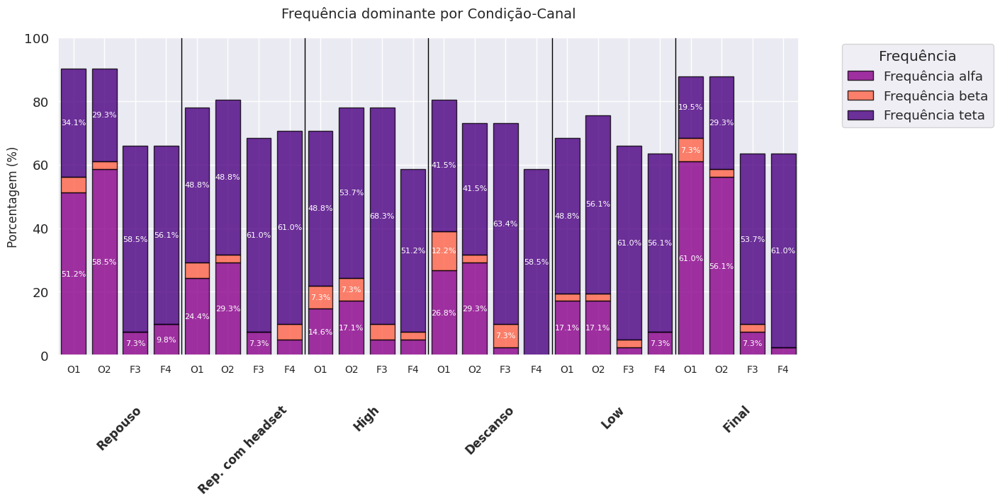

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Configurações de estilo
cores = {
    'alfa': 'darkmagenta',
    'beta': 'tomato',
    'teta': 'indigo'
}

nomes_condicao = {
    'rep': 'Repouso',
    'baseoc': 'Rep. com headset',
    'high': 'High',
    'desc': 'Descanso',
    'low': 'Low',
    'final': 'Final'
}

nomes_canal = {
    'o1': 'O1',
    'o2': 'O2',
    'f3': 'F3',
    'f4': 'F4'
}

# 2. Preparação dos dados para plotagem
# Ordenar os dados conforme as categorias definidas
pivot_percent_final = pivot_percent_final.sort_values(['Condição', 'Canal'])

# 3. Configuração do gráfico
fig, ax = plt.subplots(figsize=(14, 7), layout='constrained')

# Definir posições das barras
n_barras = len(pivot_percent_final)
posicoes = np.arange(n_barras)
largura_barra = 0.8

# 4. Plotagem das barras empilhadas
bottom = np.zeros(n_barras)
for banda in ['alfa', 'beta', 'teta']:
    if banda in pivot_percent_final.columns:
        ax.bar(
            posicoes,
            pivot_percent_final[banda],
            bottom=bottom,
            width=largura_barra,
            label=f'Frequência {banda}',
            color=cores.get(banda, 'gray'),
            edgecolor='black',
            alpha=0.8
        )
        bottom += pivot_percent_final[banda]

# 5. Configuração do eixo X - Nível 1 (Canais)
ax.set_xticks(posicoes)
ax.set_xticklabels([nomes_canal.get(c, c) for c in pivot_percent_final['Canal']],
                  rotation=0, ha='center', fontsize=10)

# 6. Configuração do eixo X - Nível 2 (Condições)
# Calcular posições das divisórias entre condições
condicoes = pivot_percent_final['Condição']
divisoes = [-0.5]  # Primeira divisória
current_cond = condicoes.iloc[0]

for i, cond in enumerate(condicoes):
    if cond != current_cond:
        divisoes.append(i - 0.5)
        current_cond = cond
divisoes.append(n_barras - 0.5)  # Última divisória

# Adicionar rótulos e linhas divisórias
for i in range(len(divisoes) - 1):
    pos_media = (divisoes[i] + divisoes[i + 1]) / 2
    cond = condicoes.iloc[int(divisoes[i] + 1)]
    nome_condicao = nomes_condicao.get(cond, cond)

    ax.text(
        pos_media,
        -0.15,  # Posição abaixo das barras
        nome_condicao,
        ha='center',
        va='top',
        transform=ax.get_xaxis_transform(),
        fontsize=12,
        fontweight='bold',
        rotation=45
    )

    if i < len(divisoes) - 2:
        ax.axvline(divisoes[i + 1], color='black', linestyle='-', linewidth=1)

# 7. Ajustes finais
ax.set_xlim(-0.5, n_barras - 0.5)
ax.set_ylim(0, 100)
ax.set_ylabel('Porcentagem (%)', fontsize=12)
ax.set_title('Frequência dominante por Condição-Canal', fontsize=14, pad=20)

# Adicionar valores nas barras (opcional)
for i, (_, row) in enumerate(pivot_percent_final.iterrows()):
    bottom = 0
    for banda in ['alfa', 'beta', 'teta']:
        if banda in row and row[banda] > 5:  # Mostrar apenas valores >5%
            ax.text(
                i,
                bottom + row[banda]/2,
                f'{row[banda]:.1f}%',
                ha='center',
                va='center',
                color='white',
                fontsize=8
            )
        bottom += row.get(banda, 0)

ax.legend(title='Frequência', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig('distribuicao_freq_dom.svg', dpi=300)
plt.show()
files.download('distribuicao_freq_dom.svg')

## Descritiva

In [ ]:
poder_total_df[[col for col in poder_total_df if col.startswith('o1')]].describe()

,o1rep,o1baseoc,o1high,o1desc,o1low,o1final
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000
mean,298.006396,308.418894,311.382056,317.431633,315.562924,311.681040
std,109.946234,109.701853,115.301120,111.365258,130.147390,118.422238
min,139.289741,154.223469,146.958233,162.892269,152.336165,166.868981
25%,217.876360,226.963135,221.964472,244.701714,217.111331,219.300733
50%,284.261339,289.101762,322.883509,299.217621,279.330868,295.395414
75%,346.764325,350.944399,357.571489,379.220166,356.390042,358.931099
max,651.720695,632.560355,692.607267,695.924270,741.170552,697.868064


In [ ]:
poder_total_df[[col for col in poder_total_df if col.startswith('o2')]].describe()

,o2rep,o2baseoc,o2high,o2desc,o2low,o2final
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000
mean,100.250097,102.066807,107.918567,110.081490,108.722067,109.116518
std,28.710072,26.485594,33.894988,34.081920,40.444118,40.590392
min,55.932627,51.795818,61.559961,55.110457,54.247182,51.798244
25%,84.174772,79.796940,79.228764,83.993278,80.178048,79.116820
50%,91.655532,97.273888,97.635776,101.516765,95.616047,104.723961
75%,124.533623,119.314857,125.625639,136.667380,136.660310,132.077266
max,160.677475,155.330640,221.385915,182.038108,266.865448,256.828617


In [ ]:
poder_total_df[[col for col in poder_total_df if col.startswith('f3')]].describe()

,f3rep,f3baseoc,f3high,f3desc,f3low,f3final
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000
mean,774.372937,781.203720,772.843514,796.012130,782.467580,789.557072
std,269.120891,270.261057,284.825252,281.120754,278.577965,279.060797
min,46.515049,68.477731,57.192967,73.772417,158.687330,146.005881
25%,569.949084,605.204131,594.795870,586.500690,545.590789,600.085387
50%,737.784055,764.542381,760.715394,810.573001,807.605501,771.897998
75%,959.183438,958.066247,950.573807,954.627466,928.582253,949.178784
max,1381.580167,1351.924660,1434.060367,1405.899282,1487.442913,1515.484847


In [ ]:
poder_total_df[[col for col in poder_total_df if col.startswith('f4')]].describe()

,f4rep,f4baseoc,f4high,f4desc,f4low,f4final
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000
mean,634.495929,625.474209,602.735840,624.155006,606.353319,597.352372
std,233.883651,233.487189,199.376928,208.986378,223.250242,195.374556
min,352.585551,338.858044,269.488732,332.505287,310.177651,299.150308
25%,482.231231,471.522646,452.544619,475.951562,443.338148,428.528984
50%,558.166339,550.513537,579.751860,576.010234,584.679582,538.999286
75%,760.166320,726.338340,724.534612,761.644052,764.062849,696.160766
max,1351.013569,1553.098924,1048.905865,1179.974332,1360.176428,1031.749345


## Friedmann

In [ ]:
## Tudo não-normal
norm_o1rep_total = shapiro(poder_total_df['o1rep'])
norm_o2rep_total = shapiro(poder_total_df['o2rep'])
norm_f3rep_total = shapiro(poder_total_df['f3rep'])
norm_f4rep_total = shapiro(poder_total_df['f4rep'])
print('REP')
print(norm_o1rep_total)
print(norm_o2rep_total)
print(norm_f3rep_total)
print(norm_f4rep_total)
norm_o1baseoc_total = shapiro(poder_total_df['o1baseoc'])
norm_o2baseoc_total = shapiro(poder_total_df['o2baseoc'])
norm_f3baseoc_total = shapiro(poder_total_df['f3baseoc'])
norm_f4baseoc_total = shapiro(poder_total_df['f4baseoc'])
print('BASEOC')
print(norm_o1baseoc_total)
print(norm_o2baseoc_total)
print(norm_f3baseoc_total)
print(norm_f4baseoc_total)
norm_o1low_total = shapiro(poder_total_df['o1low'])
norm_o2low_total = shapiro(poder_total_df['o2low'])
norm_f3low_total = shapiro(poder_total_df['f3low'])
norm_f4low_total = shapiro(poder_total_df['f4low'])
print('LOW')
print(norm_o1low_total)
print(norm_o2low_total)
print(norm_f3low_total)
print(norm_f4low_total)
norm_o1desc_total = shapiro(poder_total_df['o1desc'])
norm_o2desc_total = shapiro(poder_total_df['o2desc'])
norm_f3desc_total = shapiro(poder_total_df['f3desc'])
norm_f4desc_total = shapiro(poder_total_df['f4desc'])
print('DESC')
print(norm_o1desc_total)
print(norm_o2desc_total)
print(norm_f3desc_total)
print(norm_f4desc_total)
norm_o1high_total = shapiro(poder_total_df['o1high'])
norm_o2high_total = shapiro(poder_total_df['o2high'])
norm_f3high_total = shapiro(poder_total_df['f3high'])
norm_f4high_total = shapiro(poder_total_df['f4high'])
print('HIGH')
print(norm_o1high_total)
print(norm_o2high_total)
print(norm_f3high_total)
print(norm_f4high_total)
norm_o1final_total = shapiro(poder_total_df['o1final'])
norm_o2final_total = shapiro(poder_total_df['o2final'])
norm_f3baseoc_total = shapiro(poder_total_df['f3final'])
norm_f4final_total = shapiro(poder_total_df['f4final'])
print('FINAL')
print(norm_o1final_total)
print(norm_o2final_total)
print(norm_f3baseoc_total)
print(norm_f4final_total)


REP
ShapiroResult(statistic=np.float64(0.9044521381341107), pvalue=np.float64(0.002249947500193667))
ShapiroResult(statistic=np.float64(0.941838821529975), pvalue=np.float64(0.0363591469020429))
ShapiroResult(statistic=np.float64(0.9648630211298053), pvalue=np.float64(0.23194512891075253))
ShapiroResult(statistic=np.float64(0.887578883838286), pvalue=np.float64(0.0007273963031561735))
BASEOC
ShapiroResult(statistic=np.float64(0.9105840706305168), pvalue=np.float64(0.0034563652070332177))
ShapiroResult(statistic=np.float64(0.9693503879498025), pvalue=np.float64(0.32834406506002023))
ShapiroResult(statistic=np.float64(0.9674338558121985), pvalue=np.float64(0.2835522153821315))
ShapiroResult(statistic=np.float64(0.8573825985767427), pvalue=np.float64(0.00011436345843751821))
LOW
ShapiroResult(statistic=np.float64(0.8653127373003819), pvalue=np.float64(0.0001823454617412193))
ShapiroResult(statistic=np.float64(0.8802858856275513), pvalue=np.float64(0.00045653977966569144))
ShapiroResult(st

### Canal - condição
- Como a potência do canal está ao longo das condições
- Deu significativo entre condições para O2 e F4
- O2: repouso foi significativamente menor do que as condições com óculos
- F4: o final foi significativamente menor do que o descanso

In [ ]:
o1_total = poder_total_df[[col for col in poder_total_df if col.startswith('o1') or col == 'Participante' ]]
o1_total_long = o1_total.melt(id_vars=['Participante'], value_vars=['o1rep', 'o1baseoc', 'o1high', 'o1desc', 'o1low', 'o1final'], var_name='Condição', value_name='Potência_o1')
o1_total_long['Condição'] = o1_total_long['Condição'].str[2:]  # Remove the first two letters
o1_total_wide = o1_total_long.pivot_table(index='Participante', columns='Condição', values='Potência_o1')
o2_total = poder_total_df[[col for col in poder_total_df if col.startswith('o2') or col == 'Participante' ]]
o2_total_long = o2_total.melt(id_vars=['Participante'], value_vars=['o2rep', 'o2baseoc', 'o2high', 'o2desc', 'o2low', 'o2final'], var_name='Condição', value_name='Potência_o2')
o2_total_long['Condição'] = o2_total_long['Condição'].str[2:]  # Remove the first two letters
o2_total_wide = o2_total_long.pivot_table(index='Participante', columns='Condição', values='Potência_o2')
f3_total = poder_total_df[[col for col in poder_total_df if col.startswith('f3') or col == 'Participante' ]]
f3_total_long = poder_total_df.melt(id_vars=['Participante'], value_vars=['f3rep', 'f3baseoc', 'f3high', 'f3desc', 'f3low', 'f3final'], var_name='Condição', value_name='Potência_f3')
f3_total_long['Condição'] = f3_total_long['Condição'].str[2:]  # Remove the first two letters
f3_total_wide = f3_total_long.pivot_table(index='Participante', columns='Condição', values='Potência_f3')
f4_total = poder_total_df[[col for col in poder_total_df if col.startswith('f4') or col == 'Participante' ]]
f4_total_long = f4_total.melt(id_vars=['Participante'], value_vars=['f4rep', 'f4baseoc', 'f4high', 'f4desc', 'f4low', 'f4final'], var_name='Condição', value_name='Potência_f4')
f4_total_long['Condição'] = f4_total_long['Condição'].str[2:]  # Remove the first two letters
f4_total_wide = f4_total_long.pivot_table(index='Participante', columns='Condição', values='Potência_f4')


In [ ]:
potencia_total_long = pd.merge(o1_total_long, o2_total_long, on=['Condição', 'Participante'], how='outer')
potencia_total_long = pd.merge(potencia_total_long, f3_total_long, on=['Condição', 'Participante'], how='outer')
potencia_total_long = pd.merge(potencia_total_long, f4_total_long, on=['Condição', 'Participante'], how='outer')

# Define the desired order of conditions
desired_order = ['rep', 'baseoc', 'high', 'desc', 'low', 'final']

potencia_total_long['Condição'] = pd.Categorical(potencia_total_long['Condição'],
                                                 categories=desired_order,
                                                 ordered=True)

# Sort the DataFrame based on the categorical order
potencia_total_long = potencia_total_long.sort_values(by=['Condição', 'Participante'])

potencia_total_long

,Participante,Condição,Potência_o1,Potência_o2,Potência_f3,Potência_f4
205,PT_01,rep,236.280916,91.655532,603.814379,365.589767
206,PT_02,rep,276.699435,138.761373,737.784055,453.510505
207,PT_03,rep,349.232576,88.699715,883.770366,446.705339
208,PT_04,rep,346.764325,63.329037,914.929167,697.752189
209,PT_05,rep,392.663554,93.684803,638.574981,396.578344
...,...,...,...,...,...,...
118,PT_45,final,192.028054,67.571151,674.137904,589.029921
119,PT_46,final,237.733261,88.218068,806.087738,674.482973
120,PT_48,final,323.002332,116.131860,972.204827,966.534777
121,PT_49,final,278.634067,118.696104,1258.478661,753.561268


In [ ]:
ph_data_o1_total = o1_total_wide[['rep', 'baseoc', 'high', 'desc', 'low', 'final']].values

f_o1_total, p_o1_total = friedmanchisquare(*ph_data_o1_total.T)
print('O1')
print(f_o1_total)
print(p_o1_total)
ph_o1_total = posthoc_nemenyi_friedman(ph_data_o1_total)
ph_o1_total = ph_o1_total.rename(columns={0:'Rep', 1:'Baseoc', 2:'High', 3:'Desc', 4:'Low', 5:'Final'})
print(ph_o1_total)

ph_data_o2_total = o2_total_wide[['rep', 'baseoc', 'high', 'desc', 'low', 'final']].values
f_o2_total, p_o2_total = friedmanchisquare(*ph_data_o2_total.T)
print('\nO2')
print(f_o2_total)
print(p_o2_total)
ph_o2_total = posthoc_nemenyi_friedman(ph_data_o2_total)
ph_o2_total = ph_o2_total.rename(columns={0:'Rep', 1:'Baseoc', 2:'High', 3:'Desc', 4:'Low', 5:'Final'})
print(ph_o2_total)

ph_data_f3_total = f3_total_wide[['rep', 'baseoc', 'high', 'desc', 'low', 'final']].values
f_f3_total, p_f3_total = friedmanchisquare(*ph_data_f3_total.T)
print('F3')
print(f_f3_total)
print(p_f3_total)
ph_f3_total = posthoc_nemenyi_friedman(ph_data_f3_total)
ph_f3_total = ph_f3_total.rename(columns={0:'Rep', 1:'Baseoc', 2:'High', 3:'Desc', 4:'Low', 5:'Final'})
print(ph_f3_total)

ph_data_f4_total = f4_total_wide[['rep', 'baseoc', 'high', 'desc', 'low', 'final']].values
f_f4_total, p_f4_total = friedmanchisquare(*ph_data_f4_total.T)
print('F4')
print(f_f4_total)
print(p_f4_total)

O1
12.498257839721305
0.028562895079703436
        Rep    Baseoc      High      Desc       Low     Final
0  1.000000  0.679902  0.872649  0.012187  0.981013  0.523844
1  0.679902  1.000000  0.999272  0.446342  0.972958  0.999900
2  0.872649  0.999272  1.000000  0.245117  0.998465  0.991712
3  0.012187  0.446342  0.245117  1.000000  0.097851  0.602694
4  0.981013  0.972958  0.998465  0.097851  1.000000  0.916964
5  0.523844  0.999900  0.991712  0.602694  0.916964  1.000000

O2
11.39721254355402
0.04404904484333182
        Rep    Baseoc      High      Desc       Low     Final
0  1.000000  0.999976  0.997092  0.052351  0.999272  0.785977
1  0.999976  1.000000  0.999701  0.084248  0.999976  0.872649
2  0.997092  0.999701  1.000000  0.170098  0.999997  0.962738
3  0.052351  0.084248  0.170098  1.000000  0.130212  0.641698
4  0.999272  0.999976  0.999997  0.130212  1.000000  0.934906
5  0.785977  0.872649  0.962738  0.641698  0.934906  1.000000
F3
13.836236933797863
0.01668381471191949
     

In [ ]:
cond_rep = ph_data_f3_total[:,0]
cond_baseoc = ph_data_f3_total[:,1]
cond_high = ph_data_f3_total[:,2]
cond_desc = ph_data_f3_total[:,3]
cond_low = ph_data_f3_total[:,4]
cond_final = ph_data_f3_total[:,5]

In [ ]:
df_data_f3_total = pd.DataFrame(ph_data_f3_total)
df_data_f3_total = df_data_f3_total.rename(columns={0:'Rep', 1:'Baseoc', 2:'High', 3:'Desc', 4:'Low', 5:'Final'})
conditions = df_data_f3_total.columns
pairs = list(itertools.combinations(conditions, 2))


   Condition 1 Condition 2  Estimated Difference    CI Lower    CI Upper  \
0          Rep      Baseoc            -26.758326 -179.009638   19.513470   
1          Rep        High            -22.931339 -177.031301   51.618271   
2          Rep        Desc            -72.788946 -204.803711    3.110662   
3          Rep         Low            -69.821446 -234.717187   -8.298656   
4          Rep       Final            -34.113943 -172.132392   31.630718   
5       Baseoc        High              3.826987  -99.922145   66.561515   
6       Baseoc        Desc            -46.030620 -174.455598   15.093464   
7       Baseoc         Low            -43.063120 -196.353072   16.682490   
8       Baseoc       Final             -7.355617  -90.526976  104.950096   
9         High        Desc            -49.857607 -127.916737   10.943523   
10        High         Low            -46.890107 -174.384203    6.604790   
11        High       Final            -11.182604  -87.166667  140.037136   
12        De

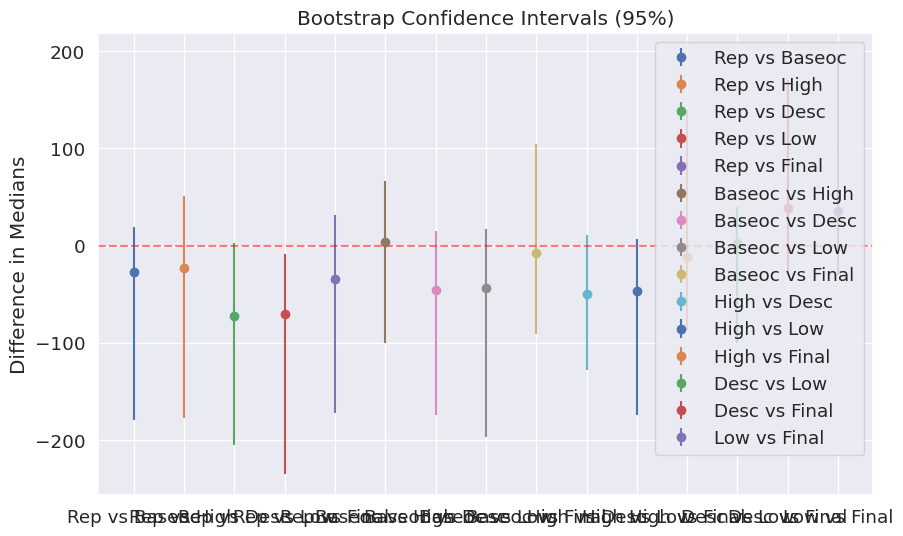

In [ ]:
from scipy.stats import bootstrap

# 1. Define a function to calculate the statistic of interest
# For example, the median difference between two conditions
def median_diff(sample_a, sample_b):
    # Return the difference as a single-element array
    return np.median(sample_a) - np.median(sample_b)

# Aplicar bootstrap para cada par
results = []
for cond1, cond2 in pairs:
    res = bootstrap(
        (df_data_f3_total[cond1].values, df_data_f3_total[cond2].values),
        statistic=median_diff,
        n_resamples=10000,
        paired=True,  # Ou False, se os grupos forem independentes
        method='BCa',
        random_state=42
    )
    results.append({
        'Condition 1': cond1,
        'Condition 2': cond2,
        'Estimated Difference': median_diff(df_data_f3_total[cond1], df_data_f3_total[cond2]),
        'CI Lower': res.confidence_interval.low,
        'CI Upper': res.confidence_interval.high,
        'p-value': np.mean(np.abs(res.bootstrap_distribution) >= np.abs(median_diff(df_data_f3_total[cond1], df_data_f3_total[cond2])))  # p-value empírico
    })

# 4. Criar um df_data_f3_totalFrame com os resultados
results_df = pd.DataFrame(results)

# 5. Ajustar p-values para comparações múltiplas (ex.: método Holm-Bonferroni)
from statsmodels.stats.multitest import multipletests
rejected, p_adjusted, _, _ = multipletests(results_df['p-value'], method='fdr_bh')
results_df['p-value adjusted'] = p_adjusted
results_df['Significant'] = rejected

print(results_df)

# 6. Visualizar os ICs bootstrap
plt.figure(figsize=(10, 6))
for i, row in results_df.iterrows():
    plt.errorbar(
        x=i,
        y=row['Estimated Difference'],
        yerr=[[row['Estimated Difference'] - row['CI Lower']],
               [row['CI Upper'] - row['Estimated Difference']]],
        fmt='o',
        label=f"{row['Condition 1']} vs {row['Condition 2']}"
    )
plt.axhline(0, color='red', linestyle='--', alpha=0.5)
plt.xticks(range(len(results_df)), [f"{row['Condition 1']} vs {row['Condition 2']}" for _, row in results_df.iterrows()])
plt.ylabel('Difference in Medians')
plt.title('Bootstrap Confidence Intervals (95%)')
plt.legend()
plt.show()

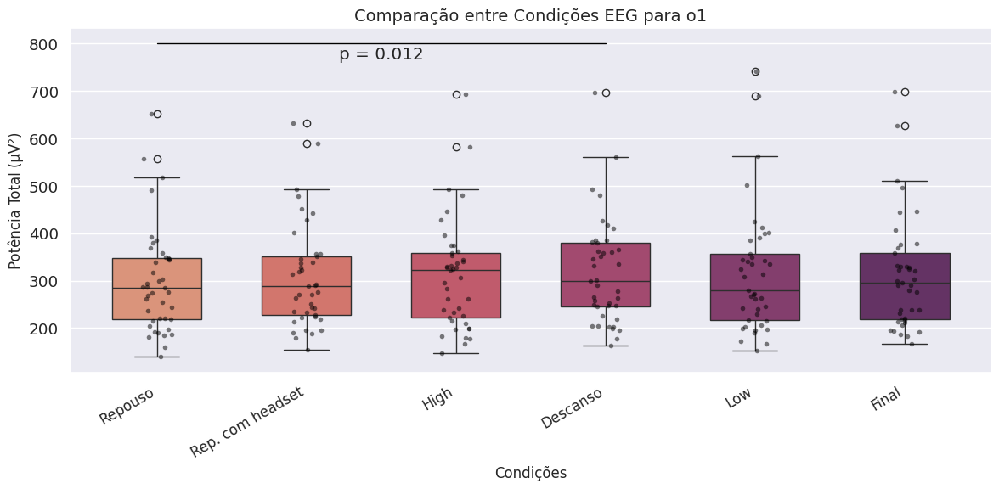

In [ ]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_o1_total, palette="flare", width=0.6)
sns.stripplot(data=ph_data_o1_total, color="black", alpha=0.5, size=4)  # Pontos individuais

# Anotar comparações significativas do Nemenyi
y2_max = ph_data_o1_total.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}

# Identificar pares significativos (p < 0.05)
for i in range(len(ph_o1_total.columns)):
    for j in range(i + 1, len(ph_o1_total.columns)):
        p_val = ph_o1_total.iloc[i, j]

        # Determinar o nível de significância e o estilo de linha
        line_style, line_color = None, 'black'
        for alpha, style in line_styles.items():
            if p_val < alpha:
                line_style, line_color = style
                break

        if line_style:  # Se for significativo
            group_key = tuple(sorted((i, j)))  # Create a unique key for each group
            if group_key not in y_offsets:
                y_offsets[group_key] = len(y_offsets) * 0.6  # Calculate y-offset

            current_y = y2_max * 0.9 + y_offsets[group_key]  # Adjust y position
            significativas2.append((i, j, p_val))
            plt.plot([i, j], [current_y, current_y], color=line_color, ls=line_style, lw=1)
            plt.text((i + j) / 2, current_y * 0.95, f"p = {p_val:.3f}", ha='center', va='bottom')


plt.title("Comparação entre Condições EEG para o1", fontsize=14)
ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=12)
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total (μV²)", fontsize=12)

plt.tight_layout()
plt.show()

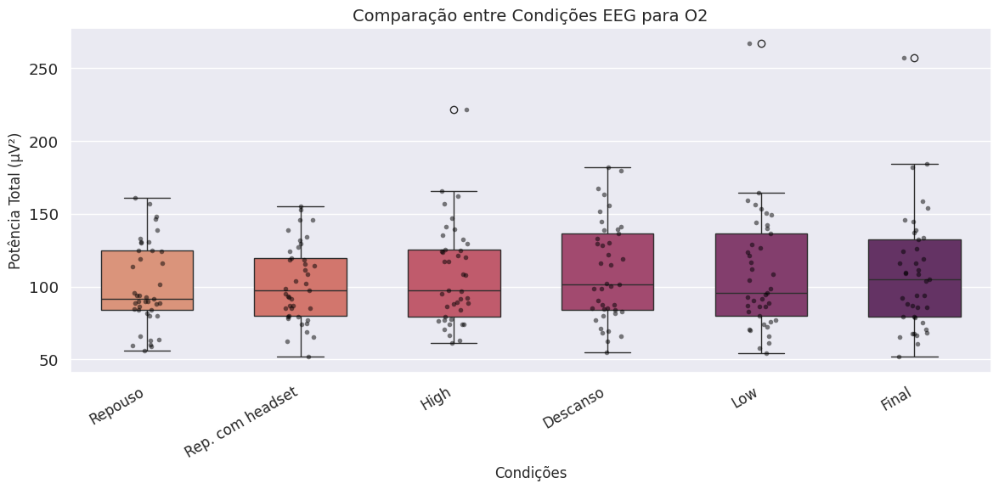

In [ ]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_o2_total, palette="flare", width=0.6)
sns.stripplot(data=ph_data_o2_total, color="black", alpha=0.5, size=4)  # Pontos individuais

# Anotar comparações significativas do Nemenyi
y2_max = ph_data_o2_total.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}

# Identificar pares significativos (p < 0.05)
for i in range(len(ph_o2_total.columns)):
    for j in range(i + 1, len(ph_o2_total.columns)):
        p_val = ph_o2_total.iloc[i, j]

        # Determinar o nível de significância e o estilo de linha
        line_style, line_color = None, 'black'
        for alpha, style in line_styles.items():
            if p_val < alpha:
                line_style, line_color = style
                break

        if line_style:  # Se for significativo
            group_key = tuple(sorted((i, j)))  # Create a unique key for each group
            if group_key not in y_offsets:
                y_offsets[group_key] = len(y_offsets) * 0.6  # Calculate y-offset

            current_y = y2_max * 0.9 + y_offsets[group_key]  # Adjust y position
            significativas2.append((i, j, p_val))
            plt.plot([i, j], [current_y, current_y], color=line_color, ls=line_style, lw=1)
            plt.text((i + j) / 2, current_y * 0.95, f"p = {p_val:.3f}", ha='center', va='bottom')


plt.title("Comparação entre Condições EEG para O2", fontsize=14)
ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=12)
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total (μV²)", fontsize=12)

plt.tight_layout()
plt.show()

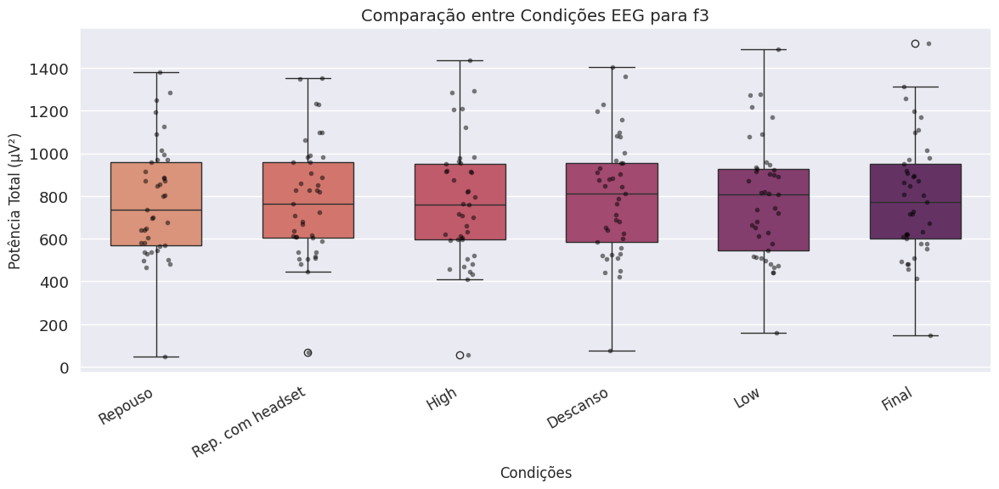

In [ ]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_f3_total, palette="flare", width=0.6)
sns.stripplot(data=ph_data_f3_total, color="black", alpha=0.5, size=4)  # Pontos individuais

# Anotar comparações significativas do Nemenyi
y2_max = ph_data_f3_total.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}

# Identificar pares significativos (p < 0.05)
for i in range(len(ph_f3_total.columns)):
    for j in range(i + 1, len(ph_f3_total.columns)):
        p_val = ph_f3_total.iloc[i, j]

        # Determinar o nível de significância e o estilo de linha
        line_style, line_color = None, 'black'
        for alpha, style in line_styles.items():
            if p_val < alpha:
                line_style, line_color = style
                break

        if line_style:  # Se for significativo
            group_key = tuple(sorted((i, j)))  # Create a unique key for each group
            if group_key not in y_offsets:
                y_offsets[group_key] = len(y_offsets) * 0.6  # Calculate y-offset

            current_y = y2_max * 0.9 + y_offsets[group_key]  # Adjust y position
            significativas2.append((i, j, p_val))
            plt.plot([i, j], [current_y, current_y], color=line_color, ls=line_style, lw=1)
            plt.text((i + j) / 2, current_y * 0.95, f"p = {p_val:.3f}", ha='center', va='bottom')


plt.title("Comparação entre Condições EEG para f3", fontsize=14)
ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=12)
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total (μV²)", fontsize=12)

plt.tight_layout()
plt.show()

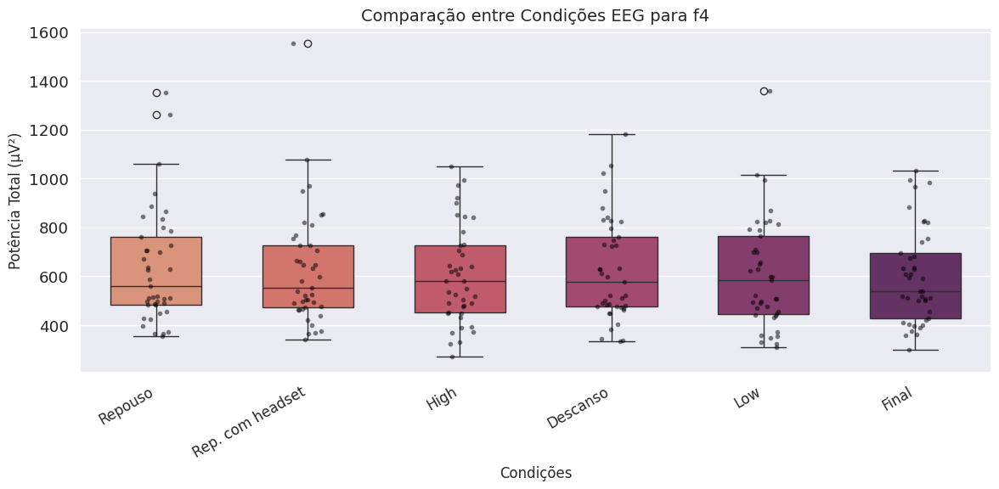

In [ ]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_f4_total, palette="flare", width=0.6)
sns.stripplot(data=ph_data_f4_total, color="black", alpha=0.5, size=4)  # Pontos individuais

# Anotar comparações significativas do Nemenyi
y2_max = ph_data_f4_total.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}



plt.title("Comparação entre Condições EEG para f4", fontsize=14)
ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=12)
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total (μV²)", fontsize=12)

plt.tight_layout()
plt.show()

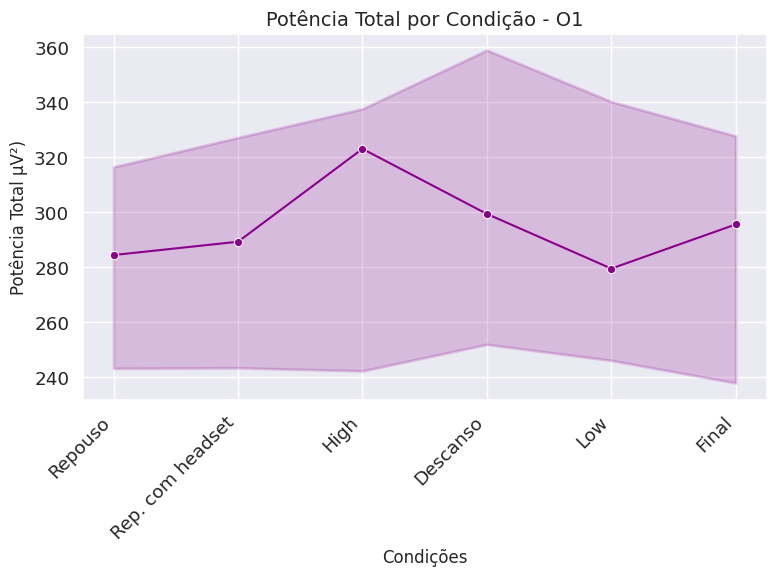

In [ ]:
plt.figure(figsize=(8, 6))
sns.lineplot(x='Condição', y='Potência_o1', data=potencia_total_long, estimator='median', errorbar=('ci', 95), marker='o', color='darkmagenta', err_kws={'linewidth': 2})
labels = ['Repouso', 'Rep. com headset', 'High', 'Descanso', 'Low', 'Final']
# Use plt.xticks instead of ax_rmssd_line.xticks
plt.xticks(range(len(labels)), labels, rotation=45, ha='right') # Use plt.xticks to set the x-axis tick labels
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total μV²)", fontsize=12)
plt.title("Potência Total por Condição - O1", fontsize=14)
plt.tight_layout()

#plt.savefig('rmssd_plt.png', dpi=300, bbox_inches='tight') # Use plt.savefig to save the figure **before** plt.show()
plt.show()
#files.download('rmssd_plt.png') # Use files.download to download the saved figure

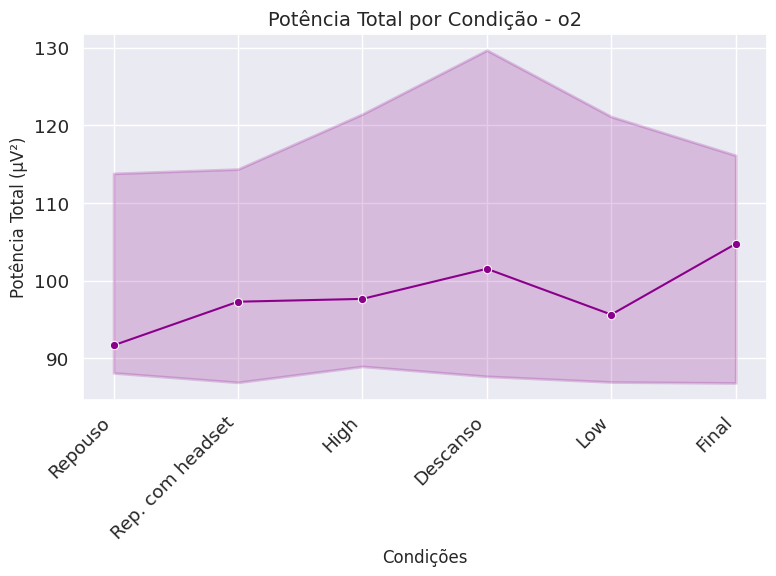

In [ ]:
plt.figure(figsize=(8, 6))
sns.lineplot(x='Condição', y='Potência_o2', data=potencia_total_long, estimator='median', errorbar=('ci', 95), marker='o', color='darkmagenta', err_kws={'linewidth': 2})
labels = ['Repouso', 'Rep. com headset', 'High', 'Descanso', 'Low', 'Final']
# Use plt.xticks instead of ax_rmssd_line.xticks
plt.xticks(range(len(labels)), labels, rotation=45, ha='right') # Use plt.xticks to set the x-axis tick labels
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total (μV²)", fontsize=12)
plt.title("Potência Total por Condição - o2", fontsize=14)
plt.tight_layout()

#plt.savefig('rmssd_plt.png', dpi=300, bbox_inches='tight') # Use plt.savefig to save the figure **before** plt.show()
plt.show()
#files.download('rmssd_plt.png') # Use files.download to download the saved figure

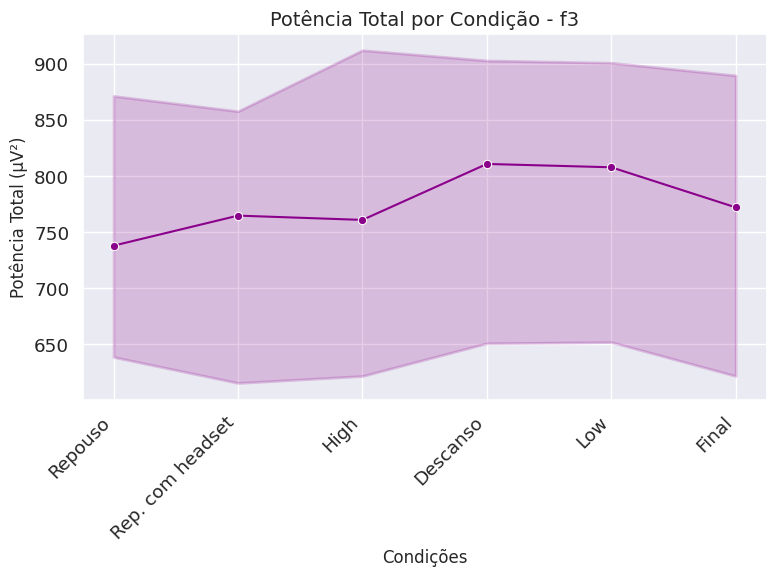

In [ ]:
plt.figure(figsize=(8, 6))
sns.lineplot(x='Condição', y='Potência_f3', data=potencia_total_long, estimator='median', errorbar=('ci', 95), marker='o', color='darkmagenta', err_kws={'linewidth': 2})
labels = ['Repouso', 'Rep. com headset', 'High', 'Descanso', 'Low', 'Final']
# Use plt.xticks instead of ax_rmssd_line.xticks
plt.xticks(range(len(labels)), labels, rotation=45, ha='right') # Use plt.xticks to set the x-axis tick labels
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total (μV²)", fontsize=12)
plt.title("Potência Total por Condição - f3", fontsize=14)
plt.tight_layout()

#plt.savefig('rmssd_plt.png', dpi=300, bbox_inches='tight') # Use plt.savefig to save the figure **before** plt.show()
plt.show()
#files.download('rmssd_plt.png') # Use files.download to download the saved figure

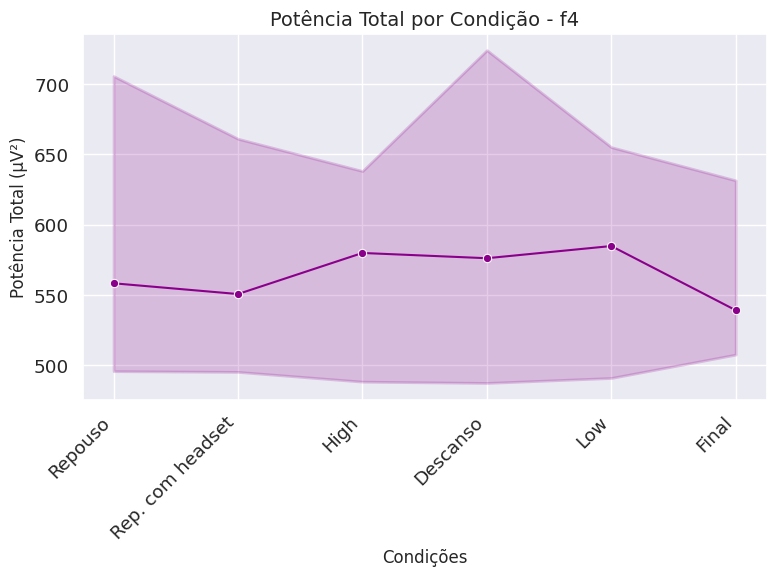

In [ ]:
plt.figure(figsize=(8, 6))
sns.lineplot(x='Condição', y='Potência_f4', data=potencia_total_long, estimator='median', errorbar=('ci', 95), marker='o', color='darkmagenta', err_kws={'linewidth': 2})
labels = ['Repouso', 'Rep. com headset', 'High', 'Descanso', 'Low', 'Final']
# Use plt.xticks instead of ax_rmssd_line.xticks
plt.xticks(range(len(labels)), labels, rotation=45, ha='right') # Use plt.xticks to set the x-axis tick labels
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência Total (μV²)", fontsize=12)
plt.title("Potência Total por Condição - f4", fontsize=14)
plt.tight_layout()

#plt.savefig('rmssd_plt.png', dpi=300, bbox_inches='tight') # Use plt.savefig to save the figure **before** plt.show()
plt.show()
#files.download('rmssd_plt.png') # Use files.download to download the saved figure

### Condição por canal
- Saber como cada canal está se comportando durante cada condição
- Realizei comparação entre pares de eletrodos por região (O1-O2,F3-F4) >> lado esquerdo apresentou maior potência do que o direito em todas as condições, especialmente na região occipital

In [ ]:
rep_total = poder_total_df[[col for col in poder_total_df if col.endswith('rep') or col == 'Participante' ]]
rep_total_long = rep_total.melt(id_vars=['Participante'],value_name='Repouso',value_vars=['o1rep', 'o2rep', 'f3rep', 'f4rep'])
rep_total_long['Canaly'] = rep_total_long['variable'].str[:2]  # Remove the first two letters from 'variable' column and assign to new 'Canal' column
baseoc_total = poder_total_df[[col for col in poder_total_df if col.endswith('baseoc') or col == 'Participante']]
baseoc_total_long = baseoc_total.melt(id_vars=['Participante'],value_name='Rep. com headset', value_vars=['o1baseoc', 'o2baseoc', 'f3baseoc', 'f4baseoc'])
baseoc_total_long['Canal'] = baseoc_total_long['variable'].str[:2]  # Remove the first two letters from 'variable' column and assign to new 'Canal' column
low_total = poder_total_df[[col for col in poder_total_df if col.endswith('low') or col == 'Participante' ]]
low_total_long = low_total.melt(id_vars=['Participante'], value_name='Low',value_vars=['o1low', 'o2low', 'f3low', 'f4low'])
low_total_long['Canal'] = low_total_long['variable'].str[:2]  # Remove the first two letters from 'variable' column and assign to new 'Canal' column
desc_total = poder_total_df[[col for col in poder_total_df if col.endswith('desc') or col == 'Participante' ]]
desc_total_long = desc_total.melt(id_vars=['Participante'], value_name='Descanso',value_vars=['o1desc', 'o2desc', 'f3desc', 'f4desc'])
desc_total_long['Canal'] = desc_total_long['variable'].str[:2]  # Remove the first two letters from 'variable' column and assign to new 'Canal' column
high_total = poder_total_df[[col for col in poder_total_df if col.endswith('high') or col == 'Participante' ]]
high_total_long = high_total.melt(id_vars=['Participante'], value_name='High',value_vars=['o1high', 'o2high', 'f3high', 'f4high'])
high_total_long['Canal'] = high_total_long['variable'].str[:2]  # Remove the first two letters from 'variable' column and assign to new 'Canal' column
final_total = poder_total_df[[col for col in poder_total_df if col.endswith('final') or col == 'Participante']]
final_total_long = final_total.melt(id_vars=['Participante'], value_name='Final',value_vars=['o1final', 'o2final', 'f3final', 'f4final'])
final_total_long['Canal'] = final_total_long['variable'].str[:2]  # Remove the first two letters from 'variable' column and assign to new 'Canal' column
rep_total_wide = rep_total_long.pivot_table(index='Participante', columns='variable', values='Repouso', aggfunc='mean')
baseoc_total_wide = baseoc_total_long.pivot_table(index='Participante', columns='variable', values='Rep. com headset', aggfunc='mean')
low_total_wide = low_total_long.pivot_table(index='Participante', columns='variable', values='Low', aggfunc='mean')
desc_total_wide = desc_total_long.pivot_table(index='Participante', columns='variable', values='Descanso', aggfunc='mean')
high_total_wide = high_total_long.pivot_table(index='Participante', columns='variable', values='High', aggfunc='mean')
final_total_wide = final_total_long.pivot_table(index='Participante', columns='variable', values='Final', aggfunc='mean')

In [ ]:
rep_total_long = rep_total_long.rename(columns={'Participante': 'Participantey'})

# Juntando todos os dataframes long
potencia_total_long_cond = pd.concat([
    rep_total_long,
    baseoc_total_long,
    low_total_long,
    desc_total_long,
    high_total_long,
    final_total_long
],axis=1)
potencia_total_long_cond = potencia_total_long_cond.drop(columns=['variable'])
potencia_total_long_cond = potencia_total_long_cond.drop(columns=['Participante','Canal'])
potencia_total_long_cond = potencia_total_long_cond.reindex(columns=['Participantey','Canaly','Repouso','Rep. com headset','Low','Descanso','High','Final'])
potencia_total_long_cond = potencia_total_long_cond.rename(columns={'Participantey': 'Participante', 'Canaly': 'Canal'})
potencia_total_long_cond

,Participante,Canal,Repouso,Rep. com headset,Low,Descanso,High,Final
0,PT_01,o1,236.280916,219.147098,214.761007,247.326501,221.964472,214.057160
1,PT_02,o1,276.699435,350.944399,343.700404,385.863161,324.540148,377.036393
2,PT_03,o1,349.232576,319.336258,340.071909,358.776773,322.883509,407.319033
3,PT_04,o1,346.764325,356.860343,334.594929,379.220166,374.089125,368.180245
4,PT_05,o1,392.663554,478.187102,501.639169,492.179561,479.676629,627.374119
...,...,...,...,...,...,...,...,...
159,PT_45,f4,585.682760,580.636203,596.694732,595.953508,579.751860,589.029921
160,PT_46,f4,800.331621,850.063919,788.846338,839.517954,844.180947,674.482973
161,PT_48,f4,936.987030,947.971470,993.855740,948.846499,972.767586,966.534777
162,PT_49,f4,705.811764,724.236110,707.974474,761.644052,724.534612,753.561268


                Anova
      F Value  Num DF  Den DF  Pr > F
-------------------------------------
Canal 166.3609 3.0000 120.0000 0.0000

Repouso - Pairwise t-tests:
  Contrast   A   B  Paired  Parametric          T   dof alternative  \
0    Canal  f3  f4    True        True   3.711031  40.0   two-sided   
1    Canal  f3  o1    True        True  14.784769  40.0   two-sided   
2    Canal  f3  o2    True        True  16.575102  40.0   two-sided   
3    Canal  f4  o1    True        True   9.666125  40.0   two-sided   
4    Canal  f4  o2    True        True  15.259220  40.0   two-sided   
5    Canal  o1  o2    True        True  11.531616  40.0   two-sided   

          p-unc        p-corr p-adjust       BF10    hedges  
0  6.278973e-04  6.278973e-04   fdr_bh     45.931  0.549589  
1  8.352175e-18  1.670435e-17   fdr_bh  6.439e+14  2.295555  
2  1.616383e-19  9.698300e-19   fdr_bh  2.925e+16  3.489359  
3  5.094764e-12  6.113717e-12   fdr_bh  1.743e+09  1.824014  
4  2.843016e-18  8.529048e-

/usr/local/lib/python3.12/dist-packages/pingouin/pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


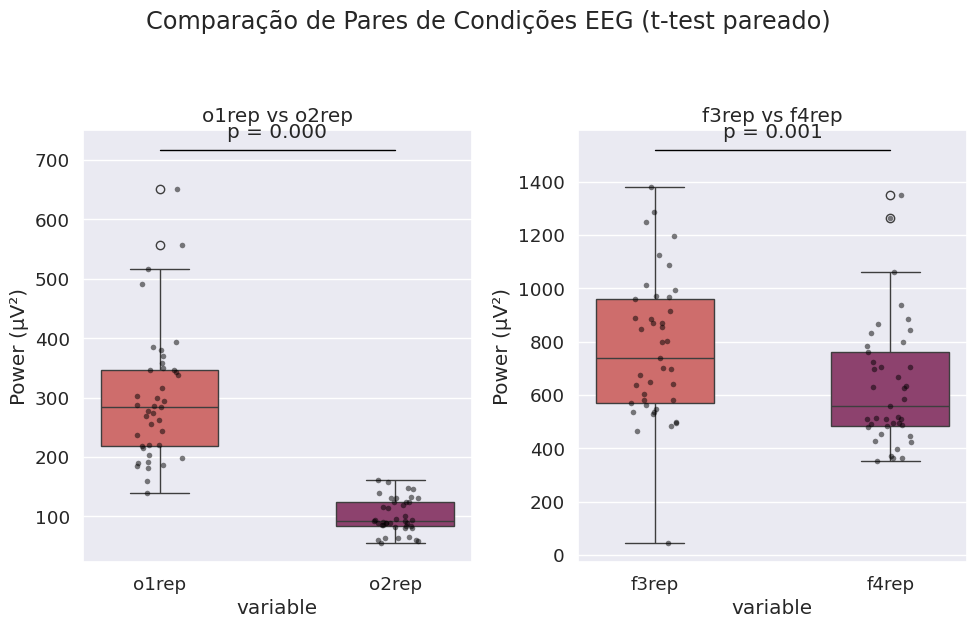

In [ ]:
import statsmodels.stats.multitest as multi
import pingouin as pg
import seaborn as sns
import matplotlib.pyplot as plt

# ANOVA para Repouso
anova_potencia_total_rep = AnovaRM(data=potencia_total_long_cond, depvar='Repouso', subject='Participante', within=['Canal'])
result_potencia_total_rep = anova_potencia_total_rep.fit()
print(result_potencia_total_rep)

# Definir os pares de comparação
pairs_rep_total = [('o1rep', 'o2rep'), ('f3rep', 'f4rep')]
p_values_rep_total = []

# Realizar pairwise t-tests (paramétrico) em vez de Wilcoxon
post_hoc_potencia_total_rep = pg.pairwise_ttests(
    data=potencia_total_long_cond,
    dv='Repouso',
    within='Canal',
    subject='Participante',
    parametric=True,  # Garante que seja um t-test (não Wilcoxon)
    padjust='fdr_bh'  # Correção para múltiplas comparações
)

print('Repouso - Pairwise t-tests:')
print(post_hoc_potencia_total_rep)

# Extrair p-valores ajustados para os pares específicos
p_adjusted_rep_total = []
for pair in pairs_rep_total:
    cond1, cond2 = pair
    # Filtrar o dataframe de resultados para o par atual
    result_pair = post_hoc_potencia_total_rep[
        (post_hoc_potencia_total_rep['A'] == cond1[:-3]) &
        (post_hoc_potencia_total_rep['B'] == cond2[:-3])
    ]
    if not result_pair.empty:
        p_adjusted_rep_total.append(result_pair['p-corr'].values[0])

print("P-valores ajustados (FDR-BH):", p_adjusted_rep_total)

# Plot
plt.figure(figsize=(10, 6))

# Plotar cada par em subplots
for i, (cond1, cond2) in enumerate(pairs_rep_total):
    plt.subplot(1, 2, i+1)

    # Boxplot
    sns.boxplot(data=rep_total_wide[[cond1, cond2]], palette='flare', width=0.5)

    # Adicionar pontos individuais
    sns.stripplot(data=rep_total_wide[[cond1, cond2]], color="black", alpha=0.5, size=4)

    # Anotação estatística
    if i < len(p_adjusted_rep_total):  # Verifica se existe p-valor para este par
        p_val = p_adjusted_rep_total[i]
        y_max = max(rep_total_wide[cond1].max(), rep_total_wide[cond2].max()) * 1.1
        plt.plot([0, 1], [y_max, y_max], color='black', lw=1)
        plt.text(0.5, y_max * 1.02, f"p = {p_val:.3f}", ha='center', va='bottom')

    plt.title(f"{cond1} vs {cond2}")
    plt.ylabel("Power (µV²)")

plt.suptitle("Comparação de Pares de Condições EEG (t-test pareado)", y=1.05)
plt.tight_layout()
plt.show()

                Anova
      F Value  Num DF  Den DF  Pr > F
-------------------------------------
Canal 150.5534 3.0000 120.0000 0.0000

Resultados dos t-tests pareados:
  Contrast   A   B  Paired  Parametric          T   dof alternative  \
0    Canal  f3  f4    True        True   3.674359  40.0   two-sided   
1    Canal  f3  o1    True        True  14.382906  40.0   two-sided   
2    Canal  f3  o2    True        True  16.382608  40.0   two-sided   
3    Canal  f4  o1    True        True   8.643802  40.0   two-sided   
4    Canal  f4  o2    True        True  14.842379  40.0   two-sided   
5    Canal  o1  o2    True        True  12.010631  40.0   two-sided   

          p-unc        p-corr p-adjust       BF10    hedges  
0  6.990393e-04  6.990393e-04   fdr_bh     41.723  0.610843  
1  2.120840e-17  4.241681e-17   fdr_bh  2.617e+14  2.270767  
2  2.432390e-19  1.459434e-18   fdr_bh  1.969e+16  3.503561  
3  1.083167e-10  1.299801e-10   fdr_bh  9.413e+07  1.721749  
4  7.318310e-18  2.195

/usr/local/lib/python3.12/dist-packages/pingouin/pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


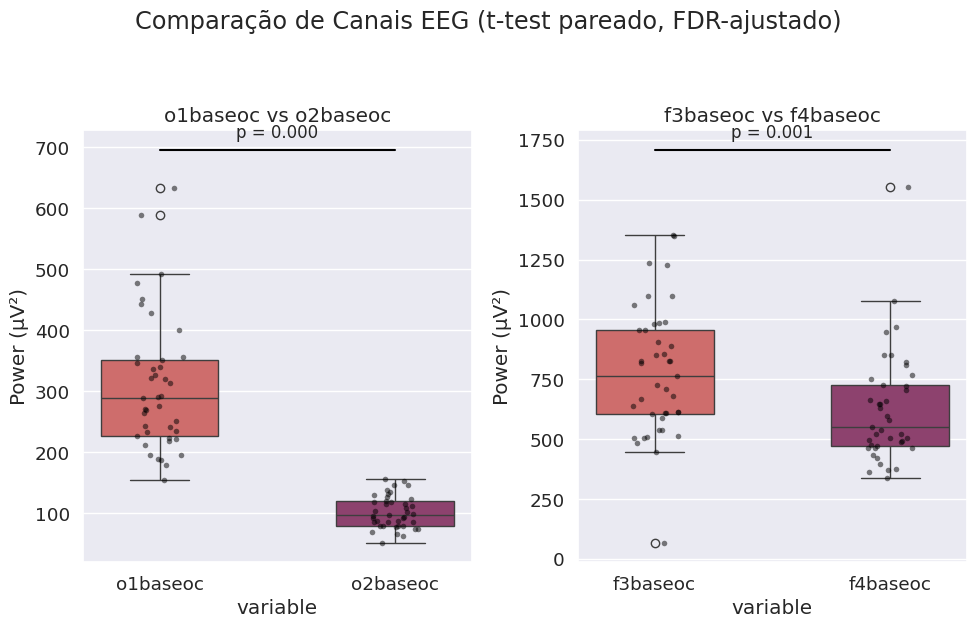

In [ ]:
import statsmodels.stats.multitest as multi
import pingouin as pg
import seaborn as sns
import matplotlib.pyplot as plt

# ANOVA para baseoc (headset)
anova_potencia_total_baseoc = AnovaRM(
    data=potencia_total_long_cond,
    depvar='Rep. com headset',
    subject='Participante',
    within=['Canal']
)
result_potencia_total_baseoc = anova_potencia_total_baseoc.fit()
print(result_potencia_total_baseoc)

# Pares de interesse (nomes originais das colunas)
pairs_baseoc_total = [('o1baseoc', 'o2baseoc'), ('f3baseoc', 'f4baseoc')]

# Pairwise t-tests
post_hoc_potencia_total_baseoc = pg.pairwise_ttests(
    data=potencia_total_long_cond,
    dv='Rep. com headset',
    within='Canal',
    subject='Participante',
    parametric=True,
    padjust='fdr_bh'
)
print('Resultados dos t-tests pareados:')
print(post_hoc_potencia_total_baseoc)

# Extrair p-valores ajustados
p_adjusted_baseoc_total = []
for cond1, cond2 in pairs_baseoc_total:
    # Pegar apenas o nome do canal (ex: 'o1' de 'o1baseoc')
    canal1, canal2 = cond1.replace('baseoc', ''), cond2.replace('baseoc', '')

    # Filtrar resultados
    result_pair = post_hoc_potencia_total_baseoc[
        ((post_hoc_potencia_total_baseoc['A'] == canal1) & (post_hoc_potencia_total_baseoc['B'] == canal2)) |
        ((post_hoc_potencia_total_baseoc['A'] == canal2) & (post_hoc_potencia_total_baseoc['B'] == canal1))
    ]

    if not result_pair.empty:
        p_val = result_pair['p-corr'].values[0]
        p_adjusted_baseoc_total.append(p_val)
    else:
        p_adjusted_baseoc_total.append(None)  # Caso não encontre o par

print("P-valores ajustados:", p_adjusted_baseoc_total)

# Plot
plt.figure(figsize=(10, 6))
for i, (cond1, cond2) in enumerate(pairs_baseoc_total):
    plt.subplot(1, 2, i+1)

    # Boxplot + pontos individuais
    sns.boxplot(data=baseoc_total_wide[[cond1, cond2]], palette='flare', width=0.5)
    sns.stripplot(data=baseoc_total_wide[[cond1, cond2]], color="black", alpha=0.5, size=4)

    # Linha de significância
    if p_adjusted_baseoc_total[i] is not None:
        p_val = p_adjusted_baseoc_total[i]
        y_max = max(baseoc_total_wide[cond1].max(), baseoc_total_wide[cond2].max()) * 1.1
        plt.plot([0, 1], [y_max, y_max], color='black', lw=1.5)
        plt.text(0.5, y_max * 1.02, f"p = {p_val:.3f}", ha='center', va='bottom', fontsize=12)

    plt.title(f"{cond1} vs {cond2}")
    plt.ylabel("Power (µV²)")

plt.suptitle("Comparação de Canais EEG (t-test pareado, FDR-ajustado)", y=1.05)
plt.tight_layout()
plt.show()

                Anova
      F Value  Num DF  Den DF  Pr > F
-------------------------------------
Canal 149.0644 3.0000 120.0000 0.0000

Resultados dos t-tests pareados:
  Contrast   A   B  Paired  Parametric          T   dof alternative  \
0    Canal  f3  f4    True        True   3.674359  40.0   two-sided   
1    Canal  f3  o1    True        True  14.382906  40.0   two-sided   
2    Canal  f3  o2    True        True  16.382608  40.0   two-sided   
3    Canal  f4  o1    True        True   8.643802  40.0   two-sided   
4    Canal  f4  o2    True        True  14.842379  40.0   two-sided   
5    Canal  o1  o2    True        True  12.010631  40.0   two-sided   

          p-unc        p-corr p-adjust       BF10    hedges  
0  6.990393e-04  6.990393e-04   fdr_bh     41.723  0.610843  
1  2.120840e-17  4.241681e-17   fdr_bh  2.617e+14  2.270767  
2  2.432390e-19  1.459434e-18   fdr_bh  1.969e+16  3.503561  
3  1.083167e-10  1.299801e-10   fdr_bh  9.413e+07  1.721749  
4  7.318310e-18  2.195

/usr/local/lib/python3.12/dist-packages/pingouin/pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


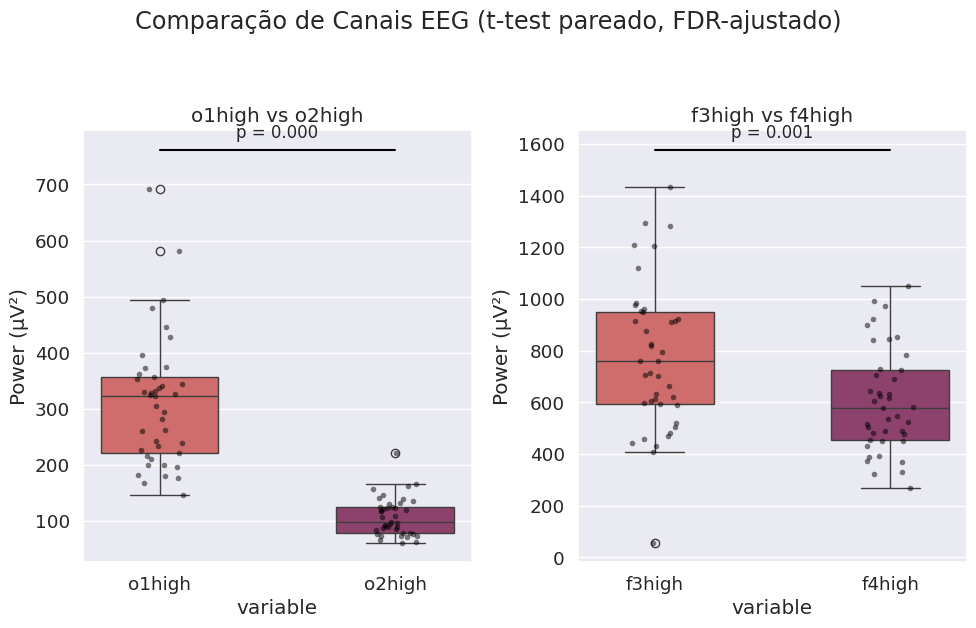

In [ ]:
import statsmodels.stats.multitest as multi
import pingouin as pg
import seaborn as sns
import matplotlib.pyplot as plt

# ANOVA para high (headset)
anova_potencia_total_high = AnovaRM(
    data=potencia_total_long_cond,
    depvar='High',
    subject='Participante',
    within=['Canal']
)
result_potencia_total_high = anova_potencia_total_high.fit()
print(result_potencia_total_high)

# Pares de interesse (nomes originais das colunas)
pairs_high_total = [('o1high', 'o2high'), ('f3high', 'f4high')]

# Pairwise t-tests
post_hoc_potencia_total_high = pg.pairwise_ttests(
    data=potencia_total_long_cond,
    dv='Rep. com headset',
    within='Canal',
    subject='Participante',
    parametric=True,
    padjust='fdr_bh'
)
print('Resultados dos t-tests pareados:')
print(post_hoc_potencia_total_high)

# Extrair p-valores ajustados
p_adjusted_high_total = []
for cond1, cond2 in pairs_high_total:
    # Pegar apenas o nome do canal (ex: 'o1' de 'o1high')
    canal1, canal2 = cond1.replace('high', ''), cond2.replace('high', '')

    # Filtrar resultados
    result_pair = post_hoc_potencia_total_high[
        ((post_hoc_potencia_total_high['A'] == canal1) & (post_hoc_potencia_total_high['B'] == canal2)) |
        ((post_hoc_potencia_total_high['A'] == canal2) & (post_hoc_potencia_total_high['B'] == canal1))
    ]

    if not result_pair.empty:
        p_val = result_pair['p-corr'].values[0]
        p_adjusted_high_total.append(p_val)
    else:
        p_adjusted_high_total.append(None)  # Caso não encontre o par

print("P-valores ajustados:", p_adjusted_high_total)

# Plot
plt.figure(figsize=(10, 6))
for i, (cond1, cond2) in enumerate(pairs_high_total):
    plt.subplot(1, 2, i+1)

    # Boxplot + pontos individuais
    sns.boxplot(data=high_total_wide[[cond1, cond2]], palette='flare', width=0.5)
    sns.stripplot(data=high_total_wide[[cond1, cond2]], color="black", alpha=0.5, size=4)

    # Linha de significância
    if p_adjusted_high_total[i] is not None:
        p_val = p_adjusted_high_total[i]
        y_max = max(high_total_wide[cond1].max(), high_total_wide[cond2].max()) * 1.1
        plt.plot([0, 1], [y_max, y_max], color='black', lw=1.5)
        plt.text(0.5, y_max * 1.02, f"p = {p_val:.3f}", ha='center', va='bottom', fontsize=12)

    plt.title(f"{cond1} vs {cond2}")
    plt.ylabel("Power (µV²)")

plt.suptitle("Comparação de Canais EEG (t-test pareado, FDR-ajustado)", y=1.05)
plt.tight_layout()
plt.show()

                Anova
      F Value  Num DF  Den DF  Pr > F
-------------------------------------
Canal 161.4329 3.0000 120.0000 0.0000

Resultados dos t-tests pareados:
  Contrast   A   B  Paired  Parametric          T   dof alternative  \
0    Canal  f3  f4    True        True   4.322643  40.0   two-sided   
1    Canal  f3  o1    True        True  14.308989  40.0   two-sided   
2    Canal  f3  o2    True        True  15.947505  40.0   two-sided   
3    Canal  f4  o1    True        True   8.961931  40.0   two-sided   
4    Canal  f4  o2    True        True  16.516090  40.0   two-sided   
5    Canal  o1  o2    True        True  11.721246  40.0   two-sided   

          p-unc        p-corr p-adjust       BF10    hedges  
0  9.940245e-05  9.940245e-05   fdr_bh    242.996  0.687305  
1  2.522285e-17  5.044569e-17   fdr_bh  2.213e+14  2.217274  
2  6.208993e-19  1.862698e-18   fdr_bh  7.951e+15  3.393363  
3  4.127251e-11  4.952701e-11   fdr_bh  2.362e+08  1.814529  
4  1.831434e-19  1.098

/usr/local/lib/python3.12/dist-packages/pingouin/pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


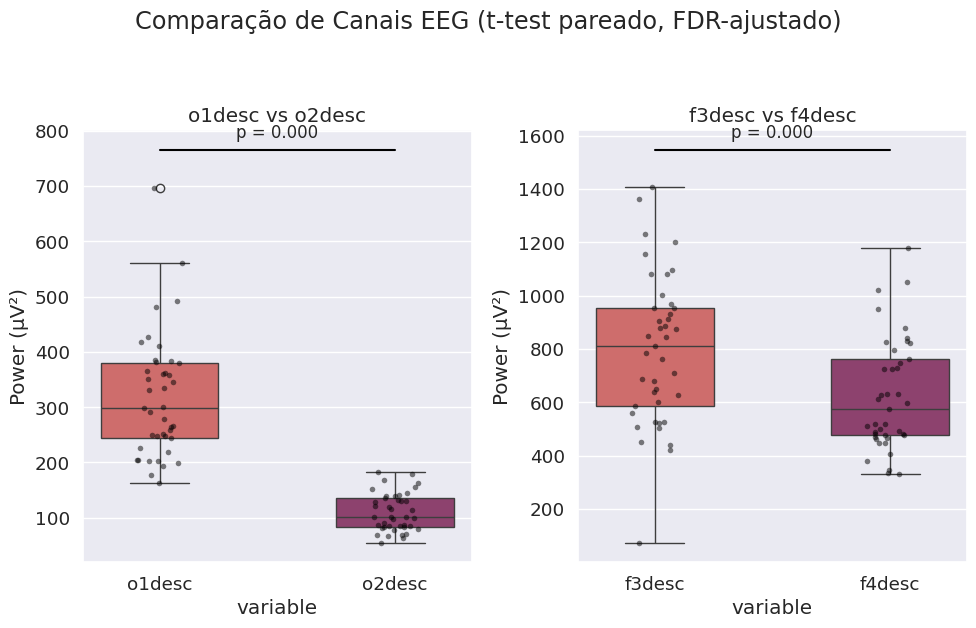

In [ ]:
import statsmodels.stats.multitest as multi
import pingouin as pg
import seaborn as sns
import matplotlib.pyplot as plt

# ANOVA para desc (headset)
anova_potencia_total_desc = AnovaRM(
    data=potencia_total_long_cond,
    depvar='Descanso',
    subject='Participante',
    within=['Canal']
)
result_potencia_total_desc = anova_potencia_total_desc.fit()
print(result_potencia_total_desc)

# Pares de interesse (nomes originais das colunas)
pairs_desc_total = [('o1desc', 'o2desc'), ('f3desc', 'f4desc')]

# Pairwise t-tests
post_hoc_potencia_total_desc = pg.pairwise_ttests(
    data=potencia_total_long_cond,
    dv='Descanso',
    within='Canal',
    subject='Participante',
    parametric=True,
    padjust='fdr_bh'
)
print('Resultados dos t-tests pareados:')
print(post_hoc_potencia_total_desc)

# Extrair p-valores ajustados
p_adjusted_desc_total = []
for cond1, cond2 in pairs_desc_total:
    # Pegar apenas o nome do canal (ex: 'o1' de 'o1desc')
    canal1, canal2 = cond1.replace('desc', ''), cond2.replace('desc', '')

    # Filtrar resultados
    result_pair = post_hoc_potencia_total_desc[
        ((post_hoc_potencia_total_desc['A'] == canal1) & (post_hoc_potencia_total_desc['B'] == canal2)) |
        ((post_hoc_potencia_total_desc['A'] == canal2) & (post_hoc_potencia_total_desc['B'] == canal1))
    ]

    if not result_pair.empty:
        p_val = result_pair['p-corr'].values[0]
        p_adjusted_desc_total.append(p_val)
    else:
        p_adjusted_desc_total.append(None)  # Caso não encontre o par

print("P-valores ajustados:", p_adjusted_desc_total)

# Plot
plt.figure(figsize=(10, 6))
for i, (cond1, cond2) in enumerate(pairs_desc_total):
    plt.subplot(1, 2, i+1)

    # Boxplot + pontos individuais
    sns.boxplot(data=desc_total_wide[[cond1, cond2]], palette='flare', width=0.5)
    sns.stripplot(data=desc_total_wide[[cond1, cond2]], color="black", alpha=0.5, size=4)

    # Linha de significância
    if p_adjusted_desc_total[i] is not None:
        p_val = p_adjusted_desc_total[i]
        y_max = max(desc_total_wide[cond1].max(), desc_total_wide[cond2].max()) * 1.1
        plt.plot([0, 1], [y_max, y_max], color='black', lw=1.5)
        plt.text(0.5, y_max * 1.02, f"p = {p_val:.3f}", ha='center', va='bottom', fontsize=12)

    plt.title(f"{cond1} vs {cond2}")
    plt.ylabel("Power (µV²)")

plt.suptitle("Comparação de Canais EEG (t-test pareado, FDR-ajustado)", y=1.05)
plt.tight_layout()
plt.show()

                Anova
      F Value  Num DF  Den DF  Pr > F
-------------------------------------
Canal 145.7686 3.0000 120.0000 0.0000

Resultados dos t-tests pareados:
  Contrast   A   B  Paired  Parametric          T   dof alternative  \
0    Canal  f3  f4    True        True   4.167822  40.0   two-sided   
1    Canal  f3  o1    True        True  14.856937  40.0   two-sided   
2    Canal  f3  o2    True        True  15.982095  40.0   two-sided   
3    Canal  f4  o1    True        True   7.887182  40.0   two-sided   
4    Canal  f4  o2    True        True  14.878823  40.0   two-sided   
5    Canal  o1  o2    True        True  10.803703  40.0   two-sided   

          p-unc        p-corr p-adjust       BF10    hedges  
0  1.598548e-04  1.598548e-04   fdr_bh    157.763  0.691102  
1  7.078374e-18  1.415675e-17   fdr_bh  7.556e+14  2.127270  
2  5.759279e-19  3.455568e-18   fdr_bh  8.552e+15  3.352982  
3  1.124928e-09  1.349914e-09   fdr_bh  1.016e+07  1.576418  
4  6.732659e-18  1.415

/usr/local/lib/python3.12/dist-packages/pingouin/pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


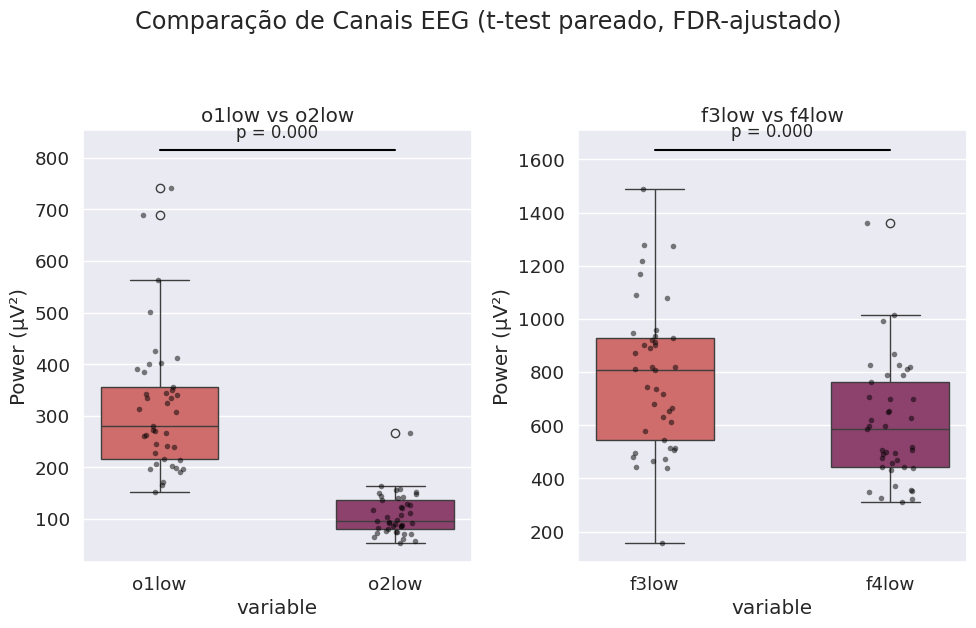

In [ ]:
import statsmodels.stats.multitest as multi
import pingouin as pg
import seaborn as sns
import matplotlib.pyplot as plt

# ANOVA para low (headset)
anova_potencia_total_low = AnovaRM(
    data=potencia_total_long_cond,
    depvar='Low',
    subject='Participante',
    within=['Canal']
)
result_potencia_total_low = anova_potencia_total_low.fit()
print(result_potencia_total_low)

# Pares de interesse (nomes originais das colunas)
pairs_low_total = [('o1low', 'o2low'), ('f3low', 'f4low')]

# Pairwise t-tests
post_hoc_potencia_total_low = pg.pairwise_ttests(
    data=potencia_total_long_cond,
    dv='Low',
    within='Canal',
    subject='Participante',
    parametric=True,
    padjust='fdr_bh'
)
print('Resultados dos t-tests pareados:')
print(post_hoc_potencia_total_low)

# Extrair p-valores ajustados
p_adjusted_low_total = []
for cond1, cond2 in pairs_low_total:
    # Pegar apenas o nome do canal (ex: 'o1' de 'o1low')
    canal1, canal2 = cond1.replace('low', ''), cond2.replace('low', '')

    # Filtrar resultados
    result_pair = post_hoc_potencia_total_low[
        ((post_hoc_potencia_total_low['A'] == canal1) & (post_hoc_potencia_total_low['B'] == canal2)) |
        ((post_hoc_potencia_total_low['A'] == canal2) & (post_hoc_potencia_total_low['B'] == canal1))
    ]

    if not result_pair.empty:
        p_val = result_pair['p-corr'].values[0]
        p_adjusted_low_total.append(p_val)
    else:
        p_adjusted_low_total.append(None)  # Caso não encontre o par

print("P-valores ajustados:", p_adjusted_low_total)

# Plot
plt.figure(figsize=(10, 6))
for i, (cond1, cond2) in enumerate(pairs_low_total):
    plt.subplot(1, 2, i+1)

    # Boxplot + pontos individuais
    sns.boxplot(data=low_total_wide[[cond1, cond2]], palette='flare', width=0.5)
    sns.stripplot(data=low_total_wide[[cond1, cond2]], color="black", alpha=0.5, size=4)

    # Linha de significância
    if p_adjusted_low_total[i] is not None:
        p_val = p_adjusted_low_total[i]
        y_max = max(low_total_wide[cond1].max(), low_total_wide[cond2].max()) * 1.1
        plt.plot([0, 1], [y_max, y_max], color='black', lw=1.5)
        plt.text(0.5, y_max * 1.02, f"p = {p_val:.3f}", ha='center', va='bottom', fontsize=12)

    plt.title(f"{cond1} vs {cond2}")
    plt.ylabel("Power (µV²)")

plt.suptitle("Comparação de Canais EEG (t-test pareado, FDR-ajustado)", y=1.05)
plt.tight_layout()
plt.show()

                Anova
      F Value  Num DF  Den DF  Pr > F
-------------------------------------
Canal 159.4096 3.0000 120.0000 0.0000

Resultados dos t-tests pareados:
  Contrast   A   B  Paired  Parametric          T   dof alternative  \
0    Canal  f3  f4    True        True   4.695383  40.0   two-sided   
1    Canal  f3  o1    True        True  14.632465  40.0   two-sided   
2    Canal  f3  o2    True        True  15.703471  40.0   two-sided   
3    Canal  f4  o1    True        True   8.908181  40.0   two-sided   
4    Canal  f4  o2    True        True  17.068622  40.0   two-sided   
5    Canal  o1  o2    True        True  10.572246  40.0   two-sided   

          p-unc        p-corr p-adjust       BF10    hedges  
0  3.108721e-05  3.108721e-05   fdr_bh    703.491  0.790424  
1  1.186520e-17  2.373039e-17   fdr_bh  4.586e+14  2.208370  
2  1.058966e-18  3.176899e-18   fdr_bh  4.744e+15  3.380310  
3  4.853938e-11  5.824725e-11   fdr_bh  2.023e+08  1.751715  
4  5.761066e-20  3.456

/usr/local/lib/python3.12/dist-packages/pingouin/pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


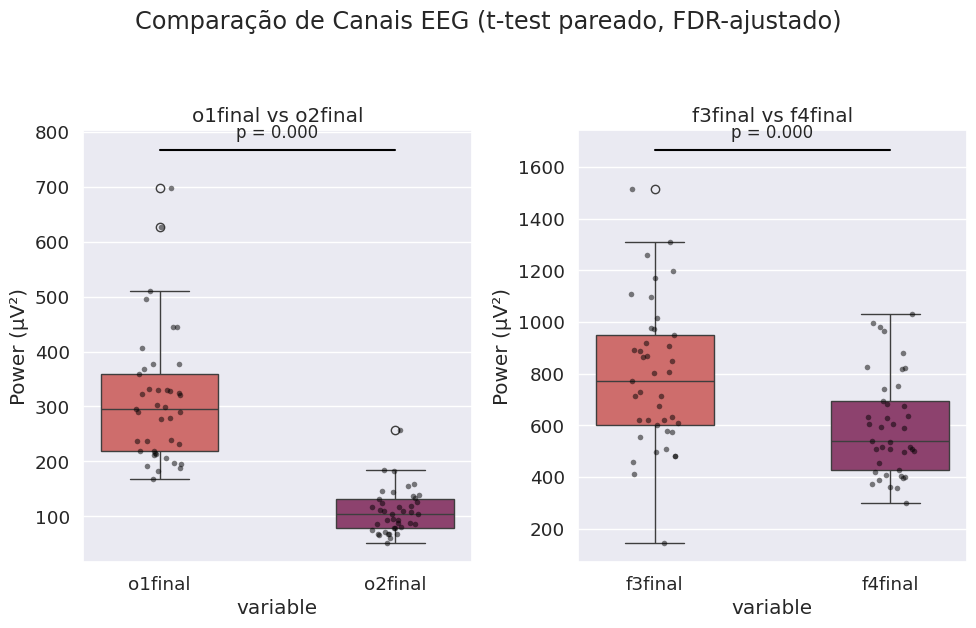

In [ ]:
import statsmodels.stats.multitest as multi
import pingouin as pg
import seaborn as sns
import matplotlib.pyplot as plt

# ANOVA para final (headset)
anova_potencia_total_final = AnovaRM(
    data=potencia_total_long_cond,
    depvar='Final',
    subject='Participante',
    within=['Canal']
)
result_potencia_total_final = anova_potencia_total_final.fit()
print(result_potencia_total_final)

# Pares de interesse (nomes originais das colunas)
pairs_final_total = [('o1final', 'o2final'), ('f3final', 'f4final')]

# Pairwise t-tests
post_hoc_potencia_total_final = pg.pairwise_ttests(
    data=potencia_total_long_cond,
    dv='Final',
    within='Canal',
    subject='Participante',
    parametric=True,
    padjust='fdr_bh'
)
print('Resultados dos t-tests pareados:')
print(post_hoc_potencia_total_final)

# Extrair p-valores ajustados
p_adjusted_final_total = []
for cond1, cond2 in pairs_final_total:
    # Pegar apenas o nome do canal (ex: 'o1' de 'o1final')
    canal1, canal2 = cond1.replace('final', ''), cond2.replace('final', '')

    # Filtrar resultados
    result_pair = post_hoc_potencia_total_final[
        ((post_hoc_potencia_total_final['A'] == canal1) & (post_hoc_potencia_total_final['B'] == canal2)) |
        ((post_hoc_potencia_total_final['A'] == canal2) & (post_hoc_potencia_total_final['B'] == canal1))
    ]

    if not result_pair.empty:
        p_val = result_pair['p-corr'].values[0]
        p_adjusted_final_total.append(p_val)
    else:
        p_adjusted_final_total.append(None)  # Caso não encontre o par

print("P-valores ajustados:", p_adjusted_final_total)

# Plot
plt.figure(figsize=(10, 6))
for i, (cond1, cond2) in enumerate(pairs_final_total):
    plt.subplot(1, 2, i+1)

    # Boxplot + pontos individuais
    sns.boxplot(data=final_total_wide[[cond1, cond2]], palette='flare', width=0.5)
    sns.stripplot(data=final_total_wide[[cond1, cond2]], color="black", alpha=0.5, size=4)

    # Linha de significância
    if p_adjusted_final_total[i] is not None:
        p_val = p_adjusted_final_total[i]
        y_max = max(final_total_wide[cond1].max(), final_total_wide[cond2].max()) * 1.1
        plt.plot([0, 1], [y_max, y_max], color='black', lw=1.5)
        plt.text(0.5, y_max * 1.02, f"p = {p_val:.3f}", ha='center', va='bottom', fontsize=12)

    plt.title(f"{cond1} vs {cond2}")
    plt.ylabel("Power (µV²)")

plt.suptitle("Comparação de Canais EEG (t-test pareado, FDR-ajustado)", y=1.05)
plt.tight_layout()
plt.show()

# Frequência alfa (8-13)

In [22]:
alfa_eeg_psd = tp_eeg_psd[322:682]
alfa_eeg_psd = alfa_eeg_psd.reset_index(drop=True)
alfa_eeg_potabs = tp_eeg_filt_potabs[322:682]
alfa_eeg_potabs = alfa_eeg_potabs.reset_index(drop=True)
#alfa_eeg_psd.to_excel('alfa_eeg_psd.xlsx')
#files.download('alfa_eeg_psd.xlsx')


In [23]:
alfa_eeg_psd['Participante'].unique()

array(['PT_22', 'PT_23', 'PT_24', 'PT_25', 'PT_26', 'PT_27', 'PT_30',
       'PT_31', 'PT_32', 'PT_33', 'PT_34', 'PT_37', 'PT_41', 'PT_43',
       'PT_44', 'PT_45', 'PT_46', 'PT_48', 'PT_49', 'PT_50', 'PT_01',
       'PT_02', 'PT_03', 'PT_04', 'PT_05', 'PT_06', 'PT_07', 'PT_10',
       'PT_11', 'PT_12', 'PT_14', 'PT_15', 'PT_16', 'PT_17', 'PT_18',
       'PT_19', 'PT_20', 'PT_21', 'PT_29', 'PT_35', 'PT_40'], dtype=object)

## Potência absoluta

In [24]:
## Para calcular poder de alfa
# Definir as colunas de interesse
colunas_total = alfa_eeg_potabs.columns  # Todas as colunas
canal_cond = colunas_total[4:]

poder_alfa = []

for grupo, dados in alfa_eeg_potabs.groupby('Participante'):
    grupo_resultados_alfa = {'Grupo': grupo}  # Dicionário para armazenar os resultados do grupo

    for coluna in canal_cond:  # Itera sobre cada coluna
        somas_alfa = dados[coluna].sum()

        # Armazenar os resultados
        grupo_resultados_alfa[f'{coluna}'] = somas_alfa

    # Adicionar ao resultado final
    poder_alfa.append(grupo_resultados_alfa)

# Criar um DataFrame com os resultados
poder_alfa_df = pd.DataFrame(poder_alfa)
poder_alfa_df = poder_alfa_df.rename(columns={'Grupo': 'Participante'})
poder_alfa_df

,Participante,o1rep,o2rep,f3rep,f4rep,o1baseoc,o2baseoc,f3baseoc,f4baseoc,o1high,...,f3desc,f4desc,o1low,o2low,f3low,f4low,o1final,o2final,f3final,f4final
0,PT_01,47.001318,25.355169,101.849572,68.663162,38.377450,10.600345,102.605638,66.267611,43.246196,...,105.580514,80.844428,41.270973,10.806548,102.926114,60.376193,51.354027,18.239860,113.015613,63.929233
1,PT_02,64.403993,33.658953,131.199200,82.925886,76.760117,36.511344,156.634440,89.107015,68.939074,...,162.275927,101.851384,71.802990,34.585161,163.080249,94.674369,87.385355,43.411207,166.554879,106.794088
2,PT_03,59.731657,23.795793,133.440045,67.189634,53.121847,16.199987,113.742985,67.249041,50.280658,...,126.794121,86.256801,54.202654,15.238046,116.934579,80.665218,65.051104,40.448174,141.940567,72.470682
3,PT_04,65.674429,12.443672,149.998662,101.103327,69.988653,14.031268,161.232608,103.459153,70.153755,...,160.471473,109.054406,63.638517,12.317986,139.833168,107.357225,71.538849,13.401698,180.448265,104.516197
4,PT_05,64.736844,24.710862,97.673223,67.363446,79.144777,18.685216,132.988821,80.027122,75.884972,...,131.343006,70.869092,81.060370,17.170486,143.107571,74.898219,110.574795,34.373052,140.265667,70.408557
5,PT_06,75.465153,45.509764,123.830390,82.102967,57.894917,20.093544,140.696668,71.095149,58.892724,...,135.712399,72.584028,56.284994,26.918171,140.732412,68.454237,87.693577,62.359322,137.990700,72.978487
6,PT_07,27.729289,18.934683,53.092864,56.630168,26.870954,16.615034,51.352053,52.611784,35.891542,...,52.032353,51.927306,25.274311,14.492933,55.024191,45.372973,40.373510,28.601961,57.094002,49.882062
7,PT_10,77.273964,31.023887,94.757040,112.810919,52.602680,20.507348,107.870856,83.755320,37.975290,...,70.994761,50.538601,43.491392,34.812754,93.619306,62.113417,43.083781,15.668312,72.821187,49.208881
8,PT_11,111.129568,22.324898,177.126924,117.935771,81.136685,18.348473,131.308414,91.922133,60.009296,...,112.557467,79.208986,68.833428,18.647216,114.373505,89.830039,62.805680,14.603025,125.621189,85.394657
9,PT_12,44.217784,19.909261,102.128886,80.241765,34.157007,11.888372,97.536676,76.875631,32.198497,...,92.180999,76.975437,41.934429,13.013498,83.167728,77.051709,65.111140,24.896911,100.962760,79.598735


<Axes: >

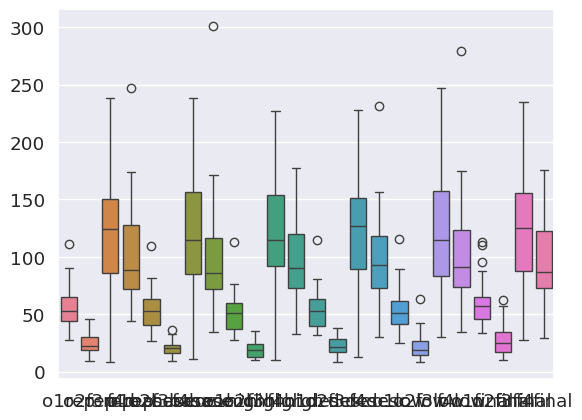

In [25]:
sns.boxplot(poder_alfa_df)

## Potência relativa

In [26]:
perc_alfa_df = pd.merge(poder_total_df, poder_alfa_df, on='Participante', suffixes=('_total','_alfa'))
perc_alfa_df
cols_perc = ['o1rep', 'o2rep', 'f3rep', 'f4rep', 'o1baseoc', 'o2baseoc', 'f3baseoc', 'f4baseoc', 'o1high', 'o2high', 'f3high',
             'f4high', 'o1desc', 'o2desc', 'f3desc', 'f4desc', 'o1low', 'o2low', 'f3low', 'f4low', 'o1final', 'o2final', 'f3final', 'f4final']

for col in cols_perc:
  col_total =f'{col}_total'
  col_alfa = f'{col}_alfa'
  perc_alfa_df[f'{col}_porc'] = (perc_alfa_df[col_alfa] / perc_alfa_df[col_total])*100

cols_remove_alfa = [col for col in perc_alfa_df.columns if col.endswith('_total') or col.endswith('_alfa')]
perc_alfa_df = perc_alfa_df.drop(columns=cols_remove_alfa)
perc_alfa_df


,Participante,o1rep_porc,o2rep_porc,f3rep_porc,f4rep_porc,o1baseoc_porc,o2baseoc_porc,f3baseoc_porc,f4baseoc_porc,o1high_porc,...,f3desc_porc,f4desc_porc,o1low_porc,o2low_porc,f3low_porc,f4low_porc,o1final_porc,o2final_porc,f3final_porc,f4final_porc
0,PT_01,19.892135,27.663545,16.867696,18.781478,17.512187,16.199779,16.877842,17.652821,19.483386,...,16.222367,16.747921,19.217163,16.362489,16.776306,17.130816,23.990801,27.941687,17.881206,17.807211
1,PT_02,23.275795,24.256717,17.782873,18.285329,21.872444,26.333451,18.905561,20.446333,21.242079,...,19.134439,22.093406,20.891157,25.307392,20.193058,21.403859,23.176902,27.348595,18.107934,19.813401
2,PT_03,17.103690,26.827361,15.098950,15.041153,16.635082,20.479373,15.670650,14.515350,15.572383,...,13.897542,17.261572,15.938586,19.005259,12.342566,16.328553,15.970554,36.799204,11.845647,14.469586
3,PT_04,18.939212,19.649236,16.394566,14.489862,19.612337,22.382699,16.418942,16.002873,18.753220,...,16.013169,17.247500,19.019570,21.394372,16.040419,17.068941,19.430388,21.974358,17.790201,16.552752
4,PT_05,16.486593,26.376596,15.295498,16.986164,16.551006,20.033374,16.222246,17.301547,15.820027,...,16.203723,15.062571,16.159099,19.322546,17.485018,17.076460,17.625017,33.085679,15.770226,16.758710
5,PT_06,22.304352,31.157600,14.629832,14.709408,17.056998,16.840773,14.685484,13.595024,15.758933,...,14.220096,13.962090,15.793088,21.317297,14.670903,13.743197,23.237283,34.257058,15.972790,14.320572
6,PT_07,12.609508,29.722819,9.914484,10.956888,11.839347,21.567811,9.539813,10.435721,10.433071,...,9.922228,10.898361,10.454734,15.157427,10.719370,10.234394,19.627146,35.993770,12.506867,11.640301
7,PT_10,21.576733,34.982484,16.625527,17.753807,19.478463,21.573893,17.715467,16.916931,18.070005,...,16.843232,15.067009,19.015689,21.886582,17.159253,17.458123,23.056857,23.197804,17.637881,16.449551
8,PT_11,17.051717,17.926804,16.266093,17.633177,18.327910,17.939579,15.903324,16.697525,17.030910,...,16.382337,16.256972,17.231460,17.849720,15.922625,17.269609,17.497977,17.009240,17.573260,16.762628
9,PT_12,20.572915,22.122506,14.571429,15.749188,17.549204,13.976184,15.314114,14.782349,16.135714,...,15.358772,16.022976,21.377959,16.902453,14.420498,16.447224,29.655813,26.574166,16.240260,15.973340


In [27]:
o1_perc_alfa = perc_alfa_df[[col for col in perc_alfa_df.columns if 'o1' in col]]
o1_perc_alfa = o1_perc_alfa.rename(columns={'o1rep_porc': 'o1rep', 'o1baseoc_porc': 'o1baseoc', 'o1high_porc': 'o1high', 'o1desc_porc': 'o1desc', 'o1low_porc': 'o1low', 'o1final_porc': 'o1final'})
o2_perc_alfa = perc_alfa_df[[col for col in perc_alfa_df.columns if 'o2' in col]]
o2_perc_alfa = o2_perc_alfa.rename(columns={'o2rep_porc': 'o2rep', 'o2baseoc_porc': 'o2baseoc', 'o2high_porc': 'o2high', 'o2desc_porc': 'o2desc', 'o2low_porc': 'o2low', 'o2final_porc': 'o2final'})
f3_perc_alfa = perc_alfa_df[[col for col in perc_alfa_df.columns if 'f3' in col]]
f3_perc_alfa = f3_perc_alfa.rename(columns={'f3rep_porc': 'f3rep', 'f3baseoc_porc': 'f3baseoc', 'f3high_porc': 'f3high', 'f3desc_porc': 'f3desc', 'f3low_porc': 'f3low', 'f3final_porc': 'f3final'})
f4_perc_alfa = perc_alfa_df[[col for col in perc_alfa_df.columns if 'f4' in col]]
f4_perc_alfa = f4_perc_alfa.rename(columns={'f4rep_porc': 'f4rep', 'f4baseoc_porc': 'f4baseoc', 'f4high_porc': 'f4high', 'f4desc_porc': 'f4desc', 'f4low_porc': 'f4low', 'f4final_porc': 'f4final'})
df_perc_alfa = pd.concat([o1_perc_alfa, o2_perc_alfa, f3_perc_alfa, f4_perc_alfa], axis=1)
df_perc_alfa

,o1rep,o1baseoc,o1high,o1desc,o1low,o1final,o2rep,o2baseoc,o2high,o2desc,...,f3high,f3desc,f3low,f3final,f4rep,f4baseoc,f4high,f4desc,f4low,f4final
0,19.892135,17.512187,19.483386,15.715528,19.217163,23.990801,27.663545,16.199779,20.264198,16.858982,...,17.509769,16.222367,16.776306,17.881206,18.781478,17.652821,18.967529,16.747921,17.130816,17.807211
1,23.275795,21.872444,21.242079,20.109087,20.891157,23.176902,24.256717,26.333451,26.000106,27.000957,...,18.854331,19.134439,20.193058,18.107934,18.285329,20.446333,20.477397,22.093406,21.403859,19.813401
2,17.103690,16.635082,15.572383,16.283247,15.938586,15.970554,26.827361,20.479373,16.491731,23.274054,...,16.060064,13.897542,12.342566,11.845647,15.041153,14.515350,15.745327,17.261572,16.328553,14.469586
3,18.939212,19.612337,18.753220,18.368723,19.019570,19.430388,19.649236,22.382699,20.938198,20.197009,...,17.892906,16.013169,16.040419,17.790201,14.489862,16.002873,17.336662,17.247500,17.068941,16.552752
4,16.486593,16.551006,15.820027,16.415330,16.159099,17.625017,26.376596,20.033374,20.029182,19.907169,...,16.219718,16.203723,17.485018,15.770226,16.986164,17.301547,16.274349,15.062571,17.076460,16.758710
5,22.304352,17.056998,15.758933,17.664871,15.793088,23.237283,31.157600,16.840773,16.957668,22.222357,...,13.788387,14.220096,14.670903,15.972790,14.709408,13.595024,14.996492,13.962090,13.743197,14.320572
6,12.609508,11.839347,10.433071,15.300018,10.454734,19.627146,29.722819,21.567811,10.628417,25.506591,...,9.043095,9.922228,10.719370,12.506867,10.956888,10.435721,9.681879,10.898361,10.234394,11.640301
7,21.576733,19.478463,18.070005,20.031778,19.015689,23.056857,34.982484,21.573893,21.155396,23.073214,...,16.257288,16.843232,17.159253,17.637881,17.753807,16.916931,16.326299,15.067009,17.458123,16.449551
8,17.051717,18.327910,17.030910,17.141039,17.231460,17.497977,17.926804,17.939579,17.501954,17.522048,...,17.502624,16.382337,15.922625,17.573260,17.633177,16.697525,16.165611,16.256972,17.269609,16.762628
9,20.572915,17.549204,16.135714,20.847683,21.377959,29.655813,22.122506,13.976184,15.047047,19.478513,...,14.950205,15.358772,14.420498,16.240260,15.749188,14.782349,15.712342,16.022976,16.447224,15.973340


In [28]:
o1_perc_melt_alfa = pd.melt(o1_perc_alfa, var_name='Variável', value_name='Porcentagem')
o2_perc_melt_alfa = pd.melt(o2_perc_alfa, var_name='Variável', value_name='Porcentagem')
f3_perc_melt_alfa = pd.melt(f3_perc_alfa, var_name='Variável', value_name='Porcentagem')
f4_perc_melt_alfa = pd.melt(f4_perc_alfa, var_name='Variável', value_name='Porcentagem')
df_perc_alfa_melt = pd.concat([o1_perc_melt_alfa, o2_perc_melt_alfa, f3_perc_melt_alfa, f4_perc_melt_alfa], axis=0)


In [29]:
df_perc_alfa_melt['Canal'] = df_perc_alfa_melt['Variável'].str[:2]
df_perc_alfa_melt['Condição'] = df_perc_alfa_melt['Variável'].str[2:]
df_perc_alfa_melt

,Variável,Porcentagem,Canal,Condição
0,o1rep,19.892135,o1,rep
1,o1rep,23.275795,o1,rep
2,o1rep,17.103690,o1,rep
3,o1rep,18.939212,o1,rep
4,o1rep,16.486593,o1,rep
...,...,...,...,...
241,f4final,17.685167,f4,final
242,f4final,18.322404,f4,final
243,f4final,17.216125,f4,final
244,f4final,18.203748,f4,final


/tmp/ipython-input-3974358481.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_alfa.set_xticklabels([nom_cond.get(label, label) for label in x_tick_labels_alfa])


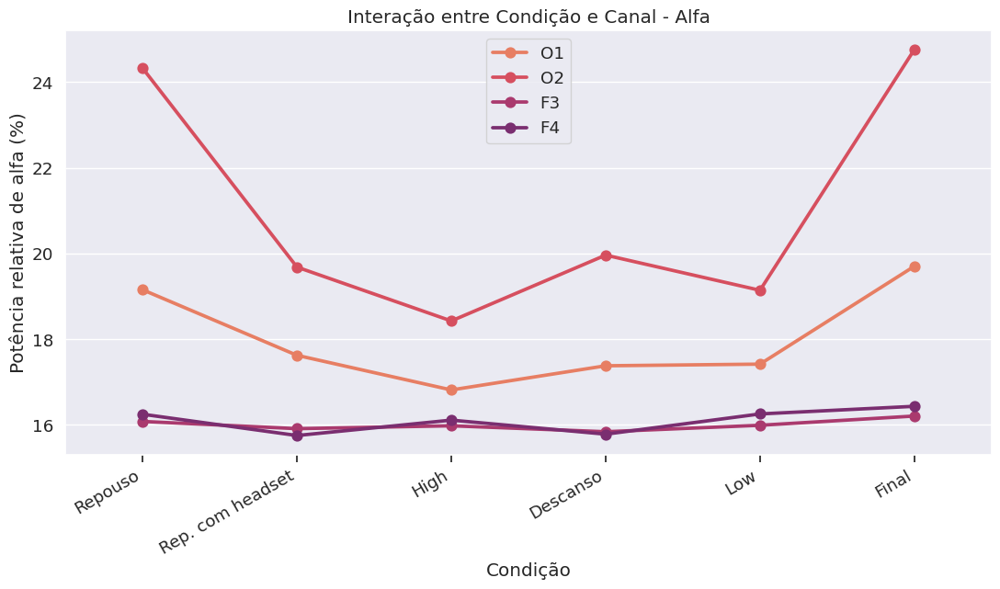

In [30]:
# Gráfico de interação entre Condição e Ordem
plt.figure(figsize=(13, 6))
ax_alfa= sns.pointplot(x='Condição', y='Porcentagem', hue='Canal', data=df_perc_alfa_melt, palette='flare', errorbar =None)
handles,labels_leg = ax_alfa.get_legend_handles_labels()
labels_leg = ['O1','O2','F3','F4']
plt.legend(handles,labels_leg,loc='best')
nom_cond = {'rep': 'Repouso', 'baseoc': 'Rep. com headset', 'high': 'High', 'desc': 'Descanso', 'low': 'Low', 'final': 'Final'}

# Get the current x-tick labels as strings
x_tick_labels_alfa = [t.get_text() for t in ax_alfa.get_xticklabels()]

# Set the desired x-tick labels from nom_cond
ax_alfa.set_xticklabels([nom_cond.get(label, label) for label in x_tick_labels_alfa])
plt.setp(ax_alfa.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.tick_params(axis='x', which='both', bottom=True, labelbottom=True)
plt.title('Interação entre Condição e Canal - Alfa')
plt.ylabel('Potência relativa de alfa (%)')
plt.show()
#plt.savefig('Interação entre Condição e Canal.png')
#files.download('Interação entre Condição e Canal.png')

## Frequência Dominante

In [31]:
## Para calcular frequência dominante dentro do poder total
freq_dom_alfa = []

for grupo, dados in alfa_eeg_psd.groupby('Participante'):
    grupo_freqdom_alfa = {'Grupo': grupo}  # Dicionário para armazenar os resultados do grupo

    for coluna in canal_cond:  # Itera sobre cada coluna
        # Encontrar o maior valor na coluna atual
        maior_potencia_alfa = dados[coluna].max()

        # Encontrar o valor correspondente na coluna de frequencias
        idx_maior_valor_alfa = dados[coluna].idxmax()  # Índice da linha com o maior valor
        valor_freq_dom_alfa = dados.loc[idx_maior_valor_alfa, 'Frequencias']

        # Armazenar os resultados
        grupo_freqdom_alfa[f'Maior {coluna}'] = maior_potencia_alfa
        grupo_freqdom_alfa[f'Frequencias para {coluna}'] = valor_freq_dom_alfa

    # Adicionar ao resultado final
    freq_dom_alfa.append(grupo_freqdom_alfa)

# Criar um DataFrame com os resultados
freq_dom_total_alfa_df = pd.DataFrame(freq_dom_alfa)

In [32]:
freq_dom_alfa_df = freq_dom_total_alfa_df.drop(columns=[col for col in freq_dom_total_alfa_df if col.startswith('Maior')])
freq_dom_alfa_df

,Grupo,Frequencias para o1rep,Frequencias para o2rep,Frequencias para f3rep,Frequencias para f4rep,Frequencias para o1baseoc,Frequencias para o2baseoc,Frequencias para f3baseoc,Frequencias para f4baseoc,Frequencias para o1high,...,Frequencias para f3desc,Frequencias para f4desc,Frequencias para o1low,Frequencias para o2low,Frequencias para f3low,Frequencias para f4low,Frequencias para o1final,Frequencias para o2final,Frequencias para f3final,Frequencias para f4final
0,PT_01,8.789062,9.277344,8.300781,8.789062,8.300781,8.300781,11.230469,9.765625,8.789062,...,8.789062,9.277344,8.789062,9.277344,8.789062,9.277344,12.207031,12.207031,8.300781,8.300781
1,PT_02,10.742188,11.230469,8.300781,8.789062,11.230469,10.253906,8.300781,10.742188,11.230469,...,10.253906,11.718750,8.300781,10.253906,9.277344,11.718750,11.230469,12.207031,8.300781,8.300781
2,PT_03,11.230469,11.230469,8.300781,9.277344,8.300781,11.230469,8.789062,8.300781,9.277344,...,9.765625,11.230469,12.207031,11.230469,9.277344,8.789062,10.742188,10.742188,12.207031,10.742188
3,PT_04,12.207031,11.718750,10.253906,12.207031,8.789062,8.789062,8.300781,9.277344,8.300781,...,11.230469,11.718750,9.765625,9.765625,11.718750,8.789062,12.207031,8.300781,8.300781,8.300781
4,PT_05,8.789062,10.742188,12.207031,8.300781,12.207031,11.718750,9.765625,11.230469,10.742188,...,8.300781,10.742188,11.230469,11.718750,11.230469,10.253906,12.207031,10.742188,8.789062,9.765625
5,PT_06,10.742188,10.742188,8.789062,8.789062,11.718750,8.789062,9.277344,8.789062,11.718750,...,8.789062,8.300781,8.789062,10.742188,8.789062,8.300781,9.765625,10.742188,8.789062,8.789062
6,PT_07,10.253906,10.253906,8.300781,10.253906,10.253906,10.253906,8.300781,9.277344,9.765625,...,8.789062,10.253906,10.253906,9.277344,8.300781,9.765625,10.253906,10.253906,10.253906,9.277344
7,PT_10,11.718750,11.718750,11.230469,9.277344,8.789062,10.253906,8.300781,9.765625,8.300781,...,8.300781,11.230469,12.207031,9.277344,9.277344,8.789062,9.765625,9.277344,9.277344,10.253906
8,PT_11,11.230469,9.277344,9.765625,9.277344,10.253906,8.789062,8.789062,10.742188,9.277344,...,9.277344,10.253906,10.253906,8.789062,10.742188,8.300781,8.300781,11.230469,8.300781,8.300781
9,PT_12,10.253906,9.765625,11.718750,9.277344,10.742188,11.718750,9.277344,8.300781,8.300781,...,8.789062,8.789062,12.207031,11.718750,8.300781,11.230469,9.765625,9.765625,8.300781,10.253906


(8.0, 13.0)

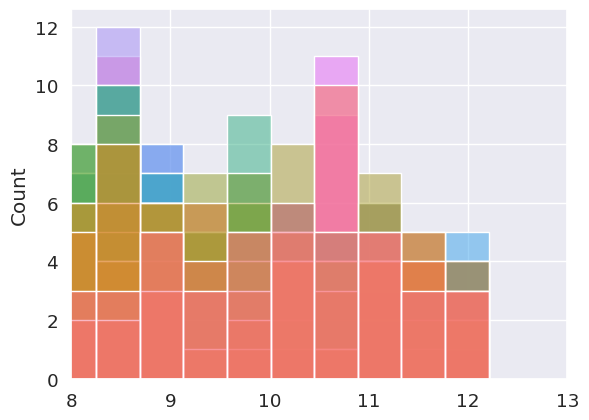

In [33]:
sns.histplot(freq_dom_alfa_df,legend=False,bins=10)
plt.xlim(8,13)

<Axes: >

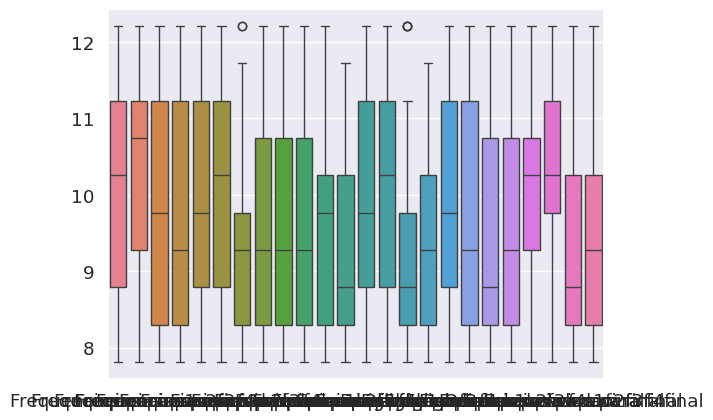

In [34]:
sns.boxplot(freq_dom_alfa_df)

## Friedmann

In [35]:
## Tudo não-normal
norm_o1rep_alfa = shapiro(alfa_eeg_psd['o1rep'])
norm_o2rep_alfa = shapiro(alfa_eeg_psd['o2rep'])
norm_f3rep_alfa = shapiro(alfa_eeg_psd['f3rep'])
norm_f4rep_alfa = shapiro(alfa_eeg_psd['f4rep'])
print('REP')
print(norm_o1rep_alfa)
print(norm_o2rep_alfa)
print(norm_f3rep_alfa)
print(norm_f4rep_alfa)
norm_o1baseoc_alfa = shapiro(alfa_eeg_psd['o1baseoc'])
norm_o2baseoc_alfa = shapiro(alfa_eeg_psd['o2baseoc'])
norm_f3baseoc_alfa = shapiro(alfa_eeg_psd['f3baseoc'])
norm_f4baseoc_alfa = shapiro(alfa_eeg_psd['f4baseoc'])
print('BASEOC')
print(norm_o1baseoc_alfa)
print(norm_o2baseoc_alfa)
print(norm_f3baseoc_alfa)
print(norm_f4baseoc_alfa)
norm_o1low_alfa = shapiro(alfa_eeg_psd['o1low'])
norm_o2low_alfa = shapiro(alfa_eeg_psd['o2low'])
norm_f3low_alfa = shapiro(alfa_eeg_psd['f3low'])
norm_f4low_alfa = shapiro(alfa_eeg_psd['f4low'])
print('LOW')
print(norm_o1low_alfa)
print(norm_o2low_alfa)
print(norm_f3low_alfa)
print(norm_f4low_alfa)
norm_o1desc_alfa = shapiro(alfa_eeg_psd['o1desc'])
norm_o2desc_alfa = shapiro(alfa_eeg_psd['o2desc'])
norm_f3desc_alfa = shapiro(alfa_eeg_psd['f3desc'])
norm_f4desc_alfa = shapiro(alfa_eeg_psd['f4desc'])
print('DESC')
print(norm_o1desc_alfa)
print(norm_o2desc_alfa)
print(norm_f3desc_alfa)
print(norm_f4desc_alfa)
norm_o1high_alfa = shapiro(alfa_eeg_psd['o1high'])
norm_o2high_alfa = shapiro(alfa_eeg_psd['o2high'])
norm_f3high_alfa = shapiro(alfa_eeg_psd['f3high'])
norm_f4high_alfa = shapiro(alfa_eeg_psd['f4high'])
print('HIGH')
print(norm_o1high_alfa)
print(norm_o2high_alfa)
print(norm_f3high_alfa)
print(norm_f4high_alfa)
norm_o1final_alfa = shapiro(alfa_eeg_psd['o1final'])
norm_o2final_alfa = shapiro(alfa_eeg_psd['o2final'])
norm_f3baseoc_alfa = shapiro(alfa_eeg_psd['f3final'])
norm_f4final_alfa = shapiro(alfa_eeg_psd['f4final'])
print('FINAL')
print(norm_o1final_alfa)
print(norm_o2final_alfa)
print(norm_f3baseoc_alfa)
print(norm_f4final_alfa)


REP
ShapiroResult(statistic=np.float64(0.9176193661193409), pvalue=np.float64(3.807163538450871e-13))
ShapiroResult(statistic=np.float64(0.845506481186555), pvalue=np.float64(2.426148766512952e-18))
ShapiroResult(statistic=np.float64(0.9531174147855805), pvalue=np.float64(2.718799742935449e-09))
ShapiroResult(statistic=np.float64(0.8954620411783788), pvalue=np.float64(5.2963943288850485e-15))
BASEOC
ShapiroResult(statistic=np.float64(0.9082280084515965), pvalue=np.float64(5.701414087602851e-14))
ShapiroResult(statistic=np.float64(0.897907513841294), pvalue=np.float64(8.214198211291015e-15))
ShapiroResult(statistic=np.float64(0.9712258817499355), pvalue=np.float64(1.453286837371673e-06))
ShapiroResult(statistic=np.float64(0.8285590972460909), pvalue=np.float64(2.7118485037588015e-19))
LOW
ShapiroResult(statistic=np.float64(0.8763067339896448), pvalue=np.float64(2.1407769642041362e-16))
ShapiroResult(statistic=np.float64(0.7114016912766596), pvalue=np.float64(1.904761883690612e-24))
Shap

In [36]:
o1_alfa = alfa_eeg_psd[[col for col in alfa_eeg_psd if col.startswith('o1') or col == 'Participante' ]]
o1_alfa_melt = o1_alfa.melt(id_vars=['Participante'], value_vars=['o1rep', 'o1baseoc', 'o1high', 'o1desc', 'o1low', 'o1final'], var_name='Condição', value_name='Valor')
o1_alfa_wide = o1_alfa_melt.pivot_table(index='Participante', columns='Condição', values='Valor')
o2_alfa = alfa_eeg_psd[[col for col in alfa_eeg_psd if col.startswith('o2') or col == 'Participante' ]]
o2_alfa_melt = o2_alfa.melt(id_vars=['Participante'], value_vars=['o2rep', 'o2baseoc', 'o2high', 'o2desc', 'o2low', 'o2final'], var_name='Condição', value_name='Valor')
o2_alfa_wide = o2_alfa_melt.pivot_table(index='Participante', columns='Condição', values='Valor')
f3_alfa = alfa_eeg_psd[[col for col in alfa_eeg_psd if col.startswith('f3') or col == 'Participante' ]]
f3_alfa_melt = alfa_eeg_psd.melt(id_vars=['Participante'], value_vars=['f3rep', 'f3baseoc', 'f3high', 'f3desc', 'f3low', 'f3final'], var_name='Condição', value_name='Valor')
f3_alfa_wide = f3_alfa_melt.pivot_table(index='Participante', columns='Condição', values='Valor')
f4_alfa = alfa_eeg_psd[[col for col in alfa_eeg_psd if col.startswith('f4') or col == 'Participante' ]]
f4_alfa_melt = f4_alfa.melt(id_vars=['Participante'], value_vars=['f4rep', 'f4baseoc', 'f4high', 'f4desc', 'f4low', 'f4final'], var_name='Condição', value_name='Valor')
f4_alfa_wide = f4_alfa_melt.pivot_table(index='Participante', columns='Condição', values='Valor')

In [37]:
o1_alfa_melt['Canal'] = o1_alfa_melt['Condição'].str[:2]
o1_alfa_melt['Condição'] = o1_alfa_melt['Condição'].str[2:]
o2_alfa_melt['Canal'] = o2_alfa_melt['Condição'].str[:2]
o2_alfa_melt['Condição'] = o2_alfa_melt['Condição'].str[2:]
f3_alfa_melt['Canal'] = f3_alfa_melt['Condição'].str[:2]
f3_alfa_melt['Condição'] = f3_alfa_melt['Condição'].str[2:]
f4_alfa_melt['Canal'] = f4_alfa_melt['Condição'].str[:2]
f4_alfa_melt['Condição'] = f4_alfa_melt['Condição'].str[2:]
alfa_melt = pd.concat([o1_alfa_melt, o2_alfa_melt, f3_alfa_melt, f4_alfa_melt],axis=0)


In [38]:
o1o2_melt = pd.concat([o1_alfa_melt[['Participante','Condição','Valor']], o2_alfa_melt[['Valor']]],axis=1)
o1o2_melt.columns = ['Participante', 'Condição', 'valor_o1', 'valor_o2']
o1o2_melt

,Participante,Condição,valor_o1,valor_o2
0,PT_22,rep,9.909395,2.622013
1,PT_23,rep,9.441885,3.233080
2,PT_24,rep,18.291697,7.112475
3,PT_25,rep,9.556272,4.653457
4,PT_26,rep,13.650237,3.406653
...,...,...,...,...
2155,PT_48,final,11.336264,6.952286
2156,PT_49,final,13.061944,3.813929
2157,PT_50,final,17.986908,6.858185
2158,PT_01,final,10.229782,2.979858


In [39]:
f3f4_melt = pd.concat([f3_alfa_melt[['Participante','Condição','Valor']], f4_alfa_melt[['Valor']]],axis=1)
f3f4_melt.columns = ['Participante', 'Condição', 'valor_f3', 'valor_f4']
f3f4_melt

,Participante,Condição,valor_f3,valor_f4
0,PT_22,rep,25.813555,16.147066
1,PT_23,rep,37.254425,27.256398
2,PT_24,rep,45.741596,50.410754
3,PT_25,rep,42.925103,32.865783
4,PT_26,rep,19.395629,30.117662
...,...,...,...,...
2155,PT_48,final,31.258032,31.279904
2156,PT_49,final,33.940981,24.979978
2157,PT_50,final,52.587222,25.055343
2158,PT_01,final,20.254466,9.861895


In [40]:
f3f4_melt

,Participante,Condição,valor_f3,valor_f4
0,PT_22,rep,25.813555,16.147066
1,PT_23,rep,37.254425,27.256398
2,PT_24,rep,45.741596,50.410754
3,PT_25,rep,42.925103,32.865783
4,PT_26,rep,19.395629,30.117662
...,...,...,...,...
2155,PT_48,final,31.258032,31.279904
2156,PT_49,final,33.940981,24.979978
2157,PT_50,final,52.587222,25.055343
2158,PT_01,final,20.254466,9.861895


In [41]:
df_chann_alfa_melt = pd.concat([o1_alfa_melt, o2_alfa_melt, f3_alfa_melt, f4_alfa_melt], axis=0)
df_chann_alfa_melt['Canaly'] = df_chann_alfa_melt['Condição'].str[:2]
df_chann_alfa_melt['Condiçãoy'] = df_chann_alfa_melt['Condição'].str[2:]


In [42]:
df_chann_alfa_melt

,Participante,Condição,Valor,Canal,Canaly,Condiçãoy
0,PT_22,rep,9.909395,o1,re,p
1,PT_23,rep,9.441885,o1,re,p
2,PT_24,rep,18.291697,o1,re,p
3,PT_25,rep,9.556272,o1,re,p
4,PT_26,rep,13.650237,o1,re,p
...,...,...,...,...,...,...
2155,PT_48,final,31.279904,f4,fi,nal
2156,PT_49,final,24.979978,f4,fi,nal
2157,PT_50,final,25.055343,f4,fi,nal
2158,PT_01,final,9.861895,f4,fi,nal


In [97]:

ph_data_o1_alfa = o1_alfa_wide[['o1rep', 'o1baseoc', 'o1high', 'o1desc', 'o1low', 'o1final']].values  # Convert to NumPy array

f_o1_alfa, p_o1_alfa = friedmanchisquare(*ph_data_o1_alfa.T)  # Apply Friedman test
print('O1')
print(f_o1_alfa)
print(p_o1_alfa)
ph_o1_alfa = posthoc_conover_friedman(ph_data_o1_alfa)  # Apply posthoc test
print(ph_o1_alfa)

ph_data_o2_alfa = o2_alfa_wide[['o2rep', 'o2baseoc', 'o2high', 'o2desc', 'o2low', 'o2final']].values  # Convert to NumPy array
f_o2_alfa, p_o2_alfa = friedmanchisquare(*ph_data_o2_alfa.T)  # Apply Friedman test
print('\nO2')
print(f_o2_alfa)
print(p_o2_alfa)
ph_o2_alfa = posthoc_conover_friedman(ph_data_o2_alfa)  # Apply posthoc test
print(ph_o2_alfa)

ph_data_f3_alfa = f3_alfa_wide[['f3rep', 'f3baseoc', 'f3high', 'f3desc', 'f3low', 'f3final']].values  # Convert to NumPy array
f_f3_alfa, p_f3_alfa = friedmanchisquare(*ph_data_f3_alfa.T)  # Apply Friedman test
print('F3')
print(f_f3_alfa)
print(p_f3_alfa)


ph_data_f4_alfa = f4_alfa_wide[['f4rep', 'f4baseoc', 'f4high', 'f4desc', 'f4low', 'f4final']].values
f_f4_alfa, p_f4_alfa = friedmanchisquare(*ph_data_f4_alfa.T)
print('F4')
print(f_f4_alfa)
print(p_f4_alfa)

O1
19.940766550522653
0.0012821222099534016
          0         1         2         3         4         5
0  1.000000  0.245031  0.012657  0.624023  0.142390  0.076664
1  0.245031  1.000000  0.178534  0.500448  0.759297  0.003607
2  0.012657  0.178534  1.000000  0.044193  0.298115  0.000027
3  0.624023  0.500448  0.044193  1.000000  0.327367  0.024243
4  0.142390  0.759297  0.298115  0.327367  1.000000  0.001343
5  0.076664  0.003607  0.000027  0.024243  0.001343  1.000000

O2
35.27177700348432
1.327947409961949e-06
          0         1         2         3             4             5
0  1.000000  0.004364  0.001947  0.370762  1.622286e-04  1.799547e-01
1  0.004364  1.000000  0.797979  0.048358  3.376405e-01  3.570070e-05
2  0.001947  0.797979  1.000000  0.026016  4.817307e-01  1.226218e-05
3  0.370762  0.048358  0.026016  1.000000  3.584339e-03  2.601557e-02
4  0.000162  0.337641  0.481731  0.003584  1.000000e+00  5.143112e-07
5  0.179955  0.000036  0.000012  0.026016  5.143112e-07  1

/tmp/ipython-input-482579631.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-482579631.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)


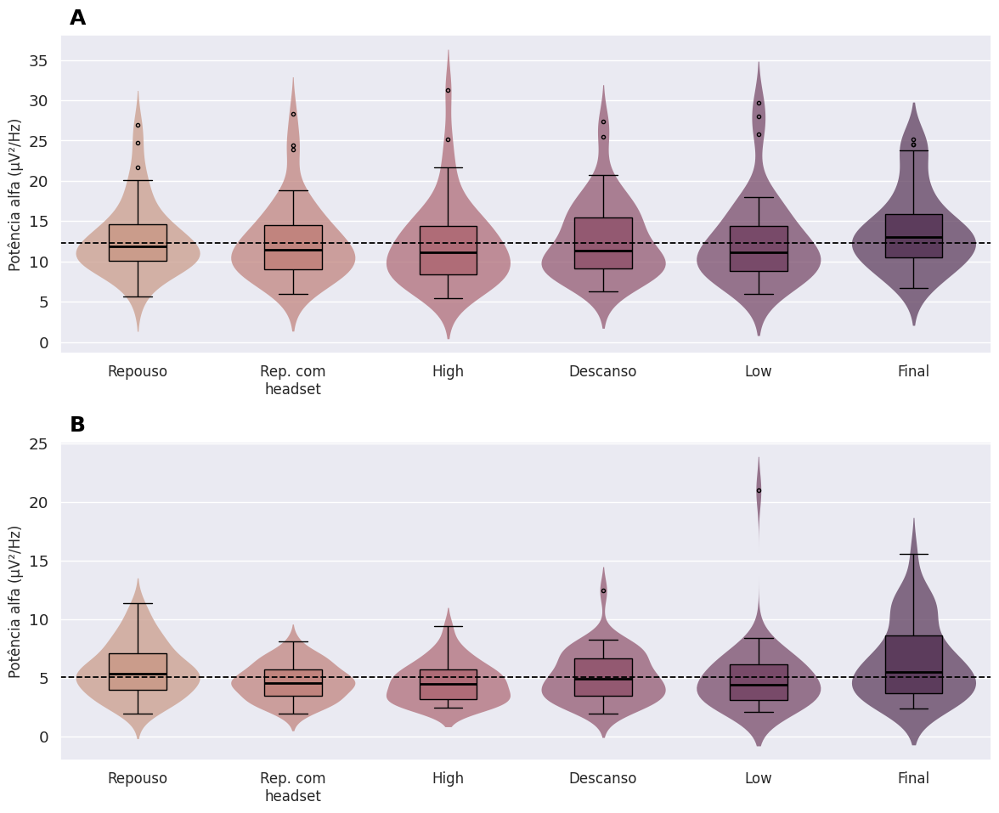

In [45]:
fig_occ_a, axes_occ_a = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Para facilitar o uso no loop, "achatamos" a grade 2x2 em uma lista simples de 4 eixos
flat_axes_occ_a = axes_occ_a.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_a = [ph_data_o1_alfa,ph_data_o2_alfa]
p_values_occ_a = [ph_o1_alfa,ph_o2_alfa]
mean_occ_a = [o1_alfa_melt['Valor'].mean(),o2_alfa_melt['Valor'].mean()]
titles_occ_a = ['A','B']
x_labels=['Repouso', 'Rep. com\nheadset', 'High', 'Descanso','Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_a)):
    data = datasets_occ_a[i]
    p_val = p_values_occ_a[i]
    ax = flat_axes_occ_a[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_a[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data,  palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_occ_a[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)


# Adiciona um espaçamento para evitar que os títulos se sobreponham
plt.tight_layout(rect=[0, 0, 1, 0.98])


# Exibe a figura final
plt.show()

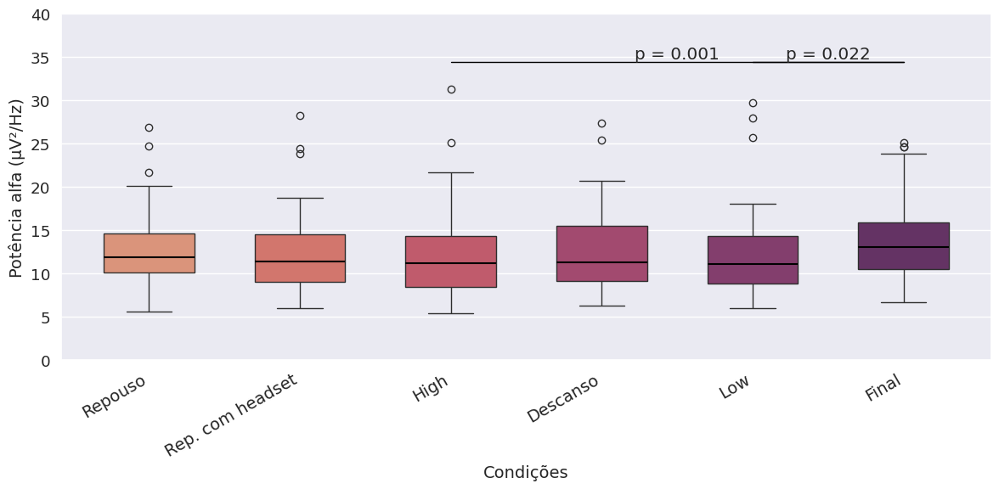

In [46]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_o1_alfa, palette="flare", width=0.6, medianprops={'linewidth':1.5,'color':'black'})

# 2. Anotar comparações significativas do Nemenyi
y_max = ph_data_o1_alfa.max().max() * 1.1
significativas = []

# Identificar pares significativos (p < 0.05)
for i in range(len(ph_o1_alfa.columns)):
    for j in range(i+1, len(ph_o1_alfa.columns)):
        p_val = ph_o1_alfa.iloc[i, j]
        if p_val < 0.05:  # Critério de significância
            significativas.append((i, j, p_val))
            plt.plot([i, j], [y_max, y_max], color='black', lw=1)
            plt.text((i+j)/2, y_max, f"p = {p_val:.3f}", ha='center', va='bottom')


ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
# Set xticks with both locations and labels
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=14)
plt.xlabel("Condições", fontsize=14)
plt.ylabel("Potência alfa (μV²/Hz)", fontsize=14)
plt.ylim(0,40)
plt.tight_layout()
plt.show()


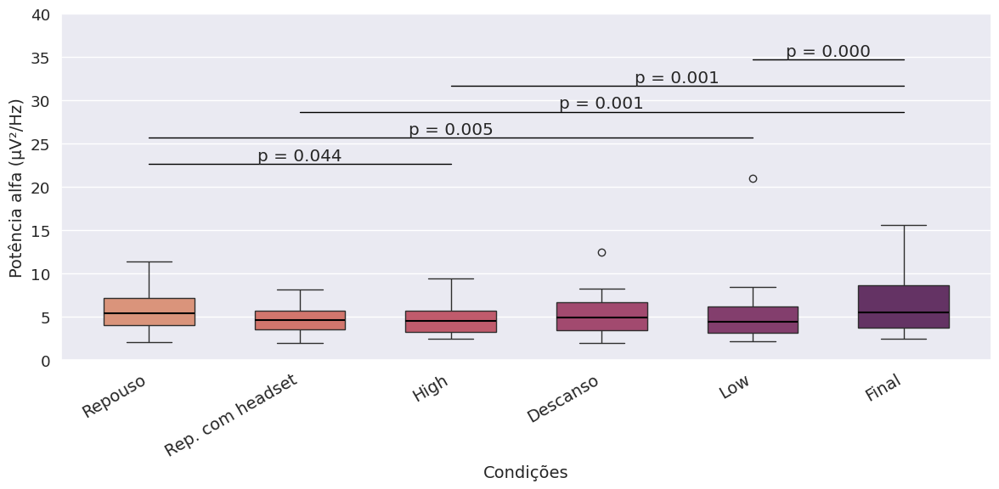

In [47]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_o2_alfa, palette="flare", width=0.6, medianprops={'linewidth':1.5,'color':'black'})

# Anotar comparações significativas do Nemenyi
y2_max = ph_data_o2_alfa.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}

# Identificar pares significativos (p < 0.05)
for i in range(len(ph_o2_alfa.columns)):
    for j in range(i + 1, len(ph_o2_alfa.columns)):
        p_val = ph_o2_alfa.iloc[i, j]

        # Determinar o nível de significância e o estilo de linha
        line_style, line_color = None, 'black'
        for alpha, style in line_styles.items():
            if p_val < alpha:
                line_style, line_color = style
                break

        if line_style:  # Se for significativo
            group_key = tuple(sorted((i, j)))  # Create a unique key for each group
            if group_key not in y_offsets:
                y_offsets[group_key] = len(y_offsets) * 3  # Calculate y-offset

            current_y = y2_max * 0.9 + y_offsets[group_key]  # Adjust y position
            significativas2.append((i, j, p_val))
            plt.plot([i, j], [current_y, current_y], color=line_color, ls=line_style, lw=1)
            plt.text((i + j) / 2, current_y * 1, f"p = {p_val:.3f}", ha='center', va='bottom')


ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
# Set xticks with both locations and labels
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=14)
plt.xlabel("Condições", fontsize=14)
plt.ylabel("Potência alfa (μV²/Hz)", fontsize=14)
plt.ylim(0,40)
plt.tight_layout()
plt.show()

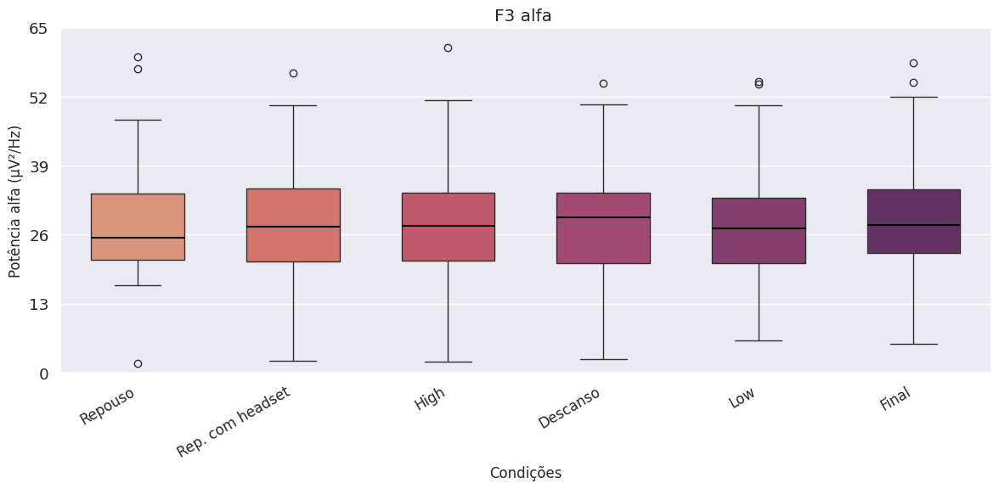

In [48]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_f3_alfa, palette="flare", width=0.6, medianprops={'linewidth':1.5,'color':'black'})

# Anotar comparações significativas do Nemenyi
y2_max = ph_data_f3_alfa.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}



ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
y_ticks = np.arange(0, 66, 13)
plt.yticks(y_ticks)
# Set xticks with both locations and labels
plt.title("F3 alfa ")
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=12)
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência alfa (μV²/Hz)", fontsize=12)
plt.ylim(0,65)
plt.tight_layout()
plt.show()

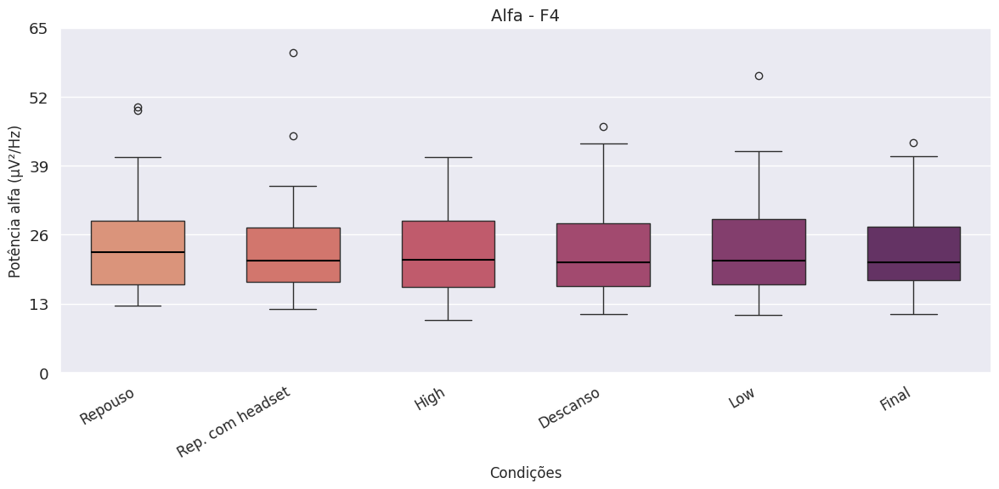

In [49]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=ph_data_f4_alfa, palette="flare", width=0.6,  medianprops={'linewidth':1.5,'color':'black'})

# Anotar comparações significativas do Nemenyi
y2_max = ph_data_f4_alfa.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}



plt.title("Alfa - F4", fontsize=14)
ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
y_ticks = np.arange(0, 66, 13)
plt.yticks(y_ticks)
# Set xticks with both locations and labels
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=12)
plt.xlabel("Condições", fontsize=12)
plt.ylabel("Potência alfa (μV²/Hz)", fontsize=12)
plt.ylim(0,65)
plt.tight_layout()
plt.show()

/tmp/ipython-input-1847981450.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-1847981450.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)


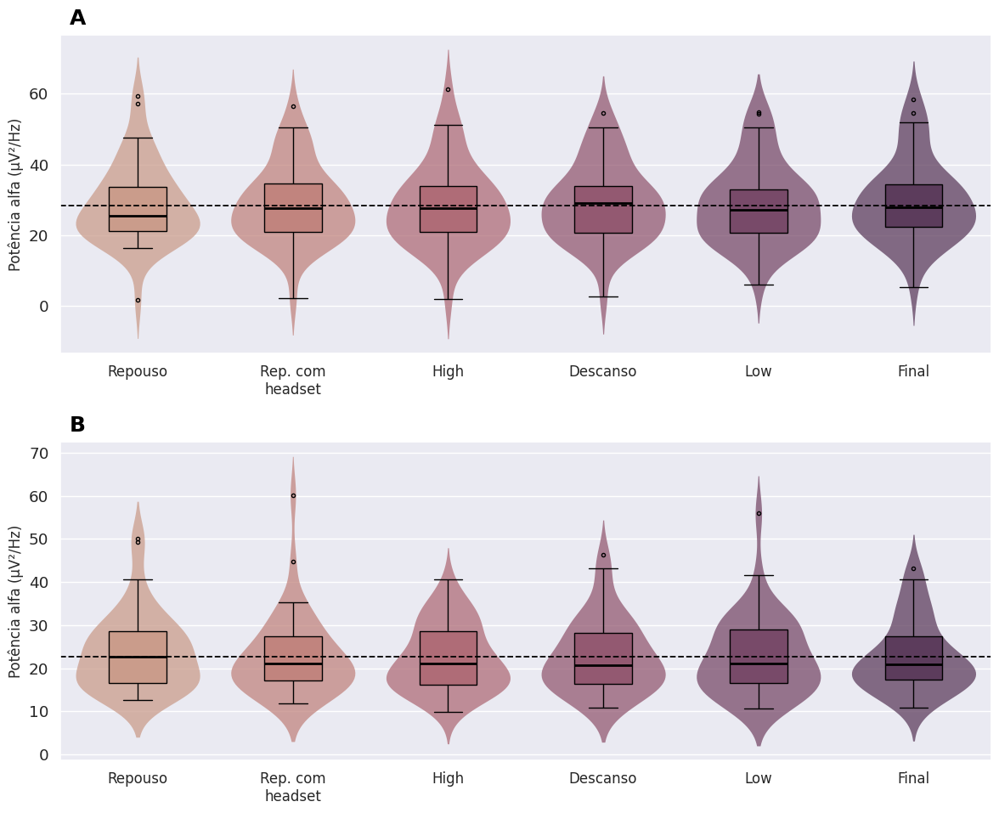

In [50]:
fig_fro_a, axes_fro_a = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Para facilitar o uso no loop, "achatamos" a grade 2x2 em uma lista simples de 4 eixos
flat_axes_fro_a = axes_fro_a.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_fro_a = [ph_data_f3_alfa,ph_data_f4_alfa]
mean_fro_a = [f3_alfa_melt['Valor'].mean(),f4_alfa_melt['Valor'].mean()]
titles_fro_a = ['A','B']
x_labels=['Repouso', 'Rep. com\nheadset', 'High', 'Descanso','Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_fro_a)):
    data = datasets_fro_a[i]
    ax = flat_axes_fro_a[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_fro_a[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data,  palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_fro_a[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)


# Adiciona um espaçamento para evitar que os títulos se sobreponham
plt.tight_layout(rect=[0, 0, 1, 0.98])


# Exibe a figura final
plt.show()

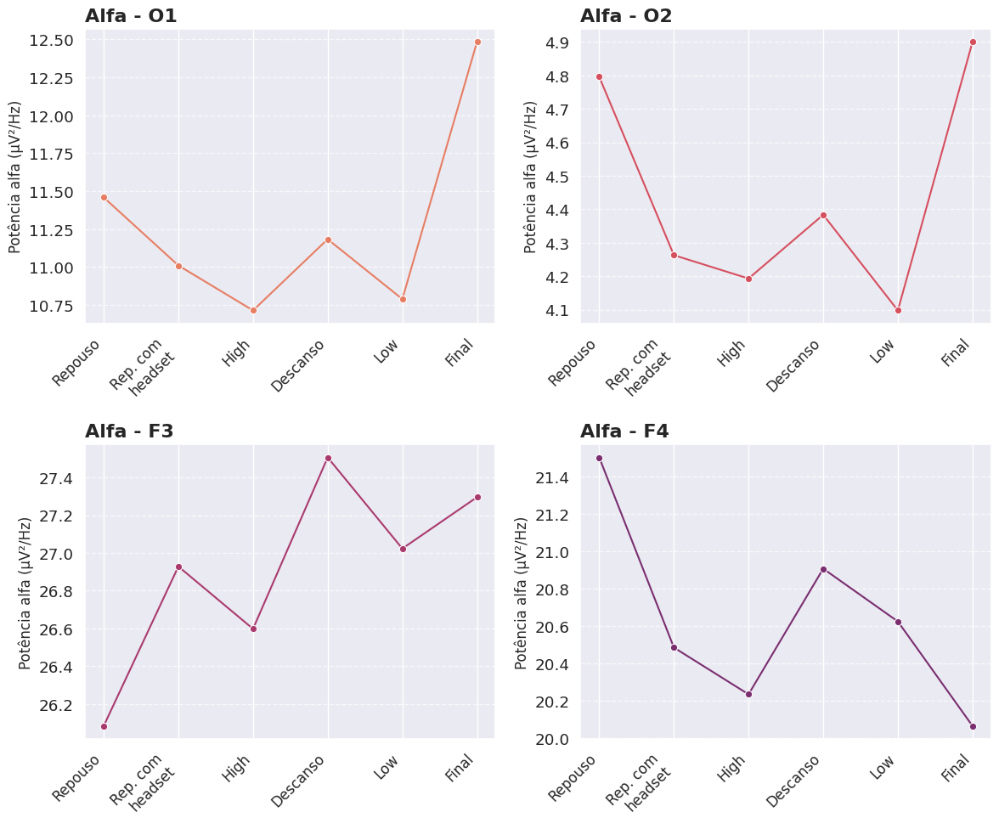

In [51]:
fig_occ_a, axes_occ_a = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
flat_axes_occ_a = axes_occ_a.flatten()


# --- 2. DADOS E METADADOS PARA O LOOP ---
datasets_occ_a = [o1_alfa_melt, o2_alfa_melt,f3_alfa_melt,f4_alfa_melt]
plot_titles = ['Alfa - O1', 'Alfa - O2', 'Alfa - F3','Alfa - F4'] # Títulos mais descritivos
x_labels = ['Repouso', 'Rep. com\nheadset', 'High', 'Descanso', 'Low', 'Final']
flare = sns.color_palette('flare',n_colors=len(datasets_occ_a))
# --- 3. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i, data in enumerate(datasets_occ_a):
    ax = flat_axes_occ_a[i] # Seleciona o eixo atual (ax[0], ax[1], ...)

    # --- INTEGRAÇÃO DO CÓDIGO INDIVIDUAL AQUI ---
    # Use 'ax=ax' para dizer ao Seaborn onde desenhar o gráfico
    sns.lineplot(
        x='Condição',
        y='Valor',
        data=data,
        estimator='median', # Usa a mediana
        errorbar=None,      # Sem barra de erro
        marker='o',         # Marcador de círculo
        color=flare[i],    # Cor específica para este subplot
        ax=ax               # **O passo mais importante!**
    )
    # ---------------------------------------------

    # --- CUSTOMIZAÇÃO DO SUBPLOT ATUAL (ax) ---
    ax.set_title(plot_titles[i], fontsize=16, fontweight='bold', loc='left')
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xlabel(None) # Remove o rótulo do eixo X para não poluir

    # Define a posição e os rótulos do eixo X
    ax.set_xticks(range(len(x_labels))) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12)

    # Adiciona grid para melhor visualização
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Oculta os eixos que não foram usados (se houver)
for i in range(len(datasets_occ_a), len(flat_axes_occ_a)):
    flat_axes_occ_a[i].set_visible(False)


# Melhora o espaçamento entre os gráficos
plt.tight_layout()


### Wilcoxon entre vídeos apenas

In [52]:
k_o1alfa, p_o1alfa = wilcoxon(o1_alfa['o1high'],o1_alfa['o1low'])
k_o2alfa, p_o2alfa = wilcoxon(o2_alfa['o2high'],o2_alfa['o2low'])
k_f3alfa, p_f3alfa = wilcoxon(f3_alfa['f3high'],f3_alfa['f3low'])
k_f4alfa, p_f4alfa = wilcoxon(f4_alfa['f4high'],f4_alfa['f4low'])
print("Comparação (wilcoxon) entre vídeos por canal - alfa")
print('O1')
print("valor estatístico do teste:",k_o1alfa)
print("p-valor:",p_o1alfa)
print('O2')
print("valor estatístico do teste:",k_o2alfa)
print("p-valor:",p_o2alfa)
print('F3')
print("valor estatístico do teste:",k_f3alfa)
print("p-valor:",p_f3alfa)
print('F4')
print("valor estatístico do teste:",k_f4alfa)
print("p-valor:",p_f4alfa)

Comparação (wilcoxon) entre vídeos por canal - alfa
O1
valor estatístico do teste: 25342.0
p-valor: 0.0002973748610618007
O2
valor estatístico do teste: 29899.0
p-valor: 0.1897579692277358
F3
valor estatístico do teste: 29595.0
p-valor: 0.14288035120127626
F4
valor estatístico do teste: 30074.0
p-valor: 0.22143222472776325


In [53]:
ph_data_o1= o1_alfa[['o1high',  'o1low']].values
ph_data_o2= o2_alfa[['o2high',  'o2low']].values
ph_data_f3= f3_alfa[['f3high',  'f3low']].values
ph_data_f4= f4_alfa[['f4high',  'f4low']].values

In [54]:
ph_data_o1_a = pd.DataFrame(ph_data_o1, columns=['High','Low'])
data_o1_a_melt = ph_data_o1_a.melt(var_name='Condição', value_name='Valor')
data_o1_a_melt

,Condição,Valor
0,High,11.151365
1,High,10.049642
2,High,16.113673
3,High,11.537047
4,High,13.675409
...,...,...
715,Low,11.156367
716,Low,7.709607
717,Low,33.311465
718,Low,6.039744


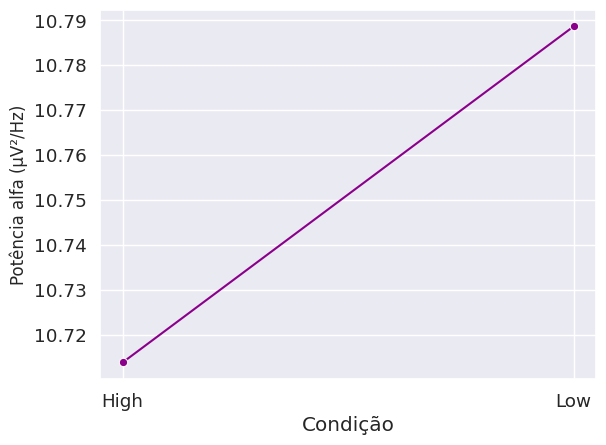

In [55]:
sns.lineplot(x='Condição', y='Valor', data=data_o1_a_melt, estimator='median', errorbar=None, marker='o', color='darkmagenta')
plt.ylabel('Potência alfa (μV²/Hz)',fontsize=12)
plt.show()

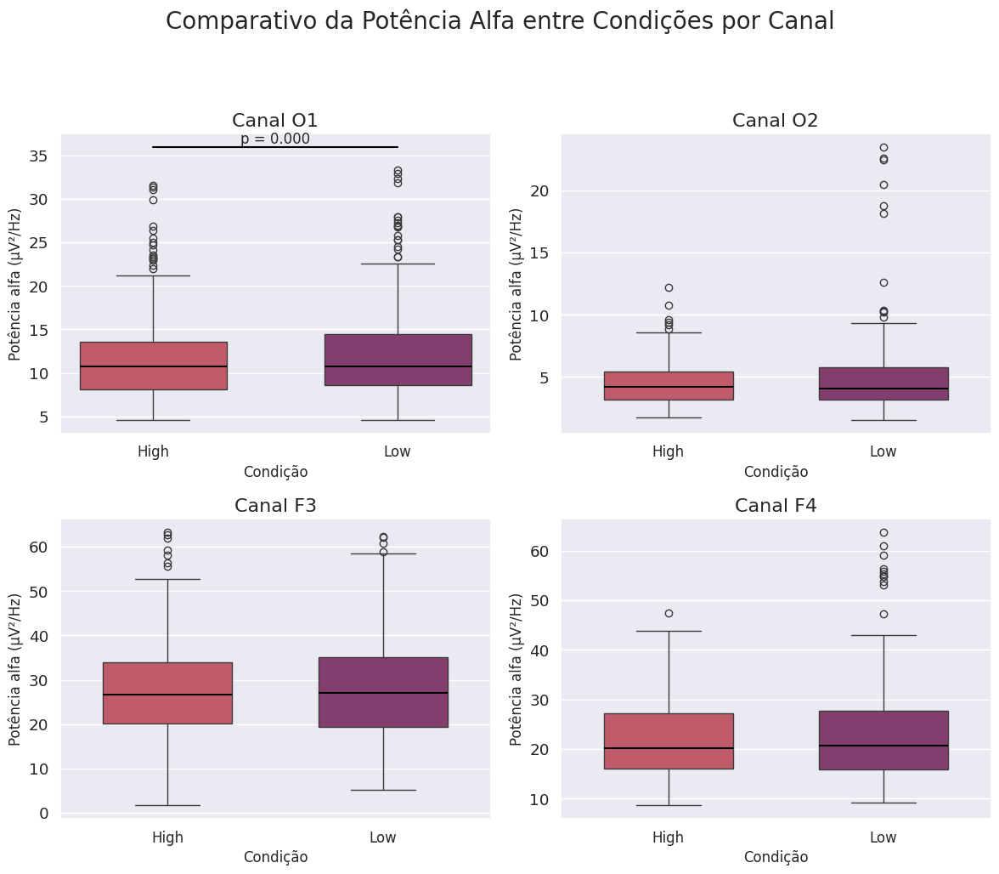

In [56]:
# FIGURAS COM SUBPLOTS
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Para facilitar o uso no loop, "achatamos" a grade 2x2 em uma lista simples de 4 eixos
flat_axes = axes.flatten()
cores_paleta = ['#d14a61', '#8f3371']
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets = [ph_data_o1, ph_data_o2, ph_data_f3, ph_data_f4]
p_values = [p_o1alfa, p_o2alfa, p_f3alfa, p_f4alfa]
titles = ['Canal O1', 'Canal O2', 'Canal F3', 'Canal F4']
x_labels = ['High', 'Low'] # Rótulos para cada boxplot

# --- 4. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i in range(len(datasets)):
    data = datasets[i]
    p_val = p_values[i]
    ax = flat_axes[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.boxplot(data=data,
                palette=cores_paleta,
                width=0.6,
                medianprops={'linewidth': 1.5, 'color': 'black'},
                ax=ax)

    # Adicionar anotação de p-valor, se for significativo
    if p_val < 0.05:
        # Posição Y da linha de anotação
        y_max = np.max(data) * 1.08

        # Use os métodos do eixo (ax.plot, ax.text) em vez de plt
        ax.plot([0, 1], [y_max, y_max], color='black', lw=1.5)
        ax.text(0.5, y_max, f"p = {p_val:.3f}", ha='center', va='bottom', fontsize=12)

    # Customizar cada subplot individualmente
    ax.set_title(title, fontsize=16)
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xlabel("Condição", fontsize=12)
    ax.set_xticks([0, 1]) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, fontsize=12) # Define os rótulos dos ticks


# --- 5. AJUSTES FINAIS DA FIGURA ---

# Adiciona um título geral para a figura inteira
fig.suptitle("Comparativo da Potência Alfa entre Condições por Canal", fontsize=20, y=1.03)

# Ajusta o espaçamento entre os subplots para evitar sobreposição
plt.tight_layout(rect=[0, 0, 1, 0.98]) # rect ajusta para o suptitle caber

# Exibe a figura final
plt.show()

## Assimetria - alfa sem ordem

In [57]:
o1rep_alfa = alfa_eeg_psd['o1rep']
o2rep_alfa = alfa_eeg_psd['o2rep']
f3rep_alfa = alfa_eeg_psd['f3rep']
f4rep_alfa = alfa_eeg_psd['f4rep']
afa_rep = (f4rep_alfa - f3rep_alfa)/(f4rep_alfa + f3rep_alfa)

print('afa repouso')
print(afa_rep)
o1baseoc_alfa = alfa_eeg_psd['o1baseoc']
o2baseoc_alfa = alfa_eeg_psd['o2baseoc']
f3baseoc_alfa = alfa_eeg_psd['f3baseoc']
f4baseoc_alfa = alfa_eeg_psd['f4baseoc']
afa_baseoc = (f4baseoc_alfa - f3baseoc_alfa)/(f4baseoc_alfa + f3baseoc_alfa)

print('afa baseoc')
print(afa_baseoc)
o1high_alfa = alfa_eeg_psd['o1high']
o2high_alfa = alfa_eeg_psd['o2high']
f3high_alfa = alfa_eeg_psd['f3high']
f4high_alfa = alfa_eeg_psd['f4high']
afa_high = (f4high_alfa - f3high_alfa)/(f4high_alfa + f3high_alfa)

print('afa high')
print(afa_high)
o1desc_alfa = alfa_eeg_psd['o1desc']
o2desc_alfa = alfa_eeg_psd['o2desc']
f3desc_alfa = alfa_eeg_psd['f3desc']
f4desc_alfa = alfa_eeg_psd['f4desc']
afa_desc = (f4desc_alfa - f3desc_alfa)/(f4desc_alfa + f3desc_alfa)

print('afa desc')
print(afa_desc)
o1low_alfa = alfa_eeg_psd['o1low']
o2low_alfa = alfa_eeg_psd['o2low']
f3low_alfa = alfa_eeg_psd['f3low']
f4low_alfa = alfa_eeg_psd['f4low']
afa_low = (f4low_alfa - f3low_alfa)/(f4low_alfa + f3low_alfa)

print('afa low')
print(afa_low)
o1final_alfa = alfa_eeg_psd['o1final']
o2final_alfa = alfa_eeg_psd['o2final']
f3final_alfa = alfa_eeg_psd['f3final']
f4final_alfa = alfa_eeg_psd['f4final']
afa_final = (f4final_alfa - f3final_alfa)/(f4final_alfa + f3final_alfa)

print('afa final')
print(afa_final)
afa_total = pd.concat([afa_rep, afa_baseoc, afa_high, afa_desc, afa_low, afa_final], axis=0, ignore_index=True)
o1_pot = pd.concat([alfa_eeg_psd['Participante'],o1rep_alfa, o1baseoc_alfa, o1high_alfa, o1desc_alfa, o1low_alfa, o1final_alfa], axis=1)
o2_pot = pd.concat([alfa_eeg_psd['Participante'],o2rep_alfa, o2baseoc_alfa, o2high_alfa, o2desc_alfa, o2low_alfa, o2final_alfa], axis=1)



afa repouso
0     -0.230371
1     -0.154982
2      0.048560
3     -0.132725
4      0.216549
         ...   
355   -0.088825
356   -0.191033
357   -0.374479
358   -0.113391
359   -0.161819
Length: 360, dtype: float64
afa baseoc
0     -0.273164
1     -0.181001
2      0.106021
3     -0.065590
4      0.084686
         ...   
355   -0.065011
356   -0.279355
357   -0.425597
358   -0.148301
359   -0.225714
Length: 360, dtype: float64
afa high
0     -0.321370
1     -0.230180
2     -0.041607
3      0.161914
4      0.094332
         ...   
355    0.017726
356   -0.262414
357   -0.261948
358   -0.183055
359   -0.387235
Length: 360, dtype: float64
afa desc
0     -0.136762
1     -0.097439
2      0.086249
3     -0.040687
4     -0.091077
         ...   
355   -0.127892
356   -0.258634
357   -0.213943
358   -0.221406
359   -0.285035
Length: 360, dtype: float64
afa low
0     -0.320827
1     -0.158992
2      0.204130
3     -0.078083
4     -0.001554
         ...   
355    0.110488
356   -0.266043
357   -

In [58]:
o1_pot_long = pd.melt(
    o1_pot,
    id_vars=['Participante'],
    var_name='Condição',
    value_name='Potência'
)
o2_pot_long=pd.melt(o2_pot,id_vars=['Participante'], var_name='Condição',
                    value_name='Potência')
o1_pot_long

,Participante,Condição,Potência
0,PT_22,o1rep,9.909395
1,PT_23,o1rep,9.441885
2,PT_24,o1rep,18.291697
3,PT_25,o1rep,9.556272
4,PT_26,o1rep,13.650237
...,...,...,...
2155,PT_48,o1final,11.336264
2156,PT_49,o1final,13.061944
2157,PT_50,o1final,17.986908
2158,PT_01,o1final,10.229782


In [59]:
occ_med = (o1_pot_long['Potência']+o2_pot_long['Potência'])/2
occ_med_part = pd.concat([o2_pot_long['Participante'], occ_med], axis=1)
occ_med_part = occ_med_part.sort_values(by='Participante').reset_index(drop=True)
occ_med_part

,Participante,Potência
0,PT_01,5.982859
1,PT_01,5.785058
2,PT_01,6.248431
3,PT_01,5.552493
4,PT_01,4.512575
...,...,...
2155,PT_50,9.538667
2156,PT_50,25.312196
2157,PT_50,27.475095
2158,PT_50,13.233656


In [60]:
afa_corr_tb = afa_total.copy()
afa_wide_ord=[afa_rep, afa_baseoc, afa_high, afa_desc, afa_low, afa_final]
afa_corr_tb = pd.concat([alfa_eeg_psd['Participante'], afa_rep, afa_baseoc, afa_high, afa_desc, afa_low, afa_final], axis=1)
afa_corr_tb = afa_corr_tb.rename(columns={0: 'Frep', 1: 'Fbaseoc', 2: 'Fhigh', 3: 'Fdesc', 4: 'Flow', 5: 'Ffinal'})
afa_corr_tb

,Participante,Frep,Fbaseoc,Fhigh,Fdesc,Flow,Ffinal
0,PT_22,-0.230371,-0.273164,-0.321370,-0.136762,-0.320827,-0.353950
1,PT_23,-0.154982,-0.181001,-0.230180,-0.097439,-0.158992,0.014164
2,PT_24,0.048560,0.106021,-0.041607,0.086249,0.204130,-0.000277
3,PT_25,-0.132725,-0.065590,0.161914,-0.040687,-0.078083,0.145785
4,PT_26,0.216549,0.084686,0.094332,-0.091077,-0.001554,0.004593
...,...,...,...,...,...,...,...
355,PT_48,-0.088825,-0.065011,0.017726,-0.127892,0.110488,0.000350
356,PT_49,-0.191033,-0.279355,-0.262414,-0.258634,-0.266043,-0.152085
357,PT_50,-0.374479,-0.425597,-0.261948,-0.213943,-0.324634,-0.354598
358,PT_01,-0.113391,-0.148301,-0.183055,-0.221406,-0.251021,-0.345081


In [61]:
afa_long = pd.melt(
    afa_corr_tb,
    id_vars=['Participante'],
    var_name='Condição',
    value_name='Afa'
)
afa_long = afa_long.drop(columns=['Condição'])
afa_long = afa_long.sort_values(by='Participante').reset_index(drop=True)
afa_long

,Participante,Afa
0,PT_01,-0.171863
1,PT_01,-0.206466
2,PT_01,-0.139955
3,PT_01,-0.161467
4,PT_01,-0.172696
...,...,...
2155,PT_50,-0.244985
2156,PT_50,-0.283412
2157,PT_50,-0.296314
2158,PT_50,-0.302572


In [62]:
afa_conds = pd.concat([afa_rep, afa_baseoc, afa_high, afa_desc, afa_low, afa_final], axis=1)
norm_afa = shapiro(afa_conds)
print("AFA")
print(norm_afa)

f_afa, p_afa = friedmanchisquare(*afa_conds.T)

print(f_afa)
print(p_afa)

AFA
ShapiroResult(statistic=np.float64(0.8968702324541867), pvalue=np.float64(7.970318096750466e-36))
359.0
0.49007410084295355


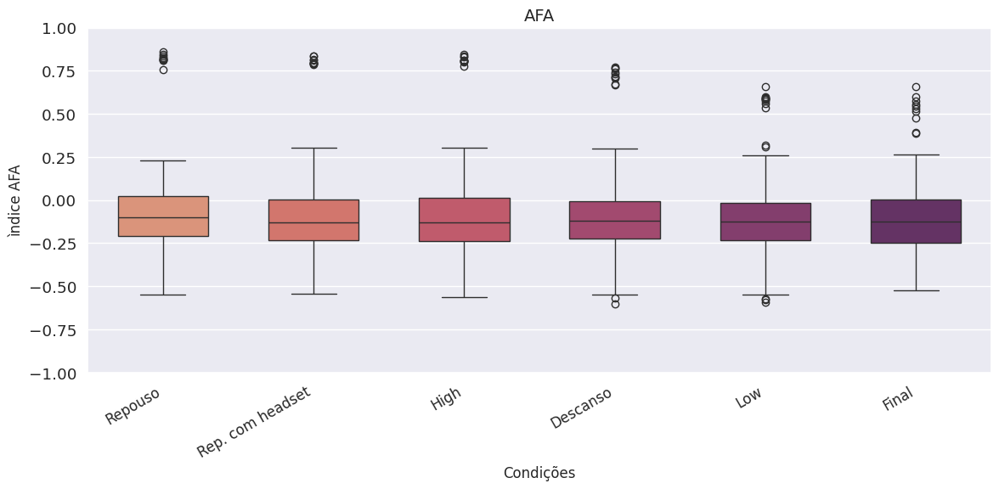

In [63]:
plt.figure(figsize=(12, 6))

# 1. Boxplot de todos os grupos
sns.boxplot(data=afa_conds, palette="flare", width=0.6)

# Anotar comparações significativas do Nemenyi
y2_max = afa_conds.max().max() * 1.2  # Base height for significance lines
significativas2 = []
y_offsets = {}  # Dictionary to store y-offsets for each group

# Dicionário para mapear níveis de significância para estilos de linha
line_styles = {
    0.05: ('-', 'black'),
    0.001: ('--', 'black'),
}



plt.title("AFA", fontsize=14)
ticks = ['Repouso', 'Rep. com headset','High','Descanso','Low','Final']
x_ticks = range(len(ticks))
# Set xticks with both locations and labels
plt.xticks(ticks=x_ticks, labels=ticks, rotation=30, ha='right', fontsize=12)
plt.xlabel("Condições", fontsize=12)
plt.ylabel("ìndice AFA", fontsize=12)
plt.ylim(-1,1)
plt.tight_layout()
plt.show()

## Correlação Spearman

In [64]:
afa_corr_occ = pd.concat([afa_long, occ_med_part],axis=1).reset_index(drop=True)
afa_corr_occ

,Participante,Afa,Participante,Potência
0,PT_01,-0.171863,PT_01,5.982859
1,PT_01,-0.206466,PT_01,5.785058
2,PT_01,-0.139955,PT_01,6.248431
3,PT_01,-0.161467,PT_01,5.552493
4,PT_01,-0.172696,PT_01,4.512575
...,...,...,...,...
2155,PT_50,-0.244985,PT_50,9.538667
2156,PT_50,-0.283412,PT_50,25.312196
2157,PT_50,-0.296314,PT_50,27.475095
2158,PT_50,-0.302572,PT_50,13.233656


In [65]:
afa =afa_long['Afa']
occ_ = occ_med_part['Potência']

In [66]:
from scipy.stats import spearmanr

In [67]:
afa_occ = pd.concat([afa, occ_], axis=1)
afa_occ

,Afa,Potência
0,-0.171863,5.982859
1,-0.206466,5.785058
2,-0.139955,6.248431
3,-0.161467,5.552493
4,-0.172696,4.512575
...,...,...
2155,-0.244985,9.538667
2156,-0.283412,25.312196
2157,-0.296314,27.475095
2158,-0.302572,13.233656


In [68]:
c_corr_afa,p_corr_afa = spearmanr(afa,occ_)

print(f'r={c_corr_afa}')
print(f'p={p_corr_afa}')


r=-0.175912949941333
p=1.791672270714309e-16


(-1.0, 1.0)

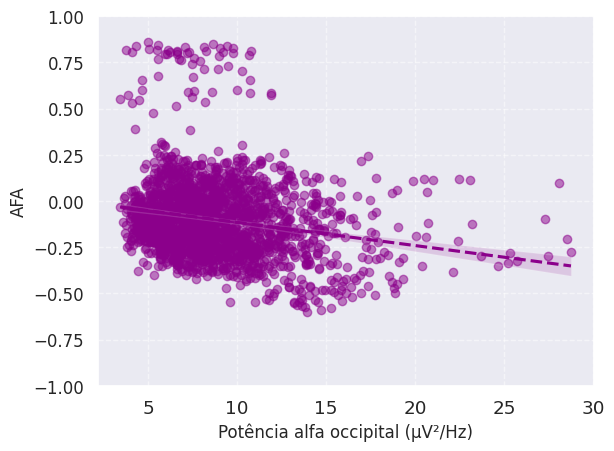

In [69]:
sns.regplot(
    data=afa_occ,
    x='Potência',
    y='Afa',
    color='darkmagenta', # Define a cor base para os pontos e a linha
    scatter_kws={'alpha': 0.5}, # Deixa os pontos semi-transparentes
    line_kws={'linestyle': '--'} # Deixa a linha de regressão tracejada
)

# 3. Adicione títulos e rótulos
plt.ylabel('AFA', fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Potência alfa occipital (μV²/Hz)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.ylim(-1,1)

# Frequência beta (13-30)

In [70]:
beta_eeg_psd = tp_eeg_psd[683:2296]
beta_eeg_psd = beta_eeg_psd.reset_index(drop=True)
beta_eeg_potabs = tp_eeg_filt_potabs[683:2296]
beta_eeg_potabs = beta_eeg_potabs.reset_index(drop=True)
#beta_eeg_psd.to_excel('beta_eeg_psd.xlsx')
#files.download('beta_eeg_psd.xlsx')


In [71]:
beta_eeg_psd['Participante'].unique()

array(['PT_04', 'PT_05', 'PT_06', 'PT_07', 'PT_10', 'PT_11', 'PT_12',
       'PT_14', 'PT_15', 'PT_16', 'PT_17', 'PT_18', 'PT_19', 'PT_20',
       'PT_21', 'PT_22', 'PT_23', 'PT_24', 'PT_25', 'PT_26', 'PT_27',
       'PT_29', 'PT_30', 'PT_31', 'PT_32', 'PT_33', 'PT_34', 'PT_35',
       'PT_37', 'PT_40', 'PT_41', 'PT_43', 'PT_44', 'PT_45', 'PT_46',
       'PT_48', 'PT_49', 'PT_50', 'PT_01', 'PT_02', 'PT_03'], dtype=object)

## Potência absoluta

In [72]:
## Para calcular poder de beta baixa
# Definir as colunas de interesse
colunas_total = beta_eeg_potabs.columns  # Todas as colunas
canal_cond = colunas_total[4:]

poder_beta = []

for grupo, dados in beta_eeg_potabs.groupby('Participante'):
    grupo_resultados_beta = {'Grupo': grupo}  # Dicionário para armazenar os resultados do grupo

    for coluna in canal_cond:  # Itera sobre cada coluna
        somas_beta = dados[coluna].sum()

        # Armazenar os resultados
        grupo_resultados_beta[f'{coluna}'] = somas_beta

    # Adicionar ao resultado final
    poder_beta.append(grupo_resultados_beta)

# Criar um DataFrame com os resultados
poder_beta_df = pd.DataFrame(poder_beta)
poder_beta_df = poder_beta_df.rename(columns={'Grupo': 'Participante'})
poder_beta_df

,Participante,o1rep,o2rep,f3rep,f4rep,o1baseoc,o2baseoc,f3baseoc,f4baseoc,o1high,...,f3desc,f4desc,o1low,o2low,f3low,f4low,o1final,o2final,f3final,f4final
0,PT_01,121.862546,34.571230,280.303665,164.497986,119.217228,29.632960,293.615846,180.992467,113.358844,...,327.918438,232.660638,112.814502,29.716347,296.122369,163.985867,97.046543,22.094706,298.745662,158.195070
1,PT_02,130.127037,60.578831,350.444713,204.756083,164.917005,54.787570,406.599928,193.285444,151.240102,...,422.427304,197.448211,155.534957,53.954100,396.159716,195.554931,176.530801,66.184164,457.057137,247.806233
2,PT_03,174.097544,37.791978,463.556415,226.562314,158.471797,35.332541,365.994710,235.440319,169.104256,...,514.826133,249.153443,181.109462,34.314317,534.648058,251.792437,220.063480,42.758735,684.608197,271.012080
3,PT_04,191.817706,30.604951,479.076912,349.769871,194.883067,29.463511,542.083040,336.010982,203.695729,...,566.386604,335.757350,188.833277,25.567606,503.754826,342.987272,204.717737,28.621675,567.800005,353.205219
4,PT_05,209.505636,40.675698,344.235734,205.602161,249.149525,44.409307,443.595052,245.086107,250.706964,...,423.648864,253.304095,264.659476,40.787598,419.578034,232.481488,327.356403,42.051543,480.830708,223.664126
5,PT_06,165.136981,57.882754,432.983598,259.170409,173.510937,54.955678,502.274172,255.391350,194.072958,...,500.512096,246.719778,188.506200,56.154871,497.832747,251.842708,182.576422,65.758345,428.043176,225.414016
6,PT_07,121.943066,25.502412,293.221906,278.210585,124.961169,37.494318,295.715168,282.119087,214.124678,...,295.349428,256.149277,141.088152,52.948609,285.925611,241.115694,107.743918,30.883953,242.295377,221.846575
7,PT_10,202.231426,38.634714,317.378720,351.562163,149.539890,48.772369,327.497221,264.807448,111.206937,...,225.624319,176.798898,112.580250,75.758360,236.206809,161.106643,97.268842,32.011963,222.456913,159.863671
8,PT_11,379.348531,67.453293,620.732573,349.170942,251.442969,54.809084,465.478175,302.444159,206.083006,...,381.306189,264.059093,228.873402,57.193495,411.880543,282.098667,201.928443,47.591949,384.154066,274.005526
9,PT_12,112.931250,45.699403,370.148400,267.407450,102.558715,45.638171,341.350178,269.272010,103.953404,...,307.939793,240.246024,92.983664,35.276726,305.139772,237.123606,94.880636,43.126169,300.092164,228.521370


## Potência relativa

In [73]:
perc_beta_df = pd.merge(poder_total_df, poder_beta_df, on='Participante', suffixes=('_total','_beta'))
perc_beta_df
cols_perc = ['o1rep', 'o2rep', 'f3rep', 'f4rep', 'o1baseoc', 'o2baseoc', 'f3baseoc', 'f4baseoc', 'o1high', 'o2high', 'f3high',
             'f4high', 'o1desc', 'o2desc', 'f3desc', 'f4desc', 'o1low', 'o2low', 'f3low', 'f4low', 'o1final', 'o2final', 'f3final', 'f4final']

for col in cols_perc:
  col_total =f'{col}_total'
  col_beta = f'{col}_beta'
  perc_beta_df[f'{col}_porc'] = (perc_beta_df[col_beta] / perc_beta_df[col_total])*100

cols_remove_beta = [col for col in perc_beta_df.columns if col.endswith('_total') or col.endswith('_beta')]
perc_beta_df = perc_beta_df.drop(columns=cols_remove_beta)
perc_beta_df


,Participante,o1rep_porc,o2rep_porc,f3rep_porc,f4rep_porc,o1baseoc_porc,o2baseoc_porc,f3baseoc_porc,f4baseoc_porc,o1high_porc,...,f3desc_porc,f4desc_porc,o1low_porc,o2low_porc,f3low_porc,f4low_porc,o1final_porc,o2final_porc,f3final_porc,f4final_porc
0,PT_01,51.575281,37.718651,46.422158,44.995238,54.400551,45.286017,48.297559,48.214016,51.070716,...,50.384424,48.198522,52.530254,44.994331,48.266075,46.528467,45.336742,33.846936,47.267211,44.064551
1,PT_02,47.028299,43.656840,47.499632,45.149138,46.992346,39.515001,49.076052,44.350925,46.601354,...,49.809666,42.830086,45.253062,39.480446,49.053618,44.210807,46.820626,41.695313,49.691493,45.975243
2,PT_03,49.851462,42.606650,52.452134,50.718515,49.625369,44.665981,50.423990,50.818548,52.373147,...,56.428624,49.860185,53.256225,42.797646,56.432656,50.968759,54.027301,38.901321,57.133963,54.110607
3,PT_04,55.316448,48.326885,52.362186,50.128094,54.610458,47.000237,55.202420,51.973566,54.451123,...,56.518734,53.101706,56.436383,44.406844,57.786281,54.532237,55.602586,46.930096,55.978795,55.938875
4,PT_05,53.354999,43.417605,53.906862,51.844021,52.102937,47.613485,54.110622,52.986646,52.265829,...,52.265356,53.837446,52.758934,45.899704,51.264441,53.004744,52.178819,40.476589,54.060335,53.236742
5,PT_06,48.807605,39.628589,51.154466,46.432468,51.119786,46.059375,52.425829,48.836686,51.931420,...,52.444215,47.458427,52.893229,44.470707,51.897468,50.561134,48.379597,36.124309,49.547135,44.233002
6,PT_07,55.451910,40.032547,54.755831,53.828594,55.057915,48.671003,54.935827,55.959253,62.242461,...,56.321199,53.759910,58.361197,55.376279,55.701724,54.386408,52.378543,38.865513,53.076610,51.769328
7,PT_10,56.467835,43.564440,55.685451,55.327682,55.373741,51.308919,53.784370,53.485907,52.916249,...,53.528497,52.708830,49.223328,47.628854,43.293768,45.281997,52.054711,47.395484,53.880866,53.439247
8,PT_11,58.207225,54.164724,57.003720,52.206325,56.798281,53.587668,56.376054,54.938551,58.487289,...,55.497752,54.195886,57.295169,54.747468,57.340372,54.232791,56.258275,55.433920,53.739654,53.786184
9,PT_12,52.542775,50.779652,52.811612,52.484515,52.692668,53.653056,53.594975,51.778084,52.094431,...,51.307504,50.008893,47.402599,45.818826,52.908352,50.615686,43.214762,46.031493,48.271013,45.858135


In [74]:
o1_perc_beta = perc_beta_df[[col for col in perc_beta_df.columns if 'o1' in col]]
o1_perc_beta = o1_perc_beta.rename(columns={'o1rep_porc': 'o1rep', 'o1baseoc_porc': 'o1baseoc', 'o1high_porc': 'o1high', 'o1desc_porc': 'o1desc', 'o1low_porc': 'o1low', 'o1final_porc': 'o1final'})
o2_perc_beta = perc_beta_df[[col for col in perc_beta_df.columns if 'o2' in col]]
o2_perc_beta = o2_perc_beta.rename(columns={'o2rep_porc': 'o2rep', 'o2baseoc_porc': 'o2baseoc', 'o2high_porc': 'o2high', 'o2desc_porc': 'o2desc', 'o2low_porc': 'o2low', 'o2final_porc': 'o2final'})
f3_perc_beta = perc_beta_df[[col for col in perc_beta_df.columns if 'f3' in col]]
f3_perc_beta = f3_perc_beta.rename(columns={'f3rep_porc': 'f3rep', 'f3baseoc_porc': 'f3baseoc', 'f3high_porc': 'f3high', 'f3desc_porc': 'f3desc', 'f3low_porc': 'f3low', 'f3final_porc': 'f3final'})
f4_perc_beta = perc_beta_df[[col for col in perc_beta_df.columns if 'f4' in col]]
f4_perc_beta = f4_perc_beta.rename(columns={'f4rep_porc': 'f4rep', 'f4baseoc_porc': 'f4baseoc', 'f4high_porc': 'f4high', 'f4desc_porc': 'f4desc', 'f4low_porc': 'f4low', 'f4final_porc': 'f4final'})
df_perc_beta = pd.concat([o1_perc_beta, o2_perc_beta, f3_perc_beta, f4_perc_beta], axis=1)
df_perc_beta

,o1rep,o1baseoc,o1high,o1desc,o1low,o1final,o2rep,o2baseoc,o2high,o2desc,...,f3high,f3desc,f3low,f3final,f4rep,f4baseoc,f4high,f4desc,f4low,f4final
0,51.575281,54.400551,51.070716,53.823341,52.530254,45.336742,37.718651,45.286017,43.533500,46.421383,...,49.035952,50.384424,48.266075,47.267211,44.995238,48.214016,46.143031,48.198522,46.528467,44.064551
1,47.028299,46.992346,46.601354,48.031391,45.253062,46.820626,43.656840,39.515001,41.030840,38.809542,...,48.939577,49.809666,49.053618,49.691493,45.149138,44.350925,46.698166,42.830086,44.210807,45.975243
2,49.851462,49.625369,52.373147,50.127576,53.256225,54.027301,42.606650,44.665981,45.491991,44.989735,...,53.470710,56.428624,56.432656,57.133963,50.718515,50.818548,48.249479,49.860185,50.968759,54.110607
3,55.316448,54.610458,54.451123,56.460398,56.436383,55.602586,48.326885,47.000237,43.353643,49.663980,...,55.336234,56.518734,57.786281,55.978795,50.128094,51.973566,55.715492,53.101706,54.532237,55.938875
4,53.354999,52.102937,52.265829,53.133411,52.758934,52.178819,43.417605,47.613485,44.257889,50.471166,...,53.157283,52.265356,51.264441,54.060335,51.844021,52.986646,52.444493,53.837446,53.004744,53.236742
5,48.807605,51.119786,51.931420,52.182967,52.893229,48.379597,39.628589,46.059375,45.990430,41.937080,...,54.675313,52.444215,51.897468,49.547135,46.432468,48.836686,51.803019,47.458427,50.561134,44.233002
6,55.451910,55.057915,62.242461,52.875625,58.361197,52.378543,40.032547,48.671003,57.005609,44.414638,...,60.942600,56.321199,55.701724,53.076610,53.828594,55.959253,58.555663,53.759910,54.386408,51.769328
7,56.467835,55.373741,52.916249,52.305944,49.223328,52.054711,43.564440,51.308919,51.998474,53.153457,...,52.046278,53.528497,43.293768,53.880866,55.327682,53.485907,51.561651,52.708830,45.281997,53.439247
8,58.207225,56.798281,58.487289,55.428997,57.295169,56.258275,54.164724,53.587668,53.806435,53.636250,...,55.557054,55.497752,57.340372,53.739654,52.206325,54.938551,55.398360,54.195886,54.232791,53.786184
9,52.542775,52.692668,52.094431,48.443239,47.402599,43.214762,50.779652,53.653056,47.193849,48.623830,...,52.332160,51.307504,52.908352,48.271013,52.484515,51.778084,51.295790,50.008893,50.615686,45.858135


In [75]:
o1_perc_melt_beta = pd.melt(o1_perc_beta, var_name='Variável', value_name='Porcentagem')
o2_perc_melt_beta = pd.melt(o2_perc_beta, var_name='Variável', value_name='Porcentagem')
f3_perc_melt_beta = pd.melt(f3_perc_beta, var_name='Variável', value_name='Porcentagem')
f4_perc_melt_beta = pd.melt(f4_perc_beta, var_name='Variável', value_name='Porcentagem')
df_perc_beta_melt = pd.concat([o1_perc_melt_beta, o2_perc_melt_beta, f3_perc_melt_beta, f4_perc_melt_beta], axis=0)


In [76]:
df_perc_beta_melt['Canal'] = df_perc_beta_melt['Variável'].str[:2]
df_perc_beta_melt['Condição'] = df_perc_beta_melt['Variável'].str[2:]


/tmp/ipython-input-450012633.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_beta.set_xticklabels([nom_cond.get(label, label) for label in x_tick_labels_beta])


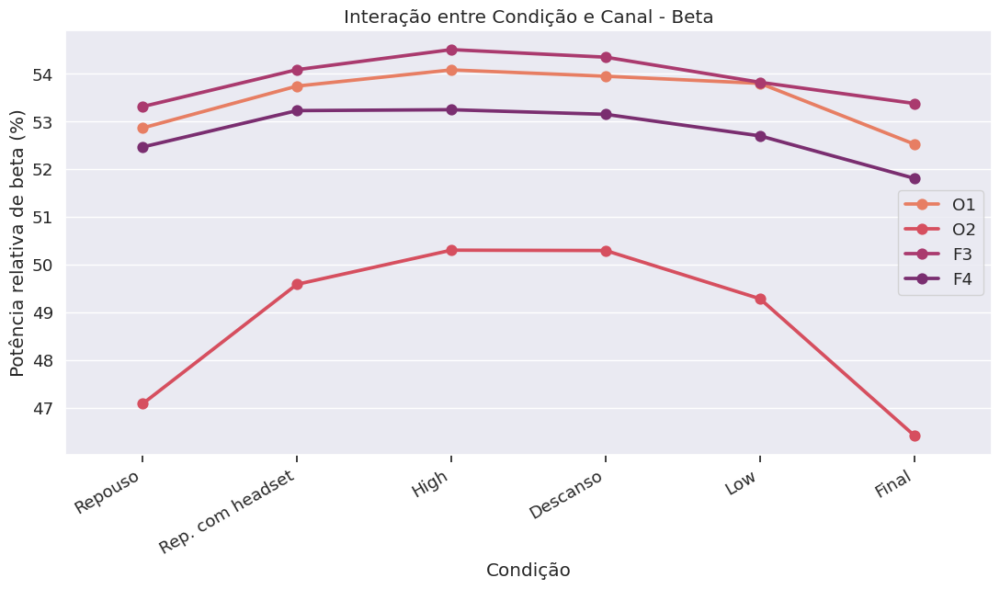

In [77]:
# Gráfico de interação entre Condição e Ordem --> correlação de beta baixa E AFA///E VFC (RMSSD e HF)
plt.figure(figsize=(13, 6))
ax_beta= sns.pointplot(x='Condição', y='Porcentagem', hue='Canal', data=df_perc_beta_melt, palette='flare', errorbar =None)
handles,labels_leg = ax_beta.get_legend_handles_labels()
labels_leg = ['O1','O2','F3','F4']
plt.legend(handles,labels_leg,loc='best')
nom_cond = {'rep': 'Repouso', 'baseoc': 'Rep. com headset', 'high': 'High', 'desc': 'Descanso', 'low': 'Low', 'final': 'Final'}

# Get the current x-tick labels as strings
x_tick_labels_beta = [t.get_text() for t in ax_beta.get_xticklabels()]

# Set the desired x-tick labels from nom_cond
ax_beta.set_xticklabels([nom_cond.get(label, label) for label in x_tick_labels_beta])
plt.setp(ax_beta.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.tick_params(axis='x', which='both', bottom=True, labelbottom=True)
plt.title('Interação entre Condição e Canal - Beta')
plt.ylabel('Potência relativa de beta (%)')
plt.show()
#plt.savefig('Interação entre Condição e Canal.png')
#files.download('Interação entre Condição e Canal.png')

## Frequência Dominante

In [78]:
## Para calcular frequência dominante dentro do poder total
freq_dom_beta = []

for grupo, dados in beta_eeg_psd.groupby('Participante'):
    grupo_freqdom_beta = {'Grupo': grupo}  # Dicionário para armazenar os resultados do grupo

    for coluna in canal_cond:  # Itera sobre cada coluna
        # Encontrar o maior valor na coluna atual
        maior_potencia_beta = dados[coluna].max()

        # Encontrar o valor correspondente na coluna de frequencias
        idx_maior_valor_beta = dados[coluna].idxmax()  # Índice da linha com o maior valor
        valor_freq_dom_beta = dados.loc[idx_maior_valor_beta, 'Frequencias']

        # Armazenar os resultados
        grupo_freqdom_beta[f'Maior {coluna}'] = maior_potencia_beta
        grupo_freqdom_beta[f'Frequencias para {coluna}'] = valor_freq_dom_beta

    # Adicionar ao resultado final
    freq_dom_beta.append(grupo_freqdom_beta)

# Criar um DataFrame com os resultados
freq_dom_total_beta_df = pd.DataFrame(freq_dom_beta)

In [79]:
freq_dom_beta_df = freq_dom_total_beta_df.drop(columns=[col for col in freq_dom_total_beta_df if col.startswith('Maior')])
freq_dom_beta_df

,Grupo,Frequencias para o1rep,Frequencias para o2rep,Frequencias para f3rep,Frequencias para f4rep,Frequencias para o1baseoc,Frequencias para o2baseoc,Frequencias para f3baseoc,Frequencias para f4baseoc,Frequencias para o1high,...,Frequencias para f3desc,Frequencias para f4desc,Frequencias para o1low,Frequencias para o2low,Frequencias para f3low,Frequencias para f4low,Frequencias para o1final,Frequencias para o2final,Frequencias para f3final,Frequencias para f4final
0,PT_01,22.949219,15.136719,14.648438,15.625000,18.554688,18.554688,13.183594,13.183594,16.601562,...,17.578125,13.183594,17.089844,16.601562,15.625000,15.625000,13.183594,13.183594,17.089844,14.160156
1,PT_02,13.183594,13.183594,13.183594,17.089844,13.183594,13.183594,13.183594,13.183594,13.183594,...,20.996094,14.160156,16.113281,13.183594,13.183594,13.183594,13.183594,16.113281,13.671875,13.183594
2,PT_03,18.066406,13.183594,17.578125,13.671875,13.183594,13.183594,17.578125,16.601562,21.972656,...,17.578125,14.160156,14.648438,13.183594,14.648438,21.484375,18.066406,13.183594,18.066406,16.601562
3,PT_04,13.183594,13.183594,14.648438,14.648438,14.648438,12.695312,14.648438,15.625000,12.695312,...,13.671875,15.625000,13.183594,12.695312,12.695312,12.695312,12.695312,12.695312,12.695312,13.671875
4,PT_05,16.601562,12.695312,12.695312,13.183594,13.183594,12.695312,12.695312,13.671875,12.695312,...,17.578125,13.183594,12.695312,12.695312,13.183594,14.160156,13.183594,12.695312,19.531250,14.648438
5,PT_06,13.183594,12.695312,13.671875,12.695312,12.695312,13.183594,13.671875,13.671875,15.136719,...,15.625000,15.136719,14.160156,14.648438,12.695312,14.648438,12.695312,12.695312,16.113281,20.019531
6,PT_07,12.695312,12.695312,16.601562,15.625000,12.695312,12.695312,14.160156,12.695312,14.648438,...,12.695312,15.625000,15.136719,12.695312,14.160156,14.160156,12.695312,12.695312,12.695312,12.695312
7,PT_10,12.695312,12.695312,14.160156,17.578125,12.695312,12.695312,14.648438,19.531250,14.648438,...,12.695312,17.578125,12.695312,13.183594,12.695312,14.648438,19.042969,15.136719,22.460938,13.671875
8,PT_11,14.648438,13.671875,20.507812,16.601562,13.183594,14.160156,16.113281,12.695312,13.671875,...,17.089844,12.695312,13.183594,13.183594,23.925781,13.671875,15.625000,15.136719,14.160156,12.695312
9,PT_12,12.695312,15.136719,15.136719,18.066406,21.484375,20.996094,16.601562,14.160156,13.671875,...,12.695312,18.066406,12.695312,12.695312,12.695312,14.648438,15.136719,12.695312,16.113281,12.695312


(13.0, 30.0)

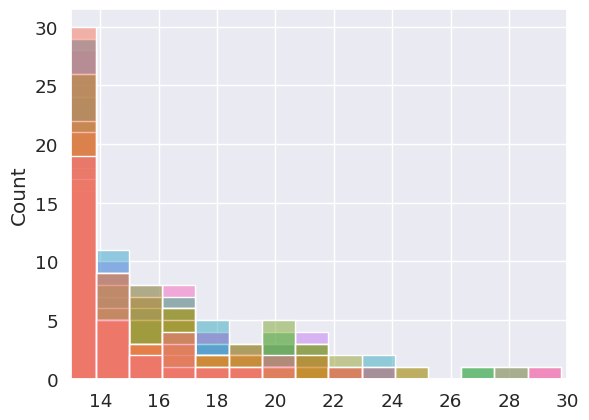

In [80]:
sns.histplot(freq_dom_beta_df,legend=False,bins=15)
plt.xlim(13,30)

<Axes: >

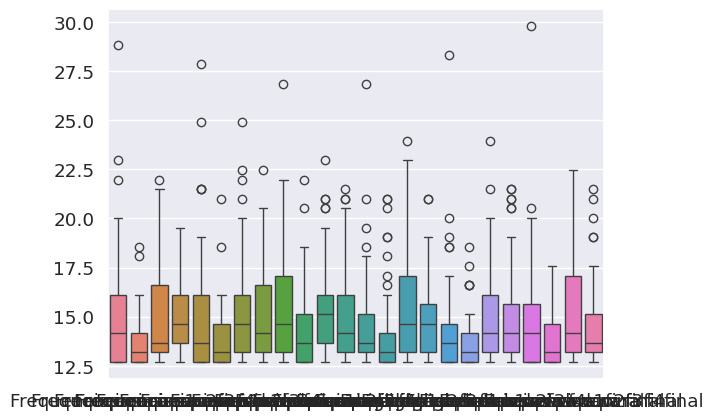

In [81]:
sns.boxplot(freq_dom_beta_df)

## Friedmann

In [82]:
## Tudo não-normal
norm_o1rep_beta = shapiro(beta_eeg_psd['o1rep'])
norm_o2rep_beta = shapiro(beta_eeg_psd['o2rep'])
norm_f3rep_beta = shapiro(beta_eeg_psd['f3rep'])
norm_f4rep_beta = shapiro(beta_eeg_psd['f4rep'])
print('REP')
print(norm_o1rep_beta)
print(norm_o2rep_beta)
print(norm_f3rep_beta)
print(norm_f4rep_beta)
norm_o1baseoc_beta = shapiro(beta_eeg_psd['o1baseoc'])
norm_o2baseoc_beta = shapiro(beta_eeg_psd['o2baseoc'])
norm_f3baseoc_beta = shapiro(beta_eeg_psd['f3baseoc'])
norm_f4baseoc_beta = shapiro(beta_eeg_psd['f4baseoc'])
print('BASEOC')
print(norm_o1baseoc_beta)
print(norm_o2baseoc_beta)
print(norm_f3baseoc_beta)
print(norm_f4baseoc_beta)
norm_o1low_beta = shapiro(beta_eeg_psd['o1low'])
norm_o2low_beta = shapiro(beta_eeg_psd['o2low'])
norm_f3low_beta = shapiro(beta_eeg_psd['f3low'])
norm_f4low_beta = shapiro(beta_eeg_psd['f4low'])
print('LOW')
print(norm_o1low_beta)
print(norm_o2low_beta)
print(norm_f3low_beta)
print(norm_f4low_beta)
norm_o1desc_beta = shapiro(beta_eeg_psd['o1desc'])
norm_o2desc_beta = shapiro(beta_eeg_psd['o2desc'])
norm_f3desc_beta = shapiro(beta_eeg_psd['f3desc'])
norm_f4desc_beta = shapiro(beta_eeg_psd['f4desc'])
print('DESC')
print(norm_o1desc_beta)
print(norm_o2desc_beta)
print(norm_f3desc_beta)
print(norm_f4desc_beta)
norm_o1high_beta = shapiro(beta_eeg_psd['o1high'])
norm_o2high_beta = shapiro(beta_eeg_psd['o2high'])
norm_f3high_beta = shapiro(beta_eeg_psd['f3high'])
norm_f4high_beta = shapiro(beta_eeg_psd['f4high'])
print('HIGH')
print(norm_o1high_beta)
print(norm_o2high_beta)
print(norm_f3high_beta)
print(norm_f4high_beta)
norm_o1final_beta = shapiro(beta_eeg_psd['o1final'])
norm_o2final_beta = shapiro(beta_eeg_psd['o2final'])
norm_f3baseoc_beta = shapiro(beta_eeg_psd['f3final'])
norm_f4final_beta = shapiro(beta_eeg_psd['f4final'])
print('FINAL')
print(norm_o1final_beta)
print(norm_o2final_beta)
print(norm_f3baseoc_beta)
print(norm_f4final_beta)


REP
ShapiroResult(statistic=np.float64(0.8930193909606561), pvalue=np.float64(4.598119674389245e-32))
ShapiroResult(statistic=np.float64(0.8135050277514757), pvalue=np.float64(1.1068836750377822e-39))
ShapiroResult(statistic=np.float64(0.9539379915564896), pvalue=np.float64(3.949305916118311e-22))
ShapiroResult(statistic=np.float64(0.9073803996987964), pvalue=np.float64(3.1623077806010035e-30))
BASEOC
ShapiroResult(statistic=np.float64(0.8716922384382333), pvalue=np.float64(1.8366984958547504e-34))
ShapiroResult(statistic=np.float64(0.8853755407032681), pvalue=np.float64(5.789920184802542e-33))
ShapiroResult(statistic=np.float64(0.9466235433991549), pvalue=np.float64(9.98905853551348e-24))
ShapiroResult(statistic=np.float64(0.8713816139987918), pvalue=np.float64(1.7042048456846448e-34))
LOW
ShapiroResult(statistic=np.float64(0.8415598735338443), pvalue=np.float64(2.327660021055999e-37))
ShapiroResult(statistic=np.float64(0.823036476181942), pvalue=np.float64(6.302839231109279e-39))
Sha

In [83]:
o1_beta = beta_eeg_psd[[col for col in beta_eeg_psd if col.startswith('o1') or col == 'Participante' ]]
o1_beta_melt = o1_beta.melt(id_vars=['Participante'], value_vars=['o1rep', 'o1baseoc', 'o1high', 'o1desc', 'o1low', 'o1final'], var_name='Condição', value_name='Valor')
o1_beta_wide = o1_beta_melt.pivot_table(index='Participante', columns='Condição', values='Valor')
o2_beta = beta_eeg_psd[[col for col in beta_eeg_psd if col.startswith('o2') or col == 'Participante' ]]
o2_beta_melt = o2_beta.melt(id_vars=['Participante'], value_vars=['o2rep', 'o2baseoc', 'o2high', 'o2desc', 'o2low', 'o2final'], var_name='Condição', value_name='Valor')
o2_beta_wide = o2_beta_melt.pivot_table(index='Participante', columns='Condição', values='Valor')
f3_beta = beta_eeg_psd[[col for col in beta_eeg_psd if col.startswith('f3') or col == 'Participante' ]]
f3_beta_melt = beta_eeg_psd.melt(id_vars=['Participante'], value_vars=['f3rep', 'f3baseoc', 'f3high', 'f3desc', 'f3low', 'f3final'], var_name='Condição', value_name='Valor')
f3_beta_wide = f3_beta_melt.pivot_table(index='Participante', columns='Condição', values='Valor')
f4_beta = beta_eeg_psd[[col for col in beta_eeg_psd if col.startswith('f4') or col == 'Participante' ]]
f4_beta_melt = f4_beta.melt(id_vars=['Participante'], value_vars=['f4rep', 'f4baseoc', 'f4high', 'f4desc', 'f4low', 'f4final'], var_name='Condição', value_name='Valor')
f4_beta_wide = f4_beta_melt.pivot_table(index='Participante', columns='Condição', values='Valor')

In [84]:
o1_beta_melt['Canal'] = o1_beta_melt['Condição'].str[:2]
o1_beta_melt['Condição'] = o1_beta_melt['Condição'].str[2:]
o2_beta_melt['Canal'] = o2_beta_melt['Condição'].str[:2]
o2_beta_melt['Condição'] = o2_beta_melt['Condição'].str[2:]
f3_beta_melt['Canal'] = f3_beta_melt['Condição'].str[:2]
f3_beta_melt['Condição'] = f3_beta_melt['Condição'].str[2:]
f4_beta_melt['Canal'] = f4_beta_melt['Condição'].str[:2]
f4_beta_melt['Condição'] = f4_beta_melt['Condição'].str[2:]
beta_melt = pd.concat([o1_beta_melt, o2_beta_melt, f3_beta_melt, f4_beta_melt])
beta_melt

,Participante,Condição,Valor,Canal
0,PT_04,rep,16.257360,o1
1,PT_05,rep,14.567384,o1
2,PT_06,rep,13.223370,o1
3,PT_07,rep,12.974381,o1
4,PT_10,rep,20.416590,o1
...,...,...,...,...
9673,PT_19,final,13.543603,f4
9674,PT_20,final,20.467439,f4
9675,PT_21,final,7.638922,f4
9676,PT_22,final,7.364588,f4


In [85]:
o1o2_melt_beta = pd.concat([o1_beta_melt[['Participante','Condição','Valor']], o2_beta_melt[['Valor']]],axis=1)
o1o2_melt_beta.columns = ['Participante', 'Condição', 'valor_o1', 'valor_o2']
f3f4_melt_beta = pd.concat([f3_beta_melt[['Participante','Condição','Valor']], f4_beta_melt[['Valor']]],axis=1)
f3f4_melt_beta.columns = ['Participante', 'Condição', 'valor_f3', 'valor_f4']

In [98]:

ph_data_o1_beta = o1_beta_wide[['o1rep', 'o1baseoc', 'o1high', 'o1desc', 'o1low', 'o1final']].values  # Convert to NumPy array

f_o1_beta, p_o1_beta = friedmanchisquare(*ph_data_o1_beta.T)  # Apply Friedman test
print('O1')
print(f_o1_beta)
print(p_o1_beta)
ph_o1_beta = posthoc_conover_friedman(ph_data_o1_beta)  # Apply posthoc test
print(ph_o1_beta)

ph_data_o2_beta = o2_beta_wide[['o2rep', 'o2baseoc', 'o2high', 'o2desc', 'o2low', 'o2final']].values  # Convert to NumPy array
f_o2_beta, p_o2_beta = friedmanchisquare(*ph_data_o2_beta.T)  # Apply Friedman test
print('\nO2')
print(f_o2_beta)
print(p_o2_beta)
ph_o2_beta = posthoc_conover_friedman(ph_data_o2_beta)  # Apply posthoc test
print(ph_o2_beta)

ph_data_f3_beta = f3_beta_wide[['f3rep', 'f3baseoc', 'f3high', 'f3desc', 'f3low', 'f3final']].values  # Convert to NumPy array
f_f3_beta, p_f3_beta = friedmanchisquare(*ph_data_f3_beta.T)  # Apply Friedman test
print('F3')
print(f_f3_beta)
print(p_f3_beta)
ph_f3_beta = posthoc_conover_friedman(ph_data_f3_beta)  # Apply posthoc test
print(ph_f3_beta)


ph_data_f4_beta = f4_beta_wide[['f4rep', 'f4baseoc', 'f4high', 'f4desc', 'f4low', 'f4final']].values
f_f4_beta, p_f4_beta = friedmanchisquare(*ph_data_f4_beta.T)
print('F4')
print(f_f4_beta)
print(p_f4_beta)
ph_f4_beta = posthoc_conover_friedman(ph_data_f4_beta)  # Apply posthoc test
print(ph_f4_beta)

O1
16.790940766550534
0.00491383325118344
          0         1         2         3         4         5
0  1.000000  0.025447  0.021781  0.000066  0.060701  0.182195
1  0.025447  1.000000  0.951540  0.069421  0.715427  0.362480
2  0.021781  0.951540  1.000000  0.079154  0.670607  0.331439
3  0.000066  0.069421  0.079154  1.000000  0.029639  0.006735
4  0.060701  0.715427  0.670607  0.029639  1.000000  0.584549
5  0.182195  0.362480  0.331439  0.006735  0.584549  1.000000

O2
17.933797909407645
0.003030528809114964
          0         1         2         3         4         5
0  1.000000  0.114115  0.033878  0.000080  0.247571  0.428456
1  0.114115  1.000000  0.583404  0.015501  0.669662  0.428456
2  0.033878  0.583404  1.000000  0.059926  0.329970  0.180871
3  0.000080  0.015501  0.059926  1.000000  0.004565  0.001424
4  0.247571  0.669662  0.329970  0.004565  1.000000  0.714597
5  0.428456  0.428456  0.180871  0.001424  0.714597  1.000000
F3
11.954703832752557
0.03541374166457338
    

In [87]:
ph_data_o1_beta_w = o1_beta_wide[['o1rep', 'o1baseoc', 'o1high', 'o1desc', 'o1low', 'o1final']].values  # Convert to NumPy array
ph_data_o2_beta_w = o2_beta_wide[['o2rep', 'o2baseoc', 'o2high', 'o2desc', 'o2low', 'o2final']].values  # Convert to NumPy array
ph_data_f3_beta_w = f3_beta_wide[['f3rep', 'f3baseoc', 'f3high', 'f3desc', 'f3low', 'f3final']].values  # Convert to NumPy
ph_data_f4_beta_w = f4_beta_wide[['f4rep', 'f4baseoc', 'f4high', 'f4desc', 'f4low', 'f4final']].values  # Convert to NumPy

/tmp/ipython-input-718622776.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-718622776.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)


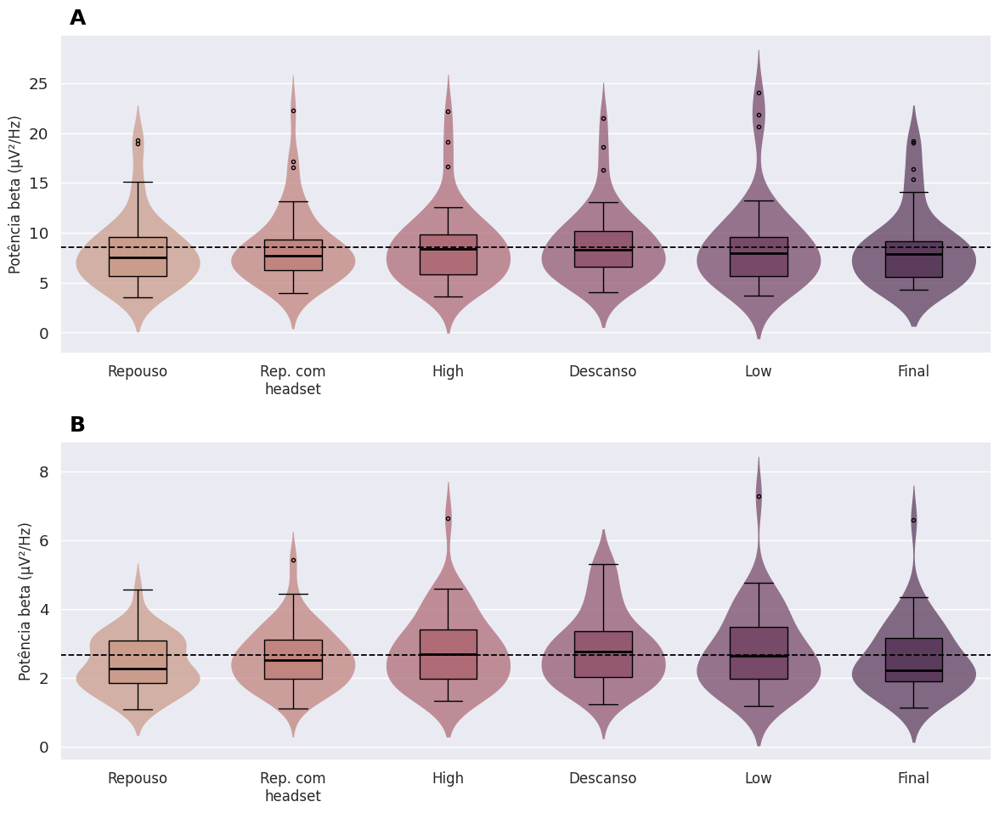

In [88]:
fig_occ_b, axes_occ_b = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_occ_b = axes_occ_b.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_b = [ph_data_o1_beta_w,ph_data_o2_beta_w]
titles_occ_b = ['A','B']
mean_occ_b = [o1_beta_melt['Valor'].mean(),o2_beta_melt['Valor'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset', 'High', 'Descanso','Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_b)):
    data = datasets_occ_b[i]
    ax = flat_axes_occ_b[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_b[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data,  palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_occ_b[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

/tmp/ipython-input-347303000.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-347303000.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)


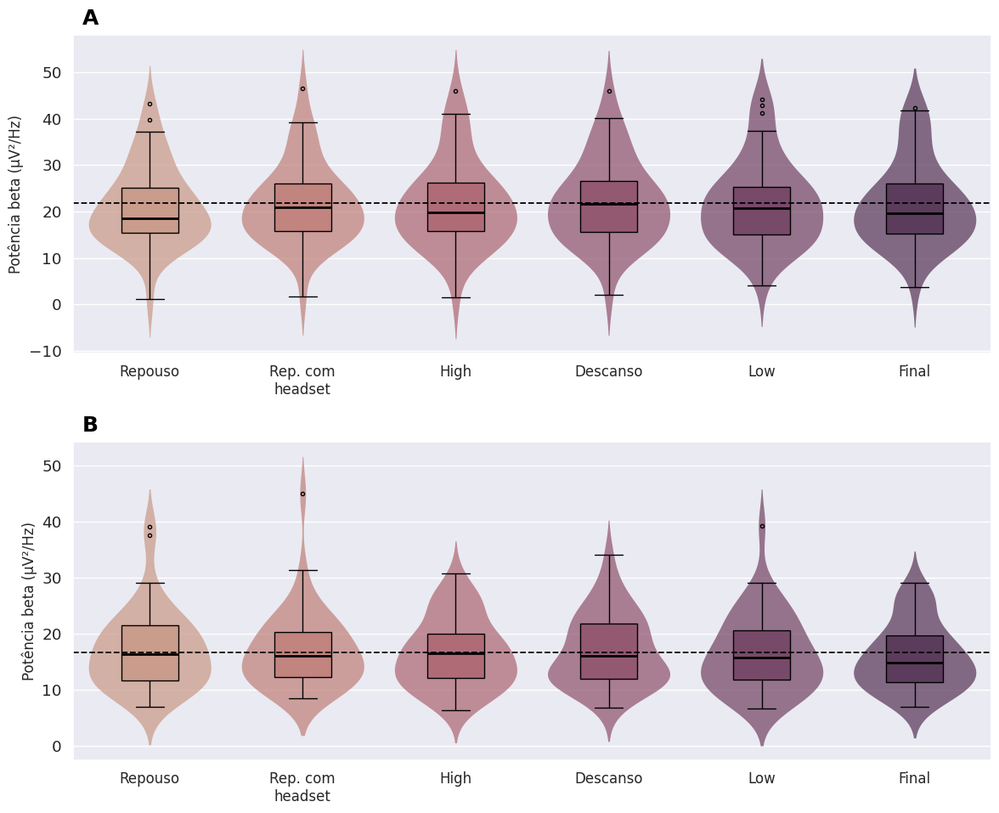

In [89]:
fig_fro_b, axes_fro_b = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_fro_b = axes_fro_b.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_fro_b = [ph_data_f3_beta_w,ph_data_f4_beta_w]
titles_fro_b = ['A','B']
mean_fro_b = [f3_beta_melt['Valor'].mean(),f4_beta_melt['Valor'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset', 'High', 'Descanso','Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_fro_b)):
    data = datasets_fro_b[i]
    ax = flat_axes_fro_b[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_fro_b[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data,  palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_fro_b[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

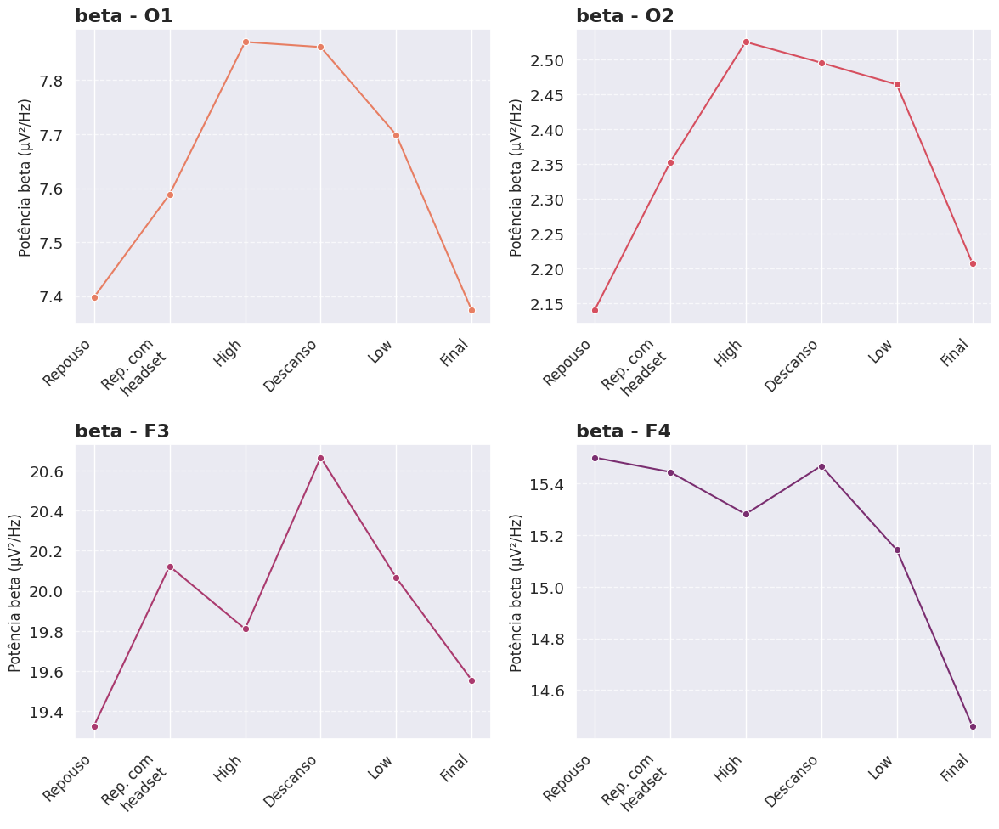

In [90]:
fig_beta_line, axes_beta_line = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
flat_axes_beta_line = axes_beta_line.flatten()


# --- 2. DADOS E METADADOS PARA O LOOP ---
datasets_beta_line = [o1_beta_melt, o2_beta_melt,f3_beta_melt,f4_beta_melt]
plot_titles = ['beta - O1', 'beta - O2', 'beta - F3','beta - F4'] # Títulos mais descritivos
x_labels = ['Repouso', 'Rep. com\nheadset', 'High', 'Descanso', 'Low', 'Final']
flare = sns.color_palette('flare', n_colors=len(datasets_beta_line))
# --- 3. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i, data in enumerate(datasets_beta_line):
    ax = flat_axes_beta_line[i] # Seleciona o eixo atual (ax[0], ax[1], ...)

    # --- INTEGRAÇÃO DO CÓDIGO INDIVIDUAL AQUI ---
    # Use 'ax=ax' para dizer ao Seaborn onde desenhar o gráfico
    sns.lineplot(
        x='Condição',
        y='Valor',
        data=data,
        estimator='median', # Usa a mediana
        errorbar=None,      # Sem barra de erro
        marker='o',         # Marcador de círculo
        color=flare[i],    # Cor específica para este subplot
        ax=ax               # **O passo mais importante!**
    )
    # ---------------------------------------------

    # --- CUSTOMIZAÇÃO DO SUBPLOT ATUAL (ax) ---
    ax.set_title(plot_titles[i], fontsize=16, fontweight='bold', loc='left')
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xlabel(None) # Remove o rótulo do eixo X para não poluir

    # Define a posição e os rótulos do eixo X
    ax.set_xticks(range(len(x_labels))) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12)

    # Adiciona grid para melhor visualização
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Oculta os eixos que não foram usados (se houver)
for i in range(len(datasets_beta_line), len(flat_axes_beta_line)):
    flat_axes_beta_line[i].set_visible(False)


# Melhora o espaçamento entre os gráficos
plt.tight_layout()


In [91]:
k_o1beta, p_o1beta = wilcoxon(o1_beta['o1high'],o1_beta['o1low'])
k_o2beta, p_o2beta = wilcoxon(o2_beta['o2high'],o2_beta['o2low'])
k_f3beta, p_f3beta = wilcoxon(f3_beta['f3high'],f3_beta['f3low'])
k_f4beta, p_f4beta = wilcoxon(f4_beta['f4high'],f4_beta['f4low'])
print("Comparação (wilcoxon) entre vídeos por canal - beta")
print('O1')
print("valor estatístico do teste:",k_o1beta)
print("p-valor:",p_o1beta)
print('O2')
print("valor estatístico do teste:",k_o2beta)
print("p-valor:",p_o2beta)
print('F3')
print("valor estatístico do teste:",k_f3beta)
print("p-valor:",p_f3beta)
print('F4')
print("valor estatístico do teste:",k_f4beta)
print("p-valor:",p_f4beta)

Comparação (wilcoxon) entre vídeos por canal - beta
O1
valor estatístico do teste: 641537.0
p-valor: 0.6188172754450969
O2
valor estatístico do teste: 600473.0
p-valor: 0.007095152741735051
F3
valor estatístico do teste: 648317.0
p-valor: 0.8924971911552897
F4
valor estatístico do teste: 614023.0
p-valor: 0.04905481318344387


In [92]:
ph_data_o1_beta= o1_beta[['o1high',  'o1low']].values
ph_data_o2_beta= o2_beta[['o2high',  'o2low']].values
ph_data_f3_beta= f3_beta[['f3high',  'f3low']].values
ph_data_f4_beta= f4_beta[['f4high',  'f4low']].values

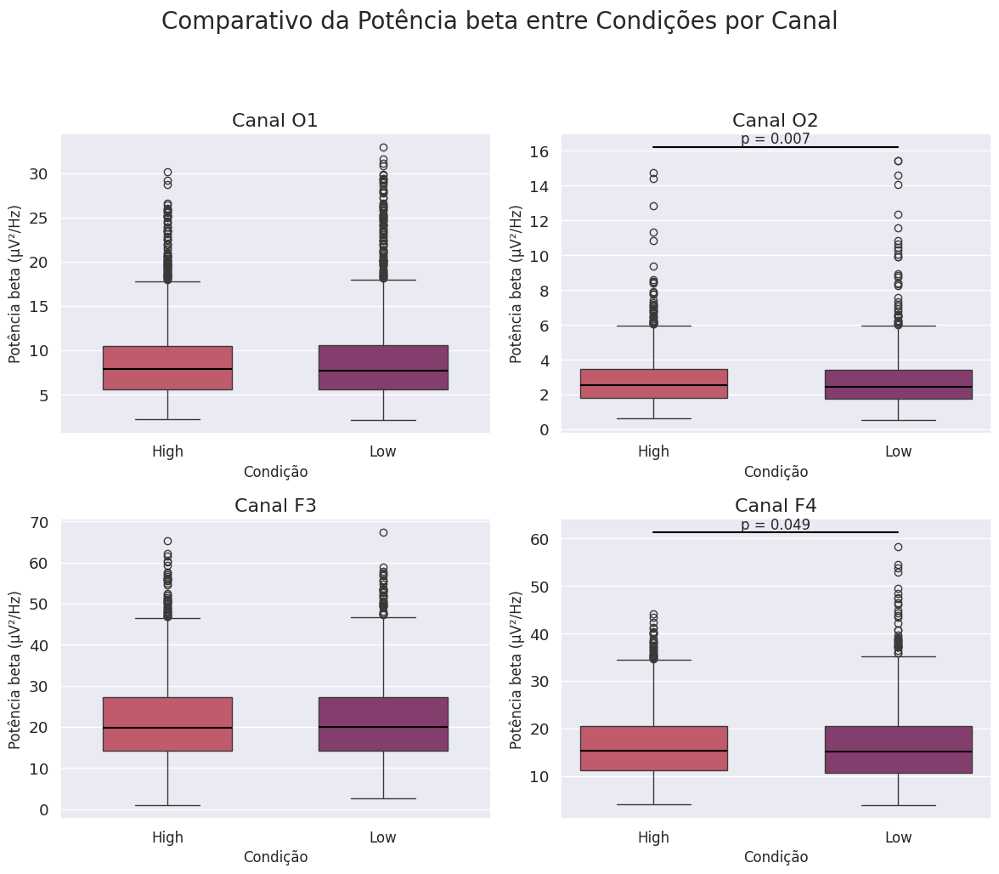

In [93]:
# --- 2. CRIAÇÃO DA FIGURA E DA GRADE DE SUBPLOTS ---
# Criamos uma figura e uma grade 2x2 de eixos (ax).
# figsize define o tamanho total da figura.
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Para facilitar o uso no loop, "achatamos" a grade 2x2 em uma lista simples de 4 eixos
flat_axes = axes.flatten()
cores_paleta = ['#d14a61', '#8f3371']
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets = [ph_data_o1_beta, ph_data_o2_beta, ph_data_f3_beta, ph_data_f4_beta]
p_values = [p_o1beta, p_o2beta, p_f3beta, p_f4beta]
titles = ['Canal O1', 'Canal O2', 'Canal F3', 'Canal F4']
x_labels = ['High', 'Low'] # Rótulos para cada boxplot

# --- 4. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i in range(len(datasets)):
    data = datasets[i]
    p_val = p_values[i]
    ax = flat_axes[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.boxplot(data=data,
                palette=cores_paleta,
                width=0.6,
                medianprops={'linewidth': 1.5, 'color': 'black'},
                ax=ax)

    # Adicionar anotação de p-valor, se for significativo
    if p_val < 0.05:
        # Posição Y da linha de anotação
        y_max = np.max(data) * 1.05

        # Use os métodos do eixo (ax.plot, ax.text) em vez de plt
        ax.plot([0, 1], [y_max, y_max], color='black', lw=1.5)
        ax.text(0.5, y_max, f"p = {p_val:.3f}", ha='center', va='bottom', fontsize=12)

    # Customizar cada subplot individualmente
    ax.set_title(title, fontsize=16)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xlabel("Condição", fontsize=12)
    ax.set_xticks([0, 1]) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, fontsize=12) # Define os rótulos dos ticks


# --- 5. AJUSTES FINAIS DA FIGURA ---

# Adiciona um título geral para a figura inteira
fig.suptitle("Comparativo da Potência beta entre Condições por Canal", fontsize=20, y=1.03)

# Ajusta o espaçamento entre os subplots para evitar sobreposição
plt.tight_layout(rect=[0, 0, 1, 0.98]) # rect ajusta para o suptitle caber

# Exibe a figura final
plt.show()

In [94]:
data_o2_beta = pd.DataFrame(ph_data_o2_beta,columns=["High",'Low'])
data_f4_beta = pd.DataFrame(ph_data_f4_beta,columns=["High",'Low'])
data_o2_beta_melt= data_o2_beta.melt(var_name='Condição', value_name='Valor')
data_f4_beta_melt= data_f4_beta.melt(var_name='Condição', value_name='Valor')


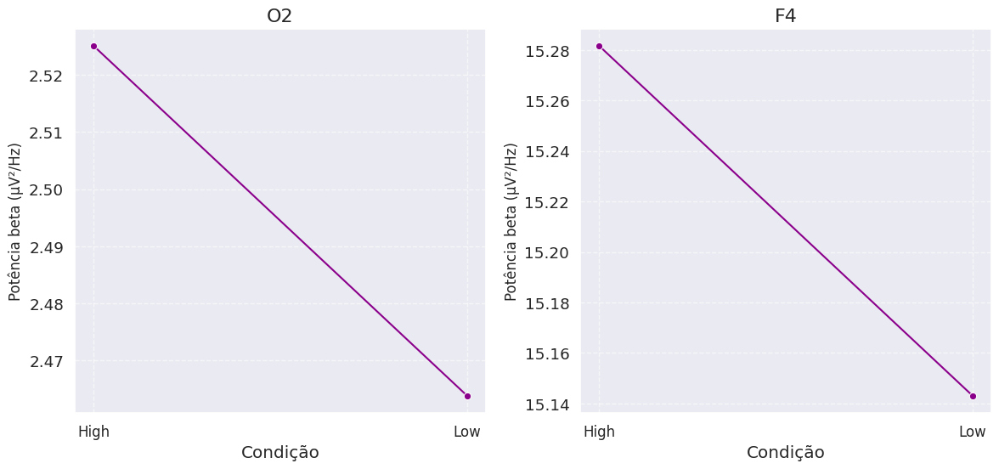

In [95]:
# --- 2. CRIAÇÃO DA FIGURA E DA GRADE DE SUBPLOTS ---
# Criamos uma figura e uma grade 1x2 de eixos (ax).
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Para facilitar o uso no loop, "achatamos" a grade em uma lista de eixos
flat_axes = axes.flatten()

# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets = [data_o2_beta_melt,  data_f4_beta_melt]
p_values = [p_o2beta,  p_f4beta]
titles = ['O2',  'F4']

# --- 4. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i in range(len(datasets)):
    data = datasets[i]
    p_val = p_values[i]
    ax = flat_axes[i]  # Seleciona o eixo atual
    title = titles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    # Usamos 'CondiçãoNum' para o eixo x para garantir que a linha conecte os pontos High e Low
    sns.lineplot(x='Condição', y='Valor', data=data, estimator='median', errorbar=None, marker='o', color='darkmagenta', ax=ax)


    # Customizar cada subplot individualmente
    ax.set_title(title, fontsize=16)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticks([0, 1]) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, fontsize=12) # Define os rótulos dos ticks
    ax.grid(True, linestyle='--', alpha=0.6) # Adiciona uma grade para melhor visualização


# --- 5. AJUSTES FINAIS DA FIGURA ---


# Ajusta o espaçamento entre os subplots para evitar sobreposição
plt.tight_layout(rect=[0, 0, 1, 0.96]) # rect ajusta para o suptitle caber


# Exibe a figura final
plt.show()

# Add ordem
- Dividir por grupo (1h e 1l) para alfa e beta


In [99]:
file_ordem = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vTZneoz5vDAY3yI6vb0UZO9JlGdhwo6em4UAouX-O07Qx_hZrsNfJkhc6rFr7MjXw/pub?output=xlsx'
df_ordem = pd.read_excel(file_ordem)
ordem_video = df_ordem[['Participante','ordem']].drop_duplicates()

In [100]:
alfa_eeg_psd_long = alfa_eeg_psd.melt(id_vars=['Participante','Idade','Sexo','Frequencias'],var_name='Coluna',value_name='Alfa')
alfa_eeg_psd_long['Canal'] = alfa_eeg_psd_long['Coluna'].str[:2]
alfa_eeg_psd_long['Condição'] = alfa_eeg_psd_long['Coluna'].str[2:]


In [101]:
alfa_eeg_psd_long = alfa_eeg_psd_long.drop(columns=['Coluna'])
alfa_eeg_psd_long_merge = pd.merge(alfa_eeg_psd_long, ordem_video, on='Participante', how='left')
#alfa_eeg_psd_long.to_excel('alfa_ordem.xlsx', index=False)
#files.download('alfa_ordem.xlsx')

In [102]:
df_relacao = alfa_eeg_psd_long_merge[['Participante', 'ordem']]

relacao_participante_ordem = df_relacao.drop_duplicates().sort_values(by='Participante')
count_ord = relacao_participante_ordem.groupby(['Participante', 'ordem']).size().reset_index()
count_ord['ordem'].value_counts()

,count
ordem,
High_first,22
Low_first,19


In [103]:
beta_eeg_psd_long = beta_eeg_psd.melt(id_vars=['Participante','Idade','Sexo','Frequencias'],var_name='Coluna',value_name='beta')
beta_eeg_psd_long['Canal'] = beta_eeg_psd_long['Coluna'].str[:2]
beta_eeg_psd_long['Condição'] = beta_eeg_psd_long['Coluna'].str[2:]


In [104]:
beta_eeg_psd_long = beta_eeg_psd_long.drop(columns=['Coluna'])
beta_eeg_psd_long_merge = pd.merge(beta_eeg_psd_long, ordem_video, on='Participante', how='left')
#beta_eeg_psd_long.to_excel = beta_eeg_psd_long.to_excel('beta_ordem.xlsx', index=False)
#files.download('beta_ordem.xlsx')

In [105]:
beta_eeg_psd_long.sort_values(by=['Participante','Canal','Frequencias','Condição'])

,Participante,Idade,Sexo,Frequencias,beta,Canal,Condição
9716,PT_01,23.0,Masculino,13.183594,20.652838,f3,baseoc
22620,PT_01,23.0,Masculino,13.183594,19.616081,f3,desc
35524,PT_01,23.0,Masculino,13.183594,18.182310,f3,final
16168,PT_01,23.0,Masculino,13.183594,18.068693,f3,high
29072,PT_01,23.0,Masculino,13.183594,17.762243,f3,low
...,...,...,...,...,...,...,...
22561,PT_50,27.0,Feminino,31.250000,3.304545,o2,desc
35465,PT_50,27.0,Feminino,31.250000,2.438710,o2,final
16109,PT_50,27.0,Feminino,31.250000,3.862934,o2,high
29013,PT_50,27.0,Feminino,31.250000,4.982144,o2,low


In [106]:
count_ord = beta_eeg_psd_long_merge.groupby(['Participante', 'ordem']).size().reset_index()
count_ord['ordem'].value_counts()


,count
ordem,
High_first,22
Low_first,19


In [107]:
df_por_ordem = {}
for ordem in alfa_eeg_psd_long_merge['ordem'].unique():
    df_por_ordem[ordem] = alfa_eeg_psd_long_merge[alfa_eeg_psd_long_merge['ordem'] == ordem]
df_alfa_1h = df_por_ordem['High_first']
df_alfa_1l = df_por_ordem['Low_first']
print(df_alfa_1h.shape)
print(df_alfa_1l.shape)

(4608, 8)
(4032, 8)


In [108]:
df_beta_por_ordem = {}
for ordem in beta_eeg_psd_long_merge['ordem'].unique():
    df_beta_por_ordem[ordem] = beta_eeg_psd_long_merge[beta_eeg_psd_long_merge['ordem'] == ordem]
df_beta_1h = df_beta_por_ordem['High_first']
df_beta_1l = df_beta_por_ordem['Low_first']
print(df_beta_1h.shape)
print(df_beta_1l.shape)


(20688, 8)
(18024, 8)


# Análise por ordem vídeo
- PSD (wilcoxon)
  - Alfa (1high e 1low) [O1,O2,F3,F4]
  - Beta (1high e 1low) [O1,O2,F3,F4]
- Assimetria (Wilcoxon)
  - Alfa (1high[AFA e AOA] e 1low[AFA e AOA])
  - Beta (1high[AFA e AOA] e 1low[AFA e AOA])


# ALFA

In [109]:
df_alfa_1h = df_alfa_1h.drop(columns=['ordem']).reset_index(drop=True)
df_alfa_1l = df_alfa_1l.drop(columns=['ordem']).reset_index(drop=True)

## LOW FIRST

In [110]:
## Dividir dados por canal
df_alfa_1l_o1= df_alfa_1l[df_alfa_1l['Canal'] == 'o1']
df_alfa_1l_o2= df_alfa_1l[df_alfa_1l['Canal'] == 'o2']
df_alfa_1l_f3= df_alfa_1l[df_alfa_1l['Canal'] == 'f3']
df_alfa_1l_f4= df_alfa_1l[df_alfa_1l['Canal'] == 'f4']

In [111]:
df_alfa_1l_o2

,Participante,Idade,Sexo,Frequencias,Alfa,Canal,Condição
168,PT_23,46.0,Masculino,7.812500,3.233080,o2,rep
169,PT_24,30.0,Feminino,7.812500,7.112475,o2,rep
170,PT_25,24.0,Masculino,7.812500,4.653457,o2,rep
171,PT_27,24.0,Masculino,7.812500,3.707030,o2,rep
172,PT_32,50.0,Masculino,7.812500,2.927892,o2,rep
...,...,...,...,...,...,...,...
3691,PT_32,50.0,Masculino,12.207031,3.863062,o2,final
3692,PT_40,31.0,Masculino,12.207031,7.533322,o2,final
3693,PT_44,31.0,Feminino,12.207031,5.077027,o2,final
3694,PT_49,20.0,Feminino,12.207031,3.813929,o2,final


In [112]:
df_alfa_1l_o1_copy= df_alfa_1l_o1.copy()
df_alfa_1l_o2_copy= df_alfa_1l_o2.copy()
df_alfa_1l_f3_copy= df_alfa_1l_f3.copy()
df_alfa_1l_f4_copy= df_alfa_1l_f4.copy()
df_alfa_1l_o1_copy = df_alfa_1l_o1_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1l_o1_copy = df_alfa_1l_o1_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_alfa_1l_o2_copy = df_alfa_1l_o2_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1l_o2_copy = df_alfa_1l_o2_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_alfa_1l_f3_copy = df_alfa_1l_f3_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1l_f3_copy = df_alfa_1l_f3_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_alfa_1l_f4_copy = df_alfa_1l_f4_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1l_f4_copy = df_alfa_1l_f4_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)

In [113]:
##Dicionário para renomear elementos da coluna "Condição"
renome_condicoes = {
    'rep': 'Repouso',
    'baseoc': 'Rep. com headset',
    'high': 'High',
    'desc': 'Descanso',
    'low': 'Low',
    'final': 'Final'
}

# Use o dicionário na função .replace()
df_alfa_1l_o1_copy['Condição'] = df_alfa_1l_o1_copy['Condição'].replace(renome_condicoes)
df_alfa_1l_o2_copy['Condição'] = df_alfa_1l_o2_copy['Condição'].replace(renome_condicoes)
df_alfa_1l_f3_copy['Condição'] = df_alfa_1l_f3_copy['Condição'].replace(renome_condicoes)
df_alfa_1l_f4_copy['Condição'] = df_alfa_1l_f4_copy['Condição'].replace(renome_condicoes)

In [114]:
## Criar dicionário para personalizar a ordem dos elementos em "Condição"
ordem_condicao = ['Repouso','Rep. com headset','Low','Descanso','High','Final']
df_alfa_1l_o1_copy['Condição'] = pd.Categorical(df_alfa_1l_o1_copy['Condição'], categories=ordem_condicao, ordered=True)
df_alfa_1l_o2_copy['Condição'] = pd.Categorical(df_alfa_1l_o2_copy['Condição'], categories=ordem_condicao, ordered=True)
df_alfa_1l_f3_copy['Condição'] = pd.Categorical(df_alfa_1l_f3_copy['Condição'], categories=ordem_condicao, ordered=True)
df_alfa_1l_f4_copy['Condição'] = pd.Categorical(df_alfa_1l_f4_copy['Condição'], categories=ordem_condicao, ordered=True)



In [115]:
df_alfa_1l_f3_copy

,Participante,Frequencias,Alfa,Condição
0,PT_23,7.812500,37.254425,Repouso
1,PT_24,7.812500,45.741596,Repouso
2,PT_25,7.812500,42.925103,Repouso
3,PT_27,7.812500,23.117304,Repouso
4,PT_32,7.812500,41.480570,Repouso
...,...,...,...,...
1003,PT_32,12.207031,37.405203,Final
1004,PT_40,12.207031,25.585869,Final
1005,PT_44,12.207031,27.652230,Final
1006,PT_49,12.207031,33.940981,Final


In [116]:
o1o2_1l_melt_alfa = pd.concat([df_alfa_1l_o1_copy[['Participante','Condição','Alfa']], df_alfa_1l_o2_copy[['Alfa']]],axis=1)
o1o2_1l_melt_alfa.columns = ['Participante', 'Condição', 'Alfa_o1', 'Alfa_o2']
f3f4_1l_melt_alfa = pd.concat([df_alfa_1l_f3_copy[['Participante','Condição','Alfa']], df_alfa_1l_f4_copy[['Alfa']]],axis=1)
f3f4_1l_melt_alfa.columns = ['Participante', 'Condição', 'Alfa_f3', 'Alfa_f4']

In [117]:
o1o2_1l_melt_alfa

,Participante,Condição,Alfa_o1,Alfa_o2
0,PT_23,Repouso,9.441885,3.233080
1,PT_24,Repouso,18.291697,7.112475
2,PT_25,Repouso,9.556272,4.653457
3,PT_27,Repouso,6.827546,3.707030
4,PT_32,Repouso,9.444453,2.927892
...,...,...,...,...
1003,PT_32,Final,10.991918,3.863062
1004,PT_40,Final,13.330527,7.533322
1005,PT_44,Final,9.478570,5.077027
1006,PT_49,Final,13.061944,3.813929


In [118]:
def processar_df_para_friedman(df):
    """
    Pivota e retorna o DataFrame no formato 'wide'
    para o Teste de Friedman.
    """

    # Pivotagem: Transforma para o formato wide (Participante x Condição)
    df_wide = df.pivot_table(
        index='Participante',
        columns='Condição',
        values='Alfa',
        aggfunc='median'
    )
    return df_wide

# Armazene seus DataFrames originais em um dicionário
dfs_long = {
    'o1': df_alfa_1l_o1_copy,
    'o2': df_alfa_1l_o2_copy,
    'f3': df_alfa_1l_f3_copy,
    'f4': df_alfa_1l_f4_copy,
}

# Dicionário para armazenar os novos DataFrames no formato 'wide'
dfs_wide = {}

for name, df in dfs_long.items():
    # Aplica a função de processamento a cada DataFrame
    df_wide = processar_df_para_friedman(df)

    # Armazena o resultado no novo dicionário
    dfs_wide[f'f_{name}_1l_alfa_wide'] = df_wide

# --------------------------------------------------------
# 4. Acesso aos Resultados
# --------------------------------------------------------

# Agora você pode acessar os DataFrames pivotados pelo dicionário:
# Exemplo 1: df_alfa_1l_o1_copy -> f_o1_1l_alfa_wide
f_o1_1l_alfa_wide = dfs_wide['f_o1_1l_alfa_wide'].reset_index(drop=True)
f_o2_1l_alfa_wide = dfs_wide['f_o2_1l_alfa_wide'].reset_index(drop=True)
f_f3_1l_alfa_wide = dfs_wide['f_f3_1l_alfa_wide'].reset_index(drop=True)
f_f4_1l_alfa_wide = dfs_wide['f_f4_1l_alfa_wide'].reset_index(drop=True)

## Confirmação do dataframe estar no formato "wide"
f_f3_1l_alfa_wide.shape

/tmp/ipython-input-2490958195.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-2490958195.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-2490958195.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-2490958195.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=Fa

(19, 6)

In [119]:
np_o1_1l_alfa = f_o1_1l_alfa_wide.to_numpy()
np_o2_1l_alfa = f_o2_1l_alfa_wide.to_numpy()
np_f3_1l_alfa = f_f3_1l_alfa_wide.to_numpy()
np_f4_1l_alfa = f_f4_1l_alfa_wide.to_numpy()

In [120]:
f_o1_1l_alfa_wide

Condição,Repouso,Rep. com headset,Low,Descanso,High,Final
0,8.659145,7.699580,8.232813,7.650182,8.627707,9.659766
1,13.708143,16.724896,14.009196,15.104733,15.337571,15.606227
2,14.255290,17.605121,18.286091,17.543414,16.909304,23.290972
3,16.243682,11.055593,9.598413,7.810538,8.841172,10.488595
4,23.939614,17.282136,14.728146,13.660679,13.312710,13.841376
5,9.437836,8.872422,8.721948,8.060909,7.614511,10.731969
6,10.469115,13.025693,10.012903,9.062905,8.740329,8.067821
7,11.225298,9.604730,7.465564,10.277418,7.495615,13.653662
8,17.316198,15.566990,16.355728,18.695779,15.957461,21.980983
9,10.477957,9.528405,10.486269,10.337824,10.562390,11.515207


In [161]:
# Now perform the Friedman test on the cleaned dataframes
f_alfa_lowo1, p_alfa_lowo1 = friedmanchisquare(*np_o1_1l_alfa.T)
print(f'O1 \nValor do teste: {f_alfa_lowo1:.4f}\np-valor: {p_alfa_lowo1:.4f}')
ph_1l_o1_alfa = sph.posthoc_conover_friedman(f_o1_1l_alfa_wide)
print("O1-posthoc:", ph_1l_o1_alfa )
f_alfa_lowo2, p_alfa_lowo2 = friedmanchisquare(*np_o2_1l_alfa.T)
print(f'O2 \nValor do teste: {f_alfa_lowo2:.4f}\np-valor: {p_alfa_lowo2:.4f}')
ph_1l_o2_alfa = sph.posthoc_conover_friedman(f_o2_1l_alfa_wide)
print("O2-posthoc:", ph_1l_o2_alfa )
f_alfa_lowf3, p_alfa_lowf3 = friedmanchisquare(*np_f3_1l_alfa.T)
print(f'F3 \nValor do teste: {f_alfa_lowf3:.4f}\np-valor: {p_alfa_lowf3:.4f}')

f_alfa_lowf4, p_alfa_lowf4 = friedmanchisquare(*np_f4_1l_alfa.T)
print(f'F4 \nValor do teste: {f_alfa_lowf4:.4f}\np-valor: {p_alfa_lowf4:.4f}')


O1 
Valor do teste: 15.6015
p-valor: 0.0081
O1-posthoc:                    Repouso  Rep. com headset       Low  Descanso      High  \
Repouso           1.000000          0.782449  0.143140  0.082825  0.018442   
Rep. com headset  0.782449          1.000000  0.233234  0.143140  0.036471   
Low               0.143140          0.233234  1.000000  0.782449  0.358379   
Descanso          0.082825          0.143140  0.782449  1.000000  0.519775   
High              0.018442          0.036471  0.358379  0.519775  1.000000   
Final             0.233234          0.143140  0.008822  0.004000  0.000520   

                     Final  
Repouso           0.233234  
Rep. com headset  0.143140  
Low               0.008822  
Descanso          0.004000  
High              0.000520  
Final             1.000000  
O2 
Valor do teste: 20.0827
p-valor: 0.0012
O2-posthoc:                    Repouso  Rep. com headset       Low  Descanso      High  \
Repouso           1.000000          0.074300  0.002312  0.15

/tmp/ipython-input-1841278552.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-1841278552.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-1841278552.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-1841278552.py:38: FutureWarning: 

Passing `palette` 

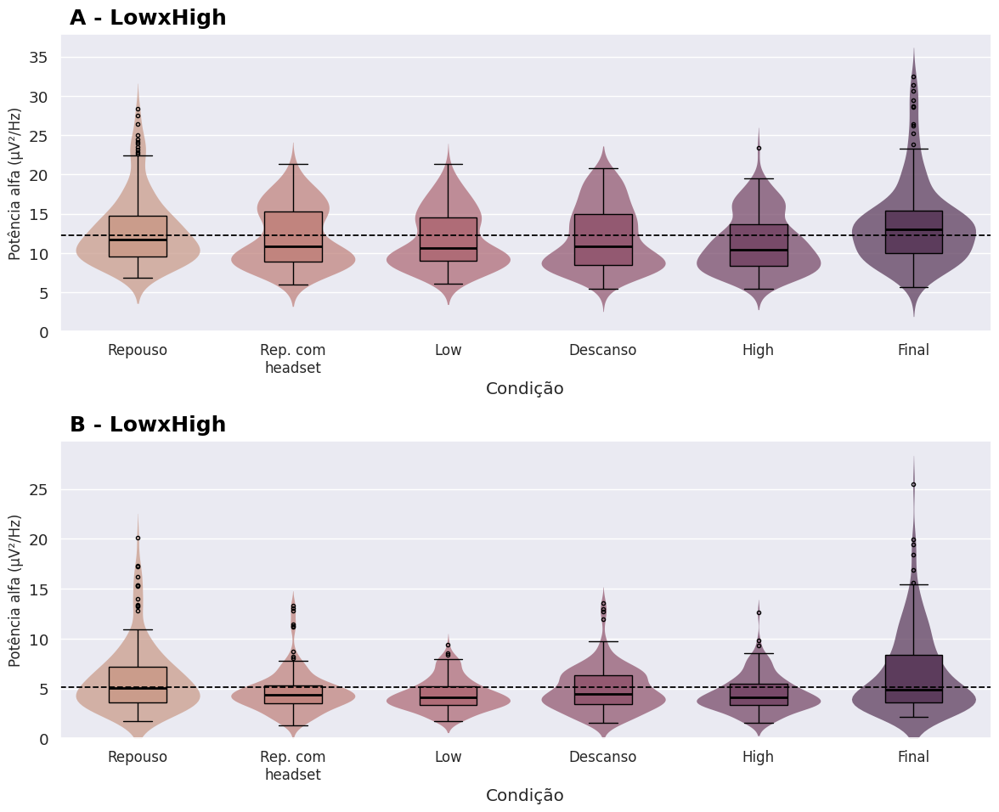

In [123]:
fig_occ_a_1l, axes_occ_a_1l = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_occ_a_1l = axes_occ_a_1l.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_a_1l = [df_alfa_1l_o1_copy,df_alfa_1l_o2]
titles_occ_a_1l = ['A - LowxHigh','B - LowxHigh']
mean_occ_a_1l = [o1o2_1l_melt_alfa['Alfa_o1'].mean(),o1o2_1l_melt_alfa['Alfa_o2'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset','Low', 'Descanso', 'High','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_a_1l)):
    data = datasets_occ_a_1l[i]
    ax = flat_axes_occ_a_1l[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_a_1l[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_occ_a_1l[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
    ax.set_ylim(0)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

/tmp/ipython-input-1074799966.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-1074799966.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-1074799966.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-1074799966.py:38: FutureWarning: 

Passing `palette` 

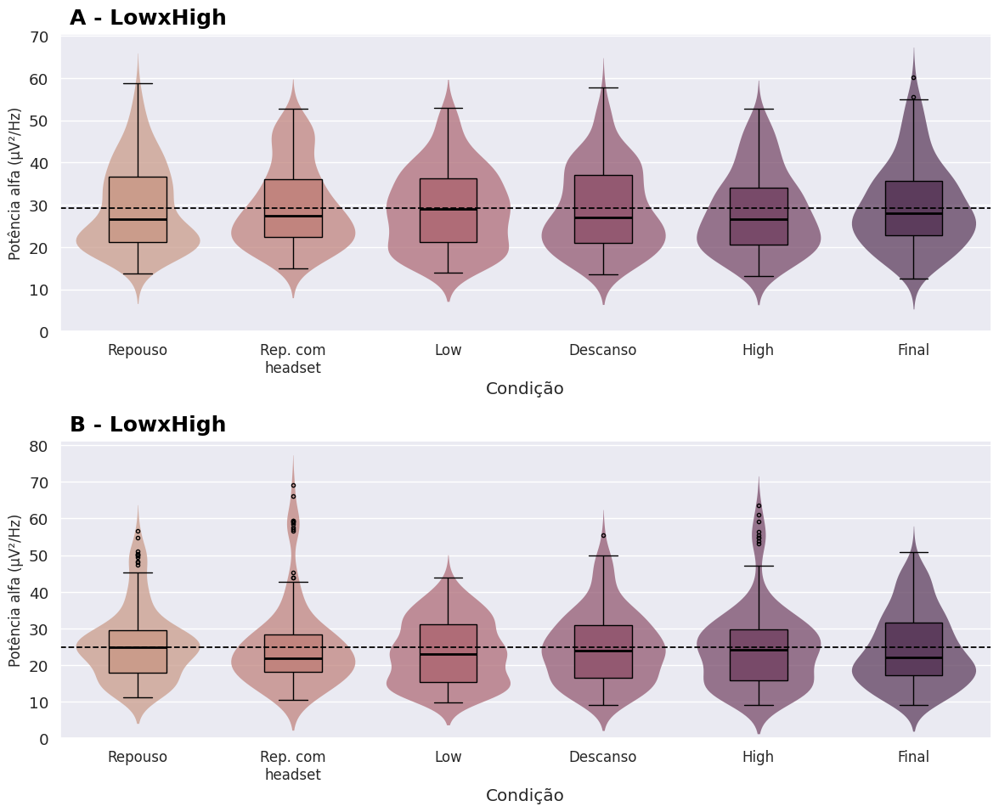

In [124]:
fig_fro_a_1l, axes_fro_a_1l = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_fro_a_1l = axes_fro_a_1l.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_fro_a_1l = [df_alfa_1l_f3_copy,df_alfa_1l_f4]
titles_fro_a_1l = ['A - LowxHigh','B - LowxHigh']
mean_fro_a_1l = [f3f4_1l_melt_alfa['Alfa_f3'].mean(),f3f4_1l_melt_alfa['Alfa_f4'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset','Low', 'Descanso', 'High','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_fro_a_1l)):
    data = datasets_fro_a_1l[i]
    ax = flat_axes_fro_a_1l[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_fro_a_1l[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_fro_a_1l[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
    ax.set_ylim(0)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

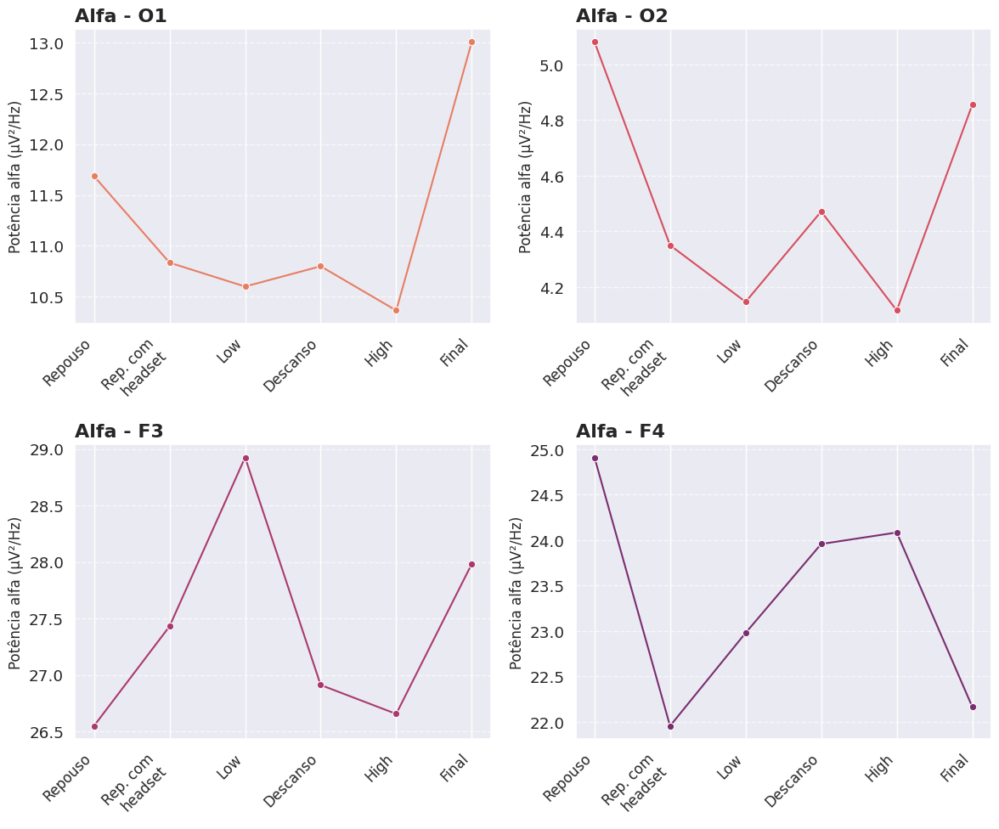

In [125]:
fig_occ_a_1l_line, axes_occ_a_1l_line = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
flat_axes_occ_a_1l_line = axes_occ_a_1l_line.flatten()


# --- 2. DADOS E METADADOS PARA O LOOP ---
datasets_occ_a_1l_line = [df_alfa_1l_o1_copy,df_alfa_1l_o2,df_alfa_1l_f3_copy,df_alfa_1l_f4]
plot_titles = ['Alfa - O1', 'Alfa - O2', 'Alfa - F3','Alfa - F4'] # Títulos mais descritivos
x_labels = ['Repouso', 'Rep. com\nheadset', 'Low',  'Descanso','High', 'Final']
flare = sns.color_palette('flare',n_colors=len(datasets_occ_a_1l_line))
# --- 3. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i, data in enumerate(datasets_occ_a_1l_line):
    ax = flat_axes_occ_a_1l_line[i] # Seleciona o eixo atual (ax[0], ax[1], ...)

    # --- INTEGRAÇÃO DO CÓDIGO INDIVIDUAL AQUI ---
    # Use 'ax=ax' para dizer ao Seaborn onde desenhar o gráfico
    sns.lineplot(
        x='Condição',
        y='Alfa',
        data=data,
        estimator='median', # Usa a mediana
        errorbar=None,      # Sem barra de erro
        marker='o',         # Marcador de círculo
        color=flare[i],    # Cor específica para este subplot
        ax=ax               # **O passo mais importante!**
    )
    # ---------------------------------------------

    # --- CUSTOMIZAÇÃO DO SUBPLOT ATUAL (ax) ---
    ax.set_title(plot_titles[i], fontsize=16, fontweight='bold', loc='left')
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xlabel(None) # Remove o rótulo do eixo X para não poluir

    # Define a posição e os rótulos do eixo X
    ax.set_xticks(range(len(x_labels))) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12)

    # Adiciona grid para melhor visualização
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Oculta os eixos que não foram usados (se houver)
for i in range(len(datasets_occ_a_1l_line), len(flat_axes_occ_a_1l_line)):
    flat_axes_occ_a_1l_line[i].set_visible(False)


# Melhora o espaçamento entre os gráficos
plt.tight_layout()


## Wilcoxon entre vídeos

In [126]:
## Divisão por condição LxH por canal
o1low_alfa_1l = df_alfa_1l_o1[df_alfa_1l_o1['Condição'] == 'low']['Alfa']
o1high_alfa_1l = df_alfa_1l_o1[df_alfa_1l_o1['Condição'] == 'high']['Alfa']

o2low_alfa_1l = df_alfa_1l_o2[df_alfa_1l_o2['Condição'] == 'low']['Alfa']
o2high_alfa_1l = df_alfa_1l_o2[df_alfa_1l_o2['Condição'] == 'high']['Alfa']

f3low_alfa_1l = df_alfa_1l_f3[df_alfa_1l_f3['Condição'] == 'low']['Alfa']
f3high_alfa_1l = df_alfa_1l_f3[df_alfa_1l_f3['Condição'] == 'high']['Alfa']

f4low_alfa_1l = df_alfa_1l_f4[df_alfa_1l_f4['Condição'] == 'low']['Alfa']
f4high_alfa_1l = df_alfa_1l_f4[df_alfa_1l_f4['Condição'] == 'high']['Alfa']

df_videos_alfa_1l = pd.concat([o1low_alfa_1l, o1high_alfa_1l, o2low_alfa_1l, o2high_alfa_1l, f3low_alfa_1l, f3high_alfa_1l, f4low_alfa_1l, f4high_alfa_1l], axis=1)
df_videos_alfa_1l.describe()

,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa
count,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000
mean,11.716123,11.228991,4.500797,4.407234,29.084215,28.310898,24.667010,23.582452
std,3.636041,3.637979,1.811677,1.591062,9.476553,9.439281,11.044080,8.681262
min,6.039744,5.382658,1.580956,1.726961,13.914629,13.099248,9.225467,9.941896
25%,9.008038,8.309433,3.375048,3.327933,21.219421,20.625173,15.873776,15.299270
50%,10.599784,10.364842,4.115458,4.146255,28.925138,26.654375,24.083144,22.978461
75%,14.505159,13.676346,5.458405,5.245270,36.297563,33.947793,29.735739,31.162572
max,21.322870,23.358311,12.619791,9.371472,52.855660,52.702240,63.662767,43.853200


In [127]:
## Wilcoxon - comparação entre condições de vídeo
stat_alfa_1l_o1, p_alfa_1l_o1 = wilcoxon(o1low_alfa_1l, o1high_alfa_1l)
print("Comparação entre vídeos - LowXHigh - alfa")
print('O1-Wilcoxon Statistic:' , stat_alfa_1l_o1)
print('O1-p-value:' , p_alfa_1l_o1)
stat_alfa_1l_o2, p_alfa_1l_o2 = wilcoxon(o2low_alfa_1l, o2high_alfa_1l)
print('O2-Wilcoxon Statistic:' , stat_alfa_1l_o2)
print('O2-p-value:' , p_alfa_1l_o2)
stat_alfa_1l_f3, p_alfa_1l_f3 = wilcoxon(f3low_alfa_1l, f3high_alfa_1l)
print('F3-Wilcoxon Statistic:' , stat_alfa_1l_f3)
print('F3-p-value:' , p_alfa_1l_f3)
stat_alfa_1l_f4, p_alfa_1l_f4 = wilcoxon(f4low_alfa_1l, f4high_alfa_1l)
print('F4-Wilcoxon Statistic:' , stat_alfa_1l_f4)
print('F4-p-value:' , p_alfa_1l_f4)

Comparação entre vídeos - LowXHigh - alfa
O1-Wilcoxon Statistic: 5156.0
O1-p-value: 0.002100193540487402
O2-Wilcoxon Statistic: 7037.0
O2-p-value: 0.9230360388022001
F3-Wilcoxon Statistic: 6049.0
F3-p-value: 0.09663777591572938
F4-Wilcoxon Statistic: 6375.0
F4-p-value: 0.2521813214713162


In [128]:
# --- 3. Preparação dos Dados para os Gráficos ---
# É melhor colocar os dados em um DataFrame para usar com o seaborn

# DataFrame para O1
df_o1 = pd.DataFrame({
    'Valor': np.concatenate([o1low_alfa_1l, o1high_alfa_1l]),
    'Condição': ['Low'] * len(o1low_alfa_1l) + ['High'] * len(o1high_alfa_1l)
})

# DataFrame para O2
df_o2 = pd.DataFrame({
    'Valor': np.concatenate([o2low_alfa_1l, o2high_alfa_1l]),
    'Condição': ['Low'] * len(o2low_alfa_1l) + ['High'] * len(o2high_alfa_1l)
})

# DataFrame para f3
df_f3 = pd.DataFrame({
    'Valor': np.concatenate([f3low_alfa_1l, f3high_alfa_1l]),
    'Condição': ['Low'] * len(f3low_alfa_1l) + ['High'] * len(f3high_alfa_1l)
})

# DataFrame para f4
df_f4 = pd.DataFrame({
    'Valor': np.concatenate([f4low_alfa_1l, f4high_alfa_1l]),
    'Condição': ['Low'] * len(f4low_alfa_1l) + ['High'] * len(f4high_alfa_1l)
})


# --- 2. Função para formatar o p-valor (sem alterações) ---
def format_p_value(p):
    if p < 0.001:
        return "p < 0.001"
    elif p >= 0.05:
        return f"p = {p:.3f} (ns)" # Adicionei 'ns' para não significativo
    else:
        return f"p = {p:.3f}"

/tmp/ipython-input-1463886949.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Condição',y='Valor',data=df, palette=['#8f3371', '#d14a61'], inner=None, ax=ax, linewidth=0, saturation=0.5, alpha=0.74)
/tmp/ipython-input-1463886949.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição',y='Valor',data=df,  palette=['#8f3371', '#d14a61'],saturation=0.5,width=0.37, linecolor='black', linewidth=1,
/tmp/ipython-input-1463886949.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Condição',y='Valor',data=df, palette=['#8f

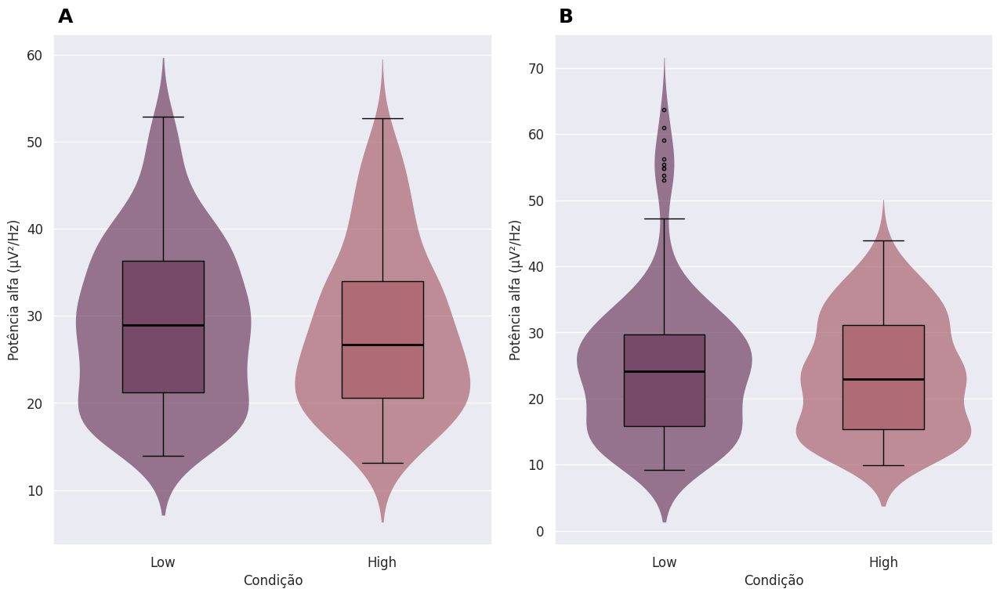

In [129]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(13,8))

# "Achatamos" a matriz de eixos em uma lista simples para facilitar o loop
flat_axes = axes.flatten()

# Crie listas com os dados e metadados para o loop
dataframes = [ df_f3, df_f4]
p_values = [p_alfa_lowf3, p_alfa_lowf4]
titles =['A','B']

# Loop para criar cada um dos 4 gráficos
for i in range(len(dataframes)):
    df = dataframes[i]
    p_val = p_values[i]
    ax = flat_axes[i]  # Pega o eixo correto para o gráfico atual
    title = titles[i]

    # Plote o boxplot NO EIXO ESPECÍFICO usando o argumento 'ax'
    sns.violinplot(x='Condição',y='Valor',data=df, palette=['#8f3371', '#d14a61'], inner=None, ax=ax, linewidth=0, saturation=0.5, alpha=0.74)
    sns.boxplot(x='Condição',y='Valor',data=df,  palette=['#8f3371', '#d14a61'],saturation=0.5,width=0.37, linecolor='black', linewidth=1,
            medianprops={'color': 'black', 'linewidth': 2}, boxprops={'zorder': 2},ax=ax, fliersize=3)
    plt.ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    # Customizar cada subplot individualmente
    ax.set_title(title, fontsize= 18,
        fontweight= 'bold',
        color= 'black',
        loc= 'left',  # Alinha o título à esquerda
        x= 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        y= 1.01)
    ax.set_ylabel('Potência alfa (μV²/Hz)', fontsize=12)
    ax.set_xlabel('Condição', fontsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='x', labelsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()


/tmp/ipython-input-694956072.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Condição',y='Valor',data=df_o1, palette=['#8f3371', '#d14a61'], inner=None, ax=ax1, linewidth=0, saturation=0.5, alpha=0.74)
/tmp/ipython-input-694956072.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição',y='Valor',data=df_o1,  palette=['#8f3371', '#d14a61'],saturation=0.5,width=0.37, linecolor='black', linewidth=1,


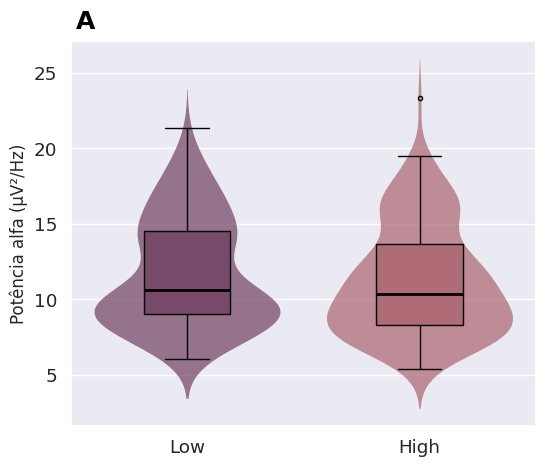

In [130]:
fig, ax1 = plt.subplots(figsize=(6,5))
titles = 'A'


sns.violinplot(x='Condição',y='Valor',data=df_o1, palette=['#8f3371', '#d14a61'], inner=None, ax=ax1, linewidth=0, saturation=0.5, alpha=0.74)
sns.boxplot(x='Condição',y='Valor',data=df_o1,  palette=['#8f3371', '#d14a61'],saturation=0.5,width=0.37, linecolor='black', linewidth=1,
            medianprops={'color': 'black', 'linewidth': 2}, boxprops={'zorder': 2},ax=ax1, fliersize=3)
plt.ylabel("Potência alfa (μV²/Hz)", fontsize=12)
plt.xlabel(None)
ax1.set_title(titles, fontsize= 18,
        fontweight= 'bold',
        color= 'black',
        loc= 'left',  # Alinha o título à esquerda
        x= 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        y= 1.01)
plt.show()

In [131]:
o1alfa = [o1low_alfa_1l, o1high_alfa_1l]
o2alfa = [o2low_alfa_1l, o2high_alfa_1l]
f3alfa = [f3low_alfa_1l, f3high_alfa_1l]
f4alfa = [f4low_alfa_1l, f4high_alfa_1l]


## Assimetria - LOW FIRST

In [132]:
## Divisão por condição HxL por canal

f3low_alfa_1l = df_alfa_1l_f3[df_alfa_1l_f3['Condição'] == 'low']['Alfa'].reset_index(drop=True)
f3high_alfa_1l = df_alfa_1l_f3[df_alfa_1l_f3['Condição'] == 'high']['Alfa'].reset_index(drop=True)

f4low_alfa_1l = df_alfa_1l_f4[df_alfa_1l_f4['Condição'] == 'low']['Alfa'].reset_index(drop=True)
f4high_alfa_1l = df_alfa_1l_f4[df_alfa_1l_f4['Condição'] == 'high']['Alfa'].reset_index(drop=True)

df_videos_alfa_1l = pd.concat([o1low_alfa_1l, o1high_alfa_1l, o2low_alfa_1l, o2high_alfa_1l, f3low_alfa_1l, f3high_alfa_1l, f4low_alfa_1l, f4high_alfa_1l], axis=1)
df_videos_alfa_1l.describe()

,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa
count,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000
mean,11.716123,11.228991,4.500797,4.407234,29.084215,28.310898,24.667010,23.582452
std,3.636041,3.637979,1.811677,1.591062,9.476553,9.439281,11.044080,8.681262
min,6.039744,5.382658,1.580956,1.726961,13.914629,13.099248,9.225467,9.941896
25%,9.008038,8.309433,3.375048,3.327933,21.219421,20.625173,15.873776,15.299270
50%,10.599784,10.364842,4.115458,4.146255,28.925138,26.654375,24.083144,22.978461
75%,14.505159,13.676346,5.458405,5.245270,36.297563,33.947793,29.735739,31.162572
max,21.322870,23.358311,12.619791,9.371472,52.855660,52.702240,63.662767,43.853200


In [133]:
afa_1l_low = (f4low_alfa_1l - f3low_alfa_1l)/(f4low_alfa_1l + f3low_alfa_1l)
afa_1l_high = (f4high_alfa_1l - f3high_alfa_1l)/(f4high_alfa_1l + f3high_alfa_1l)


In [134]:
## Wilcoxon - comparação entre condições de vídeo
stat_afa, p_afa = wilcoxon(afa_1l_low, afa_1l_high)
print('AFA-Wilcoxon Statistic:%.8f' % stat_afa)
print('AFA-p-value:%.8f' % p_afa)


AFA-Wilcoxon Statistic:6864.00000000
AFA-p-value:0.71093350


## HIGH FIRST

In [135]:
## Dividir dados por canal
df_alfa_1h_o1= df_alfa_1h[df_alfa_1h['Canal'] == 'o1']
df_alfa_1h_o2= df_alfa_1h[df_alfa_1h['Canal'] == 'o2']
df_alfa_1h_f3= df_alfa_1h[df_alfa_1h['Canal'] == 'f3']
df_alfa_1h_f4= df_alfa_1h[df_alfa_1h['Canal'] == 'f4']

In [136]:
df_alfa_1h_o2

,Participante,Idade,Sexo,Frequencias,Alfa,Canal,Condição
192,PT_22,21.0,Masculino,7.812500,2.622013,o2,rep
193,PT_26,20.0,Feminino,7.812500,3.406653,o2,rep
194,PT_30,23.0,Feminino,7.812500,4.019024,o2,rep
195,PT_31,24.0,Masculino,7.812500,1.733049,o2,rep
196,PT_33,20.0,Masculino,7.812500,5.757030,o2,rep
...,...,...,...,...,...,...,...
4219,PT_45,28.0,Feminino,12.207031,2.376034,o2,final
4220,PT_46,21.0,Feminino,12.207031,3.059147,o2,final
4221,PT_48,22.0,Masculino,12.207031,6.952286,o2,final
4222,PT_50,27.0,Feminino,12.207031,6.858185,o2,final


In [137]:
df_alfa_1h_o1_copy= df_alfa_1h_o1.copy()
df_alfa_1h_o2_copy= df_alfa_1h_o2.copy()
df_alfa_1h_f3_copy= df_alfa_1h_f3.copy()
df_alfa_1h_f4_copy= df_alfa_1h_f4.copy()
df_alfa_1h_o1_copy = df_alfa_1h_o1_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1h_o1_copy = df_alfa_1h_o1_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_alfa_1h_o2_copy = df_alfa_1h_o2_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1h_o2_copy = df_alfa_1h_o2_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_alfa_1h_f3_copy = df_alfa_1h_f3_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1h_f3_copy = df_alfa_1h_f3_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_alfa_1h_f4_copy = df_alfa_1h_f4_copy.drop(columns=['Canal','Idade','Sexo'])
df_alfa_1h_f4_copy = df_alfa_1h_f4_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)

In [138]:
##Dicionário para renomear elementos da coluna "Condição"
renome_condicoes = {
    'rep': 'Repouso',
    'baseoc': 'Rep. com headset',
    'high': 'High',
    'desc': 'Descanso',
    'low': 'Low',
    'final': 'Final'
}

# Use o dicionário na função .replace()
df_alfa_1h_o1_copy['Condição'] = df_alfa_1h_o1_copy['Condição'].replace(renome_condicoes)
df_alfa_1h_o2_copy['Condição'] = df_alfa_1h_o2_copy['Condição'].replace(renome_condicoes)
df_alfa_1h_f3_copy['Condição'] = df_alfa_1h_f3_copy['Condição'].replace(renome_condicoes)
df_alfa_1h_f4_copy['Condição'] = df_alfa_1h_f4_copy['Condição'].replace(renome_condicoes)

In [139]:
## Criar dicionário para personalizar a ordem dos elementos em "Condição"
ordem_condicao = ['Repouso','Rep. com headset', 'High', 'Descanso', 'Low','Final']
df_alfa_1h_o1_copy['Condição'] = pd.Categorical(df_alfa_1h_o1_copy['Condição'], categories=ordem_condicao, ordered=True)
df_alfa_1h_o2_copy['Condição'] = pd.Categorical(df_alfa_1h_o2_copy['Condição'], categories=ordem_condicao, ordered=True)
df_alfa_1h_f3_copy['Condição'] = pd.Categorical(df_alfa_1h_f3_copy['Condição'], categories=ordem_condicao, ordered=True)
df_alfa_1h_f4_copy['Condição'] = pd.Categorical(df_alfa_1h_f4_copy['Condição'], categories=ordem_condicao, ordered=True)



In [140]:
df_alfa_1h_f3_copy.shape

(1152, 4)

In [141]:
df_alfa_1h_o1_copy.sort_values(by=['Participante','Frequencias'])

,Participante,Frequencias,Alfa,Condição
13,PT_02,8.300781,14.036587,Repouso
205,PT_02,8.300781,13.650357,Rep. com headset
397,PT_02,8.300781,12.438548,High
589,PT_02,8.300781,17.142870,Descanso
781,PT_02,8.300781,18.272582,Low
...,...,...,...,...
382,PT_50,12.207031,25.962620,Rep. com headset
574,PT_50,12.207031,22.020607,High
766,PT_50,12.207031,22.359728,Descanso
958,PT_50,12.207031,33.311465,Low


In [142]:
df_alfa_1h_f3_copy

,Participante,Frequencias,Alfa,Condição
0,PT_22,7.812500,25.813555,Repouso
1,PT_26,7.812500,19.395629,Repouso
2,PT_30,7.812500,16.311945,Repouso
3,PT_31,7.812500,19.287029,Repouso
4,PT_33,7.812500,39.795265,Repouso
...,...,...,...,...
1147,PT_45,12.207031,21.013505,Final
1148,PT_46,12.207031,24.622175,Final
1149,PT_48,12.207031,31.258032,Final
1150,PT_50,12.207031,52.587222,Final


In [143]:
o1o2_1h_melt_alfa = pd.concat([df_alfa_1h_o1_copy[['Participante','Condição','Alfa']], df_alfa_1h_o2_copy[['Alfa']]],axis=1)
o1o2_1h_melt_alfa.columns = ['Participante', 'Condição', 'Alfa_o1', 'Alfa_o2']
f3f4_1h_melt_alfa = pd.concat([df_alfa_1h_f3_copy[['Participante','Condição','Alfa']], df_alfa_1h_f4_copy[['Alfa']]],axis=1)
f3f4_1h_melt_alfa.columns = ['Participante', 'Condição', 'Alfa_f3', 'Alfa_f4']

In [144]:
o1o2_1h_melt_alfa

,Participante,Condição,Alfa_o1,Alfa_o2
0,PT_22,Repouso,9.909395,2.622013
1,PT_26,Repouso,13.650237,3.406653
2,PT_30,Repouso,5.845922,4.019024
3,PT_31,Repouso,7.076359,1.733049
4,PT_33,Repouso,13.185202,5.757030
...,...,...,...,...
1147,PT_45,Final,6.688600,2.376034
1148,PT_46,Final,7.310759,3.059147
1149,PT_48,Final,11.336264,6.952286
1150,PT_50,Final,17.986908,6.858185


In [145]:
def processar_df_para_friedman(df):
    """
    Pivota e retorna o DataFrame no formato 'wide'
    para o Teste de Friedman.
    """

    # Pivotagem: Transforma para o formato wide (Participante x Condição)
    df_wide = df.pivot_table(
        index='Participante',
        columns='Condição',
        values='Alfa',
        aggfunc='median'
    )
    return df_wide

# Armazene seus DataFrames originais em um dicionário
dfs_long = {
    'o1': df_alfa_1h_o1_copy,
    'o2': df_alfa_1h_o2_copy,
    'f3': df_alfa_1h_f3_copy,
    'f4': df_alfa_1h_f4_copy,
}

# Dicionário para armazenar os novos DataFrames no formato 'wide'
dfs_wide = {}

for name, df in dfs_long.items():
    # Aplica a função de processamento a cada DataFrame
    df_wide = processar_df_para_friedman(df)

    # Armazena o resultado no novo dicionário
    dfs_wide[f'f_{name}_1h_alfa_wide'] = df_wide

# --------------------------------------------------------
# 4. Acesso aos Resultados
# --------------------------------------------------------

# Agora você pode acessar os DataFrames pivotados pelo dicionário:
# Exemplo 1: df_alfa_1h_o1_copy -> f_o1_1h_alfa_wide
f_o1_1h_alfa_wide = dfs_wide['f_o1_1h_alfa_wide'].reset_index(drop=True)
f_o2_1h_alfa_wide = dfs_wide['f_o2_1h_alfa_wide'].reset_index(drop=True)
f_f3_1h_alfa_wide = dfs_wide['f_f3_1h_alfa_wide'].reset_index(drop=True)
f_f4_1h_alfa_wide = dfs_wide['f_f4_1h_alfa_wide'].reset_index(drop=True)

## Confirmação do dataframe estar no formato "wide"
f_f3_1h_alfa_wide.shape

/tmp/ipython-input-922269610.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-922269610.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-922269610.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-922269610.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False 

(22, 6)

In [146]:
np_o1_1h_alfa = f_o1_1h_alfa_wide.to_numpy()
np_o2_1h_alfa = f_o2_1h_alfa_wide.to_numpy()
np_f3_1h_alfa = f_f3_1h_alfa_wide.to_numpy()
np_f4_1h_alfa = f_f4_1h_alfa_wide.to_numpy()

In [162]:
# Now perform the Friedman test on the cleaned dataframes
f_alfa_lowo1_1h, p_alfa_lowo1_1h = friedmanchisquare(*np_o1_1h_alfa.T)
print(f'O1 \nValor do teste: {f_alfa_lowo1_1h:.12f}\np-valor: {p_alfa_lowo1_1h:.12f}')

f_alfa_lowo2_1h, p_alfa_lowo2_1h = friedmanchisquare(*np_o2_1h_alfa.T)
print(f'O2 \nValor do teste: {f_alfa_lowo2_1h:.12f}\np-valor: {p_alfa_lowo2_1h:.12f}')
ph_1h_o2_alfa = sph.posthoc_conover_friedman(f_o2_1h_alfa_wide)
print("O2-posthoc:", ph_1h_o2_alfa )
f_alfa_lowf3_1h, p_alfa_lowf3_1h = friedmanchisquare(*np_f3_1h_alfa.T)
print(f'F3 \nValor do teste: {f_alfa_lowf3_1h:.12f}\np-valor: {p_alfa_lowf3_1h:.12f}')

f_alfa_lowf4_1h, p_alfa_lowf4_1h = friedmanchisquare(*np_f4_1h_alfa.T)
print(f'F4 \nValor do teste: {f_alfa_lowf4_1h:.12f}\np-valor: {p_alfa_lowf4_1h:.12f}')


O1 
Valor do teste: 7.324675324675
p-valor: 0.197591756232
O2 
Valor do teste: 12.987012987013
p-valor: 0.023500774887
O2-posthoc:                    Repouso  Rep. com headset      High  Descanso       Low  \
Repouso           1.000000          0.452235  0.558573  0.243181  0.243181   
Rep. com headset  0.452235          1.000000  0.867167  0.056534  0.675949   
High              0.558573          0.867167  1.000000  0.081233  0.558573   
Descanso          0.243181          0.056534  0.081233  1.000000  0.020783   
Low               0.243181          0.675949  0.558573  0.020783  1.000000   
Final             0.067952          0.010698  0.016743  0.503903  0.003193   

                     Final  
Repouso           0.067952  
Rep. com headset  0.010698  
High              0.016743  
Descanso          0.503903  
Low               0.003193  
Final             1.000000  
F3 
Valor do teste: 5.194805194805
p-valor: 0.392571637398
F4 
Valor do teste: 7.324675324675
p-valor: 0.197591756232


In [148]:
ph_1h_o1_alfa = sph.posthoc_conover_friedman(f_o1_1h_alfa_wide)
print("O1-posthoc:", ph_1h_o1_alfa )

ph_1h_f3_alfa = sph.posthoc_conover_friedman(f_f3_1h_alfa_wide)
print("F3-posthoc:", ph_1h_f3_alfa )
ph_1h_f4_alfa = sph.posthoc_conover_friedman(f_f4_1h_alfa_wide)
print("F4-posthoc:", ph_1h_f4_alfa )


O1-posthoc:                    Repouso  Rep. com headset      High  Descanso       Low  \
Repouso           1.000000          0.999540  0.999540  0.928384  0.999888   
Rep. com headset  0.999540          1.000000  1.000000  0.791077  0.993286   
High              0.999540          1.000000  1.000000  0.791077  0.993286   
Descanso          0.928384          0.791077  0.791077  1.000000  0.978913   
Low               0.999888          0.993286  0.993286  0.978913  1.000000   
Final             0.431301          0.249096  0.249096  0.949886  0.590777   

                     Final  
Repouso           0.431301  
Rep. com headset  0.249096  
High              0.249096  
Descanso          0.949886  
Low               0.590777  
Final             1.000000  
O2-posthoc:                    Repouso  Rep. com headset      High  Descanso       Low  \
Repouso           1.000000          0.978913  0.993286  0.869833  0.869833   
Rep. com headset  0.978913          1.000000  0.999985  0.431301  0.99

/tmp/ipython-input-1830534535.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-1830534535.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-1830534535.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-1830534535.py:38: FutureWarning: 

Passing `palette` 

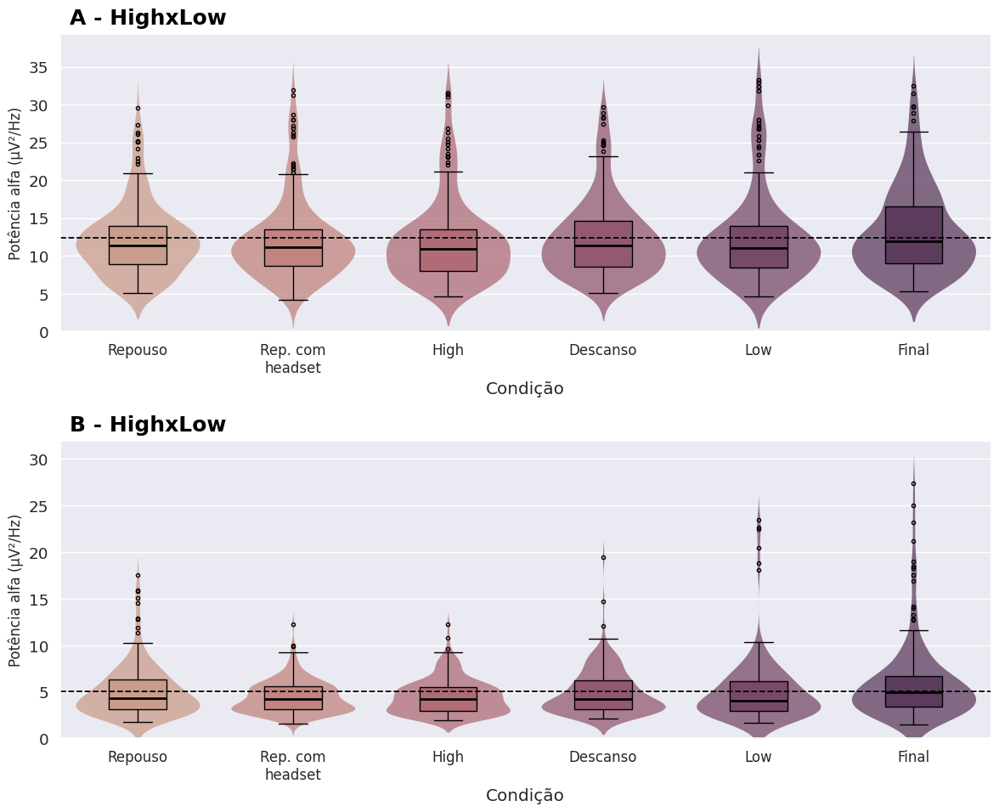

In [149]:
fig_occ_a_1h, axes_occ_a_1h = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_occ_a_1h = axes_occ_a_1h.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_a_1h = [df_alfa_1h_o1_copy,df_alfa_1h_o2]
titles_occ_a_1h = ['A - HighxLow','B - HighxLow']
mean_occ_a_1h = [o1o2_1h_melt_alfa['Alfa_o1'].mean(),o1o2_1h_melt_alfa['Alfa_o2'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset','High', 'Descanso', 'Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_a_1h)):
    data = datasets_occ_a_1h[i]
    ax = flat_axes_occ_a_1h[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_a_1h[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_occ_a_1h[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
    ax.set_ylim(0)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

/tmp/ipython-input-1857584317.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-1857584317.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-1857584317.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-1857584317.py:38: FutureWarning: 

Passing `palette` 

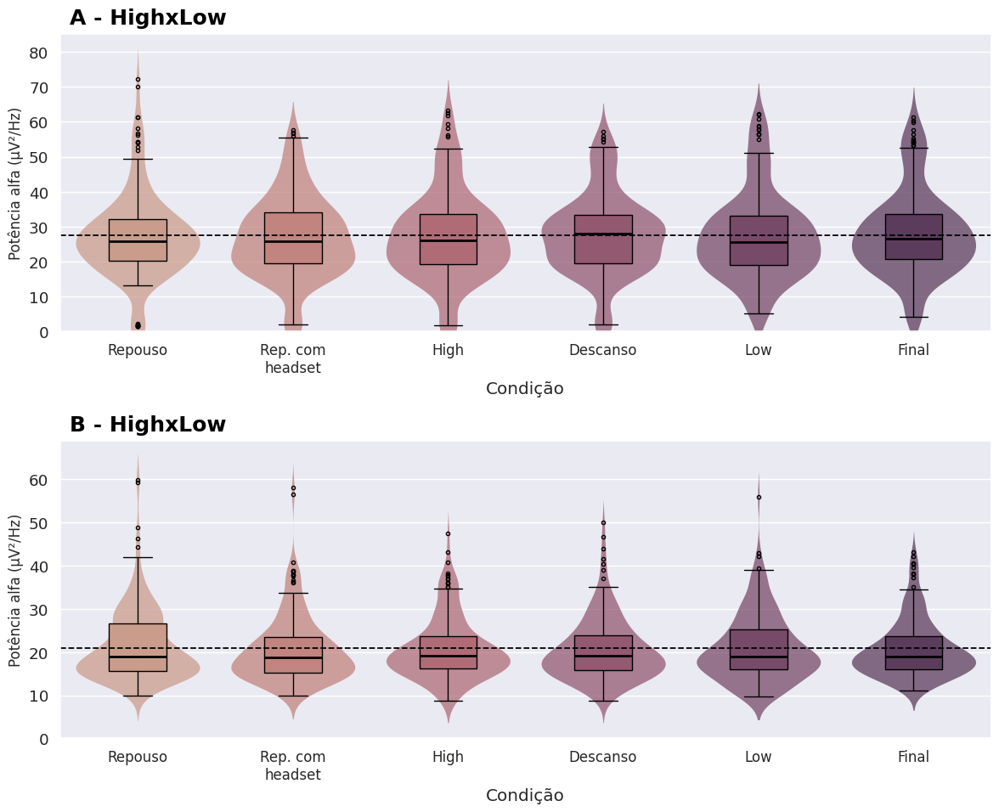

In [150]:
fig_fro_a_1h, axes_fro_a_1h = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_fro_a_1h = axes_fro_a_1h.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_fro_a_1h = [df_alfa_1h_f3_copy,df_alfa_1h_f4]
titles_fro_a_1h = ['A - HighxLow','B - HighxLow']
mean_fro_a_1h = [f3f4_1h_melt_alfa['Alfa_f3'].mean(),f3f4_1h_melt_alfa['Alfa_f4'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset', 'High', 'Descanso', 'Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_fro_a_1h)):
    data = datasets_fro_a_1h[i]
    ax = flat_axes_fro_a_1h[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_fro_a_1h[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='Alfa', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='Alfa',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_fro_a_1h[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
    ax.set_ylim(0)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

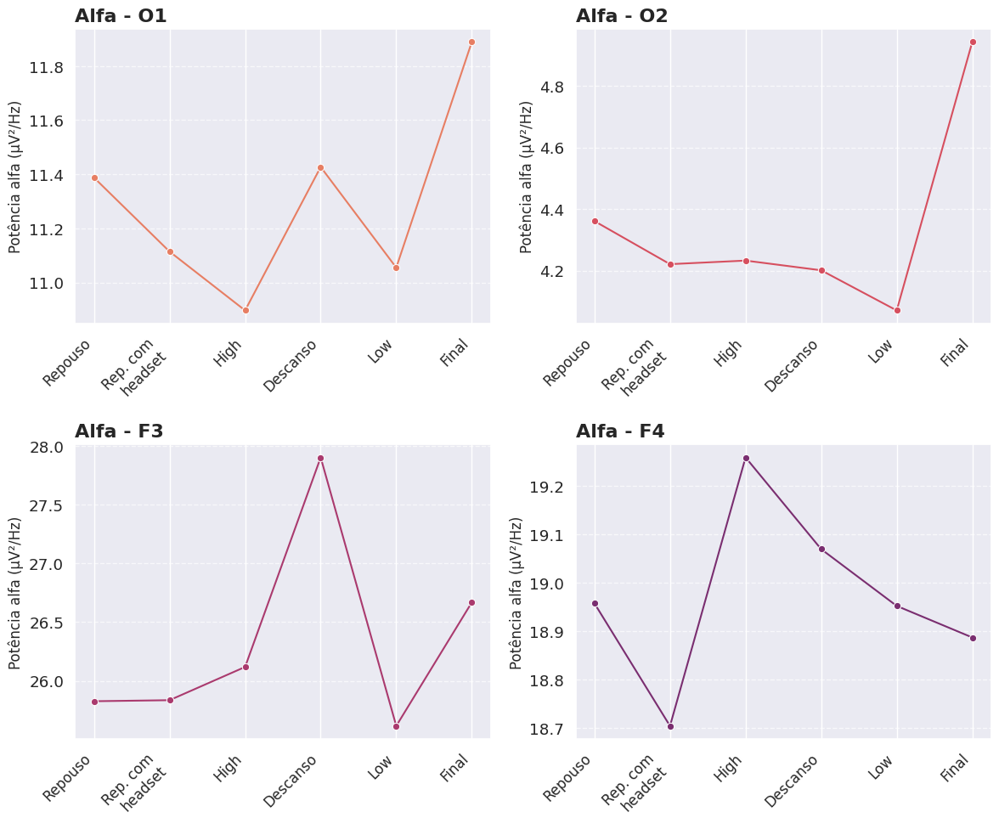

In [151]:
fig_occ_a_1h_line, axes_occ_a_1h_line = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
flat_axes_occ_a_1h_line = axes_occ_a_1h_line.flatten()


# --- 2. DADOS E METADADOS PARA O LOOP ---
datasets_occ_a_1h_line = [df_alfa_1h_o1_copy,df_alfa_1h_o2,df_alfa_1h_f3_copy,df_alfa_1h_f4]
plot_titles = ['Alfa - O1', 'Alfa - O2', 'Alfa - F3','Alfa - F4'] # Títulos mais descritivos
x_labels = ['Repouso', 'Rep. com\nheadset',  'High', 'Descanso', 'Low','Final']
flare = sns.color_palette('flare',n_colors=len(datasets_occ_a_1h_line))
# --- 3. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i, data in enumerate(datasets_occ_a_1h_line):
    ax = flat_axes_occ_a_1h_line[i] # Seleciona o eixo atual (ax[0], ax[1], ...)

    # --- INTEGRAÇÃO DO CÓDIGO INDIVIDUAL AQUI ---
    # Use 'ax=ax' para dizer ao Seaborn onde desenhar o gráfico
    sns.lineplot(
        x='Condição',
        y='Alfa',
        data=data,
        estimator='median', # Usa a mediana
        errorbar=None,      # Sem barra de erro
        marker='o',         # Marcador de círculo
        color=flare[i],    # Cor específica para este subplot
        ax=ax               # **O passo mais importante!**
    )
    # ---------------------------------------------

    # --- CUSTOMIZAÇÃO DO SUBPLOT ATUAL (ax) ---
    ax.set_title(plot_titles[i], fontsize=16, fontweight='bold', loc='left')
    ax.set_ylabel("Potência alfa (μV²/Hz)", fontsize=12)
    ax.set_xlabel(None) # Remove o rótulo do eixo X para não poluir

    # Define a posição e os rótulos do eixo X
    ax.set_xticks(range(len(x_labels))) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12)

    # Adiciona grid para melhor visualização
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Oculta os eixos que não foram usados (se houver)
for i in range(len(datasets_occ_a_1h_line), len(flat_axes_occ_a_1h_line)):
    flat_axes_occ_a_1h_line[i].set_visible(False)


# Melhora o espaçamento entre os gráficos
plt.tight_layout()


##Wilcoxon entre vídeos

In [152]:
## Divisão por condição HxL por canal
o1low_alfa_1h= df_alfa_1h_o1[df_alfa_1h_o1['Condição'] == 'low']['Alfa']
o1high_alfa_1h= df_alfa_1h_o1[df_alfa_1h_o1['Condição'] == 'high']['Alfa']

o2low_alfa_1h= df_alfa_1h_o2[df_alfa_1h_o2['Condição'] == 'low']['Alfa']
o2high_alfa_1h= df_alfa_1h_o2[df_alfa_1h_o2['Condição'] == 'high']['Alfa']

f3low_alfa_1h= df_alfa_1h_f3[df_alfa_1h_f3['Condição'] == 'low']['Alfa']
f3high_alfa_1h= df_alfa_1h_f3[df_alfa_1h_f3['Condição'] == 'high']['Alfa']

f4low_alfa_1h= df_alfa_1h_f4[df_alfa_1h_f4['Condição'] == 'low']['Alfa']
f4high_alfa_1h= df_alfa_1h_f4[df_alfa_1h_f4['Condição'] == 'high']['Alfa']

df_videos_alfa_1h= pd.concat([o1low_alfa_1h, o1high_alfa_1h, o2low_alfa_1h, o2high_alfa_1h, f3low_alfa_1h, f3high_alfa_1h, f4low_alfa_1h, f4high_alfa_1h], axis=1)
df_videos_alfa_1h.describe()

,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa,Alfa
count,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000
mean,12.451206,11.956909,5.079645,4.528288,27.503617,27.446424,20.934113,20.780938
std,5.967208,5.525725,3.488082,1.869547,12.506657,12.707436,7.710119,7.180310
min,4.642027,4.646885,1.701530,1.986531,5.246185,1.696951,9.707375,8.663456
25%,8.491277,7.963248,2.982535,2.944824,18.968256,19.188066,16.024450,16.291397
50%,11.055028,10.896850,4.070715,4.232602,25.615022,26.118001,18.951592,19.258168
75%,14.007518,13.539155,6.152944,5.529428,33.098328,33.590200,25.258197,23.762853
max,33.311465,31.537878,23.497413,12.234517,62.325675,63.184115,55.879034,47.391720


In [153]:
## Wilcoxon - comparação entre condições de vídeo
stat_alfa_1h_o1, p_alfa_1h_o1 = wilcoxon(o1low_alfa_1h, o1high_alfa_1h)
print("Comparação entre vídeos - HighXLow - alfa")
print('O1-Wilcoxon Statistic:', stat_alfa_1h_o1)
print('O1-p-value:', p_alfa_1h_o1)
stat_alfa_1h_o2, p_alfa_1h_o2 = wilcoxon(o2low_alfa_1h, o2high_alfa_1h)
print('O2-Wilcoxon Statistic:', stat_alfa_1h_o2)
print('O2-p-value:', p_alfa_1h_o2)
stat_alfa_1h_f3, p_alfa_1h_f3 = wilcoxon(f3low_alfa_1h, f3high_alfa_1h)
print('F3-Wilcoxon Statistic:', stat_alfa_1h_f3)
print('F3-p-value:', p_alfa_1h_f3)
stat_alfa_1h_f4, p_alfa_1h_f4 = wilcoxon(f4low_alfa_1h, f4high_alfa_1h)
print('F4-Wilcoxon Statistic:', stat_alfa_1h_f4)
print('F4-Wilcoxon Statistic:', p_alfa_1h_f4)

Comparação entre vídeos - HighXLow - alfa
O1-Wilcoxon Statistic: 7707.0
O1-p-value: 0.04343974731017783
O2-Wilcoxon Statistic: 7869.0
O2-p-value: 0.07039819161560022
F3-Wilcoxon Statistic: 8897.0
F3-p-value: 0.6340703965528482
F4-Wilcoxon Statistic: 8825.0
F4-Wilcoxon Statistic: 0.5690909039166316


In [154]:
o1alfa_1h = [o1high_alfa_1h,o1low_alfa_1h]
o2alfa_1h = [o2high_alfa_1h,o2low_alfa_1h]
f3alfa_1h = [f3high_alfa_1h,f3low_alfa_1h]
f4alfa_1h = [f4high_alfa_1h,f4low_alfa_1h]


/tmp/ipython-input-742828281.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df,
/tmp/ipython-input-742828281.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df,
/tmp/ipython-input-742828281.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df,
/tmp/ipython-input-742828281.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` fo

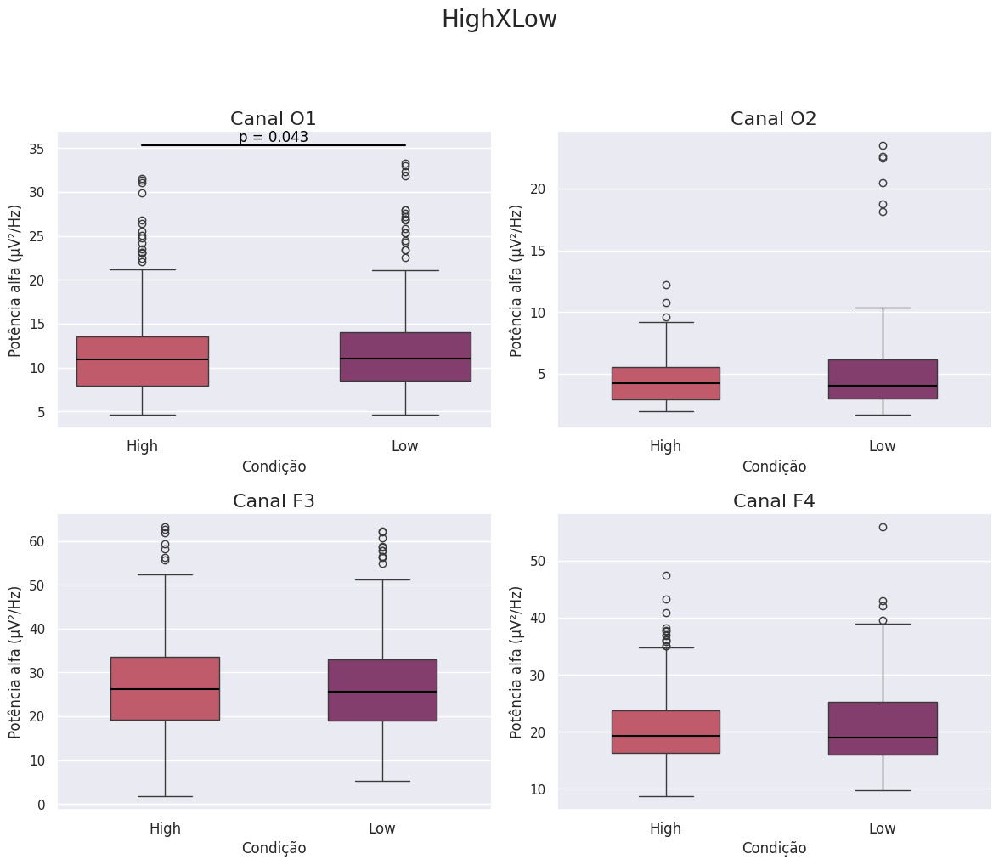

In [155]:
# --- 3. Preparação dos Dados para os Gráficos ---
# É melhor colocar os dados em um DataFrame para usar com o seaborn

# DataFrame para O1
df_o1_h = pd.DataFrame({
    'Valor': np.concatenate([ o1high_alfa_1h, o1low_alfa_1h]),
    'Condição': ['High'] * len(o1high_alfa_1h) + ['Low'] * len(o1low_alfa_1h)
})

# DataFrame para O2
df_o2_h = pd.DataFrame({
    'Valor': np.concatenate([ o2high_alfa_1h, o2low_alfa_1h]),
    'Condição':  ['High'] * len(o2high_alfa_1h) + ['Low'] * len(o2low_alfa_1h)
})

# DataFrame para F3
df_f3_h = pd.DataFrame({
    'Valor': np.concatenate([ f3high_alfa_1h, f3low_alfa_1h]),
    'Condição':  ['High'] * len(f3high_alfa_1h) + ['Low'] * len(f3low_alfa_1h)
})

# DataFrame para F4
df_f4_h = pd.DataFrame({
    'Valor': np.concatenate([ f4high_alfa_1h, f4low_alfa_1h]),
    'Condição':  ['High'] * len(f4high_alfa_1h) + ['Low'] * len(f4low_alfa_1h)
})
# --- 2. Função para formatar o p-valor (sem alterações) ---
def format_p_value(p):
    if p < 0.001:
        return "p < 0.001"
    elif p >= 0.05:
        return f"p = {p:.3f} (ns)" # Adicionei 'ns' para não significativo
    else:
        return f"p = {p:.3f}"

# --- 3. CRIAÇÃO DOS GRÁFICOS EM UMA ÚNICA FIGURA ---

# Crie a figura e uma grade de subplots 2x2.
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# "Achatamos" a matriz de eixos em uma lista simples para facilitar o loop
flat_axes = axes.flatten()

# Crie listas com os dados e metadados para o loop
dataframes = [df_o1_h, df_o2_h, df_f3_h, df_f4_h]
p_values = [p_alfa_1h_o1, p_alfa_1h_o2, p_alfa_1h_f3, p_alfa_1h_f4]
titles = ['Canal O1', 'Canal O2', 'Canal F3', 'Canal F4']

# Loop para criar cada um dos 4 gráficos
for i in range(len(dataframes)):
    df = dataframes[i]
    p_val = p_values[i]
    ax = flat_axes[i]  # Pega o eixo correto para o gráfico atual
    title = titles[i]

    # Plote o boxplot NO EIXO ESPECÍFICO usando o argumento 'ax'
    sns.boxplot(x='Condição', y='Valor', data=df,
                palette=['#d14a61','#8f3371'],
                width=0.5,
                medianprops={'linewidth': 1.5, 'color': 'black'},
                ax=ax)

    # Adicionando anotação de p-valor, se for significativo
    if p_val < 0.05:
        y_max = df['Valor'].max()
        bar_height = y_max * 1.06

        # Correção: A linha horizontal vai de x=0 a x=1
        ax.plot([0, 1], [bar_height, bar_height], lw=1.5, c='black')
        ax.text(0.5, bar_height, format_p_value(p_val), ha='center', va='bottom', color='black', fontsize=12)

    # Customizar cada subplot individualmente
    ax.set_title(title, fontsize=16)
    ax.set_ylabel('Potência alfa (μV²/Hz)', fontsize=12)
    ax.set_xlabel('Condição', fontsize=12)
    ax.tick_params(axis='y', labelsize=11)
    ax.tick_params(axis='x', labelsize=12)
    sns.despine(ax=ax) # Remove as bordas de cima e da direita de cada subplot

# Adiciona um título geral para a figura inteira
fig.suptitle("HighXLow", fontsize=20, y=1.02)

# Ajusta o espaçamento entre os subplots
plt.tight_layout(rect=[0, 0, 1, 0.97])

# Exibe a figura final
plt.show()


/tmp/ipython-input-1459646909.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Condição',y='Valor',data=df_o1_h, palette=[ '#d14a61','#8f3371'], inner=None, ax=ax1, linewidth=0, saturation=0.5, alpha=0.74)
/tmp/ipython-input-1459646909.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição',y='Valor',data=df_o1_h,  palette=[ '#d14a61','#8f3371'],saturation=0.5,width=0.37, linecolor='black', linewidth=1,


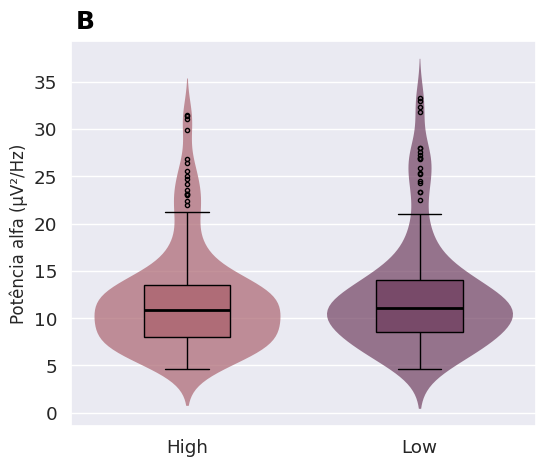

In [156]:
fig, ax1 = plt.subplots(figsize=(6,5))
titles = 'B'


sns.violinplot(x='Condição',y='Valor',data=df_o1_h, palette=[ '#d14a61','#8f3371'], inner=None, ax=ax1, linewidth=0, saturation=0.5, alpha=0.74)
sns.boxplot(x='Condição',y='Valor',data=df_o1_h,  palette=[ '#d14a61','#8f3371'],saturation=0.5,width=0.37, linecolor='black', linewidth=1,
            medianprops={'color': 'black', 'linewidth': 2}, boxprops={'zorder': 2},ax=ax1, fliersize=3)
plt.ylabel("Potência alfa (μV²/Hz)", fontsize=12)
plt.xlabel(None)
ax1.set_title(titles, fontsize= 18,
        fontweight= 'bold',
        color= 'black',
        loc= 'left',  # Alinha o título à esquerda
        x= 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        y= 1.01)
plt.show()

## Assimetria - HIGH FIRST

In [157]:
f3low_alfa_1h = df_alfa_1h_f3[df_alfa_1h_f3['Condição'] == 'low']['Alfa'].reset_index(drop=True)
f3high_alfa_1h = df_alfa_1h_f3[df_alfa_1h_f3['Condição'] == 'high']['Alfa'].reset_index(drop=True)

f4low_alfa_1h = df_alfa_1h_f4[df_alfa_1h_f4['Condição'] == 'low']['Alfa'].reset_index(drop=True)
f4high_alfa_1h = df_alfa_1h_f4[df_alfa_1h_f4['Condição'] == 'high']['Alfa'].reset_index(drop=True)

df_videos_alfa_1h = pd.concat([f3low_alfa_1h, f3high_alfa_1h, f4low_alfa_1h, f4high_alfa_1h], axis=1)
df_videos_alfa_1h.describe()

,Alfa,Alfa,Alfa,Alfa
count,192.000000,192.000000,192.000000,192.000000
mean,27.503617,27.446424,20.934113,20.780938
std,12.506657,12.707436,7.710119,7.180310
min,5.246185,1.696951,9.707375,8.663456
25%,18.968256,19.188066,16.024450,16.291397
50%,25.615022,26.118001,18.951592,19.258168
75%,33.098328,33.590200,25.258197,23.762853
max,62.325675,63.184115,55.879034,47.391720


In [158]:
afa_1h_low = (f4low_alfa_1h - f3low_alfa_1h)/(f4low_alfa_1h + f3low_alfa_1h)
afa_1h_high = (f4high_alfa_1h - f3high_alfa_1h)/(f4high_alfa_1h + f3high_alfa_1h)
df_afa_1h = pd.concat([ afa_1h_high,afa_1h_low], axis=1)
df_afa_1h.columns = ['High','Low']
df_afa_1h

,High,Low
0,-0.321370,-0.320827
1,0.094332,-0.001554
2,-0.121971,-0.185452
3,-0.019103,-0.138335
4,-0.146254,-0.160550
...,...,...
187,-0.073270,-0.018115
188,-0.075134,-0.032923
189,0.017726,0.110488
190,-0.261948,-0.324634


In [159]:
## Wilcoxon - comparação entre condições de vídeo
stat_afa, p_afa = wilcoxon(afa_1h_low, afa_1h_high)
print('AFA-Wilcoxon Statistic:%.8f' % stat_afa)
print('AFA-p-value:%.8f' % p_afa)


AFA-Wilcoxon Statistic:8202.00000000
AFA-p-value:0.16837840


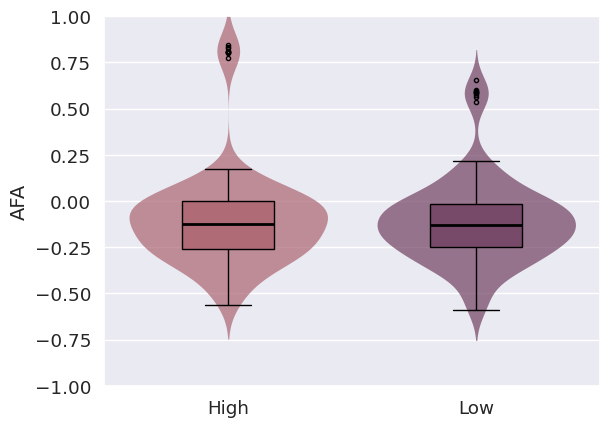

In [160]:
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles

sns.violinplot(data=df_afa_1h,  palette=['#d14a61','#8f3371'], inner=None, linewidth=0, saturation=0.5,alpha=0.74)
sns.boxplot(data=df_afa_1h, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette=['#d14a61','#8f3371'], boxprops={'zorder': 2},fliersize=3)
plt.ylabel("AFA", fontsize=14)
plt.ylim(-1,1)

# Exibe a figura final
plt.show()

# BETA

In [163]:
df_beta_1h = df_beta_1h.drop(columns=['ordem'])
df_beta_1l = df_beta_1l.drop(columns=['ordem'])

## LOW FIRST

In [164]:
## Dividir dados por canal
df_beta_1l_o1= df_beta_1l[df_beta_1l['Canal'] == 'o1']
df_beta_1l_o2= df_beta_1l[df_beta_1l['Canal'] == 'o2']
df_beta_1l_f3= df_beta_1l[df_beta_1l['Canal'] == 'f3']
df_beta_1l_f4= df_beta_1l[df_beta_1l['Canal'] == 'f4']

In [165]:
df_beta_1l_o2

,Participante,Idade,Sexo,Frequencias,beta,Canal,Condição
1613,PT_04,49.0,Feminino,12.695312,3.713390,o2,rep
1614,PT_05,19.0,Masculino,12.695312,4.163916,o2,rep
1617,PT_10,21.0,Feminino,12.695312,6.868393,o2,rep
1618,PT_11,23.0,Feminino,12.695312,4.375906,o2,rep
1620,PT_14,21.0,Feminino,12.695312,5.043942,o2,rep
...,...,...,...,...,...,...,...
35477,PT_15,23.0,Masculino,31.738281,1.982240,o2,final
35478,PT_16,22.0,Feminino,31.738281,1.628479,o2,final
35482,PT_20,22.0,Masculino,31.738281,1.151694,o2,final
35483,PT_21,26.0,Masculino,31.738281,1.140494,o2,final


In [166]:
df_beta_1l_o1_copy= df_beta_1l_o1.copy()
df_beta_1l_o2_copy= df_beta_1l_o2.copy()
df_beta_1l_f3_copy= df_beta_1l_f3.copy()
df_beta_1l_f4_copy= df_beta_1l_f4.copy()
df_beta_1l_o1_copy = df_beta_1l_o1_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1l_o1_copy = df_beta_1l_o1_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_beta_1l_o2_copy = df_beta_1l_o2_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1l_o2_copy = df_beta_1l_o2_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_beta_1l_f3_copy = df_beta_1l_f3_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1l_f3_copy = df_beta_1l_f3_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_beta_1l_f4_copy = df_beta_1l_f4_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1l_f4_copy = df_beta_1l_f4_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)

In [167]:
##Dicionário para renomear elementos da coluna "Condição"
renome_condicoes = {
    'rep': 'Repouso',
    'baseoc': 'Rep. com headset',
    'high': 'High',
    'desc': 'Descanso',
    'low': 'Low',
    'final': 'Final'
}

# Use o dicionário na função .replace()
df_beta_1l_o1_copy['Condição'] = df_beta_1l_o1_copy['Condição'].replace(renome_condicoes)
df_beta_1l_o2_copy['Condição'] = df_beta_1l_o2_copy['Condição'].replace(renome_condicoes)
df_beta_1l_f3_copy['Condição'] = df_beta_1l_f3_copy['Condição'].replace(renome_condicoes)
df_beta_1l_f4_copy['Condição'] = df_beta_1l_f4_copy['Condição'].replace(renome_condicoes)

In [168]:
## Criar dicionário para personalizar a ordem dos elementos em "Condição"
ordem_condicao = ['Repouso','Rep. com headset','Low','Descanso','High','Final']
df_beta_1l_o1_copy['Condição'] = pd.Categorical(df_beta_1l_o1_copy['Condição'], categories=ordem_condicao, ordered=True)
df_beta_1l_o2_copy['Condição'] = pd.Categorical(df_beta_1l_o2_copy['Condição'], categories=ordem_condicao, ordered=True)
df_beta_1l_f3_copy['Condição'] = pd.Categorical(df_beta_1l_f3_copy['Condição'], categories=ordem_condicao, ordered=True)
df_beta_1l_f4_copy['Condição'] = pd.Categorical(df_beta_1l_f4_copy['Condição'], categories=ordem_condicao, ordered=True)



In [169]:
df_beta_1l_f3_copy

,Participante,Frequencias,beta,Condição
0,PT_04,12.695312,31.292613,Repouso
1,PT_05,12.695312,23.831611,Repouso
2,PT_10,12.695312,21.070710,Repouso
3,PT_11,12.695312,34.812998,Repouso
4,PT_14,12.695312,18.888436,Repouso
...,...,...,...,...
4501,PT_15,31.738281,13.654355,Final
4502,PT_16,31.738281,7.384117,Final
4503,PT_20,31.738281,15.910546,Final
4504,PT_21,31.738281,11.242005,Final


In [170]:
o1o2_1l_melt_beta = pd.concat([df_beta_1l_o1_copy[['Participante','Condição','beta']], df_beta_1l_o2_copy[['beta']]],axis=1)
o1o2_1l_melt_beta.columns = ['Participante', 'Condição', 'beta_o1', 'beta_o2']
f3f4_1l_melt_beta = pd.concat([df_beta_1l_f3_copy[['Participante','Condição','beta']], df_beta_1l_f4_copy[['beta']]],axis=1)
f3f4_1l_melt_beta.columns = ['Participante', 'Condição', 'beta_f3', 'beta_f4']

In [171]:
o1o2_1l_melt_beta

,Participante,Condição,beta_o1,beta_o2
0,PT_04,Repouso,16.257360,3.713390
1,PT_05,Repouso,14.567384,4.163916
2,PT_10,Repouso,20.416590,6.868393
3,PT_11,Repouso,24.751468,4.375906
4,PT_14,Repouso,7.807300,5.043942
...,...,...,...,...
4501,PT_15,Final,3.585774,1.982240
4502,PT_16,Final,2.576786,1.628479
4503,PT_20,Final,8.800920,1.151694
4504,PT_21,Final,4.717563,1.140494


In [172]:
def processar_df_para_friedman(df):
    """
    Pivota e retorna o DataFrame no formato 'wide'
    para o Teste de Friedman.
    """

    # Pivotagem: Transforma para o formato wide (Participante x Condição)
    df_wide = df.pivot_table(
        index='Participante',
        columns='Condição',
        values='beta',
        aggfunc='median'
    )
    return df_wide

# Armazene seus DataFrames originais em um dicionário
dfs_long = {
    'o1': df_beta_1l_o1_copy,
    'o2': df_beta_1l_o2_copy,
    'f3': df_beta_1l_f3_copy,
    'f4': df_beta_1l_f4_copy,
}

# Dicionário para armazenar os novos DataFrames no formato 'wide'
dfs_wide = {}

for name, df in dfs_long.items():
    # Aplica a função de processamento a cada DataFrame
    df_wide = processar_df_para_friedman(df)

    # Armazena o resultado no novo dicionário
    dfs_wide[f'f_{name}_1l_beta_wide'] = df_wide

# --------------------------------------------------------
# 4. Acesso aos Resultados
# --------------------------------------------------------

# Agora você pode acessar os DataFrames pivotados pelo dicionário:
# Exemplo 1: df_beta_1l_o1_copy -> f_o1_1l_beta_wide
f_o1_1l_beta_wide = dfs_wide['f_o1_1l_beta_wide'].reset_index(drop=True)
f_o2_1l_beta_wide = dfs_wide['f_o2_1l_beta_wide'].reset_index(drop=True)
f_f3_1l_beta_wide = dfs_wide['f_f3_1l_beta_wide'].reset_index(drop=True)
f_f4_1l_beta_wide = dfs_wide['f_f4_1l_beta_wide'].reset_index(drop=True)

## Confirmação do dataframe estar no formato "wide"
f_f3_1l_beta_wide.shape

/tmp/ipython-input-2148538697.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-2148538697.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-2148538697.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-2148538697.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=Fa

(19, 6)

In [173]:
np_o1_1l_beta = f_o1_1l_beta_wide.to_numpy()
np_o2_1l_beta = f_o2_1l_beta_wide.to_numpy()
np_f3_1l_beta = f_f3_1l_beta_wide.to_numpy()
np_f4_1l_beta = f_f4_1l_beta_wide.to_numpy()

In [174]:
f_o1_1l_beta_wide

Condição,Repouso,Rep. com headset,Low,Descanso,High,Final
0,5.765219,5.802431,4.644974,6.013978,4.997051,5.007173
1,8.945002,9.903634,9.666583,9.850643,10.180682,10.134028
2,10.272902,12.426291,13.104861,12.553068,13.393214,16.277198
3,9.433251,7.159507,5.416621,4.578986,5.345452,4.696063
4,18.923719,12.294730,11.810488,9.706194,10.230574,9.776303
5,5.110104,6.329802,5.460652,5.927951,5.385028,8.686102
6,4.896044,6.617456,7.278524,6.704214,6.260936,6.450132
7,4.328801,5.463398,5.225262,4.791327,4.742962,5.269695
8,10.679207,12.686878,11.576968,11.813924,11.005281,14.304417
9,6.913653,6.651783,6.936719,6.802326,7.498960,7.612558


In [196]:
# Now perform the Friedman test on the cleaned dataframes
f_beta_lowo1, p_beta_lowo1 = friedmanchisquare(*np_o1_1l_beta.T)
print(f'O1 \nValor do teste: {f_beta_lowo1:.4f}\np-valor: {p_beta_lowo1:.4f}')

f_beta_lowo2, p_beta_lowo2 = friedmanchisquare(*np_o2_1l_beta.T)
print(f'O2 \nValor do teste: {f_beta_lowo2:.4f}\np-valor: {p_beta_lowo2:.4f}')

f_beta_lowf3, p_beta_lowf3 = friedmanchisquare(*np_f3_1l_beta.T)
print(f'F3 \nValor do teste: {f_beta_lowf3:.4f}\np-valor: {p_beta_lowf3:.4f}')

f_beta_lowf4, p_beta_lowf4 = friedmanchisquare(*np_f4_1l_beta.T)
print(f'F4 \nValor do teste: {f_beta_lowf4:.4f}\np-valor: {p_beta_lowf4:.4f}')


O1 
Valor do teste: 6.3985
p-valor: 0.2694
O2 
Valor do teste: 7.8722
p-valor: 0.1634
F3 
Valor do teste: 5.2857
p-valor: 0.3820
F4 
Valor do teste: 6.3383
p-valor: 0.2747


/tmp/ipython-input-2764618408.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-2764618408.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-2764618408.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-2764618408.py:38: FutureWarning: 

Passing `palette` 

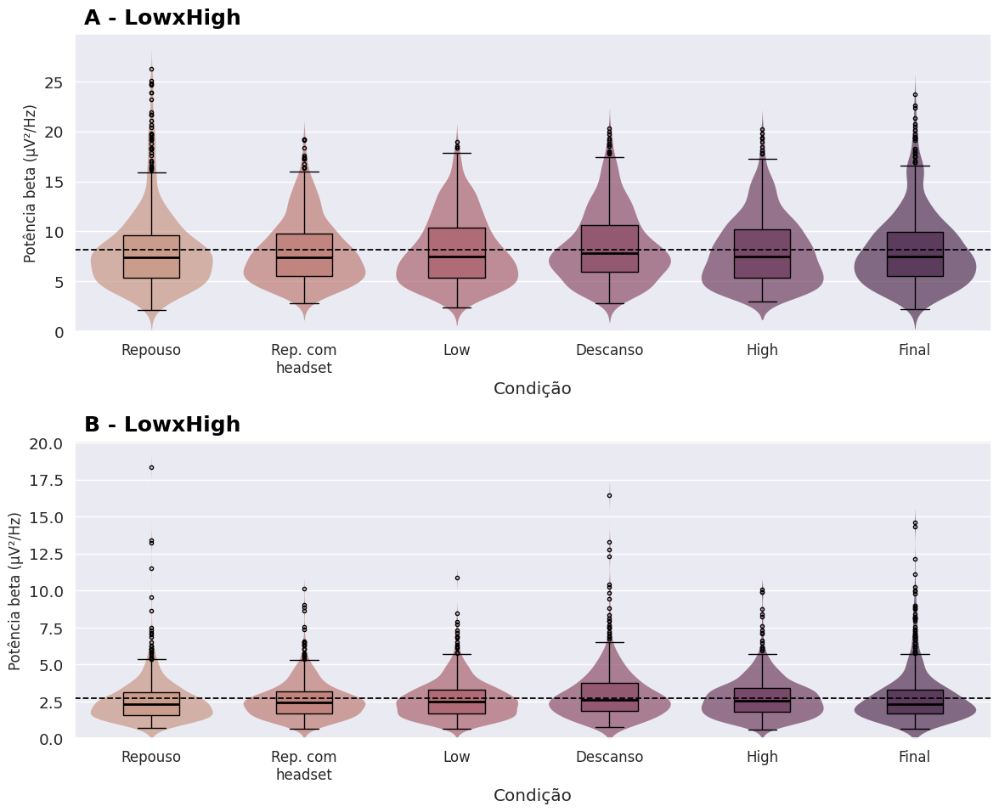

In [176]:
fig_occ_b_1l, axes_occ_b_1l = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_occ_b_1l = axes_occ_b_1l.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_b_1l = [df_beta_1l_o1_copy,df_beta_1l_o2]
titles_occ_b_1l = ['A - LowxHigh','B - LowxHigh']
mean_occ_b_1l = [o1o2_1l_melt_beta['beta_o1'].mean(),o1o2_1l_melt_beta['beta_o2'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset','Low', 'Descanso', 'High','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_b_1l)):
    data = datasets_occ_b_1l[i]
    ax = flat_axes_occ_b_1l[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_b_1l[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_occ_b_1l[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
    ax.set_ylim(0)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

/tmp/ipython-input-63413006.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-63413006.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-63413006.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-63413006.py:38: FutureWarning: 

Passing `palette` without 

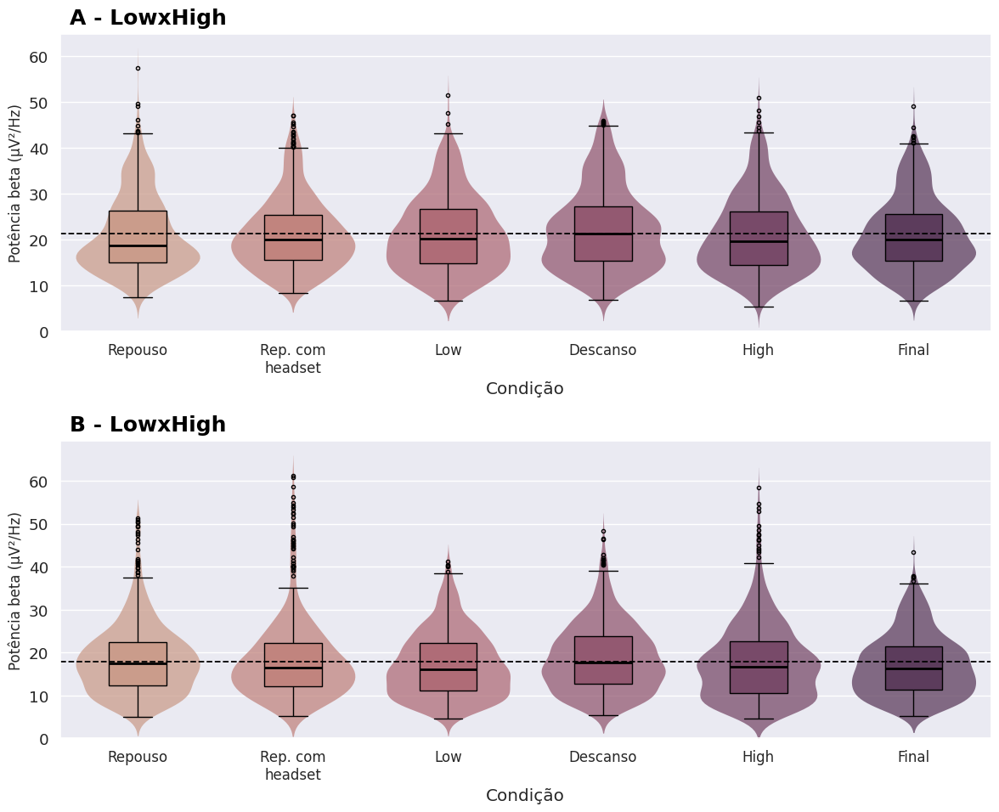

In [177]:
fig_fro_b_1l, axes_fro_b_1l = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_fro_b_1l = axes_fro_b_1l.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_fro_b_1l = [df_beta_1l_f3_copy,df_beta_1l_f4]
titles_fro_b_1l = ['A - LowxHigh','B - LowxHigh']
mean_fro_b_1l = [f3f4_1l_melt_beta['beta_f3'].mean(),f3f4_1l_melt_beta['beta_f4'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset','Low', 'Descanso', 'High','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_fro_b_1l)):
    data = datasets_fro_b_1l[i]
    ax = flat_axes_fro_b_1l[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_fro_b_1l[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_fro_b_1l[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
    ax.set_ylim(0)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

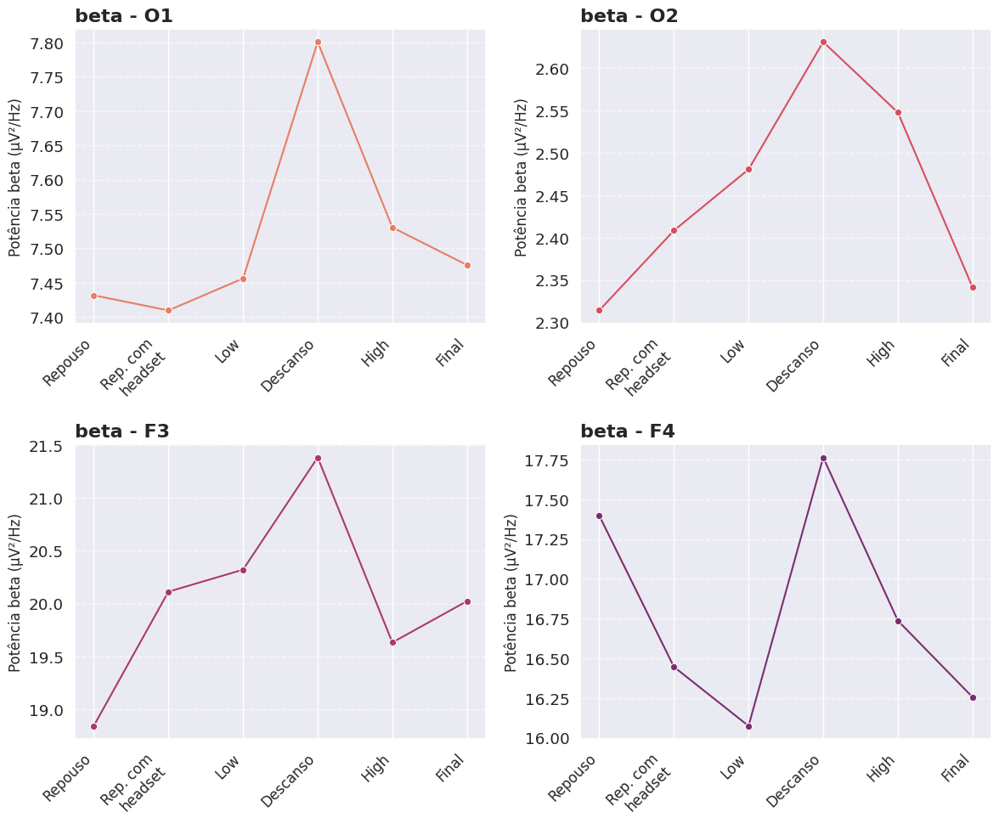

In [178]:
fig_occ_b_1l_line, axes_occ_b_1l_line = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
flat_axes_occ_b_1l_line = axes_occ_b_1l_line.flatten()


# --- 2. DADOS E METADADOS PARA O LOOP ---
datasets_occ_b_1l_line = [df_beta_1l_o1_copy,df_beta_1l_o2,df_beta_1l_f3_copy,df_beta_1l_f4]
plot_titles = ['beta - O1', 'beta - O2', 'beta - F3','beta - F4'] # Títulos mais descritivos
x_labels = ['Repouso', 'Rep. com\nheadset', 'Low',  'Descanso','High', 'Final']
flare = sns.color_palette('flare',n_colors=len(datasets_occ_b_1l_line))
# --- 3. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i, data in enumerate(datasets_occ_b_1l_line):
    ax = flat_axes_occ_b_1l_line[i] # Seleciona o eixo atual (ax[0], ax[1], ...)

    # --- INTEGRAÇÃO DO CÓDIGO INDIVIDUAL AQUI ---
    # Use 'ax=ax' para dizer ao Seaborn onde desenhar o gráfico
    sns.lineplot(
        x='Condição',
        y='beta',
        data=data,
        estimator='median', # Usa a mediana
        errorbar=None,      # Sem barra de erro
        marker='o',         # Marcador de círculo
        color=flare[i],    # Cor específica para este subplot
        ax=ax               # **O passo mais importante!**
    )
    # ---------------------------------------------

    # --- CUSTOMIZAÇÃO DO SUBPLOT ATUAL (ax) ---
    ax.set_title(plot_titles[i], fontsize=16, fontweight='bold', loc='left')
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xlabel(None) # Remove o rótulo do eixo X para não poluir

    # Define a posição e os rótulos do eixo X
    ax.set_xticks(range(len(x_labels))) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12)

    # Adiciona grid para melhor visualização
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Oculta os eixos que não foram usados (se houver)
for i in range(len(datasets_occ_b_1l_line), len(flat_axes_occ_b_1l_line)):
    flat_axes_occ_b_1l_line[i].set_visible(False)


# Melhora o espaçamento entre os gráficos
plt.tight_layout()


## LOW FIRST - wilcoxon entre videos

In [ ]:
## Dividir dados por canal
df_beta_1l_o1= df_beta_1l[df_beta_1l['Canal'] == 'o1']
df_beta_1l_o2= df_beta_1l[df_beta_1l['Canal'] == 'o2']
df_beta_1l_f3= df_beta_1l[df_beta_1l['Canal'] == 'f3']
df_beta_1l_f4= df_beta_1l[df_beta_1l['Canal'] == 'f4']

In [ ]:
## Divisão por condição HxL por canal
o1low_beta_1l = df_beta_1l_o1[df_beta_1l_o1['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

o1high_beta_1l = df_beta_1l_o1[df_beta_1l_o1['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)


o2low_beta_1l = df_beta_1l_o2[df_beta_1l_o2['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

o2high_beta_1l = df_beta_1l_o2[df_beta_1l_o2['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)


f3low_beta_1l = df_beta_1l_f3[df_beta_1l_f3['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

f3high_beta_1l = df_beta_1l_f3[df_beta_1l_f3['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)


f4low_beta_1l = df_beta_1l_f4[df_beta_1l_f4['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

f4high_beta_1l = df_beta_1l_f4[df_beta_1l_f4['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)



In [ ]:
o1b_1l = pd.concat([o1low_beta_1l, o1high_beta_1l],axis=1)
o2b_1l = pd.concat([o2low_beta_1l, o2high_beta_1l],axis=1)
f3b_1l = pd.concat([f3low_beta_1l, f3high_beta_1l],axis=1)
f4b_1l = pd.concat([f4low_beta_1l, f4high_beta_1l],axis=1)
o1b_1l.columns = ['Low', 'High']
o2b_1l.columns = ['Low', 'High']
f3b_1l.columns = ['Low', 'High']
f4b_1l.columns = ['Low', 'High']

In [ ]:
## Wilcoxon - comparação entre condições de vídeo
stat_beta_1l_o1, p_beta_1l_o1 = wilcoxon(o1low_beta_1l, o1high_beta_1l)
print('Comparação entre vídeos - LowXHigh - beta')
print('O1-Wilcoxon Statistic:' ,stat_beta_1l_o1)
print('O1-p-value:' ,p_beta_1l_o1)
stat_beta_1l_o2, p_beta_1l_o2 = wilcoxon(o2low_beta_1l, o2high_beta_1l)
print('O2-Wilcoxon Statistic:' ,stat_beta_1l_o2)
print('O2-p-value:' ,p_beta_1l_o2)
stat_beta_1l_f3, p_beta_1l_f3 = wilcoxon(f3low_beta_1l, f3high_beta_1l)
print('F3-Wilcoxon Statistic:' ,stat_beta_1l_f3)
print('F3-p-value:' ,p_beta_1l_f3)
stat_beta_1l_f4, p_beta_1l_f4 = wilcoxon(f4low_beta_1l, f4high_beta_1l)
print('F4-Wilcoxon Statistic:' ,stat_beta_1l_f4)
print('F4-Wilcoxon p-value:' ,p_beta_1l_f4)

Comparação entre vídeos - LowXHigh - beta
O1-Wilcoxon Statistic: 136118.0
O1-p-value: 0.3939248628926717
O2-Wilcoxon Statistic: 120425.0
O2-p-value: 0.0004806736276668293
F3-Wilcoxon Statistic: 137778.0
F3-p-value: 0.5663793134590167
F4-Wilcoxon Statistic: 134636.0
F4-Wilcoxon p-value: 0.27058353281394465


/tmp/ipython-input-4091701893.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)


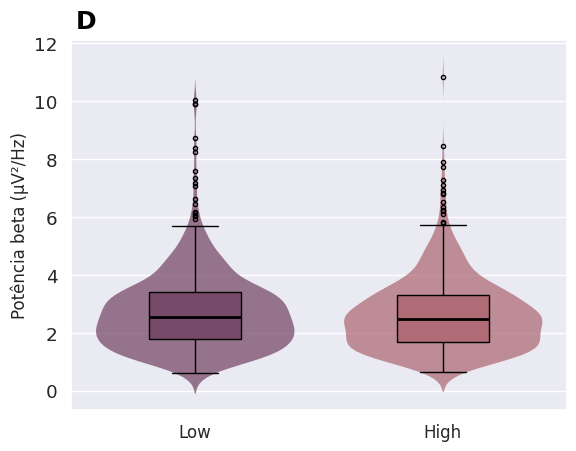

In [ ]:
# Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
ax=sns.violinplot(data=o2b_1l,  palette=['#8f3371','#d14a61'], inner=None, linewidth=0, saturation=0.5,alpha=0.74)
sns.boxplot(data=o2b_1l, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
palette=['#8f3371','#d14a61'], boxprops={'zorder': 2}, ax=ax, fliersize=3)
# Customizar cada subplot individualmente
ax.set_title(title,fontsize= 18, fontweight= 'bold',color= 'black', loc= 'left', x= 0.01,y= 1.01 )
# Customização dos eixos (seu código original)
ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
ax.set_xticklabels(x_labels, fontsize=12)
plt.show()

/tmp/ipython-input-337387050.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-337387050.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-337387050.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-337387050.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)


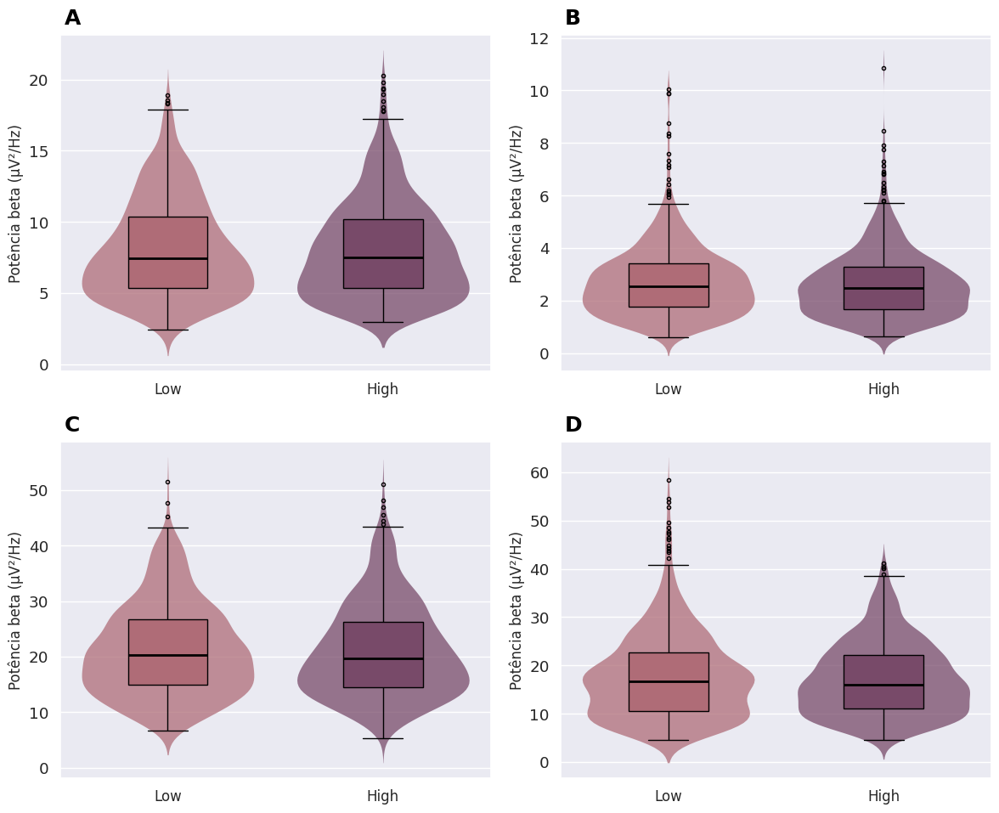

In [ ]:
fig_occ_b, axes_occ_b = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Para facilitar o uso no loop, "achatamos" a grade 2x2 em uma lista simples de 4 eixos
flat_axes_occ_b = axes_occ_b.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_b = [o1b_1l,o2b_1l,f3b_1l,f4b_1l]
titles_occ_b = ['A','B','C','D']
x_labels=['Low', 'High']

# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_b)):
    data = datasets_occ_b[i]
    ax = flat_axes_occ_b[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_b[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data,  palette=['#d14a61','#8f3371'], inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette=['#d14a61','#8f3371'], boxprops={'zorder': 2}, ax=ax, fliersize=3)
    # Customizar cada subplot individualmente
    ax.set_title(title,fontsize= 18,
        fontweight= 'bold',
        color= 'black',
        loc= 'left',  # Alinha o título à esquerda
        x= 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        y= 1.01 )
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)

# Adiciona um espaçamento para evitar que os títulos se sobreponham
plt.tight_layout(rect=[0, 0, 1, 0.98])


# Exibe a figura final
plt.show()

/tmp/ipython-input-1922630677.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
/tmp/ipython-input-1922630677.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
/tmp/ipython-input-1922630677.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
/tmp/ipython-input-1922630677.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to 

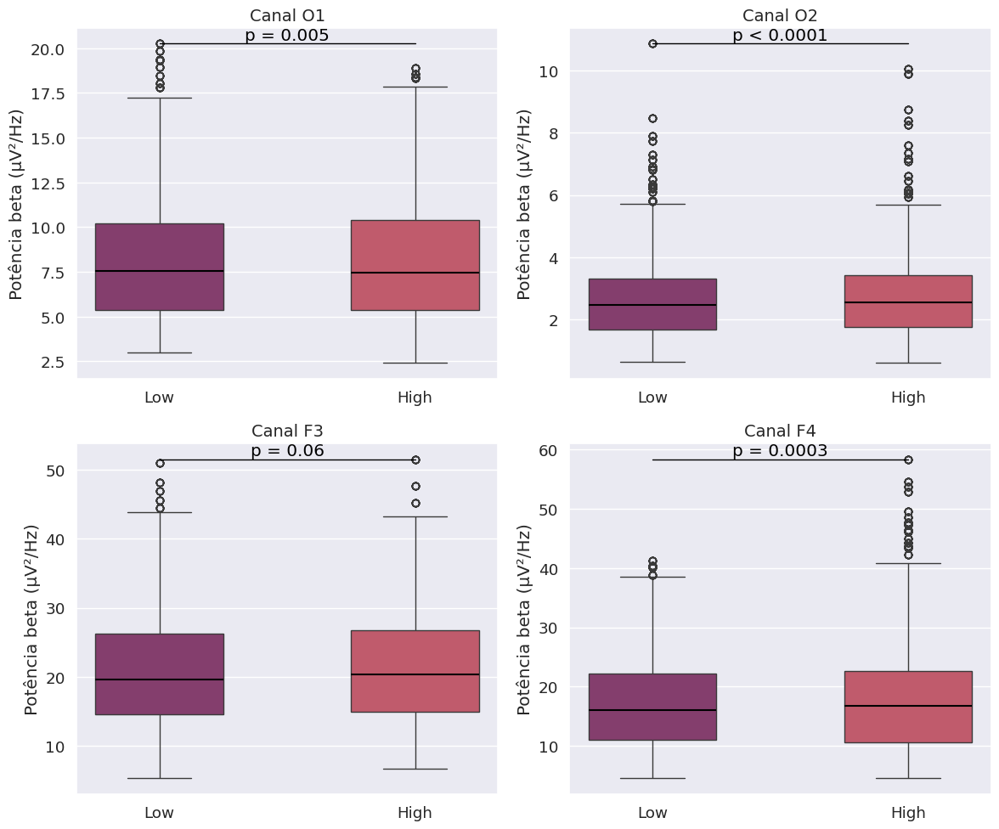

In [ ]:

# Armazene os p-valores em um dicionário para fácil acesso
p_valores = {
    'O1': p_beta_1l_o1,
    'O2': p_beta_1l_o2,
    'F3': p_beta_1l_f3,
    'F4': p_beta_1l_f4
}

# --- 2. PREPARAÇÃO DOS DADOS (O PASSO MAIS IMPORTANTE) ---
# Crie um ÚNICO DataFrame com todos os dados. Isso simplifica tudo.
lista_de_dados = []
for eletrodo, dados_high, dados_low in [('O1',  o1low_beta_1l, o1high_beta_1l),
                                        ('O2', o2low_beta_1l,o2high_beta_1l ),
                                        ('F3', f3low_beta_1l, f3high_beta_1l),
                                        ('F4', f4low_beta_1l,f4high_beta_1l)]:
    # Adiciona os dados 'High'
    for valor in dados_high:
        lista_de_dados.append({'Eletrodo': eletrodo, 'Condição': 'High', 'Valor': valor})
    # Adiciona os dados 'Low'
    for valor in dados_low:
        lista_de_dados.append({'Eletrodo': eletrodo, 'Condição': 'Low', 'Valor': valor})

df_completo = pd.DataFrame(lista_de_dados)

# --- 3. FUNÇÃO PARA FORMATAR O P-VALOR (Sua função) ---
def format_p_value(p):
    if p < 0.0001:
        return "p < 0.0001" # Corrigido para corresponder à prática comum
    elif p < 0.001:
        return f"p = {p:.4f}"
    elif p < 0.01:
        return f"p = {p:.3f}"
    else:
        return f"p = {p:.2f}"

# --- 4. CRIAÇÃO DA GRADE DE GRÁFICOS (CÓDIGO FINAL) ---
# Nomes dos eletrodos na ordem que você quer plotar
eletrodos_a_plotar = ['O1', 'O2', 'F3', 'F4']
cores_paleta = [ '#8f3371','#d14a61'] # High, Low

# Cria a grade de subplots 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Itera sobre cada subplot (ax) e cada nome de eletrodo
for ax, eletrodo in zip(axes.flatten(), eletrodos_a_plotar):
    # a. Filtra o DataFrame principal para pegar dados apenas do eletrodo atual
    df_eletrodo = df_completo[df_completo['Eletrodo'] == eletrodo]

    # b. Plota o boxplot no subplot 'ax' atual
    sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
                order=['Low', 'High'],  # Garante a ordem correta
                palette=cores_paleta,
                width=0.5,
                medianprops={'linewidth': 1.5, 'color': 'black'},
                ax=ax)

    # c. Adiciona a anotação do p-valor (lógica do seu primeiro script)
    p_valor = p_valores[eletrodo]
    y_max = df_eletrodo['Valor'].max()
    bar_height = y_max


    # IMPORTANTE: Use 'ax.plot' e 'ax.text' para desenhar no subplot correto
    ax.plot( [bar_height, bar_height], lw=1, c='black')
    ax.text(0.5, bar_height, format_p_value(p_valor), ha='center', va='bottom', color='black')

    # d. Formata os títulos e eixos de cada subplot
    ax.set_title(f'Canal {eletrodo}', fontsize=14)
    ax.set_ylabel('Potência beta (µV²/Hz)')
    ax.set_xlabel(None) # Remove o label x individual para um visual mais limpo

# Ajusta o layout para evitar sobreposição e exibe o gráfico
plt.tight_layout()
plt.show()


## HIGH FIRST

In [179]:
## Dividir dados por canal
df_beta_1h_o1= df_beta_1h[df_beta_1h['Canal'] == 'o1']
df_beta_1h_o2= df_beta_1h[df_beta_1h['Canal'] == 'o2']
df_beta_1h_f3= df_beta_1h[df_beta_1h['Canal'] == 'f3']
df_beta_1h_f4= df_beta_1h[df_beta_1h['Canal'] == 'f4']

In [180]:
df_beta_1h_o2

,Participante,Idade,Sexo,Frequencias,beta,Canal,Condição
1615,PT_06,31.0,Feminino,12.695312,7.796227,o2,rep
1616,PT_07,22.0,Feminino,12.695312,5.084030,o2,rep
1619,PT_12,28.0,Masculino,12.695312,3.535783,o2,rep
1623,PT_17,23.0,Masculino,12.695312,4.721975,o2,rep
1624,PT_18,28.0,Masculino,12.695312,3.521224,o2,rep
...,...,...,...,...,...,...,...
35475,PT_12,28.0,Masculino,31.738281,1.070552,o2,final
35479,PT_17,23.0,Masculino,31.738281,0.931408,o2,final
35480,PT_18,28.0,Masculino,31.738281,1.046882,o2,final
35481,PT_19,27.0,Masculino,31.738281,1.502384,o2,final


In [181]:
df_beta_1h_o1_copy= df_beta_1h_o1.copy()
df_beta_1h_o2_copy= df_beta_1h_o2.copy()
df_beta_1h_f3_copy= df_beta_1h_f3.copy()
df_beta_1h_f4_copy= df_beta_1h_f4.copy()
df_beta_1h_o1_copy = df_beta_1h_o1_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1h_o1_copy = df_beta_1h_o1_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_beta_1h_o2_copy = df_beta_1h_o2_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1h_o2_copy = df_beta_1h_o2_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_beta_1h_f3_copy = df_beta_1h_f3_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1h_f3_copy = df_beta_1h_f3_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)
df_beta_1h_f4_copy = df_beta_1h_f4_copy.drop(columns=['Canal','Idade','Sexo'])
df_beta_1h_f4_copy = df_beta_1h_f4_copy.drop_duplicates(subset=['Participante','Condição','Frequencias']).reset_index(drop=True)

In [182]:
##Dicionário para renomear elementos da coluna "Condição"
renome_condicoes = {
    'rep': 'Repouso',
    'baseoc': 'Rep. com headset',
    'high': 'High',
    'desc': 'Descanso',
    'low': 'Low',
    'final': 'Final'
}

# Use o dicionário na função .replace()
df_beta_1h_o1_copy['Condição'] = df_beta_1h_o1_copy['Condição'].replace(renome_condicoes)
df_beta_1h_o2_copy['Condição'] = df_beta_1h_o2_copy['Condição'].replace(renome_condicoes)
df_beta_1h_f3_copy['Condição'] = df_beta_1h_f3_copy['Condição'].replace(renome_condicoes)
df_beta_1h_f4_copy['Condição'] = df_beta_1h_f4_copy['Condição'].replace(renome_condicoes)

In [183]:
## Criar dicionário para personalizar a ordem dos elementos em "Condição"
ordem_condicao = ['Repouso','Rep. com headset', 'High', 'Descanso', 'Low','Final']
df_beta_1h_o1_copy['Condição'] = pd.Categorical(df_beta_1h_o1_copy['Condição'], categories=ordem_condicao, ordered=True)
df_beta_1h_o2_copy['Condição'] = pd.Categorical(df_beta_1h_o2_copy['Condição'], categories=ordem_condicao, ordered=True)
df_beta_1h_f3_copy['Condição'] = pd.Categorical(df_beta_1h_f3_copy['Condição'], categories=ordem_condicao, ordered=True)
df_beta_1h_f4_copy['Condição'] = pd.Categorical(df_beta_1h_f4_copy['Condição'], categories=ordem_condicao, ordered=True)



In [184]:
df_beta_1h_f3_copy.shape

(5172, 4)

In [185]:
df_beta_1h_o1_copy.sort_values(by=['Participante','Frequencias'])

,Participante,Frequencias,beta,Condição
20,PT_02,13.183594,12.593537,Repouso
882,PT_02,13.183594,11.918461,Rep. com headset
1744,PT_02,13.183594,10.604764,High
2606,PT_02,13.183594,14.006224,Descanso
3468,PT_02,13.183594,10.569944,Low
...,...,...,...,...
1714,PT_50,31.250000,11.486884,Rep. com headset
2576,PT_50,31.250000,12.536300,High
3438,PT_50,31.250000,11.780092,Descanso
4300,PT_50,31.250000,13.725112,Low


In [186]:
df_beta_1h_f3_copy

,Participante,Frequencias,beta,Condição
0,PT_06,12.695312,26.956640,Repouso
1,PT_07,12.695312,16.726706,Repouso
2,PT_12,12.695312,23.242764,Repouso
3,PT_17,12.695312,14.349949,Repouso
4,PT_18,12.695312,12.090737,Repouso
...,...,...,...,...
5167,PT_12,31.738281,10.858402,Final
5168,PT_17,31.738281,8.186562,Final
5169,PT_18,31.738281,8.708897,Final
5170,PT_19,31.738281,15.464922,Final


In [187]:
o1o2_1h_melt_beta = pd.concat([df_beta_1h_o1_copy[['Participante','Condição','beta']], df_beta_1h_o2_copy[['beta']]],axis=1)
o1o2_1h_melt_beta.columns = ['Participante', 'Condição', 'beta_o1', 'beta_o2']
f3f4_1h_melt_beta = pd.concat([df_beta_1h_f3_copy[['Participante','Condição','beta']], df_beta_1h_f4_copy[['beta']]],axis=1)
f3f4_1h_melt_beta.columns = ['Participante', 'Condição', 'beta_f3', 'beta_f4']

In [188]:
o1o2_1h_melt_beta

,Participante,Condição,beta_o1,beta_o2
0,PT_06,Repouso,13.223370,7.796227
1,PT_07,Repouso,12.974381,5.084030
2,PT_12,Repouso,9.865425,3.535783
3,PT_17,Repouso,6.971564,4.721975
4,PT_18,Repouso,7.295394,3.521224
...,...,...,...,...
5167,PT_12,Final,2.643262,1.070552
5168,PT_17,Final,2.121183,0.931408
5169,PT_18,Final,2.796232,1.046882
5170,PT_19,Final,6.469137,1.502384


In [189]:
def processar_df_para_friedman(df):
    """
    Pivota e retorna o DataFrame no formato 'wide'
    para o Teste de Friedman.
    """

    # Pivotagem: Transforma para o formato wide (Participante x Condição)
    df_wide = df.pivot_table(
        index='Participante',
        columns='Condição',
        values='beta',
        aggfunc='median'
    )
    return df_wide

# Armazene seus DataFrames originais em um dicionário
dfs_long = {
    'o1': df_beta_1h_o1_copy,
    'o2': df_beta_1h_o2_copy,
    'f3': df_beta_1h_f3_copy,
    'f4': df_beta_1h_f4_copy,
}

# Dicionário para armazenar os novos DataFrames no formato 'wide'
dfs_wide = {}

for name, df in dfs_long.items():
    # Aplica a função de processamento a cada DataFrame
    df_wide = processar_df_para_friedman(df)

    # Armazena o resultado no novo dicionário
    dfs_wide[f'f_{name}_1h_beta_wide'] = df_wide

# --------------------------------------------------------
# 4. Acesso aos Resultados
# --------------------------------------------------------

# Agora você pode acessar os DataFrames pivotados pelo dicionário:
# Exemplo 1: df_beta_1h_o1_copy -> f_o1_1h_beta_wide
f_o1_1h_beta_wide = dfs_wide['f_o1_1h_beta_wide'].reset_index(drop=True)
f_o2_1h_beta_wide = dfs_wide['f_o2_1h_beta_wide'].reset_index(drop=True)
f_f3_1h_beta_wide = dfs_wide['f_f3_1h_beta_wide'].reset_index(drop=True)
f_f4_1h_beta_wide = dfs_wide['f_f4_1h_beta_wide'].reset_index(drop=True)

## Confirmação do dataframe estar no formato "wide"
f_f3_1h_beta_wide.shape

/tmp/ipython-input-3393662037.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-3393662037.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-3393662037.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_wide = df.pivot_table(
/tmp/ipython-input-3393662037.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=Fa

(22, 6)

In [190]:
np_o1_1h_beta = f_o1_1h_beta_wide.to_numpy()
np_o2_1h_beta = f_o2_1h_beta_wide.to_numpy()
np_f3_1h_beta = f_f3_1h_beta_wide.to_numpy()
np_f4_1h_beta = f_f4_1h_beta_wide.to_numpy()

In [191]:
# Now perform the Friedman test on the cleaned dataframes
f_beta_lowo1_1h, p_beta_lowo1_1h = friedmanchisquare(*np_o1_1h_beta.T)
print(f'O1 \nValor do teste: {f_beta_lowo1_1h:.12f}\np-valor: {p_beta_lowo1_1h:.12f}')

f_beta_lowo2_1h, p_beta_lowo2_1h = friedmanchisquare(*np_o2_1h_beta.T)
print(f'O2 \nValor do teste: {f_beta_lowo2_1h:.12f}\np-valor: {p_beta_lowo2_1h:.12f}')
ph_1h_o2_beta = sph.posthoc_conover_friedman(f_o2_1h_beta_wide)
print("O2-posthoc:", ph_1h_o2_beta )
f_beta_lowf3_1h, p_beta_lowf3_1h = friedmanchisquare(*np_f3_1h_beta.T)
print(f'F3 \nValor do teste: {f_beta_lowf3_1h:.12f}\np-valor: {p_beta_lowf3_1h:.12f}')

f_beta_lowf4_1h, p_beta_lowf4_1h = friedmanchisquare(*np_f4_1h_beta.T)
print(f'F4 \nValor do teste: {f_beta_lowf4_1h:.12f}\np-valor: {p_beta_lowf4_1h:.12f}')


O1 
Valor do teste: 7.350649350649
p-valor: 0.195840650941
O2 
Valor do teste: 19.844155844156
p-valor: 0.001336733645
O2-posthoc:                    Repouso  Rep. com headset      High  Descanso       Low  \
Repouso           1.000000          0.016578  0.000301  0.000221  0.000548   
Rep. com headset  0.016578          1.000000  0.194931  0.167040  0.260830   
High              0.000301          0.194931  1.000000  0.930866  0.862258   
Descanso          0.000221          0.167040  0.930866  1.000000  0.794688   
Low               0.000548          0.260830  0.862258  0.794688  1.000000   
Final             0.120511          0.386483  0.031944  0.025818  0.048065   

                     Final  
Repouso           0.120511  
Rep. com headset  0.386483  
High              0.031944  
Descanso          0.025818  
Low               0.048065  
Final             1.000000  
F3 
Valor do teste: 8.000000000000
p-valor: 0.156235627578
F4 
Valor do teste: 8.909090909091
p-valor: 0.112745620094


/tmp/ipython-input-2657557908.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-2657557908.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-2657557908.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-2657557908.py:38: FutureWarning: 

Passing `palette` 

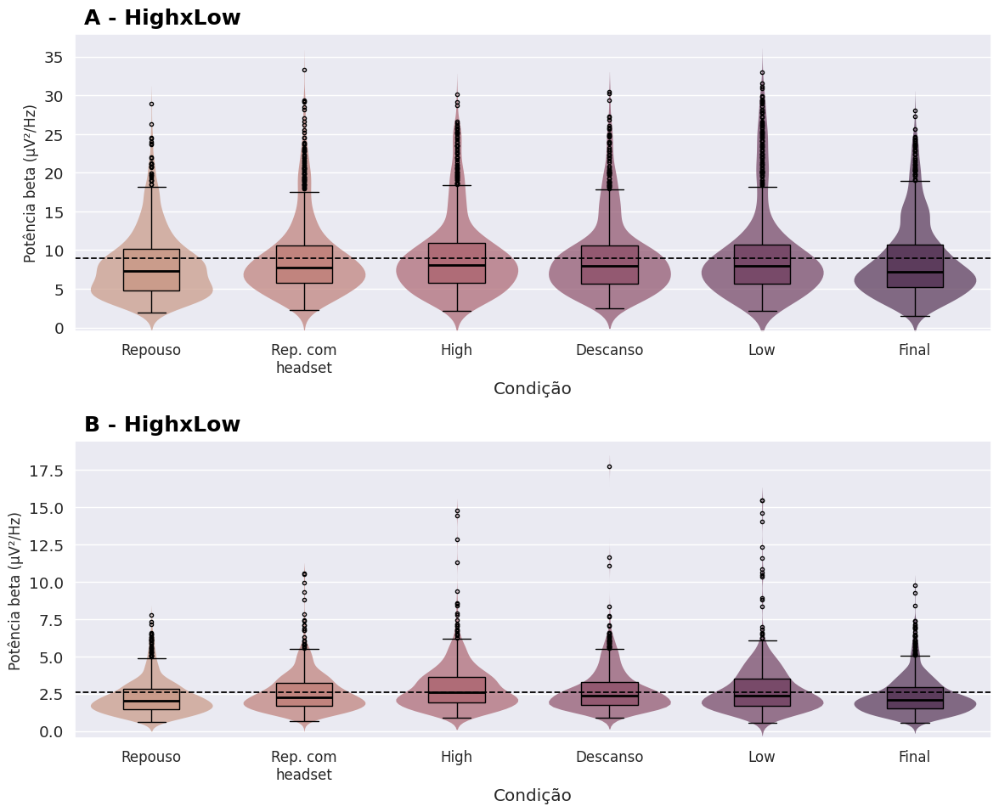

In [197]:
fig_occ_b_1h, axes_occ_b_1h = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_occ_b_1h = axes_occ_b_1h.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_b_1h = [df_beta_1h_o1_copy,df_beta_1h_o2]
titles_occ_b_1h = ['A - HighxLow','B - HighxLow']
mean_occ_b_1h = [o1o2_1h_melt_beta['beta_o1'].mean(),o1o2_1h_melt_beta['beta_o2'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset','High', 'Descanso', 'Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_b_1h)):
    data = datasets_occ_b_1h[i]
    ax = flat_axes_occ_b_1h[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_b_1h[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_occ_b_1h[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)
    ax.set_ylim(-0.5)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

/tmp/ipython-input-433112600.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
/tmp/ipython-input-433112600.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
/tmp/ipython-input-433112600.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-433112600.py:38: FutureWarning: 

Passing `palette` with

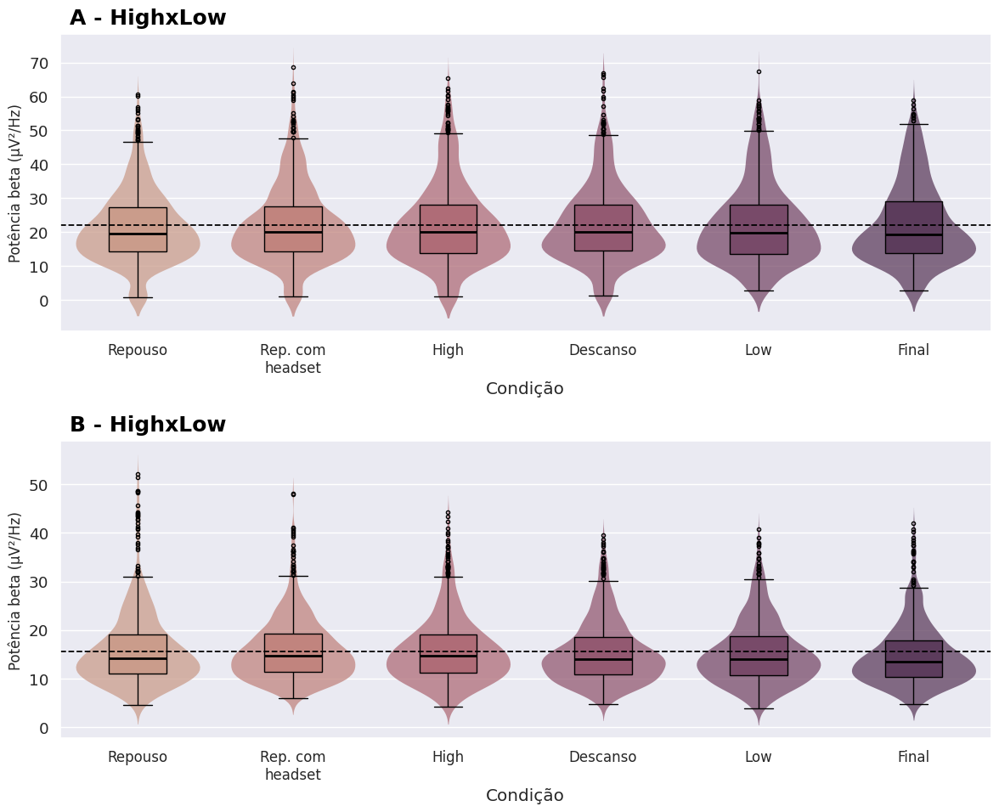

In [201]:
fig_fro_b_1h, axes_fro_b_1h = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

flat_axes_fro_b_1h = axes_fro_b_1h.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_fro_b_1h = [df_beta_1h_f3_copy,df_beta_1h_f4]
titles_fro_b_1h = ['A - HighxLow','B - HighxLow']
mean_fro_b_1h = [f3f4_1h_melt_beta['beta_f3'].mean(),f3f4_1h_melt_beta['beta_f4'].mean()]
x_labels=['Repouso', 'Rep. com\nheadset', 'High', 'Descanso', 'Low','Final']
title_styles = [
    # Estilo para o primeiro gráfico (A)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01       # Posição Y (1.0 = topo do gráfico)
    },
    # Estilo para o segundo gráfico (B)
    {
        'fontsize': 18,
        'fontweight': 'bold',
        'color': 'black',
        'loc': 'left',  # Alinha o título à esquerda
        'x': 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        'y': 1.01
    }
]
# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_fro_b_1h)):
    data = datasets_fro_b_1h[i]
    ax = flat_axes_fro_b_1h[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_fro_b_1h[i]
    style = title_styles[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data, x="Condição",y='beta', palette='flare', inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, x="Condição",y='beta',saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette='flare', boxprops={'zorder': 2}, ax=ax, fliersize=3)
    ax.axhline(y=mean_fro_b_1h[i], color='black', linestyle='--', linewidth=1.3)
    # Customizar cada subplot individualmente
    # O operador ** desempacota o dicionário 'style' em argumentos de palavra-chave
    ax.set_title(title, **style)
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.98])

# Exibe a figura final
plt.show()

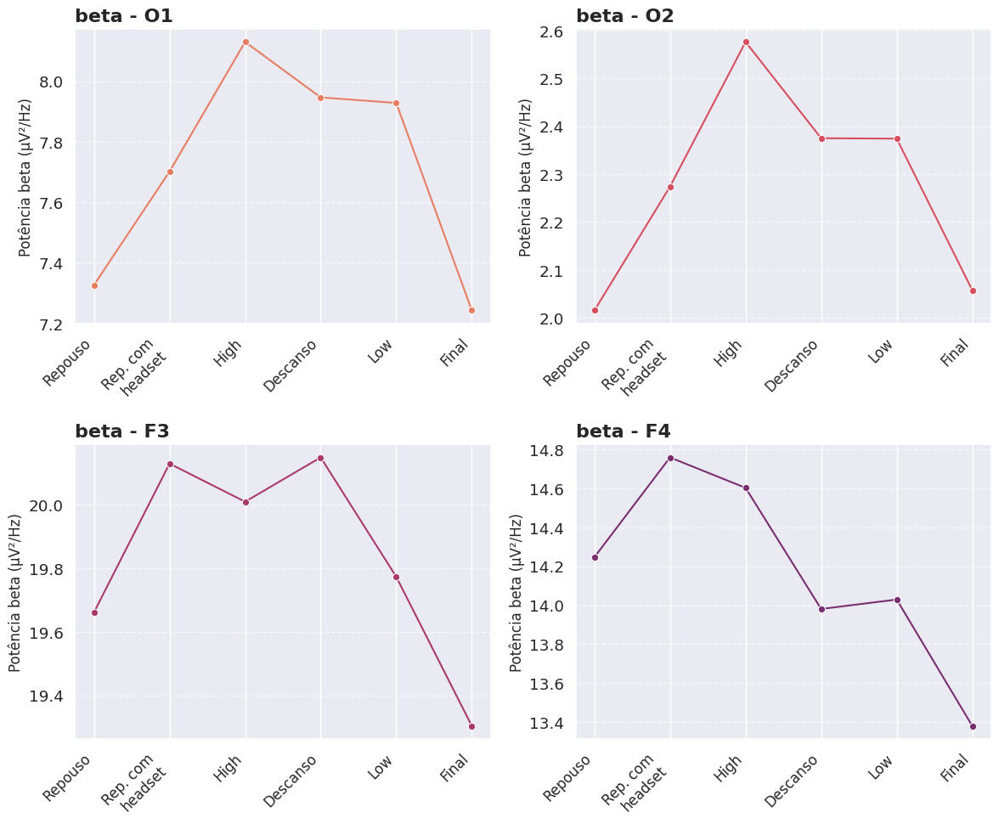

In [195]:
fig_occ_b_1h_line, axes_occ_b_1h_line = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
flat_axes_occ_b_1h_line = axes_occ_b_1h_line.flatten()


# --- 2. DADOS E METADADOS PARA O LOOP ---
datasets_occ_b_1h_line = [df_beta_1h_o1_copy,df_beta_1h_o2,df_beta_1h_f3_copy,df_beta_1h_f4]
plot_titles = ['beta - O1', 'beta - O2', 'beta - F3','beta - F4'] # Títulos mais descritivos
x_labels = ['Repouso', 'Rep. com\nheadset',  'High', 'Descanso', 'Low','Final']
flare = sns.color_palette('flare',n_colors=len(datasets_occ_b_1h_line))
# --- 3. LOOP PARA PLOTAR EM CADA SUBPLOT ---
for i, data in enumerate(datasets_occ_b_1h_line):
    ax = flat_axes_occ_b_1h_line[i] # Seleciona o eixo atual (ax[0], ax[1], ...)

    # --- INTEGRAÇÃO DO CÓDIGO INDIVIDUAL AQUI ---
    # Use 'ax=ax' para dizer ao Seaborn onde desenhar o gráfico
    sns.lineplot(
        x='Condição',
        y='beta',
        data=data,
        estimator='median', # Usa a mediana
        errorbar=None,      # Sem barra de erro
        marker='o',         # Marcador de círculo
        color=flare[i],    # Cor específica para este subplot
        ax=ax               # **O passo mais importante!**
    )
    # ---------------------------------------------

    # --- CUSTOMIZAÇÃO DO SUBPLOT ATUAL (ax) ---
    ax.set_title(plot_titles[i], fontsize=16, fontweight='bold', loc='left')
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xlabel(None) # Remove o rótulo do eixo X para não poluir

    # Define a posição e os rótulos do eixo X
    ax.set_xticks(range(len(x_labels))) # Define as posições dos ticks
    ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12)

    # Adiciona grid para melhor visualização
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Oculta os eixos que não foram usados (se houver)
for i in range(len(datasets_occ_b_1h_line), len(flat_axes_occ_b_1h_line)):
    flat_axes_occ_b_1h_line[i].set_visible(False)


# Melhora o espaçamento entre os gráficos
plt.tight_layout()


## HIGH FIRST - wilcoxon entre videos

In [ ]:
## Dividir dados por canal
df_beta_1h_o1= df_beta_1h[df_beta_1h['Canal'] == 'o1']
df_beta_1h_o2= df_beta_1h[df_beta_1h['Canal'] == 'o2']
df_beta_1h_f3= df_beta_1h[df_beta_1h['Canal'] == 'f3']
df_beta_1h_f4= df_beta_1h[df_beta_1h['Canal'] == 'f4']

In [ ]:
## Divisão por condição HxL por canal
o1low_beta_1h = df_beta_1h_o1[df_beta_1h_o1['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

o1high_beta_1h = df_beta_1h_o1[df_beta_1h_o1['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)


o2low_beta_1h = df_beta_1h_o2[df_beta_1h_o2['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

o2high_beta_1h = df_beta_1h_o2[df_beta_1h_o2['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)


f3low_beta_1h = df_beta_1h_f3[df_beta_1h_f3['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

f3high_beta_1h = df_beta_1h_f3[df_beta_1h_f3['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)


f4low_beta_1h = df_beta_1h_f4[df_beta_1h_f4['Condição'] == 'low']['beta'].drop_duplicates().reset_index(drop=True)

f4high_beta_1h = df_beta_1h_f4[df_beta_1h_f4['Condição'] == 'high']['beta'].drop_duplicates().reset_index(drop=True)



In [ ]:
o1b_1h = pd.concat([o1low_beta_1h, o1high_beta_1h],axis=1)
o2b_1h = pd.concat([o2low_beta_1h, o2high_beta_1h],axis=1)
f3b_1h = pd.concat([f3low_beta_1h, f3high_beta_1h],axis=1)
f4b_1h = pd.concat([f4low_beta_1h, f4high_beta_1h],axis=1)
o1b_1h.columns = [ 'High', 'Low']
o2b_1h.columns = [ 'High', 'Low']
f3b_1h.columns = [ 'High', 'Low']
f4b_1h.columns = [ 'High', 'Low']

In [ ]:
## Wilcoxon - comparação entre condições de vídeo
stat_beta_1h_o1, p_beta_1h_o1 = wilcoxon(o1low_beta_1h, o1high_beta_1h)
print('Comparação entre vídeos - HighXLow - beta')
print('O1-Wilcoxon Statistic:' ,stat_beta_1h_o1)
print('O1-p-value:' ,p_beta_1h_o1)
stat_beta_1h_o2, p_beta_1h_o2 = wilcoxon(o2low_beta_1h, o2high_beta_1h)
print('O2-Wilcoxon Statistic:' ,stat_beta_1h_o2)
print('O2-p-value:' ,p_beta_1h_o2)
stat_beta_1h_f3, p_beta_1h_f3 = wilcoxon(f3low_beta_1h, f3high_beta_1h)
print('F3-Wilcoxon Statistic:' ,stat_beta_1h_f3)
print('F3-p-value:' ,p_beta_1h_f3)
stat_beta_1h_f4, p_beta_1h_f4 = wilcoxon(f4low_beta_1h, f4high_beta_1h)
print('F4-Wilcoxon Statistic:' ,stat_beta_1h_f4)
print('F4-Wilcoxon Statistic:' ,p_beta_1h_f4)

Comparação entre vídeos - HighXLow - beta
O1-Wilcoxon Statistic: 185693.0
O1-p-value: 0.969073101259588
O2-Wilcoxon Statistic: 137579.0
O2-p-value: 3.6228653614634116e-11
F3-Wilcoxon Statistic: 183499.0
F3-p-value: 0.7347472936175115
F4-Wilcoxon Statistic: 158077.0
F4-Wilcoxon Statistic: 0.00013592195139868385


/tmp/ipython-input-716204620.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)
/tmp/ipython-input-716204620.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, fontsize=12)


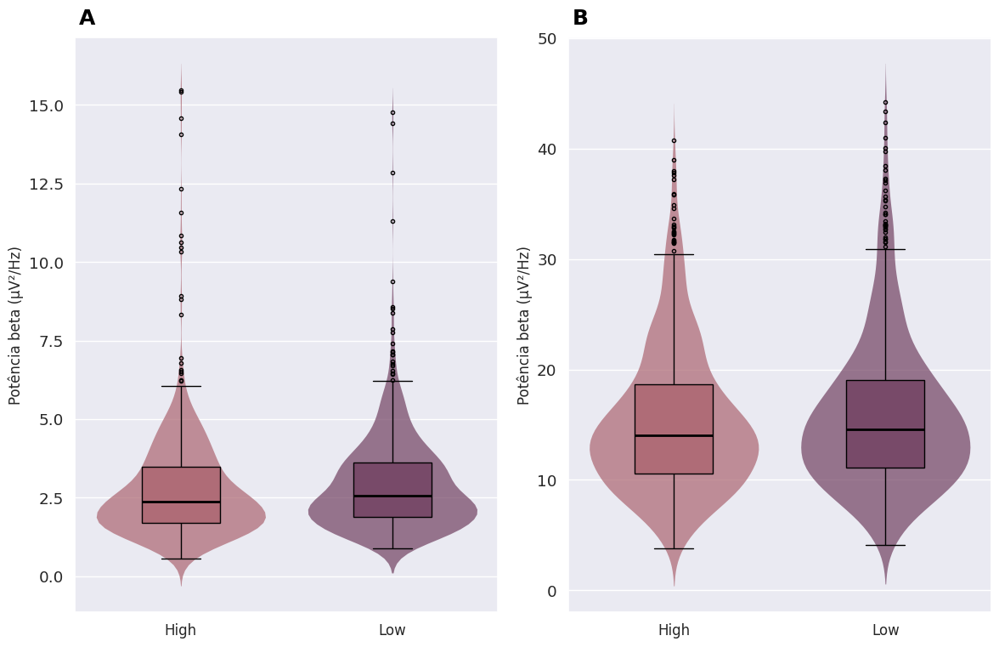

In [ ]:
fig_occ_b, axes_occ_b = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

# Para facilitar o uso no loop, "achatamos" a grade 2x2 em uma lista simples de 4 eixos
flat_axes_occ_b = axes_occ_b.flatten()
# --- 3. PREPARAÇÃO PARA O LOOP ---
# Colocamos os dados e metadados em listas para iterar sobre eles
datasets_occ_b = [o2b_1h,f4b_1h]
titles_occ_b = ['A','B']
x_labels=[ 'High','Low']

# LOOP PARA PLOTAR EM CADA SUBPLOT
for i in range(len(datasets_occ_b)):
    data = datasets_occ_b[i]
    ax = flat_axes_occ_b[i]  # Seleciona o eixo atual (ex: axes[0,0], depois axes[0,1], etc.)
    title = titles_occ_b[i]

    # Use o argumento 'ax=ax' para dizer ao seaborn onde desenhar o gráfico
    sns.violinplot(data=data,  palette=['#d14a61','#8f3371'], inner=None, linewidth=0, saturation=0.5,alpha=0.74,ax=ax)
    sns.boxplot(data=data, saturation=0.5, width=0.37,linecolor='black',linewidth=1, medianprops={'color': 'black', 'linewidth': 2},
            palette=['#d14a61','#8f3371'], boxprops={'zorder': 2}, ax=ax, fliersize=3)
    # Customizar cada subplot individualmente
    ax.set_title(title,fontsize= 18,
        fontweight= 'bold',
        color= 'black',
        loc= 'left',  # Alinha o título à esquerda
        x= 0.01,      # Posição X (0.0 = borda esquerda, 1.0 = borda direita)
        y= 1.01 )
    # Customização dos eixos (seu código original)
    ax.set_ylabel("Potência beta (μV²/Hz)", fontsize=12)
    ax.set_xticklabels(x_labels, fontsize=12)

# Adiciona um espaçamento para evitar que os títulos se sobreponham
plt.tight_layout(rect=[0, 0, 1, 0.98])


# Exibe a figura final
plt.show()

/tmp/ipython-input-2729360740.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
/tmp/ipython-input-2729360740.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
/tmp/ipython-input-2729360740.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
/tmp/ipython-input-2729360740.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to 

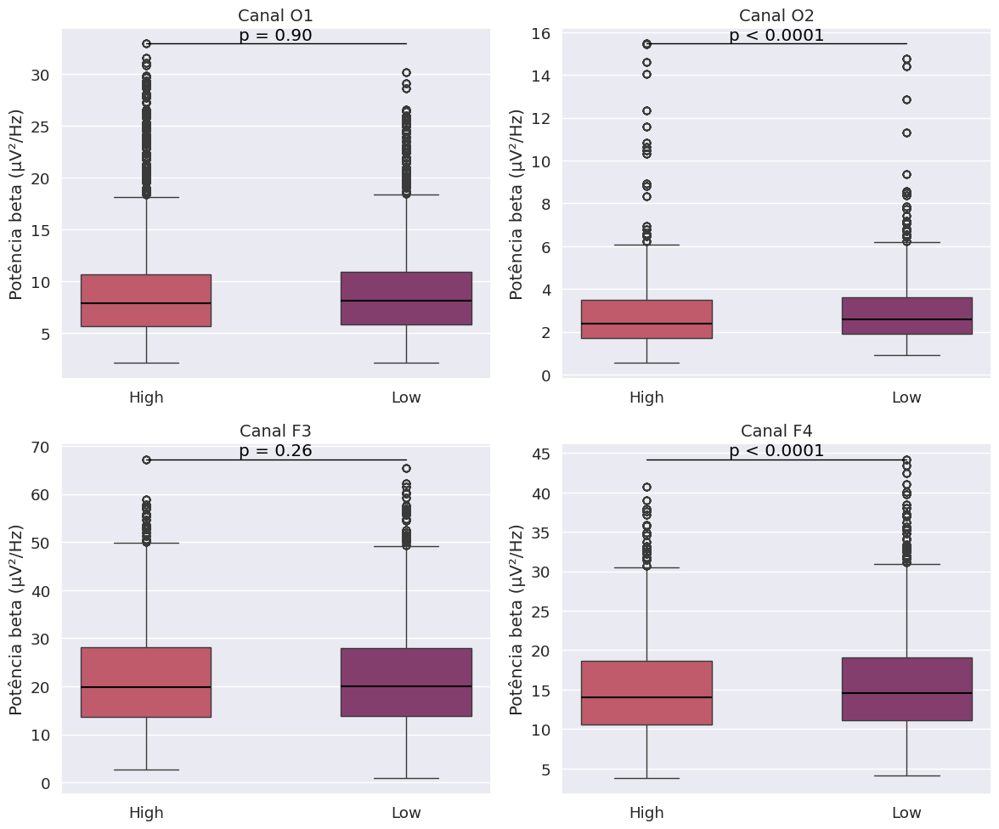

In [ ]:

# Armazene os p-valores em um dicionário para fácil acesso
p_valores = {
    'O1': p_beta_1h_o1,
    'O2': p_beta_1h_o2,
    'F3': p_beta_1h_f3,
    'F4': p_beta_1h_f4
}

# --- 2. PREPARAÇÃO DOS DADOS (O PASSO MAIS IMPORTANTE) ---
# Crie um ÚNICO DataFrame com todos os dados. Isso simplifica tudo.
lista_de_dados = []
for eletrodo, dados_high, dados_low in [('O1',  o1low_beta_1h, o1high_beta_1h),
                                        ('O2', o2low_beta_1h,o2high_beta_1h ),
                                        ('F3', f3low_beta_1h, f3high_beta_1h),
                                        ('F4', f4low_beta_1h,f4high_beta_1h)]:
    # Adiciona os dados 'High'
    for valor in dados_high:
        lista_de_dados.append({'Eletrodo': eletrodo, 'Condição': 'High', 'Valor': valor})
    # Adiciona os dados 'Low'
    for valor in dados_low:
        lista_de_dados.append({'Eletrodo': eletrodo, 'Condição': 'Low', 'Valor': valor})

df_completo = pd.DataFrame(lista_de_dados)

# --- 3. FUNÇÃO PARA FORMATAR O P-VALOR (Sua função) ---
def format_p_value(p):
    if p < 0.0001:
        return "p < 0.0001" # Corrigido para corresponder à prática comum
    elif p < 0.001:
        return f"p = {p:.4f}"
    elif p < 0.01:
        return f"p = {p:.3f}"
    else:
        return f"p = {p:.2f}"

# --- 4. CRIAÇÃO DA GRADE DE GRÁFICOS (CÓDIGO FINAL) ---
# Nomes dos eletrodos na ordem que você quer plotar
eletrodos_a_plotar = ['O1', 'O2', 'F3', 'F4']
cores_paleta = [ '#d14a61','#8f3371'] # High, Low

# Cria a grade de subplots 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Itera sobre cada subplot (ax) e cada nome de eletrodo
for ax, eletrodo in zip(axes.flatten(), eletrodos_a_plotar):
    # a. Filtra o DataFrame principal para pegar dados apenas do eletrodo atual
    df_eletrodo = df_completo[df_completo['Eletrodo'] == eletrodo]

    # b. Plota o boxplot no subplot 'ax' atual
    sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
                order=['High','Low'],  # Garante a ordem correta
                palette=cores_paleta,
                width=0.5,
                medianprops={'linewidth': 1.5, 'color': 'black'},
                ax=ax)

    # c. Adiciona a anotação do p-valor (lógica do seu primeiro script)
    p_valor = p_valores[eletrodo]
    y_max = df_eletrodo['Valor'].max()
    bar_height = y_max


    # IMPORTANTE: Use 'ax.plot' e 'ax.text' para desenhar no subplot correto
    ax.plot( [bar_height, bar_height], lw=1, c='black')
    ax.text(0.5, bar_height, format_p_value(p_valor), ha='center', va='bottom', color='black')

    # d. Formata os títulos e eixos de cada subplot
    ax.set_title(f'Canal {eletrodo}', fontsize=14)
    ax.set_ylabel('Potência beta (µV²/Hz)')
    ax.set_xlabel(None) # Remove o label x individual para um visual mais limpo

# Ajusta o layout para evitar sobreposição e exibe o gráfico
plt.tight_layout()
plt.show()


/tmp/ipython-input-3141052793.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
/tmp/ipython-input-3141052793.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,


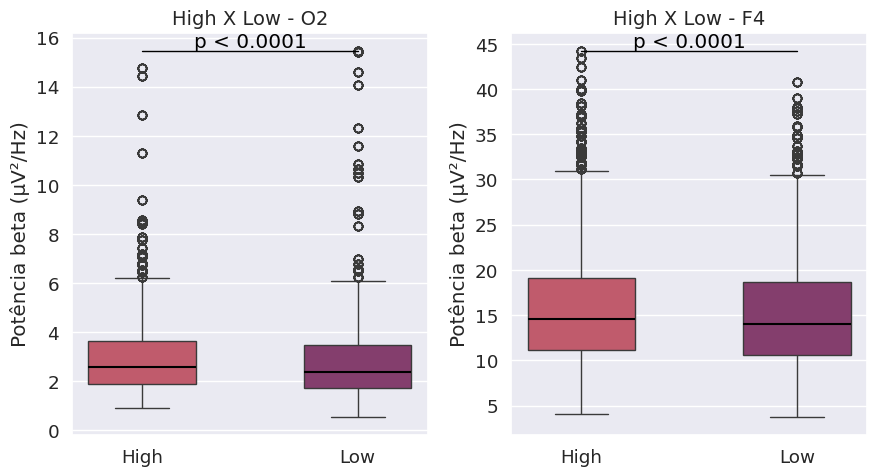

In [ ]:

# Armazene os p-valores em um dicionário para fácil acesso
p_valores = {
    'O2': p_beta_1h_o2,
    'F4': p_beta_1h_f4
}

# --- 2. PREPARAÇÃO DOS DADOS (O PASSO MAIS IMPORTANTE) ---
# Crie um ÚNICO DataFrame com todos os dados. Isso simplifica tudo.
lista_de_dados = []
for eletrodo, dados_high, dados_low in [('O2', o2high_beta_1h, o2low_beta_1h),
                                        ('F4', f4high_beta_1h, f4low_beta_1h)]:
    # Adiciona os dados 'High'
    for valor in dados_high:
        lista_de_dados.append({'Eletrodo': eletrodo, 'Condição': 'High', 'Valor': valor})
    # Adiciona os dados 'Low'
    for valor in dados_low:
        lista_de_dados.append({'Eletrodo': eletrodo, 'Condição': 'Low', 'Valor': valor})

df_completo = pd.DataFrame(lista_de_dados)

# --- 3. FUNÇÃO PARA FORMATAR O P-VALOR (Sua função) ---
def format_p_value(p):
    if p < 0.0001:
        return "p < 0.0001" # Corrigido para corresponder à prática comum
    elif p < 0.001:
        return f"p = {p:.4f}"
    elif p < 0.01:
        return f"p = {p:.3f}"
    else:
        return f"p = {p:.2f}"

# --- 4. CRIAÇÃO DA GRADE DE GRÁFICOS (CÓDIGO FINAL) ---
# Nomes dos eletrodos na ordem que você quer plotar
eletrodos_a_plotar = ['O2', 'F4']
cores_paleta = ['#d14a61', '#8f3371'] # High, Low

# Cria a grade de subplots 2x2
fig, axes = plt.subplots(1, 2, figsize=(9,5))

# Itera sobre cada subplot (ax) e cada nome de eletrodo
for ax, eletrodo in zip(axes.flatten(), eletrodos_a_plotar):
    # a. Filtra o DataFrame principal para pegar dados apenas do eletrodo atual
    df_eletrodo = df_completo[df_completo['Eletrodo'] == eletrodo]

    # b. Plota o boxplot no subplot 'ax' atual
    sns.boxplot(x='Condição', y='Valor', data=df_eletrodo,
                order=['High', 'Low'],  # Garante a ordem correta
                palette=cores_paleta,
                width=0.5,
                medianprops={'linewidth': 1.5, 'color': 'black'},
                ax=ax)

    # c. Adiciona a anotação do p-valor (lógica do seu primeiro script)
    p_valor = p_valores[eletrodo]
    y_max = df_eletrodo['Valor'].max()
    bar_height = y_max


    # IMPORTANTE: Use 'ax.plot' e 'ax.text' para desenhar no subplot correto
    ax.plot( [bar_height, bar_height], lw=1, c='black')
    ax.text(0.5, bar_height, format_p_value(p_valor), ha='center', va='bottom', color='black')

    # d. Formata os títulos e eixos de cada subplot
    ax.set_title(f'High X Low - {eletrodo}', fontsize=14)
    ax.set_ylabel('Potência beta (µV²/Hz)')
    ax.set_xlabel(None) # Remove o label x individual para um visual mais limpo

# Ajusta o layout para evitar sobreposição e exibe o gráfico
plt.tight_layout()
plt.show()
